# pre-processing and cleaning

## Imports

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
#from sklearn.metrics import confusion_matrix #bugged because confusion_matrix([1,1],[1,1]) = [[2]], not [[2,0],[0,0]]. Also confusion_matrix([0,0],[0,0]) = [[2]]
from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import KFold
import random as rd
from sklearn.decomposition import PCA
from sklearn import preprocessing
import copy
from sklearn import tree as sktree
from sklearn.metrics import accuracy_score
from scipy.optimize import curve_fit
from scipy.stats import norm
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import r2_score
from scipy.stats import rankdata
import warnings

def confusion_matrix(y_true,y_predicted):
  true_positives = np.sum([i*j for i,j in zip(y_true,y_predicted)])
  false_negatives = np.sum([int((i==1)&(j==0)) for i,j in zip(y_true,y_predicted)])
  true_negatives = np.sum([(1-i)*(1-j) for i,j in zip(y_true,y_predicted)])
  false_positives = np.sum([int((i==0)&(j==1)) for i,j in zip(y_true,y_predicted)])
  return [[true_positives,false_positives],[false_negatives,true_negatives]]

def sensitivity_score(y_true,y_predicted):
  assert(len(y_true)==len(y_predicted))
  for i in y_true:
    assert((i == 1) | (i == 0))
  for i in y_predicted:
    assert((i == 1) | (i == 0))
  true_positives = np.sum([i*j for i,j in zip(y_true,y_predicted)])
  false_negatives = np.sum([int((i==1)&(j==0)) for i,j in zip(y_true,y_predicted)])
  return true_positives/(true_positives+false_negatives)

def specificity_score(y_true,y_predicted):
  assert(len(y_true)==len(y_predicted))
  for i in y_true:
    assert((i == 1) | (i == 0))
  for i in y_predicted:
    assert((i == 1) | (i == 0))
  true_negatives = np.sum([(1-i)*(1-j) for i,j in zip(y_true,y_predicted)])
  false_positives = np.sum([int((i==0)&(j==1)) for i,j in zip(y_true,y_predicted)])
  return true_negatives/(true_negatives+false_positives)

def r2_variance(y_true,y_predicted):
  assert(len(y_true)==len(y_predicted))
  for i in y_true:
    assert((i == 1) | (i == 0))
  return [(i-j)**2 for i,j in zip(y_true,y_predicted)]

plt.rcParams['figure.figsize'] = [16,8]

## Plots

In [3]:
def confidence_plot(y,y_low=-0.2,y_high = 1.2, y_step = 0.07, edge = 0.5, flip = True,**models):
  warnings.filterwarnings('ignore')
  for j,model in models.items():
    temp = [np.average(y[(model > i) & (model < i + y_step)]) for i in np.arange(y_low,y_high,y_step)]
    if flip:
      for k in range(len(np.arange(y_low,y_high,y_step))):
        if round(y_low + (k+1/2)*y_step,1) <= edge:
          temp[k] = 1-temp[k]
    fig1 = plt.figure(figsize=(24,8))

    plt.errorbar([np.str(round(i,2)) + "-" + np.str(round(i+y_step,2)) for i in np.arange(y_low,y_high,y_step)],temp,yerr = [1/np.sqrt(model[(model > i) & (model < i + y_step)].count()) for i in np.arange(y_low,y_high,y_step)],label=i)
    plt.ylim([0,1])

  if flip:
    plt.title(f'Confidence in result versus y_predicted value, edge = {edge}')
  else:
    plt.title(f'Average of y versus y_predicted value, edge = {edge}')
  plt.legend()
  plt.show()
  warnings.resetwarnings()

def population_y_predicted(y_low=-0.2,y_high = 1.2, y_step = 0.07,**models):
  warnings.filterwarnings('ignore')
  for i,model in models.items():
    print(i)
    temp = [model[(model > i) & (model < i + y_step)].count() for i in np.arange(y_low,y_high,y_step)]
    plt.figure(figsize=(24,8))
    plt.bar([np.str(round(i,2)) + "-" + np.str(round(i+y_step,2)) for i in np.arange(y_low,y_high,y_step)],temp,label=i)
    plt.legend()
    plt.show()
  warnings.resetwarnings()

def delta_accuracy(model1,model2,step = 0.01,ymin=0.0,ymax=1.0):
  accuracy_deltas = []
  accuracy_deltas_err = []
  for i in np.arange(ymin,ymax + step,step):
    _,_,numbers = loading_scores(model1,y,pad=False,edge=i,b_compare=model2,show=False)
    accuracy_delta = numbers["Delta_Accuracy"]
    accuracy_delta_err = numbers["Delta_Accuracy_Error"]
    accuracy_deltas.append(accuracy_delta)
    accuracy_deltas_err.append(accuracy_delta_err)
  fig = plt.figure()
  x_range = [i for i in np.arange(ymin,ymax+step,step)]
  plt.errorbar(x_range,accuracy_deltas,yerr=accuracy_deltas_err)
  plt.title(f"Accuracy difference vs Edge, first_model_accuracy - second_model_accuracy") 
  plt.plot(x_range,0*np.ones_like(x_range))
  plt.show()
  plt.close()

def delta_sensitivity(model1,model2,step = 0.01,ymin=0.1,ymax=0.5):
  sensitivity_deltas = []
  sensitivity_deltas_err = []
  for i in np.arange(ymin,ymax + step,step):
    _,_,numbers = loading_scores(model1,y,pad=False,edge=i,b_compare=model2,show=False)
    sensitivity_delta = numbers['Delta_Sensitivity']
    sensitivity_delta_err = numbers['Delta_Sensitivity_Error']
    sensitivity_deltas.append(sensitivity_delta)
    sensitivity_deltas_err.append(sensitivity_delta_err)
  fig = plt.figure()
  x_range = [i for i in np.arange(ymin,ymax+step,step)]
  plt.errorbar(x_range,sensitivity_deltas,yerr=sensitivity_deltas_err)
  plt.title(f"Sensitivity difference vs Edge, first_model_sensitivity - second_model_sensitivity") 
  plt.plot(x_range,0*np.ones_like(x_range))
  plt.show()
  plt.close()
  return sensitivity_deltas,sensitivity_deltas_err

def delta_specificity(model1,model2,step = 0.01,ymin=0.1,ymax=0.5):
  specificity_deltas = []
  specificity_deltas_err = []
  for i in np.arange(ymin,ymax + step,step):
    _,_,numbers = loading_scores(model1,y,pad=False,edge=i,b_compare=model2,show=False)
    specificity_delta = numbers['Delta_Specificity']
    specificity_delta_err = numbers['Delta_Specificity_Error']
    specificity_deltas.append(specificity_delta)
    specificity_deltas_err.append(specificity_delta_err)
  fig = plt.figure()
  x_range = [i for i in np.arange(ymin,ymax+step,step)]
  plt.errorbar(x_range,specificity_deltas,yerr=specificity_deltas_err)
  plt.title(f"Specificity difference vs Edge, first_model_specificity - second_model_specificity") 
  plt.plot(x_range,0*np.ones_like(x_range))
  plt.show()
  plt.close()
  return specificity_deltas,specificity_deltas_err

def sensitivity_specificity_edge(model,step = 0.01,ymin=0.0,ymax=1.0,show=False):
  sensitivitys_specificitys = []
  for i in np.arange(ymin,ymax + step,step):
    _,_,numbers = loading_scores(model,y,pad=False,edge=i,show=False)
    sensitivity = numbers["Sensitivity"]
    specificity = numbers["Specificity"]
    sensitivitys_specificitys.append([sensitivity,specificity,i])
  return sensitivitys_specificitys

def sensitivity_accuracy(step = 0.0025,ymin=0.1,ymax=0.5,sensitivity_range=[0.75,0.95],accuracy_range=[0.70,0.90],xerr=False,yerr=False,**models):
  fig = plt.figure()
  all_sensitivitys = {}
  all_sensitivitys_err = {}
  all_accuracies = {}
  all_accuracies_err = {}
  all_edges = {}
  for i,model in models.items():
    edges = []
    sensitivitys = []
    sensitivitys_err = []
    accuracies = []
    accuracies_err = []
    for edge in np.arange(ymin,ymax + step,step):
      _,_,numbers = loading_scores(model,y,pad=False,edge=edge,show=False)
      accuracy = numbers["Accuracy"]
      accuracy_err = numbers["Accuracy_Error"]
      sensitivity = numbers["Sensitivity"]
      sensitivity_err = numbers["Sensitivity_Error"]
      accuracies.append(accuracy)
      accuracies_err.append(accuracy_err)
      sensitivitys.append(sensitivity)
      sensitivitys_err.append(sensitivity_err)
      edges.append(edge)
    all_sensitivitys[i] = sensitivitys
    all_sensitivitys_err[i] = sensitivitys_err
    all_accuracies[i] = accuracies
    all_accuracies_err[i] = accuracies_err
    all_edges[i] = edges
    plt.plot(sensitivitys,accuracies,label = i)
  plt.title(f"Accuracy vs Sensitivity")
  plt.xlim(sensitivity_range)
  plt.ylim(accuracy_range)
  plt.xlabel("Sensitivity")
  plt.ylabel("Accuracy")
  plt.legend()
  plt.show()
  plt.close()
  return all_sensitivitys,all_accuracies,all_edges

def sensitivity_delta_accuracy(model1,model2,step = 0.0025,ymin=0.2,ymax=0.5,sensitivity_range=[0.75,0.95],accuracy_delta_range=[-0.05,0.05],xerr=False,yerr=False):
  sensitivitys1 = sensitivity_specificity_edge(model1,step=step,ymin=ymin,ymax=ymax)
  sensitivitys2 = sensitivity_specificity_edge(model2,step=step,ymin=ymin,ymax=ymax)
  sensitivitys = []
  sensitivitys_err = []
  accuracy_deltas = []
  accuracy_deltas_err = []
  for i in np.arange(ymin,ymax + step,step):
    epsilon = 1.0
    for sensitivity1,_,edge1 in sensitivitys1:
      if np.abs(edge1 - i) < epsilon:
        closest_sensitivity1 = sensitivity1
        epsilon = np.abs(edge1 - i)
    epsilon = 1.0
    for sensitivity2,edge2 in sensitivitys2:
      if np.abs(sensitivity2 - closest_sensitivity1) < epsilon:
        closest_edge = edge2
        epsilon = np.abs(sensitivity2 - closest_sensitivity1)
    edge2 = closest_edge
    _,_,numbers = loading_scores(model1,y,pad=False,edge=i,b_compare=model2,show=False,edge2=edge2)
    sensitivity = numbers["Sensitivity"]
    sensitivity_err = numbers["Sensitivity_Error"]
    accuracy_delta = numbers["Delta_Accuracy"]
    accuracy_delta_err = numbers["Delta_Accuracy_Error"]
    accuracy_deltas.append(accuracy_delta)
    accuracy_deltas_err.append(accuracy_delta_err)
    sensitivitys.append(sensitivity)
    sensitivitys_err.append(sensitivity_err)
  fig = plt.figure()
  if xerr:
    if yerr:
      plt.errorbar(sensitivitys,accuracy_deltas,xerr = sensitivitys_err,yerr=accuracy_deltas_err)
    else:
      plt.errorbar(sensitivitys,accuracy_deltas,xerr = sensitivitys_err)
  else:
    if yerr:
      plt.errorbar(sensitivitys,accuracy_deltas,yerr=accuracy_deltas_err)
    else:
      plt.errorbar(sensitivitys,accuracy_deltas)
  plt.title(f"Accuracy difference vs Sensitivity, first_model_accuracy - second_model_accuracy") 
  plt.plot(sensitivitys,0*np.ones_like(sensitivitys))
  plt.xlim(sensitivity_range)
  plt.ylim(accuracy_delta_range)
  plt.show()
  plt.close()
  return sensitivitys,sensitivitys_err,accuracy_deltas,accuracy_deltas_err

def delta_r2(model1,model2):
  _,_,numbers = loading_scores(model1,y,pad=False,b_compare=model2,show=False)
  r2_delta = numbers[8]
  r2_delta_err = numbers[9]
  return f"R^2 of model 1 - R^2 of model 2 = {r2_delta}+-{r2_delta_err}"

def ROC(step = 0.0025,ymin=0.1,ymax=0.5,**models):
  fig = plt.figure()
  all_sensitivitys = {}
  all_sensitivitys_err = {}
  all_specificitys = {}
  all_specificitys_err = {}
  all_edges = {}
  for i,model in models.items():
    edges = []
    sensitivitys = []
    sensitivitys_err = []
    specificitys = []
    specificitys_err = []
    for edge in np.arange(ymin,ymax + step,step):
      _,_,numbers = loading_scores(model,y,pad=False,edge=edge,show=False)
      specificity = numbers["Specificity"]
      specificity_err = numbers["Specificity_Error"]
      sensitivity = numbers["Sensitivity"]
      sensitivity_err = numbers["Sensitivity_Error"]
      specificitys.append(specificity)
      specificitys_err.append(specificity_err)
      sensitivitys.append(sensitivity)
      sensitivitys_err.append(sensitivity_err)
      edges.append(edge)
    all_sensitivitys[i] = sensitivitys
    all_sensitivitys_err[i] = sensitivitys_err
    all_specificitys[i] = specificitys
    all_specificitys_err[i] = specificitys_err
    all_edges[i] = edges
    plt.plot(sensitivitys,specificitys,label = i)
  plt.title(f"Specificity vs Sensitivity")
  plt.xlim(sensitivity_range)
  plt.ylim(specificity_range)
  plt.xlabel("Sensitivity")
  plt.ylabel("Specificitys")
  plt.legend()
  plt.show()
  plt.close()
  return all_sensitivitys,all_specificitys,all_edges

def radial_delta_accuracy(model1,model2,step = 0.0025, ymin=0.2,ymax=0.5,yerr=True,sensitivitys_specificitys1=None,sensitivitys_specificitys2=None,adjust_p_values = False,moving_average=True):
  if sensitivitys_specificitys1 is None:
    sensitivitys_specificitys1 = sensitivity_specificity_edge(model1,step=step,ymin=ymin,ymax=ymax)
  if sensitivitys_specificitys2 is None:
    sensitivitys_specificitys2 = sensitivity_specificity_edge(model2,step=step,ymin=ymin,ymax=ymax)

  edges1 = []
  edges2 = []
  rs = []
  rs_err = []
  angles = []
  for i in np.arange(ymin,ymax + step,step):
    epsilon = 1.0
    for sensitivity1,specificity1,edge1 in sensitivitys_specificitys1:
      if np.abs(edge1 - i) < epsilon:
        closest_sensitivity1 = sensitivity1
        closest_specificity1 = specificity1
        epsilon = np.abs(edge1 - i)
        found_edge1 = edge1
    edges1.append(found_edge1)
    epsilon = 1.0
    for sensitivity2,specificity2,edge2 in sensitivitys_specificitys2:
      if np.sqrt((sensitivity2 - closest_sensitivity1)**2 + (specificity2 - closest_specificity1)**2) < epsilon: #if the sensitivity and specificity have 'equal error bars', then we just find the closest one
        closest_edge = edge2
        epsilon = np.sqrt((sensitivity2 - closest_sensitivity1)**2 + (specificity2 - closest_specificity1)**2)
    edge2 = closest_edge
    edges2.append(edge2)
    _,_,numbers = loading_scores(model1,y,pad=False,edge=i,b_compare=model2,show=False,edge2=edge2)
    delta_sensitivity = numbers["Delta_Sensitivity"]
    delta_sensitivity_err = numbers["Delta_Sensitivity_Error"]
    delta_specificity = numbers["Delta_Specificity"]
    delta_specificity_err = numbers["Delta_Specificity_Error"]
    r = np.sqrt(delta_sensitivity**2 + delta_specificity**2)
    df_1 = delta_sensitivity/r
    df_2 = delta_specificity/r
    r_err = np.sqrt(df_1**2*delta_sensitivity_err**2 + df_2**2*delta_specificity_err**2)
    rs.append(r)
    rs_err.append(r_err)
    angles.append(180.0/np.pi*2.0*np.arctan(delta_specificity/(delta_sensitivity+r))) #this goes from -180 to 180
  if moving_average:
    rs_moving = []

    for i in range(len(rs)-4):
      rs[i] = (rs[i] + rs[i+1] + rs[i+2] + rs[i+3] + rs[i+4])/5
      rs_err[i] = (rs_err[i] + rs_err[i+1] + rs_err[i+2] + rs_err[i+3] + rs_err[i+4])/5
    rs = rs[:-4]
    rs_err = rs_err[:-4]
    edges1 = edges1[2:-2]
    edges2 = edges2[2:-2]
    angles = angles[2:-2]
  if adjust_p_values:
    rs_err = adjusted_p_values(edges1,rs,rs_err)
  fig = plt.figure()
  if yerr:
    plt.errorbar(edges1,rs,yerr=rs_err)
  else:
    plt.errorbar(edges1,rs)
  plt.title(f"Radial Error vs Edge1, first_model - second_model") 
  plt.xlabel("Edge1")
  plt.ylabel("Radial Error")
  plt.grid()
  fig2 = plt.figure()
  plt.plot(edges1,angles)
  plt.title(f"Direction from first model to closest point on second model") 
  plt.xlabel("Edge1")
  plt.ylabel("Angle(-180 to 180 degrees)")  
  plt.grid()
  plt.show()
  if not adjust_p_values:
    z_scores = [i/j for i,j in zip(rs,rs_err)]
    plt.plot(edges1,z_scores)
    plt.title(f"Z-scores") 
    plt.xlabel("Edge1")
    plt.ylabel("Z-scores")
    plt.grid()
    plt.show()
  plt.close()
  return edges1,edges2,rs,rs_err,angles,sensitivitys_specificitys1,sensitivitys_specificitys2

def fdr(p_vals):
  ranked_p_values = rankdata(p_vals)
  fdr = p_vals * len(p_vals) / ranked_p_values
  for i in range(len(fdr)-1):
    if fdr[i]>fdr[i+1]:
      fdr[i]=fdr[i+1]
  fdr[fdr > 1] = 1
  return fdr

def adjusted_p_values(edges1,rs,rs_err,show=True):
  for i in rs:
    if i == 0: rs = 0.005
  z_scores = [i/j for i,j in zip(rs,rs_err)]
  p_values = norm.sf(z_scores)*2 #twoside
  adjusted_p_values = fdr(p_values)
  adjusted_z_scores = norm.ppf(1-adjusted_p_values/2)
  adjusted_rs_err =  [i/j for i,j in zip(rs,adjusted_z_scores)]
  if show:
    plt.plot(edges1,adjusted_z_scores)
    plt.title(f"Adjusted z-scores") 
    plt.xlabel("Edge1")
    plt.ylabel("Adjusted z-scores")
    plt.grid()
    plt.show()
  return adjusted_rs_err



In [4]:
abc= [1,2,3,4,5,6,7,8,9]
abc = abc[2:-2]
abc

[3, 4, 5, 6, 7]

## Estimators and Cross-correlation

In [5]:
def sigmoid(x):
  return 1/(1+np.exp(-x))

def estimator_SVD(A_train,A_test,b_train,b_test,r = 0,q=0,p=0,edge=0.5): #q,p are not used
  if len(A_train.shape) == 1:
    b_predicted_test = A_test
    b_predicted_test_2 = [int(row > edge) for row in b_predicted_test]
    b_predicted_train = A_train
    b_predicted_train_2 = [int(row > edge) for row in b_predicted_train]
    x_fit = 1
    S = 1
  else:
    U,S,VT = np.linalg.svd(A_train,full_matrices=False)
    if r != 0:
      U = U[:,:r+1]
      S = S[:r+1]
      VT = VT[:r+1,:]
    S = np.diag(S)
    A_train_inv = VT.T @ np.linalg.inv(S) @ U.T
    x_fit = A_train_inv @ b_train
    b_predicted_test = A_test @ x_fit
    b_predicted_test_2 = [int(row > edge) for row in b_predicted_test]
    b_predicted_train = A_train @ x_fit
    b_predicted_train_2 = [int(row > edge) for row in b_predicted_train]
  test_accuracy = accuracy_score(b_test,b_predicted_test_2)
  train_accuracy = accuracy_score(b_train,b_predicted_train_2)
  #test_r2 = r2_score(b_test,b_predicted_test)
  test_r2_variance = r2_variance(b_test,b_predicted_test)
  train_r2_variance = r2_variance(b_test,b_predicted_test)
  train_r2 = r2_score(b_train,b_predicted_train)
  test_sensitivity = sensitivity_score(b_test,b_predicted_test_2)
  train_sensitivity = sensitivity_score(b_train,b_predicted_train_2)
  test_specificity = specificity_score(b_test,b_predicted_test_2)
  train_specificity = specificity_score(b_train,b_predicted_train_2) 
  if np.isnan(test_sensitivity):
    test_sensitivity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_sensitivity):
    train_sensitivity = 0
  if np.isnan(test_specificity):
    test_specificity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_specificity):
    train_specificity = 0
  confusion = confusion_matrix(b_test,b_predicted_test_2)
  result = {}
  result['test_accuracy'] = test_accuracy
  result['train_accuracy'] = train_accuracy
  result['x_fit'] = x_fit
  #result['test_r^2'] = test_r2
  result['test_r2_variance'] = test_r2_variance
  result['train_r2_variance'] = train_r2_variance
  result['train_r^2'] = train_r2
  result['test_sensitivity'] = test_sensitivity
  result['train_sensitivity'] = train_sensitivity
  result['b_predicted_test_2'] = b_predicted_test_2
  result['S'] = S
  result['confusion'] = confusion
  result['test_specificity'] = test_specificity
  result['train_specificity'] = train_specificity
  return result

def logistic_estimator(A_train,A_test,b_train,b_test,r = 0,q=0,p=0,edge=0.5):
  model = LogisticRegression(max_iter = 1000,fit_intercept=True,solver='liblinear')
  model.fit(A_train,b_train)
  b_predicted_test = model.predict_proba(A_test)[:, 1] # these are float
  b_predicted_train = model.predict_proba(A_train)[:, 1]
  b_predicted_test_2 = np.array([np.float(i > edge) for i in b_predicted_test]) # these are 0 or 1
  b_predicted_train_2 = np.array([np.float(i > edge) for i in b_predicted_train]) # these are 0 or 1
  test_accuracy = accuracy_score(b_test,b_predicted_test_2)
  train_accuracy = accuracy_score(b_train,b_predicted_train_2)
  test_sensitivity = sensitivity_score(b_test,b_predicted_test_2)
  train_sensitivity = sensitivity_score(b_train,b_predicted_train_2)
  test_specificity = specificity_score(b_test,b_predicted_test_2)
  train_specificity = specificity_score(b_train,b_predicted_train_2) 
  if np.isnan(test_sensitivity):
    test_sensitivity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_sensitivity):
    train_sensitivity = 0
  if np.isnan(test_specificity):
    test_specificity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_specificity):
    train_specificity = 0
  x_fit = np.append(model.coef_[0],model.intercept_[0])
  test_r2_variance = r2_variance(b_test,b_predicted_test)
  #test_r2 = r2_score(b_test,b_predicted_test) this one only has 4 people in it and is no use
  train_r2 = r2_score(b_train,b_predicted_train)
  confusion = confusion_matrix(b_test,b_predicted_test_2)
  result = {}
  result['test_accuracy'] = test_accuracy
  result['train_accuracy'] = train_accuracy
  result['x_fit'] = x_fit
  #result['test_r^2'] = test_r2
  result['test_r2_variance'] = test_r2_variance
  result['train_r^2'] = train_r2
  result['test_sensitivity'] = test_sensitivity
  result['train_sensitivity'] = train_sensitivity
  result['b_predicted_test_2'] = b_predicted_test_2
  result['confusion'] = confusion
  result['test_specificity'] = test_specificity
  result['train_specificity'] = train_specificity
  return result

def cross_correlate(X,y, pad, estimator = estimator_SVD, r = 0,nr_folds = 10, p = 0, q = 0,edge = 0.5,b_compare = None,edge2=None):
  # be careful the default estimator is 'baked in'. If you change it, you have to 'restart the runtime'. It won't 'rebake'.
  # or something else is happening, I don't know.
  if estimator == logistic_estimator:
    pad = False # it pads automatically, you can't turn it off
  if edge2 is None:
    edge2 = edge
#non-parallel
  result = {}
  if b_compare is not None:
    result['delta_accuracy'] = []
    result['delta_r^2'] = []
    result['delta_sensitivitys'] = []   
    result['delta_specificitys'] = []  
  result['test_accuracy'] = []
  result['train_accuracy'] = []
  result['x_fit'] = []
  result['test_r2_variance'] = []
  result['train_r^2'] = []
  result['test_sensitivity'] = []
  result['train_sensitivity'] = []
  result['sensitivity_sample'] = []
  result['specificity_sample'] = []
  result['confusion'] = []
  result['test_specificity'] = []
  result['train_specificity'] = []
  if estimator == estimator_SVD:
    result['S'] = []
  if nr_folds == 1:
    assert False
    A_train, A_test, b_train, b_test = train_test_split(X,y)
    if pad:
      if len(A_train.shape) == 1:
        A_train = pd.DataFrame(A_train)
        list_of_ones = pd.Series(np.ones_like(b_train),name='pad',index=A_train.index)
        A_train = A_train.join(list_of_ones)
        A_train = A_train.values
        A_test = pd.DataFrame(A_test)
        list_of_ones = pd.Series(np.ones_like(b_test),name='pad',index=A_test.index)
        A_test = A_test.join(list_of_ones)
        A_test = A_test.values
      else:
        A_train = np.pad(A_train,[(0,0),(0,1)],constant_values=1)
        A_test = np.pad(A_test,[(0,0),(0,1)],constant_values=1)
    test_accuracy,train_accuracy,x_fit,test_r2,train_r2,train_sensitivity,test_sensitivity,confusion,b_predicted_test_2 = estimator(A_train,A_test,b_train,b_test,r=r,p=p,q=q,edge=edge)
    sensitivity_sample = np.count_nonzero(b_test == 1.0)
    result.append([test_accuracy,train_accuracy,x_fit,test_r2,train_r2,test_sensitivity,train_sensitivity,confusion,sensitivity_sample])
  else:
    kf = KFold(n_splits=nr_folds,shuffle=True)
    gen = kf.split(X)
    gens = []
    for generator in gen:
      gens.append(generator)
    i = 0
    for generator in gens:
      i+=1
      A_train, A_test = X.iloc[generator[0]].to_numpy(), X.iloc[generator[1]].to_numpy()
      if len(A_train.shape) == 1:
        A_train = A_train.reshape(-1,1)
        A_test = A_test.reshape(-1,1)
      b_train, b_test = np.rint(y.iloc[generator[0]].to_numpy()), np.rint(y.iloc[generator[1]].to_numpy())
      for i in b_train:
        assert((i == 1) | (i == 0))
      for i in b_test:
        assert((i == 1) | (i == 0))
      if pad:
        if len(A_train.shape) == 1:
          A_train = pd.DataFrame(A_train)
          list_of_ones = pd.Series(np.ones_like(b_train),name='pad',index=A_train.index)
          A_train = A_train.join(list_of_ones)
          A_train = A_train.values
          A_test = pd.DataFrame(A_test)
          list_of_ones = pd.Series(np.ones_like(b_test),name='pad',index=A_test.index)
          A_test = A_test.join(list_of_ones)
          A_test = A_test.values
        else:
          A_train = np.pad(A_train,[(0,0),(0,1)],constant_values=1)
          A_test = np.pad(A_test,[(0,0),(0,1)],constant_values=1)
      
      out = estimator(A_train,A_test,b_train,b_test,r=r,p=p,q=q,edge=edge)

      sensitivity_sample = np.count_nonzero(b_test == 1)
      specificity_sample = np.count_nonzero(b_test == 0)
      if b_compare is not None:
        _, b_compare_test = b_compare.iloc[generator[0]], b_compare.iloc[generator[1]]
        b_compare_test_2 = [int(row > edge2) for row in b_compare_test]
        compare_accuracy = accuracy_score(b_test,b_compare_test_2)
        compare_r2 = r2_score(b_test,b_compare_test)
        sensitivity_0 = np.sum([np.rint((a==b) & (c == 1)) for a,b,c in zip(b_compare_test_2,out['b_predicted_test_2'],b_test)])
        sensitivity_neg_1 = np.sum([np.rint((a>b) & (c == 1)) for a,b,c in zip(b_compare_test_2,out['b_predicted_test_2'],b_test)])
        sensitivity_pos_1 = np.sum([np.rint((a<b) & (c == 1)) for a,b,c in zip(b_compare_test_2,out['b_predicted_test_2'],b_test)])
        specificity_0 = np.sum([np.rint((a==b) & (c == 0)) for a,b,c in zip(b_compare_test_2,out['b_predicted_test_2'],b_test)])
        specificity_neg_1 = np.sum([np.rint((a<b) & (c == 0)) for a,b,c in zip(b_compare_test_2,out['b_predicted_test_2'],b_test)])
        specificity_pos_1 = np.sum([np.rint((a>b) & (c == 0)) for a,b,c in zip(b_compare_test_2,out['b_predicted_test_2'],b_test)])
        delta_r2 = out['test_r2'] - compare_r2
        delta_accuracy = out['test_accuracy'] - compare_accuracy
        result['delta_accuracy'].append(delta_accuracy)
        result['delta_r^2'].append(delta_r2)
        result['delta_sensitivitys'].append([sensitivity_0,sensitivity_neg_1,sensitivity_pos_1]) 
        result['delta_specificitys'].append([specificity_0,specificity_neg_1,specificity_pos_1]) 

      result['test_accuracy'].append(out['test_accuracy'])
      result['train_accuracy'].append(out['train_accuracy'])
      result['x_fit'].append(out['x_fit'])
      result['test_r2_variance'].append(out['test_r2_variance'])
      result['train_r^2'].append(out['train_r^2'])
      result['test_sensitivity'].append(out['test_sensitivity'])
      result['train_sensitivity'].append(out['train_sensitivity'])
      result['test_specificity'].append(out['test_specificity'])
      result['train_specificity'].append(out['train_specificity'])
      result['sensitivity_sample'].append(sensitivity_sample)
      result['specificity_sample'].append(specificity_sample)
      result['confusion'].append(out['confusion'])
      
      if estimator == estimator_SVD:
        result['S'].append(out['S'])
  return result

def r_estimator(A_train,A_test,b_train,b_test,r,q,p,edge=0.5):
  ny = A_train.shape[1]
  P = np.random.randn(ny,r+p)
  Z = A_train @ P
  for k in range(q):
    Z = A_train @ (A_train.T @ Z)
  Q,R = np.linalg.qr(Z)
  Y = Q.T @ A_train
  UY,S,VT = np.linalg.svd(Y,full_matrices=False)
  U = Q @ UY
  S = np.diag(S)
  A_train_inv = VT.T @ np.linalg.inv(S) @ U.T
  x_fit = A_train_inv @ b_train
  b_predicted_test = A_test @ x_fit
  b_predicted_test_2 = [int(row > edge) for row in b_predicted_test]
  b_predicted_train = A_train @ x_fit
  b_predicted_train = [int(row > edge) for row in b_predicted_train]
  test_accuracy = accuracy_score(b_test,b_predicted_test_2)
  train_accuracy = accuracy_score(b_train,b_predicted_train_2)
  test_sensitivity = sensitivity_score(b_test,b_predicted_test_2)
  train_sensitivity = sensitivity_score(b_train,b_predicted_train_2)
  test_specificity = specificity_score(b_test,b_predicted_test_2)
  train_specificity = specificity_score(b_train,b_predicted_train_2) 
  if np.isnan(test_sensitivity):
    test_sensitivity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_sensitivity):
    train_sensitivity = 0
  if np.isnan(test_specificity):
    test_specificity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_specificity):
    train_specificity = 0
  test_r2 = r2_score(b_test,b_predicted_test)
  train_r2 = r2_score(b_train,b_predicted_train)
  confusion = confusion_matrix(b_test,b_predicted_test_2)
  result = {}
  result['test_accuracy'] = test_accuracy
  result['train_accuracy'] = train_accuracy
  result['x_fit'] = x_fit
  #result['test_r^2'] = test_r2 this one only has 4 people in it and is no use
  result['train_r^2'] = train_r2
  result['test_sensitivity'] = test_sensitivity
  result['train_sensitivity'] = train_sensitivity
  result['b_predicted_test_2'] = b_predicted_test_2
  result['S'] = S
  result['confusion'] = confusion
  result['test_specificity'] = test_specificity
  result['train_specificity'] = train_specificity
  return result

## Putting everything together and metrics

In [6]:
def loading_scores(X,y,pad,estimator=estimator_SVD,r=0,p=0,q=0,nr_folds=30,edge=0.5,b_compare = None, show = True, n_rep = 10,edge2=None):
  temp = []
  temp2 = []
  temp3 = []
  temp4 = []
  temp5 = []
  temp6 = []
  temp7 = []
  temp8 = []
  temp9 = []
  temp10 = []
  temp11 = []
  temp12 = []
  temp13 = []
  temp14 =[]
  temp15 = []
  temp20 =[]
  temp21 = []
  temp24 = []
  temp25 = []
  temp26 = []
  temp27 = []
  temp28 = []
  temp29 = []
  if b_compare is not None:
    temp16 = []
    temp17 = []
    temp18 = []
    temp19 = []
    temp22 = []
    temp23 = []
    temp30 = []
    temp31 = []
  X_copy = copy.deepcopy(X)
  if (len(X_copy.shape) == 1) and (not pad) and (estimator != logistic_estimator):
    n_rep = 1
  for i in range(n_rep):
    result = cross_correlate(X_copy,y,pad,nr_folds=nr_folds,estimator=estimator,r=r,p=p,q=q,edge=edge,b_compare=b_compare,edge2=edge2)
    test_mean = np.mean(result['test_accuracy'])
    test_err_mean = np.std(result['test_accuracy'])/np.sqrt(nr_folds)
    train_mean = np.mean(result['train_accuracy'])
    train_err_mean = np.std(result['train_accuracy'])/np.sqrt(nr_folds)
#    test_r2 = np.mean(result['test_r^2'])
#    test_err_r2 = np.std(result['test_r^2'])/np.sqrt(nr_folds)
    test_r2_variance = [item for sublist in result['test_r2_variance'] for item in sublist]
    test_r2 = 1-np.sqrt(np.sum(test_r2_variance))/np.sqrt(np.sum([(i-np.mean(y))**2 for i in y]))
    train_r2_variance = [item for sublist in result['train_r2_variance'] for item in sublist]
    train_r2 = 1-np.sqrt(np.sum(train_r2_variance))/np.sqrt(np.sum([(i-np.mean(y))**2 for i in y]))
    #train_r2 = np.mean(result['train_r^2'])
    train_err_r2 = np.std(result['train_r^2'])/np.sqrt(nr_folds)
    true_positives_test = np.sum([i*j for i,j in zip(result['test_sensitivity'],result['sensitivity_sample'])]) # here we need to go back to 1's and 0's because for sensitivity, each fold has different 'sample size'
    false_negatives_test = np.sum([(1-i)*j for i,j in zip(result['test_sensitivity'],result['sensitivity_sample'])])
    test_sensitivity = true_positives_test/(false_negatives_test+true_positives_test) 
    test_sensitivity_err = np.sqrt(true_positives_test*(1-test_sensitivity)**2 + false_negatives_test*test_sensitivity**2)/(false_negatives_test+true_positives_test)
    true_positives_train = np.sum([i*j for i,j in zip(result['train_sensitivity'],result['sensitivity_sample'])]) # here we need to go back to 1's and 0's because for sensitivity, each fold has different 'sample size'
    false_negatives_train = np.sum([(1-i)*j for i,j in zip(result['train_sensitivity'],result['sensitivity_sample'])])
    train_sensitivity = true_positives_train/(false_negatives_train+true_positives_train) 
    train_sensitivity_err = np.sqrt(true_positives_train*(1-train_sensitivity)**2 + false_negatives_train*train_sensitivity**2)/(false_negatives_train+true_positives_train)
    true_negatives_test = np.sum([i*j for i,j in zip(result['test_specificity'],result['specificity_sample'])]) # here we need to go back to 1's and 0's because for sensitivity, each fold has different 'sample size'
    false_positives_test = np.sum([(1-i)*j for i,j in zip(result['test_specificity'],result['specificity_sample'])])
    test_specificity = true_negatives_test/(false_positives_test+true_negatives_test) 
    test_specificity_err = np.sqrt(true_negatives_test*(1-test_specificity)**2 + false_positives_test*test_specificity**2)/(false_positives_test+true_negatives_test)
    true_negatives_train = np.sum([i*j for i,j in zip(result['train_specificity'],result['specificity_sample'])]) # here we need to go back to 1's and 0's because for sensitivity, each fold has different 'sample size'
    false_positives_train = np.sum([(1-i)*j for i,j in zip(result['train_specificity'],result['specificity_sample'])])
    train_specificity = true_negatives_train/(false_positives_train+true_negatives_train) 
    train_specificity_err = np.sqrt(true_negatives_train*(1-train_specificity)**2 + false_positives_train*train_specificity**2)/(false_positives_train+true_negatives_train)
    confusion = np.mean(result['confusion'],axis=0)
    confusion_err = np.std(result['confusion'],axis=0)/np.sqrt(nr_folds)
    if b_compare is not None:
      delta_accuracy = np.mean(result['delta_accuracy'])
      delta_accuracy_err = np.std(result['delta_accuracy'])/np.sqrt(nr_folds)
      delta_r2 = np.mean(result['delta_r^2'])
      delta_r2_err = np.std(result['delta_r^2'])/np.sqrt(nr_folds)
      delta_sensitivity_0 = np.sum([i[0] for i in result['delta_sensitivitys']])
      delta_sensitivity_neg1 = np.sum([i[1] for i in result['delta_sensitivitys']])
      delta_sensitivity_pos1 = np.sum([i[2] for i in result['delta_sensitivitys']])
      delta_sensitivity = (delta_sensitivity_pos1 - delta_sensitivity_neg1)/(false_negatives_test+true_positives_test)
      delta_sensitivity_err = np.sqrt(((-1-delta_sensitivity)**2*delta_sensitivity_neg1+(delta_sensitivity)**2*delta_sensitivity_0+(1-delta_sensitivity)**2*delta_sensitivity_pos1))/(false_negatives_test+true_positives_test)
      delta_specificity_0 = np.sum([i[0] for i in result['delta_specificitys']])
      delta_specificity_neg1 = np.sum([i[1] for i in result['delta_specificitys']])
      delta_specificity_pos1 = np.sum([i[2] for i in result['delta_specificitys']])
      delta_specificity = (delta_specificity_pos1 - delta_specificity_neg1)/(false_positives_test+true_negatives_test)
      delta_specificity_err = np.sqrt(((-1-delta_specificity)**2*delta_specificity_neg1+(delta_specificity)**2*delta_specificity_0+(1-delta_specificity)**2*delta_specificity_pos1))/(false_positives_test+true_negatives_test)
    loading = []
    loading_stdev = []
    if (len(X_copy.shape) == 1) and (estimator!=logistic_estimator) and (not pad):
      loading.append(1.0)
      loading_stdev.append(0.0)
      average = 0.0
    else:
      loading = np.mean(result['x_fit'],axis=0)
      loading_stdev = np.std(result['x_fit'],axis=0)[:-1]
      average = loading[-1]
      loading = loading[:-1]
    temp9.append(average)
    if (len(X_copy.shape) == 1) and (estimator!=logistic_estimator) and (not pad):
      importance=[1.0]
      importance_stdev=[0.0]
    else:
      scaled_data = preprocessing.scale(X_copy)
      scaled_data = pd.DataFrame(data=scaled_data,index=X_copy.index)
      result = cross_correlate(scaled_data,y,pad,nr_folds=nr_folds,estimator=estimator,r=r,p=p,q=q,edge=edge)
      importance = np.mean(result['x_fit'],axis=0)[:-1]
      importance_stdev = np.std(result['x_fit'],axis=0)[:-1]
    temp.append(test_mean)
    temp2.append(test_err_mean)
    temp3.append(train_mean)
    temp4.append(train_err_mean)
    temp5.append(loading)
    temp6.append(loading_stdev)
    temp7.append(importance)
    temp8.append(importance_stdev)
    temp10.append(test_r2)
#    temp11.append(test_err_r2)
    temp12.append(train_r2)
    temp13.append(train_err_r2)
    temp14.append(confusion)
    temp15.append(confusion_err)
    temp20.append(test_sensitivity)
    temp21.append(test_sensitivity_err)
    temp24.append(train_sensitivity)
    temp25.append(train_sensitivity_err)
    temp26.append(test_specificity)
    temp27.append(test_specificity_err)
    temp28.append(train_specificity)
    temp29.append(train_specificity_err)    
    if b_compare is not None:
      temp16.append(delta_accuracy)
      temp17.append(delta_accuracy_err)
      temp18.append(delta_r2)
      temp19.append(delta_r2_err)
      temp22.append(delta_sensitivity)
      temp23.append(delta_sensitivity_err)
      temp30.append(delta_specificity)
      temp31.append(delta_specificity_err)
  mean_test = (np.mean(temp))
  mean_err_test = (np.mean(temp2))
  mean_train = (np.mean(temp3))
  mean_err_train = (np.mean(temp4))
  r2_test = (np.mean(temp10))
#  r2_err_test = (np.mean(temp11))
  r2_train = (np.mean(temp12))
  r2_err_train = (np.mean(temp13))
  cf_matrix = (np.mean(temp14,axis=0))
  cf_matrix_err = (np.mean(temp15,axis=0))
  sensitivity_test = (np.mean(temp20))
  sensitivity_err_test = (np.mean(temp21))
  sensitivity_train = (np.mean(temp24))
  sensitivity_err_train = (np.mean(temp25))
  specificity_test = (np.mean(temp26))
  specificity_err_test = (np.mean(temp27))
  specificity_train = (np.mean(temp28))
  specificity_err_train = (np.mean(temp29))
  if b_compare is not None:
    mean_delta_accuracy = (np.mean(temp16))
    mean_err_delta_accuracy = (np.mean(temp17))
    mean_delta_r2 = (np.mean(temp18))
    mean_err_delta_r2 = (np.mean(temp19))
    mean_delta_sensitivity = (np.mean(temp22))
    mean_err_delta_sensitivity = (np.mean(temp23))
    mean_delta_specificity = (np.mean(temp30))
    mean_err_delta_specificity = (np.mean(temp31))
  if len(X_copy.shape) == 1:
    loading_scores = [np.mean([loading[0] for loading in temp5])]
    loading_stdev = [np.mean([loading_stdev[0] for loading_stdev in temp6])]
    importance_scores = [np.mean([importance[0] for importance in temp7])]
    importance_stdev = [np.mean([importance_stdev[0] for importance_stdev in temp8])]
  else:
    loading_scores = [np.mean([loading[i] for loading in temp5]) for i in range(len(X_copy.columns))]
    loading_stdev = [np.mean([loading_stdev[i] for loading_stdev in temp6]) for i in range(len(X_copy.columns))]
    importance_scores = [np.mean([importance[i] for importance in temp7]) for i in range(len(X_copy.columns))]
    importance_stdev = [np.mean([importance_stdev[i] for importance_stdev in temp8]) for i in range(len(X_copy.columns))]
  average = (np.mean(temp9))

  if show:
    print(f'Accuracy (test)= {np.round(mean_test,4)}+-{np.round(mean_err_test,4)}')
    print(f'Acuracy (train)= {np.round(mean_train,4)}+-{np.round(mean_err_train,4)}')
    print(f'Efron\'s R^2 (test)= {np.round(r2_test,4)}')#+-{np.round(r2_err_test,4)}')
    print(f'Efron\'s R^2 (train)= {np.round(r2_train,4)}+-{np.round(r2_err_train,4)}')
    print(f'Sensitivity (test) = {np.round(sensitivity_test,4)}+-{np.round(sensitivity_err_test,4)}')
    print(f'Sensitivity (train) = {np.round(sensitivity_train,4)}+-{np.round(sensitivity_err_train,4)}')
    print(f'Specificity (test) = {np.round(specificity_test,4)}+-{np.round(specificity_err_test,4)}')
    print(f'Specificity (train) = {np.round(specificity_train,4)}+-{np.round(specificity_err_train,4)}')    
    if b_compare is not None:
      print('###Delta_accuracy and Delta_R^2###')
      print("Delta = Original model minus b_compare model")
      print(f'Delta Accuracy (test)= {np.round(mean_delta_accuracy,4)}+-{np.round(mean_err_delta_accuracy,4)}')
      print(f'Delta R^2 (test) = {np.round(mean_delta_r2,4)}+-{np.round(mean_err_delta_r2,4)}')
      print(f'Delta Sensitivity (test) = {np.round(mean_delta_sensitivity,4)}+-{np.round(mean_err_delta_sensitivity,4)}')
      print(f'Delta Specificity (test) = {np.round(mean_delta_specificity,4)}+-{np.round(mean_err_delta_specificity,4)}')
    if len(X_copy.shape) != 1:
      plt.rcParams['figure.figsize'] = [16,8]

      x_tick = X_copy.columns.to_list()
      fig = plt.figure()
      plt.bar(x_tick,importance_scores,yerr=importance_stdev)
      plt.ylabel("Significance")
      plt.show()

    group_names = ["True Pos","False Pos","False Neg","True Neg"]
    group_counts = ["{0:0.0f}".format(value) for value in
                    cf_matrix.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                        cf_matrix.flatten()/np.sum(cf_matrix)]
    group_errors = ["{0:.2%}".format(value) for value in
                        cf_matrix_err.flatten()/np.sum(cf_matrix)]
    labels = [f"{v1}\n{v2}+-{v3}" for v1, v2, v3 in
              zip(group_names,group_percentages,group_errors)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cf_matrix, annot=labels, fmt="", cmap='Blues')
  numbers = {'Accuracy':mean_test,
             'Accuracy_Error':mean_err_test,
             'Sensitivity':sensitivity_test,
             'Sensitivity_Error':sensitivity_err_test,
             'Specificity':specificity_test,
             'Specificity_Error':specificity_err_test,
             'R^2':r2_test,
             #'R^2_Error':r2_err_test
             }
  if b_compare is not None:
    temp = {'Delta_Accuracy':mean_delta_accuracy,'Delta_Accuracy_Error':mean_err_delta_accuracy,'Delta_R^2':mean_delta_r2,'Delta_R^2_Error':mean_err_delta_r2,'Delta_Sensitivity':mean_delta_sensitivity,'Delta_Sensitivity_Error':mean_err_delta_sensitivity,'Delta_Specificity':mean_delta_specificity,'Delta_Specificity_Error':mean_err_delta_specificity}
    numbers.update(temp)
  return loading_scores,average,numbers



## Feature selection

In [7]:
ca_list = ['ca_0.0','ca_1.0','ca_2.0','ca_3.0']
thal_list = ['thal_3.0','thal_6.0','thal_7.0']
slope_list = ['slope_1.0','slope_2.0','slope_3.0']
cp_list = ['cp_1.0','cp_2.0','cp_3.0','cp_4.0']
restecg_list = ['restecg_0.0','restecg_1.0','restecg_2.0']

#helper for feature_selection
def complete_cats(cat,dropped,complete,orthogonal_to,importance,importance_stdev,average,x_tick,df,X,debug):
  if complete == True:
    n = []
    pos=[]
    n_dropped = len(df.loc[df[cat] == dropped])
    for i in globals()[cat+'_list']:
      if i != cat + "_" + dropped: 
        n.append(len(df.loc[df[cat] == float(i.split("_")[1])]))
        pos.append(X.columns.get_loc(i))
    x = np.sum([n[i]*importance[pos[i]] for i in range(len(n))])/(np.sum(n)+n_dropped)
    dropped_error = np.sqrt(np.sum([n[i]*importance_stdev[pos[i]]**2 for i in range(len(n))])/len(n)*(len(n)+1)/(np.sum(n)+n_dropped))
    importance = np.append(importance,-x)
    importance_stdev = np.append(importance_stdev,dropped_error)
    for i in range(len(n)):
      importance[pos[i]] += -x
      importance_stdev[pos[i]] = np.sqrt((n[i]*importance_stdev[pos[i]]**2 + n_dropped*dropped_error**2)/(1/2*(n_dropped+n[i])))
    x_tick.append(cat+"_" + dropped)
    if debug:
      plt.figure(figsize=(22,11))
      plt.bar(x_tick,importance,yerr=importance_stdev)
      plt.ylabel("Significance")
      plt.show()
    average = average + x
  elif len(orthogonal_to) > 0:
    n = []
    pos=[]
    orthogonal = []
    for i in globals()[cat+'_list']:
      if i in X.columns.to_list(): 
        n.append(len(df.loc[df[cat] == float(i.split("_")[1])]))
        pos.append(X.columns.get_loc(i))
      elif i in orthogonal_to:
        orthogonal.append(i)
    assert (len(orthogonal) == len(globals()[cat+'_list']) - 1) and (len(n) == 1) == False
    if ((len(n) + len(orthogonal) == len(globals()[cat+'_list'])) and (len(n)>1)):
      x = np.sum([n[i]*importance[pos[i]] for i in range(len(n))])/np.sum(n)
      for i in range(len(n)):
        importance[pos[i]] += -x
      if debug:
        plt.figure(figsize=(22,11))
        plt.bar(x_tick,importance,yerr=importance_stdev)
        plt.ylabel("Significance")
        plt.show()
      average = average + x # this may need to be changed but is not used
  return importance, importance_stdev,average,x_tick

#feature-selection
def hard_function(tau, X, y, orthogonal_to = [], show = False, debug = False, estimator = estimator_SVD, r = 0, p = 0, q = 0, pad = True):
  
  X_copy = copy.deepcopy(X)
  rows = X_copy.columns.to_list()
  ca_complete = all(x in rows for x in ca_list)
  thal_complete = all(x in rows for x in thal_list)
  cp_complete = all(x in rows for x in cp_list)
  slope_complete = all(x in rows for x in slope_list)
  restecg_complete = all(x in rows for x in restecg_list)

  if ca_complete == True:
    X_copy.drop(["ca_0.0"],axis = 1, inplace=True)
  if thal_complete == True:
    X_copy.drop(["thal_3.0"],axis = 1, inplace= True)
  if slope_complete == True:
    X_copy.drop(["slope_1.0"],axis = 1, inplace= True)
  if cp_complete == True:
    X_copy.drop(["cp_4.0"],axis = 1, inplace= True)
  if restecg_complete == True:
    X_copy.drop(["restecg_0.0"],axis = 1, inplace= True)
  scaled_data = preprocessing.scale(X_copy)
  scaled_data = pd.DataFrame(data=scaled_data, columns=X_copy.columns, index = X_copy.index)
  result = cross_correlate(scaled_data,y,estimator=estimator,r=r,p=p,q=q,pad=pad)
  
  train_mean = np.mean(result['train_accuracy'])
  train_err_mean = np.std(result['train_accuracy'])
  test_mean = np.mean(result['test_accuracy'])
  test_err_mean = np.std(result['test_accuracy'])

  if debug:
    print(train_mean) # test
    print(train_err_mean)

    print(test_mean) # train
    print(train_err_mean)

  importance = np.mean(result['x_fit'],axis=0)
  importance_stdev = np.std(result['x_fit'],axis=0)[:-1]
  average = importance[-1]
  importance = importance[:-1]

  X_copy.columns.to_list()
  plt.rcParams['figure.figsize'] = [16,8]

  x_tick = X_copy.columns.to_list()
  if debug:
    fig = plt.figure()
    plt.bar(x_tick,importance,yerr=importance_stdev)
    plt.ylabel("Significance")
    plt.show()

  importance, importance_stdev,average,x_tick = complete_cats("ca","0.0",ca_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)
  importance, importance_stdev,average,x_tick = complete_cats("cp","4.0",cp_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)
  importance, importance_stdev,average,x_tick = complete_cats("thal","3.0",thal_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)
  importance, importance_stdev,average,x_tick = complete_cats("slope","1.0",slope_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)
  importance, importance_stdev,average,x_tick = complete_cats("restecg","0.0",restecg_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)

  std_count = np.array([importance[i]/importance_stdev[i] for i in range(len(importance))])
  x_tick = np.array(x_tick)
  sorted_std = sorted(std_count, key=abs,reverse=True)
  sorted_ticks = [tick for _,tick in sorted(zip(abs(std_count),x_tick),reverse=True)]
  if debug:
    plt.figure(figsize=(28,14))
    plt.bar(sorted_ticks,sorted_std)
    plt.ylabel("sorted std's")
    plt.show()
  out = np.array(sorted_ticks)[np.abs(sorted_std)>tau]
  if len(np.array(sorted_ticks)[np.abs(sorted_std)<tau]) == 0 or len(out) == 0:
    if show:
      plt.figure(figsize=(28,14))
      plt.bar(sorted_ticks,sorted_std)
      plt.ylabel("sorted std's")
      plt.show()
    return out;
  else: 
    if debug: print(out)
    return hard_function(tau, X[out], y, orthogonal_to=orthogonal_to, show = show, debug = debug, r=r, p=p, q=q)

## Data 'wrangling'

In [8]:
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/heart-disease/processed.cleveland.data',header=None)

In [9]:
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0


In [10]:
columns = ["age","sex","cp","trestbps","chol","fbs","restecg","thalach","exang","oldpeak","slope","ca","thal","num"]       

* sex: sex (1 = male; 0 = female)



* cp: 

        -- Value 1: typical angina
        -- Value 2: atypical angina
        -- Value 3: non-anginal pain
        -- Value 4: asymptomatic

* trestbps: resting blood pressure (in mm Hg on admission to the hospital)

* chol: serum cholestoral in mg/dl

* fbs: (fasting blood sugar > 120 mg/dl)  (1 = true; 0 = false)

* restecg: resting electrocardiographic results

        -- Value 0: normal
        -- Value 1: having ST-T wave abnormality (T wave inversions and/or ST 
                    elevation or depression of > 0.05 mV)
        -- Value 2: showing probable or definite left ventricular hypertrophy
                    by Estes' criteria

* thalach: maximum heart rate achieved

* exang: exercise induced angina (1 = yes; 0 = no)

* oldpeak = ST depression induced by exercise relative to rest

* slope: the slope of the peak exercise ST segment
        -- Value 1: upsloping
        -- Value 2: flat
        -- Value 3: downsloping
* ca: number of major vessels (0-3) colored by flourosopy

* thal: 3 = normal; 6 = fixed defect; 7 = reversable defect

* num: diagnosis of heart disease (angiographic disease status)
        -- Value 0: < 50% diameter narrowing
        -- Value 1: > 50% diameter narrowing
        (in any major vessel: attributes 59 through 68 are vessels)


In [11]:
df.columns = columns

In [12]:
df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0


In [13]:
df["ca"].value_counts()

0.0    176
1.0     65
2.0     38
3.0     20
?        4
Name: ca, dtype: int64

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    float64
 1   sex       303 non-null    float64
 2   cp        303 non-null    float64
 3   trestbps  303 non-null    float64
 4   chol      303 non-null    float64
 5   fbs       303 non-null    float64
 6   restecg   303 non-null    float64
 7   thalach   303 non-null    float64
 8   exang     303 non-null    float64
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    float64
 11  ca        303 non-null    object 
 12  thal      303 non-null    object 
 13  num       303 non-null    int64  
dtypes: float64(11), int64(1), object(2)
memory usage: 33.3+ KB


Let's look at ca and thal.

In [15]:
df["ca"].value_counts()

0.0    176
1.0     65
2.0     38
3.0     20
?        4
Name: ca, dtype: int64

The ? represent missing data

In [16]:
df["thal"].value_counts()

3.0    166
7.0    117
6.0     18
?        2
Name: thal, dtype: int64

In [17]:
df.loc[(df["ca"]=="?") | (df["thal"]=="?")]

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,?,0
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,?,3.0,0
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,?,7.0,1
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,?,2
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,?,7.0,0
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,?,3.0,0


In [18]:
df.shape

(303, 14)

Since we have 297 rows without missing data, we have enough so we will not impute.

In [19]:
df_old = df.copy()
df = df.loc[(df["ca"]!="?") & (df["thal"]!="?")]

In [20]:
df.loc[(df["ca"]=="?") | (df["thal"]=="?")]

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num


We don't have any more missing data and can start building the tree. df_old is the original data frame.

In [21]:
df['ca'] = df['ca'].astype(float, errors = 'raise')
df['thal'] = df['thal'].astype(float, errors = 'raise')

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 297 entries, 0 to 301
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       297 non-null    float64
 1   sex       297 non-null    float64
 2   cp        297 non-null    float64
 3   trestbps  297 non-null    float64
 4   chol      297 non-null    float64
 5   fbs       297 non-null    float64
 6   restecg   297 non-null    float64
 7   thalach   297 non-null    float64
 8   exang     297 non-null    float64
 9   oldpeak   297 non-null    float64
 10  slope     297 non-null    float64
 11  ca        297 non-null    float64
 12  thal      297 non-null    float64
 13  num       297 non-null    int64  
dtypes: float64(13), int64(1)
memory usage: 34.8 KB


### **Split data into dependent and independent variables.**

In [22]:
y = df['num'].copy()
X = df.drop('num',axis=1).copy()
display(X)
display(y)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
297,57.0,0.0,4.0,140.0,241.0,0.0,0.0,123.0,1.0,0.2,2.0,0.0,7.0
298,45.0,1.0,1.0,110.0,264.0,0.0,0.0,132.0,0.0,1.2,2.0,0.0,7.0
299,68.0,1.0,4.0,144.0,193.0,1.0,0.0,141.0,0.0,3.4,2.0,2.0,7.0
300,57.0,1.0,4.0,130.0,131.0,0.0,0.0,115.0,1.0,1.2,2.0,1.0,7.0


0      0
1      2
2      1
3      0
4      0
      ..
297    1
298    1
299    2
300    3
301    1
Name: num, Length: 297, dtype: int64

In [23]:
y.value_counts()

0    160
1     54
3     35
2     35
4     13
Name: num, dtype: int64

Why is the outcome between 0 and 4? It should just be 0 or 1. Even the website doesn't know.

Let's look at the data:

### *one-hot encoding*

In [24]:
for i in X.columns:
  display(X[i].value_counts())

58.0    18
57.0    17
54.0    16
59.0    14
60.0    12
51.0    12
56.0    11
62.0    11
44.0    11
52.0    11
41.0    10
64.0    10
63.0     9
67.0     9
55.0     8
42.0     8
65.0     8
61.0     8
45.0     8
46.0     7
53.0     7
43.0     7
66.0     7
50.0     7
48.0     7
47.0     5
49.0     5
39.0     4
68.0     4
35.0     4
70.0     4
69.0     3
40.0     3
71.0     3
34.0     2
37.0     2
74.0     1
29.0     1
77.0     1
38.0     1
76.0     1
Name: age, dtype: int64

1.0    201
0.0     96
Name: sex, dtype: int64

4.0    142
3.0     83
2.0     49
1.0     23
Name: cp, dtype: int64

120.0    37
130.0    36
140.0    32
110.0    19
150.0    17
160.0    11
125.0    10
138.0    10
128.0    10
112.0     9
118.0     7
132.0     7
124.0     6
135.0     6
108.0     6
152.0     5
134.0     5
145.0     5
100.0     4
170.0     4
122.0     4
136.0     3
105.0     3
115.0     3
142.0     3
126.0     3
180.0     3
178.0     2
94.0      2
148.0     2
146.0     2
102.0     2
144.0     2
172.0     1
117.0     1
106.0     1
156.0     1
123.0     1
154.0     1
200.0     1
129.0     1
192.0     1
158.0     1
174.0     1
155.0     1
104.0     1
101.0     1
114.0     1
165.0     1
164.0     1
Name: trestbps, dtype: int64

197.0    6
234.0    6
212.0    5
204.0    5
269.0    5
        ..
166.0    1
242.0    1
237.0    1
178.0    1
311.0    1
Name: chol, Length: 152, dtype: int64

0.0    254
1.0     43
Name: fbs, dtype: int64

0.0    147
2.0    146
1.0      4
Name: restecg, dtype: int64

162.0    11
160.0     9
163.0     9
152.0     8
125.0     7
         ..
134.0     1
128.0     1
177.0     1
99.0      1
90.0      1
Name: thalach, Length: 91, dtype: int64

0.0    200
1.0     97
Name: exang, dtype: int64

0.0    96
1.2    17
0.6    14
1.0    13
0.8    13
1.4    13
0.2    12
1.6    11
1.8    10
2.0     9
0.4     8
0.1     6
2.8     6
2.6     6
0.5     5
3.0     5
1.5     5
1.9     5
2.2     4
3.6     4
3.4     3
0.3     3
2.4     3
0.9     3
4.0     3
4.2     2
2.3     2
3.2     2
2.5     2
1.1     2
3.5     1
1.3     1
5.6     1
0.7     1
2.9     1
3.1     1
3.8     1
2.1     1
6.2     1
4.4     1
Name: oldpeak, dtype: int64

1.0    139
2.0    137
3.0     21
Name: slope, dtype: int64

0.0    174
1.0     65
2.0     38
3.0     20
Name: ca, dtype: int64

3.0    164
7.0    115
6.0     18
Name: thal, dtype: int64

- [ ] age is a float
- [ ] sex is a category (0,1)
- [ ] cp is a category (1,2,3,4)
- [ ] trestbps is a float
- [ ] chol is a float
- [ ] fbs is a category (0,1)
- [ ] restecg is a category (0,1,2) !! 1 only appears 4 times
- [ ] thalach is a float
- [ ] exang is a category (0,1)
- [ ] oldpeak is a float
- [ ] slope is a category (1,2,3)
- [ ] ca is a category (0,1,2,3)
- [ ] thal is a category (3,6,7)


I need to one-hot encode:

cp,restecg,slope,ca,thal

my other categories are:

sex,fbs,exang

my other floats are:

age, trestbps,chol,thalach,oldpeak


Let's do cp:

In [25]:
X["cp"].value_counts()

4.0    142
3.0     83
2.0     49
1.0     23
Name: cp, dtype: int64

We need to set cp1 to 1 if cp = 1 or 0 if it's not:

In [26]:
X_old = X.copy()
for row in X.index:
  X.loc[row,"cp1"] = X.loc[row,"cp"] == 1.0
  X.loc[row,"cp2"] = X.loc[row,"cp"] == 2.0
  X.loc[row,"cp3"] = X.loc[row,"cp"] == 3.0
  X.loc[row,"cp4"] = X.loc[row,"cp"] == 4.0
X.drop("cp",axis=1,inplace=True)
X

,age,sex,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,cp1,cp2,cp3,cp4
0,63.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,True,False,False,False
1,67.0,1.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,False,False,False,True
2,67.0,1.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,False,False,False,True
3,37.0,1.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,False,False,True,False
4,41.0,0.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297,57.0,0.0,140.0,241.0,0.0,0.0,123.0,1.0,0.2,2.0,0.0,7.0,False,False,False,True
298,45.0,1.0,110.0,264.0,0.0,0.0,132.0,0.0,1.2,2.0,0.0,7.0,True,False,False,False
299,68.0,1.0,144.0,193.0,1.0,0.0,141.0,0.0,3.4,2.0,2.0,7.0,False,False,False,True
300,57.0,1.0,130.0,131.0,0.0,0.0,115.0,1.0,1.2,2.0,1.0,7.0,False,False,False,True


That looks good, let's check if any are all False (that means, the cp was something other than what we looked for above).

In [27]:
maskcp = ((X["cp1"] == False) & (X["cp2"] == False) & (X["cp3"] == False) & (X["cp4"] == False))
X.loc[maskcp]

,age,sex,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,cp1,cp2,cp3,cp4


That means we got them all. Finally, let's make sure that each new column has some true values:

In [28]:
display(X["cp1"].value_counts())
display(X["cp2"].value_counts())
display(X["cp3"].value_counts())
display(X["cp4"].value_counts())

False    274
True      23
Name: cp1, dtype: int64

False    248
True      49
Name: cp2, dtype: int64

False    214
True      83
Name: cp3, dtype: int64

False    155
True     142
Name: cp4, dtype: int64

Now we're done with cp, let's do the other ones.


In [29]:
for row in X.index:
  X.loc[row,"restecg0"] = X.loc[row,"restecg"] == 0.0
  X.loc[row,"restecg1"] = X.loc[row,"restecg"] == 1.0
  X.loc[row,"restecg2"] = X.loc[row,"restecg"] == 2.0
X.drop("restecg",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"slope1"] = X.loc[row,"slope"] == 1.0
  X.loc[row,"slope2"] = X.loc[row,"slope"] == 2.0
  X.loc[row,"slope3"] = X.loc[row,"slope"] == 3.0
X.drop("slope",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"ca0"] = X.loc[row,"ca"] == 0.0
  X.loc[row,"ca1"] = X.loc[row,"ca"] == 1.0
  X.loc[row,"ca2"] = X.loc[row,"ca"] == 2.0
  X.loc[row,"ca3"] = X.loc[row,"ca"] == 3.0
X.drop("ca",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"thal3"] = X.loc[row,"thal"] == 3.0
  X.loc[row,"thal6"] = X.loc[row,"thal"] == 6.0
  X.loc[row,"thal7"] = X.loc[row,"thal"] == 7.0
X.drop("thal",axis=1,inplace=True)
X

,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7
0,63.0,1.0,145.0,233.0,1.0,150.0,0.0,2.3,True,False,False,False,False,False,True,False,False,True,True,False,False,False,False,True,False
1,67.0,1.0,160.0,286.0,0.0,108.0,1.0,1.5,False,False,False,True,False,False,True,False,True,False,False,False,False,True,True,False,False
2,67.0,1.0,120.0,229.0,0.0,129.0,1.0,2.6,False,False,False,True,False,False,True,False,True,False,False,False,True,False,False,False,True
3,37.0,1.0,130.0,250.0,0.0,187.0,0.0,3.5,False,False,True,False,True,False,False,False,False,True,True,False,False,False,True,False,False
4,41.0,0.0,130.0,204.0,0.0,172.0,0.0,1.4,False,True,False,False,False,False,True,True,False,False,True,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297,57.0,0.0,140.0,241.0,0.0,123.0,1.0,0.2,False,False,False,True,True,False,False,False,True,False,True,False,False,False,False,False,True
298,45.0,1.0,110.0,264.0,0.0,132.0,0.0,1.2,True,False,False,False,True,False,False,False,True,False,True,False,False,False,False,False,True
299,68.0,1.0,144.0,193.0,1.0,141.0,0.0,3.4,False,False,False,True,True,False,False,False,True,False,False,False,True,False,False,False,True
300,57.0,1.0,130.0,131.0,0.0,115.0,1.0,1.2,False,False,False,True,True,False,False,False,True,False,False,True,False,False,False,False,True


Let's check again that we got everything:

In [30]:
maskrestecg = ((X["restecg0"] == False) & (X["restecg1"] == False) & (X["restecg2"] == False))
display(X.loc[maskrestecg])
maskslope = ((X["slope1"] == False) & (X["slope2"] == False) & (X["slope3"] == False))
display(X.loc[maskslope])
maskca = ((X["ca0"] == False) & (X["ca1"] == False) & (X["ca2"] == False) & (X["ca3"] == False))
display(X.loc[maskca])
maskthal = ((X["thal3"] == False) & (X["thal6"] == False) & (X["thal7"] == False))
display(X.loc[maskthal])

,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


Looks like we didn't do ca and thal correctly.

In [31]:
X_old['ca']==0.0

0       True
1      False
2      False
3       True
4       True
       ...  
297     True
298     True
299    False
300    False
301    False
Name: ca, Length: 297, dtype: bool

The problem is that ca is still an object.

In [32]:
X = X_old.astype({"ca": "float64", "thal": "float64"}).copy()

In [33]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 297 entries, 0 to 301
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       297 non-null    float64
 1   sex       297 non-null    float64
 2   cp        297 non-null    float64
 3   trestbps  297 non-null    float64
 4   chol      297 non-null    float64
 5   fbs       297 non-null    float64
 6   restecg   297 non-null    float64
 7   thalach   297 non-null    float64
 8   exang     297 non-null    float64
 9   oldpeak   297 non-null    float64
 10  slope     297 non-null    float64
 11  ca        297 non-null    float64
 12  thal      297 non-null    float64
dtypes: float64(13)
memory usage: 42.5 KB


In [34]:
X['ca']==0.0

0       True
1      False
2      False
3       True
4       True
       ...  
297     True
298     True
299    False
300    False
301    False
Name: ca, Length: 297, dtype: bool

Now we do it all again:


In [35]:
for row in X.index:
  X.loc[row,"cp1"] = X.loc[row,"cp"] == 1.0
  X.loc[row,"cp2"] = X.loc[row,"cp"] == 2.0
  X.loc[row,"cp3"] = X.loc[row,"cp"] == 3.0
  X.loc[row,"cp4"] = X.loc[row,"cp"] == 4.0
X.drop("cp",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"restecg0"] = X.loc[row,"restecg"] == 0.0
  X.loc[row,"restecg1"] = X.loc[row,"restecg"] == 1.0
  X.loc[row,"restecg2"] = X.loc[row,"restecg"] == 2.0
X.drop("restecg",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"slope1"] = X.loc[row,"slope"] == 1.0
  X.loc[row,"slope2"] = X.loc[row,"slope"] == 2.0
  X.loc[row,"slope3"] = X.loc[row,"slope"] == 3.0
X.drop("slope",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"ca0"] = X.loc[row,"ca"] == 0.0
  X.loc[row,"ca1"] = X.loc[row,"ca"] == 1.0
  X.loc[row,"ca2"] = X.loc[row,"ca"] == 2.0
  X.loc[row,"ca3"] = X.loc[row,"ca"] == 3.0
X.drop("ca",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"thal3"] = X.loc[row,"thal"] == 3.0
  X.loc[row,"thal6"] = X.loc[row,"thal"] == 6.0
  X.loc[row,"thal7"] = X.loc[row,"thal"] == 7.0
X.drop("thal",axis=1,inplace=True)

maskcp = ((X["cp1"] == False) & (X["cp2"] == False) & (X["cp3"] == False) & (X["cp4"] == False))
X.loc[maskcp]
maskrestecg = ((X["restecg0"] == False) & (X["restecg1"] == False) & (X["restecg2"] == False))
display(X.loc[maskrestecg])
maskslope = ((X["slope1"] == False) & (X["slope2"] == False) & (X["slope3"] == False))
display(X.loc[maskslope])
maskca = ((X["ca0"] == False) & (X["ca1"] == False) & (X["ca2"] == False) & (X["ca3"] == False))
display(X.loc[maskca])
maskthal = ((X["thal3"] == False) & (X["thal6"] == False) & (X["thal7"] == False))
display(X.loc[maskthal])

,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


Great, now for checking the second part:

In [36]:
display(X["cp1"].value_counts())
display(X["cp2"].value_counts())
display(X["cp3"].value_counts())
display(X["cp4"].value_counts())
display(X["restecg0"].value_counts())
display(X["restecg1"].value_counts())
display(X["restecg2"].value_counts())
display(X["slope1"].value_counts())
display(X["slope2"].value_counts())
display(X["slope3"].value_counts())
display(X["ca0"].value_counts())
display(X["ca1"].value_counts())
display(X["ca2"].value_counts())
display(X["ca3"].value_counts())
display(X["thal3"].value_counts())
display(X["thal6"].value_counts())
display(X["thal7"].value_counts())

False    274
True      23
Name: cp1, dtype: int64

False    248
True      49
Name: cp2, dtype: int64

False    214
True      83
Name: cp3, dtype: int64

False    155
True     142
Name: cp4, dtype: int64

False    150
True     147
Name: restecg0, dtype: int64

False    293
True       4
Name: restecg1, dtype: int64

False    151
True     146
Name: restecg2, dtype: int64

False    158
True     139
Name: slope1, dtype: int64

False    160
True     137
Name: slope2, dtype: int64

False    276
True      21
Name: slope3, dtype: int64

True     174
False    123
Name: ca0, dtype: int64

False    232
True      65
Name: ca1, dtype: int64

False    259
True      38
Name: ca2, dtype: int64

False    277
True      20
Name: ca3, dtype: int64

True     164
False    133
Name: thal3, dtype: int64

False    279
True      18
Name: thal6, dtype: int64

False    182
True     115
Name: thal7, dtype: int64

Noticable is that restecg0 only has four True values.

### Or we could just use get_dummies:



In [37]:
X_encoded = pd.get_dummies(X_old,columns = ["cp","restecg","slope","ca","thal"])
X_encoded

,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp_1.0,cp_2.0,cp_3.0,cp_4.0,restecg_0.0,restecg_1.0,restecg_2.0,slope_1.0,slope_2.0,slope_3.0,ca_0.0,ca_1.0,ca_2.0,ca_3.0,thal_3.0,thal_6.0,thal_7.0
0,63.0,1.0,145.0,233.0,1.0,150.0,0.0,2.3,1,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0
1,67.0,1.0,160.0,286.0,0.0,108.0,1.0,1.5,0,0,0,1,0,0,1,0,1,0,0,0,0,1,1,0,0
2,67.0,1.0,120.0,229.0,0.0,129.0,1.0,2.6,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1
3,37.0,1.0,130.0,250.0,0.0,187.0,0.0,3.5,0,0,1,0,1,0,0,0,0,1,1,0,0,0,1,0,0
4,41.0,0.0,130.0,204.0,0.0,172.0,0.0,1.4,0,1,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297,57.0,0.0,140.0,241.0,0.0,123.0,1.0,0.2,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0,1
298,45.0,1.0,110.0,264.0,0.0,132.0,0.0,1.2,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1
299,68.0,1.0,144.0,193.0,1.0,141.0,0.0,3.4,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1
300,57.0,1.0,130.0,131.0,0.0,115.0,1.0,1.2,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1


### Let's now deal with y:

In [38]:
y_mask = y > 0
y[y_mask] = 1
y

0      0
1      1
2      1
3      0
4      0
      ..
297    1
298    1
299    1
300    1
301    1
Name: num, Length: 297, dtype: int64

That way, we only have 1 and 0, not 2,3,4.

# All the models

In [ ]:
warnings.filterwarnings('ignore')
features1 = ['sex','trestbps','thalach','cp_4.0', 'ca_0.0', 'slope_1.0','thal_7.0']
features2 = ['oldpeak','exang','slope_3.0','restecg_0.0','thal_6.0','ca_3.0','cp_2.0']
features3 = ['restecg_2.0','restecg_1.0','cp_1.0','age','fbs']
# features1 = ['sex','trestbps','thalach','cp_4.0', 'slope_1.0','thal_7.0']
# features2 = ['oldpeak','exang','slope_3.0','restecg_0.0','thal_6.0','cp_2.0']
# features3 = ['restecg_2.0','restecg_1.0','cp_1.0','age','fbs']
print("Model 1")
scores1,average1,_ = loading_scores(X_encoded[features1],y,pad=True)
print("Model 2")
scores2,average2,_ = loading_scores(X_encoded[features2],y,pad=True)
print("Model 3")
scores3,average3,_ = loading_scores(X_encoded[features3],y,pad=True)
print("Log Model 1")
log_scores1,log_average1,_ = loading_scores(X_encoded[features1],y,estimator=logistic_estimator,pad=True)
print("Log Model 2")
log_scores2,log_average2,_ = loading_scores(X_encoded[features2],y,estimator=logistic_estimator,pad=True)
print("Log Model 3")
log_scores3,log_average3,_ = loading_scores(X_encoded[features3],y,estimator=logistic_estimator,pad=True)
model1 = X_encoded[features1] @ scores1 + average1 * np.ones_like(y)
model2 = X_encoded[features2] @ scores2 + average2 * np.ones_like(y)
model3 = X_encoded[features3] @ scores3 + average3 * np.ones_like(y)
log_model1 = (X_encoded[features1] @ log_scores1 + log_average1 * np.ones_like(y)).apply(lambda row: sigmoid(row))
log_model2 = (X_encoded[features2] @ log_scores2 + log_average2 * np.ones_like(y)).apply(lambda row: sigmoid(row))
log_model3 = (X_encoded[features3] @ log_scores3 + log_average3 * np.ones_like(y)).apply(lambda row: sigmoid(row))
models_df = pd.DataFrame({'model1': model1,'model2': model2,'model3': model3})
log_models_df = pd.DataFrame({'model1': log_model1,'model2': log_model2,'model3': log_model3})
print("Lin_Lin_Models")
scores_t,average_t,_ = loading_scores(models_df,y,pad=True)
print("Log_Lin_Models")
log_lin_scores_t,log_lin_average_t,_ = loading_scores(log_models_df,y,pad=True)
print("Lin_Log_Models")
lin_log_scores_t,lin_log_average_t,_ = loading_scores(models_df,y,estimator = logistic_estimator,pad=True)
print("Log_Log_Models")
log_log_scores_t,log_log_average_t,_ = loading_scores(log_models_df,y,estimator = logistic_estimator,pad=True)
models = models_df @ scores_t + average_t * np.ones_like(y)
log_lin_models = log_models_df @ log_lin_scores_t + log_lin_average_t * np.ones_like(y)
lin_log_models = (models_df @ lin_log_scores_t + lin_log_average_t * np.ones_like(y)).apply(lambda row: sigmoid(row))
log_log_models = (log_models_df @ log_log_scores_t + log_log_average_t * np.ones_like(y)).apply(lambda row: sigmoid(row))
print("Fake_Log_Log_Model")
fake_log_log_scores_t,fake_log_log_average_t,_ = loading_scores(log_model1,y,estimator = logistic_estimator,pad = False,show=True)
fake_log_log_model = (log_model1 * fake_log_log_scores_t[0] + fake_log_log_average_t * np.ones_like(y)).apply(lambda row: sigmoid(row))
#warnings.resetwarnings()


abc = (log_model1<=0.45) & (log_model1>0.15)
yy = y[abc]
XX_encoded = X_encoded.loc[abc]
print("Model 1")
Xscores1,Xaverage1,_ = loading_scores(XX_encoded[features1],yy,pad=True)
print("Model 2")
Xscores2,Xaverage2,_ = loading_scores(XX_encoded[features2],yy,pad=True)
print("Model 3")
Xscores3,Xaverage3,_ = loading_scores(XX_encoded[features3],yy,pad=True)
Xmodel1 = XX_encoded[features1] @ Xscores1 + Xaverage1 * np.ones_like(yy)
Xmodel2 = XX_encoded[features2] @ Xscores2 + Xaverage2 * np.ones_like(yy)
Xmodel3 = XX_encoded[features3] @ Xscores3 + Xaverage3 * np.ones_like(yy)
Xmodels_df = pd.DataFrame({'model1': Xmodel1,'model2': Xmodel2,'model3': Xmodel3})
print("Lin_Lin_Models")
Xscores_t,Xaverage_t,_ = loading_scores(Xmodels_df,yy,pad=True)
Xmodels = Xmodels_df @ Xscores_t + Xaverage_t * np.ones_like(yy)


abc = (log_model1>0.45) | (log_model1<=0.15)
yy = y[abc]
XX_encoded = X_encoded.loc[abc]
print("Model 1")
Xscores1,Xaverage1,_ = loading_scores(XX_encoded[features1],yy,pad=True)
print("Model 2")
Xscores2,Xaverage2,_ = loading_scores(XX_encoded[features2],yy,pad=True)
print("Model 3")
Xscores3,Xaverage3,_ = loading_scores(XX_encoded[features3],yy,pad=True)
print("Log Model 1")
Xlog_scores1,Xlog_average1,_ = loading_scores(XX_encoded[features1],yy,estimator=logistic_estimator,pad=True)
print("Log Model 2")
Xlog_scores2,Xlog_average2,_ = loading_scores(XX_encoded[features2],yy,estimator=logistic_estimator,pad=True)
print("Log Model 3")
Xlog_scores3,Xlog_average3,_ = loading_scores(XX_encoded[features3],yy,estimator=logistic_estimator,pad=True)
Xlog_model1 = (XX_encoded[features1] @ Xlog_scores1 + Xlog_average1 * np.ones_like(yy)).apply(lambda row: sigmoid(row))
Xlog_model2 = (XX_encoded[features2] @ Xlog_scores2 + Xlog_average2 * np.ones_like(yy)).apply(lambda row: sigmoid(row))
Xlog_model3 = (XX_encoded[features3] @ Xlog_scores3 + Xlog_average3 * np.ones_like(yy)).apply(lambda row: sigmoid(row))
Xlog_models_df = pd.DataFrame({'model1': Xlog_model1,'model2': Xlog_model2,'model3': Xlog_model3})
print("Log_Lin_Models")
Xlog_lin_scores_t,Xlog_lin_average_t,_ = loading_scores(Xlog_models_df,yy,pad=True)
Xlog_lin_models = Xlog_models_df @ Xlog_lin_scores_t + Xlog_lin_average_t * np.ones_like(yy)


Xmodels.loc[np.abs(Xmodels)>2] = 1.0
best_model = pd.concat([Xlog_lin_models,Xmodels]).sort_index()
loading_scores(best_model,y,pad=False)

Model 1


KeyError: ignored

# Right now

What we learned is that having one linear and one log is the same as having no log, like I thought. Having two log plots is also the same. It's all the same. Let's look at model2 vs log_model2.

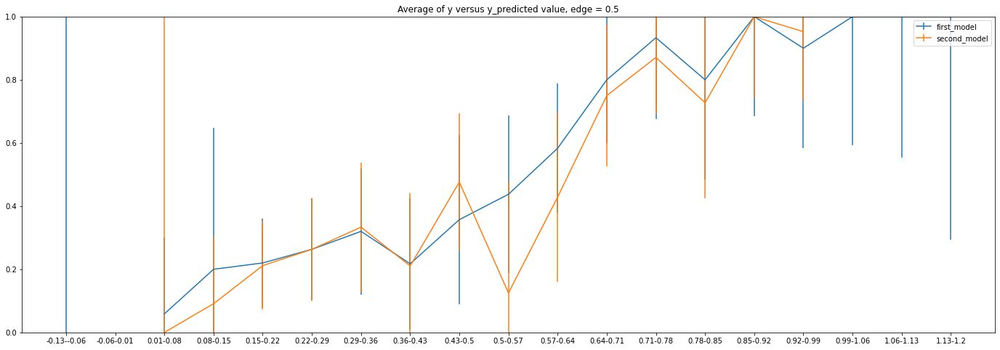

In [ ]:
confidence_plot(model2,log_model2,y,flip=False)

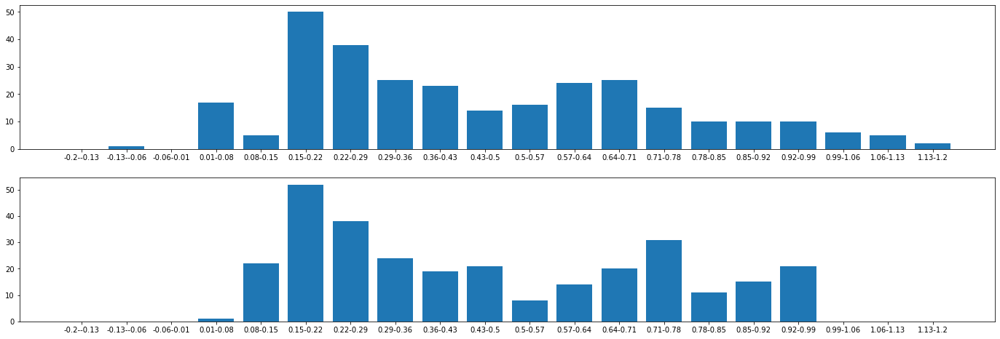

In [ ]:
population_y_predicted(model2,log_model2)

Very similar but log_model2 is only between 0 and 1. That means that for model2, you don't really need a sigmoidal. A line was good, too (very broad).

Let's start looking at the second layer!

First models against log_lin_models.

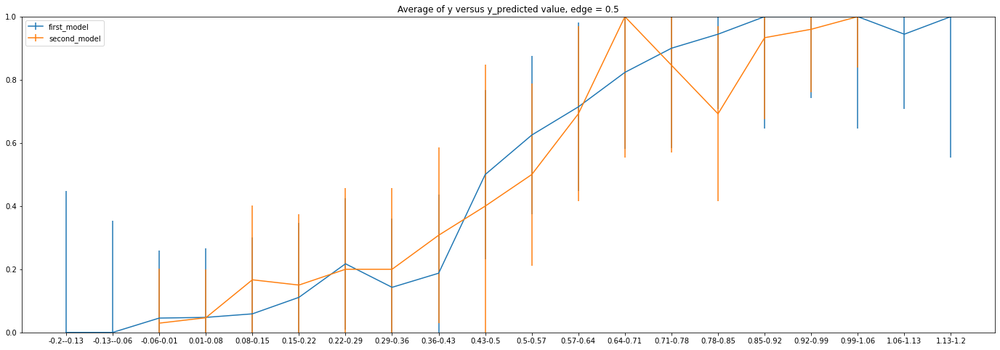

In [ ]:
confidence_plot(models,log_lin_models,y,flip=False)

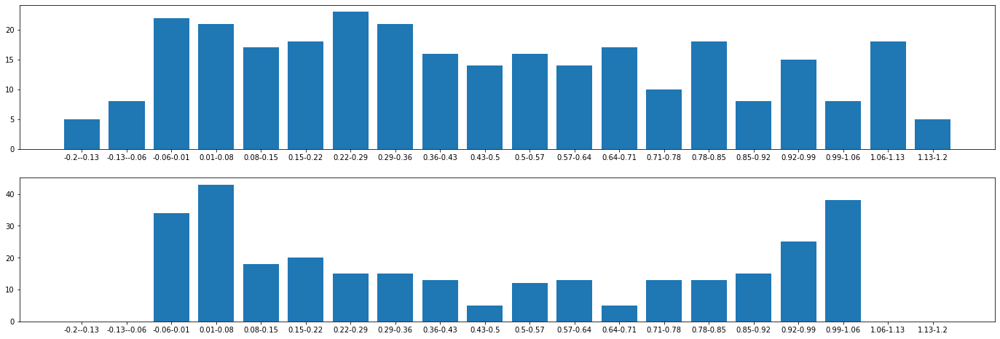

In [ ]:
population_y_predicted(models,log_lin_models)

You can again see how the first is more of a sigmoid and the second is more of a line. We'll take the second one here.

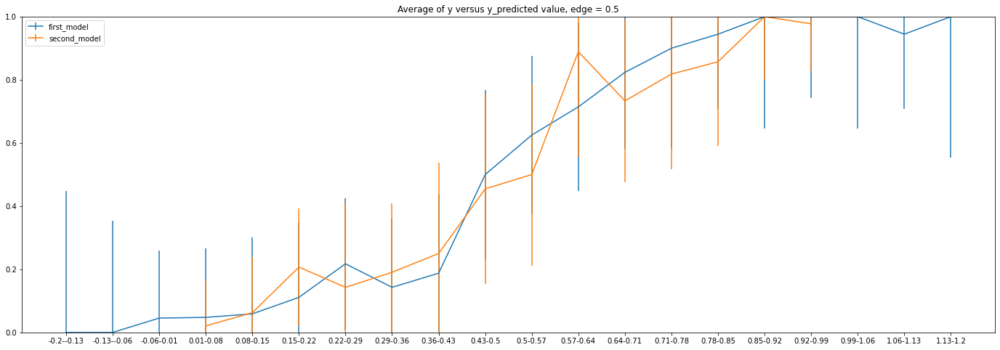

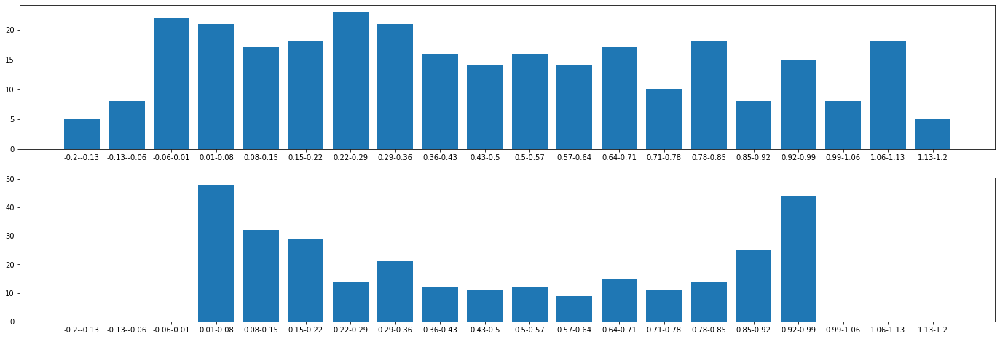

In [ ]:
confidence_plot(models,lin_log_models,y,flip=False)
population_y_predicted(models,lin_log_models)

lin_log_models and lin_log_models almost the same. lin_log_models is between 0 and 1 and log_lin_models is between -0.05 and 1.05 or so.

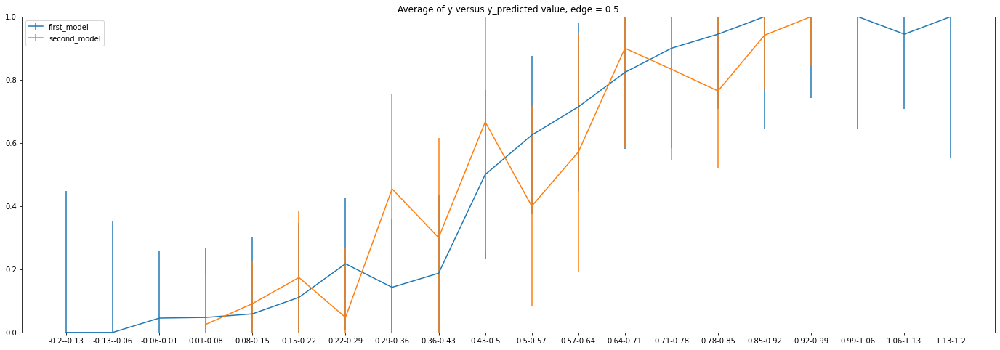

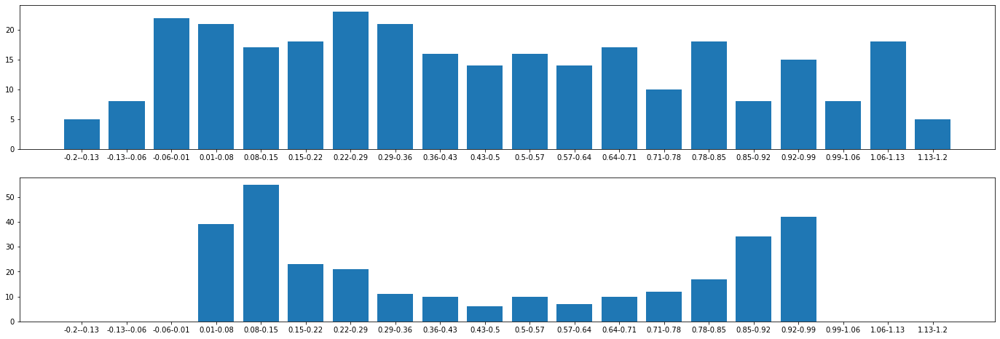

In [ ]:
confidence_plot(models,log_log_models,y,flip=False)
population_y_predicted(models,log_log_models)

Again, same thing. Sigmoid or line.

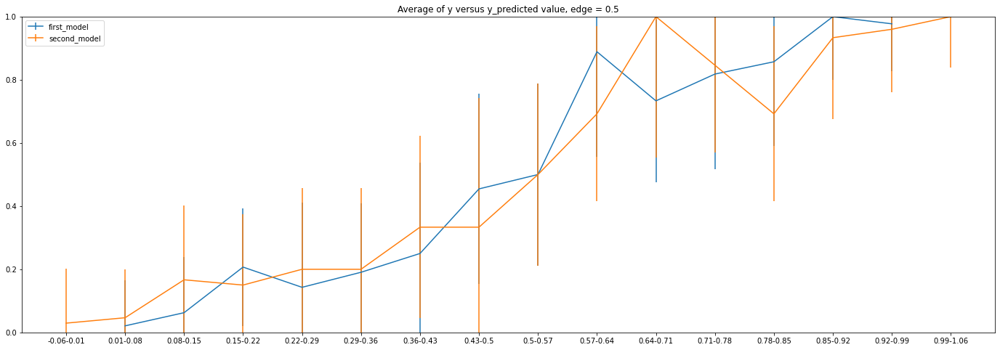

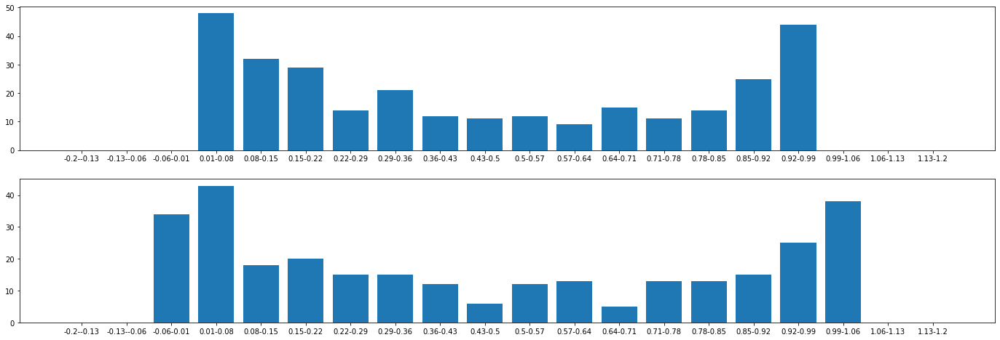

In [ ]:
confidence_plot(lin_log_models,log_lin_models,y,flip=False)
population_y_predicted(lin_log_models,log_lin_models)

We like the blue one here because it's between 0 and 1.

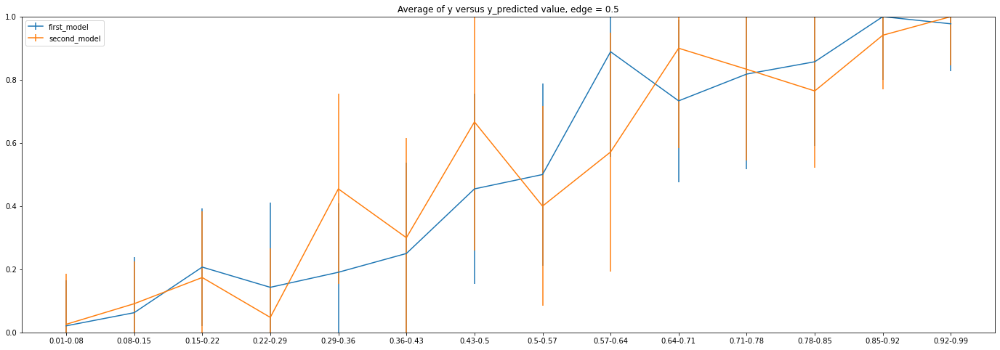

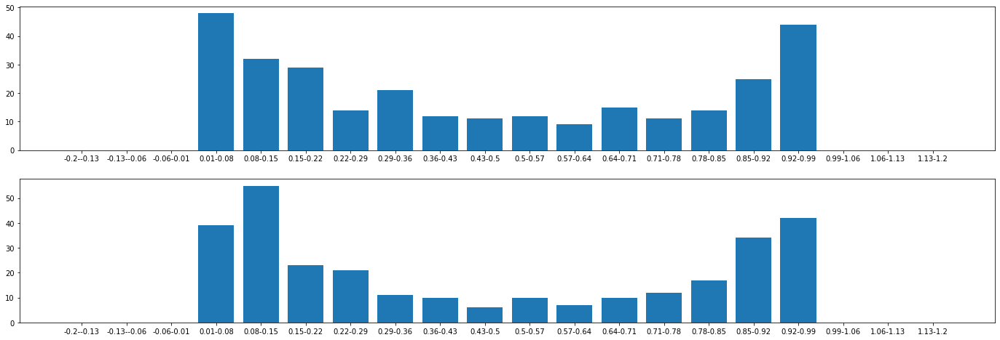

In [ ]:
confidence_plot(lin_log_models,log_log_models,y,flip=False)
population_y_predicted(lin_log_models,log_log_models)

It's interesting that the lin_log has the most people close to 0 and 1 and log_log has the most at 0.1 and even at 1 there are less people. At the same time, log_log doesn't have anyone in the middle but lin_log has more people in the middle. I would be interested to see the delta_accuracy here.

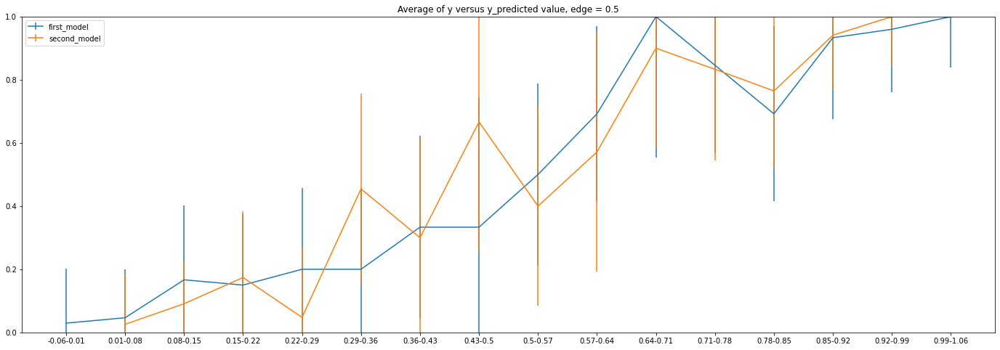

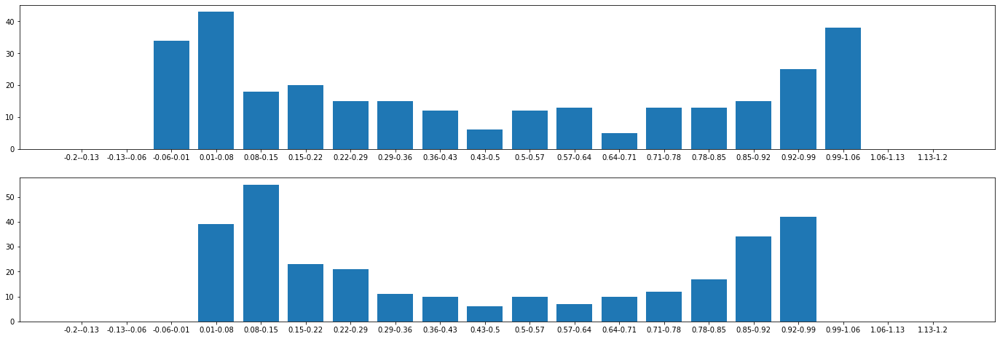

In [ ]:
confidence_plot(log_lin_models,log_log_models,y,flip=False)
population_y_predicted(log_lin_models,log_log_models)

Again, I don't know why you would choose log_lin. It makes no sense.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:338: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:339: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:339: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


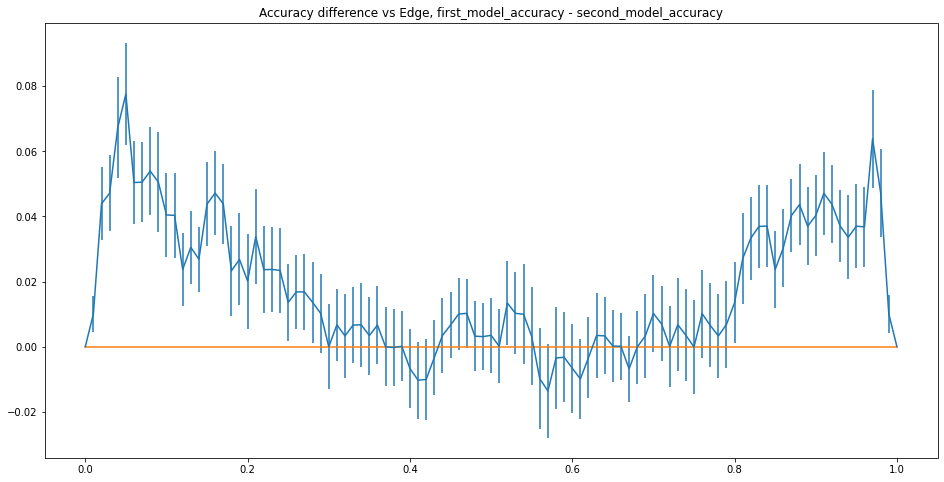

In [ ]:
delta_accuracy(log_model1,lin_log_models)

It says that lin_log is worse than log_model1 for all edges.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:338: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:339: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:339: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


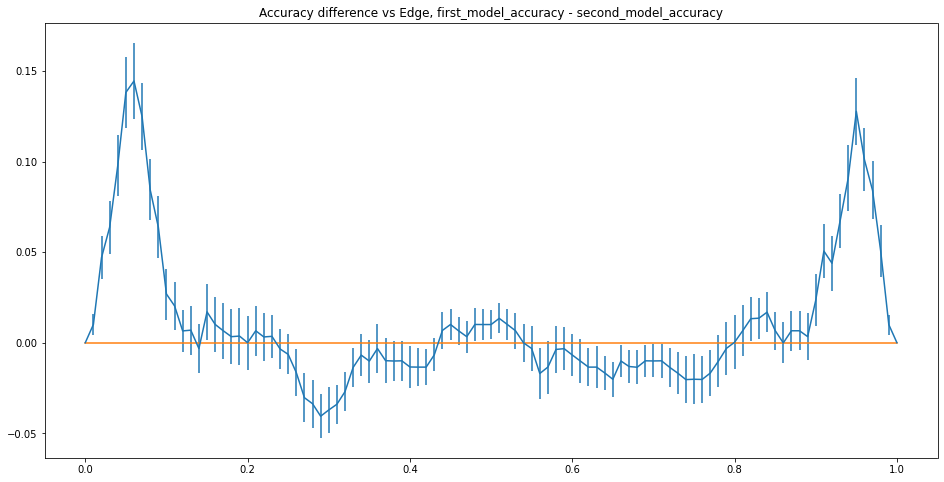

In [ ]:
delta_accuracy(log_model1,log_log_models)

This says that there are some intermediate edges where log_log_models is better than log_model1.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:338: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:339: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:339: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


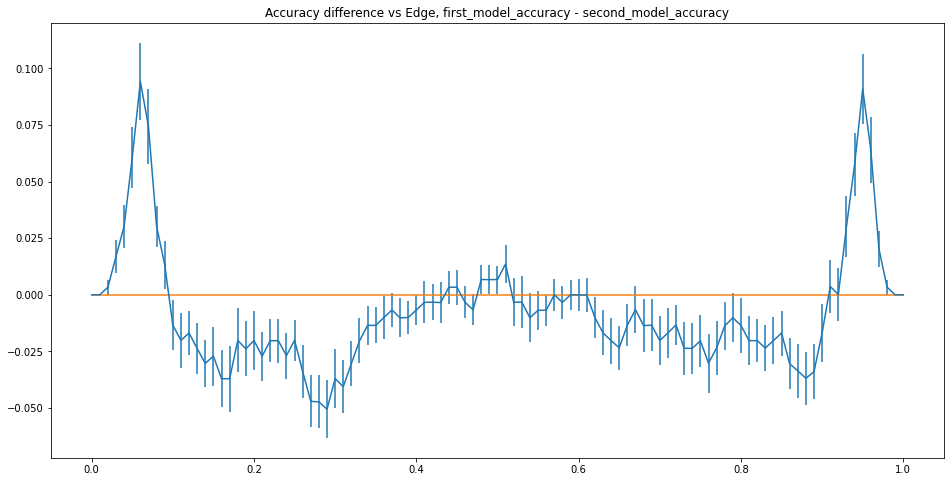

In [ ]:
delta_accuracy(lin_log_models,log_log_models)

So I redid the cross_correlate 100 times (normally this is 10) and knowing that the 'error on the difference' of models is about 0.1% (look at how long the 'errorbars' are above), I can say the following (at edge = 0.5):

1.   lin_log @86.55
2.   log_lin    @ 86.53 and McFadden of 0.21
3.   log_model1 @ 86.32
4.   log_log    @ 86.2
5.   models @ 86.15 and McFadden of 0.26
6.   model1 @ 86.06 and McFadden of 0.27




Overall using SVD to choose the features and then logistic regression will be the simplest.

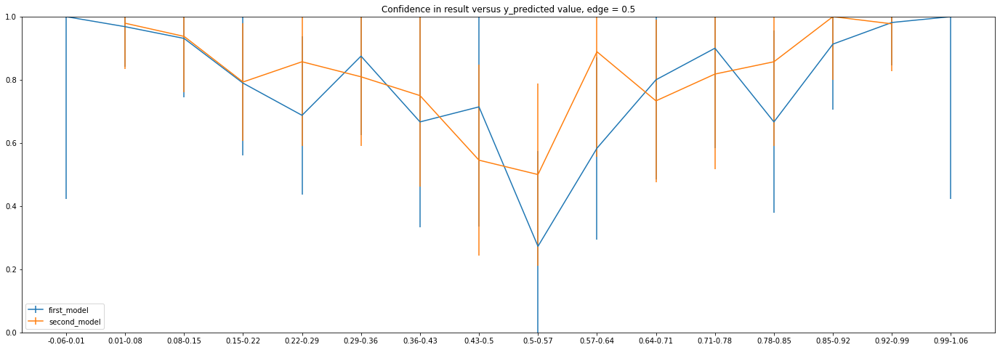

In [ ]:
confidence_plot(log_model1,lin_log_models,y,edge=0.5)


To me it's very clear that lin_log_models is better.

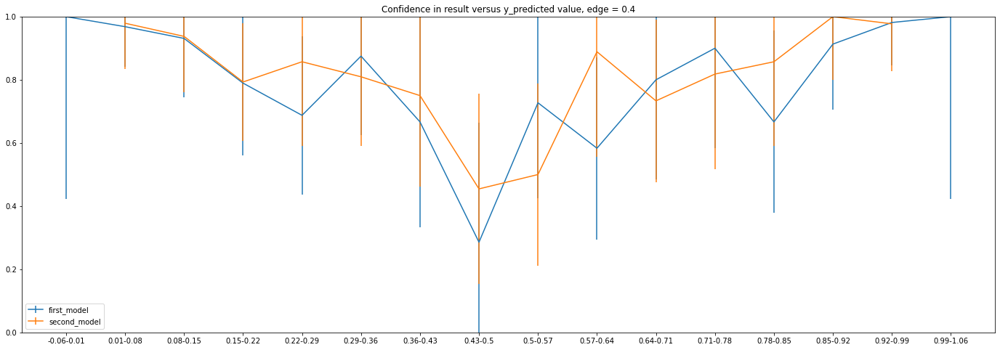

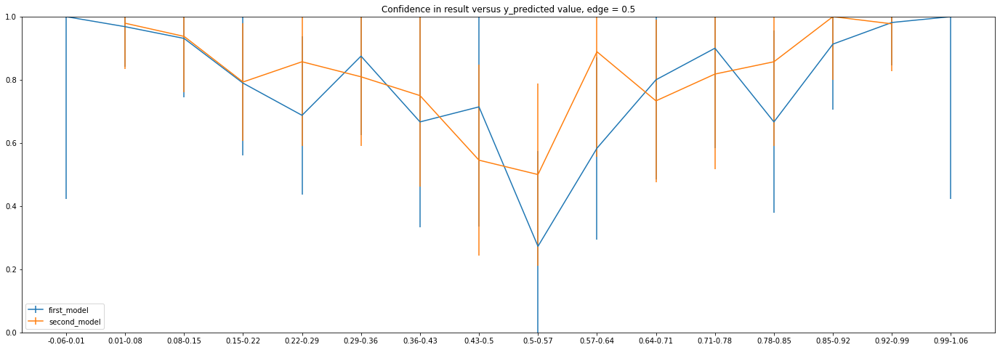

In [ ]:
edges = [0.4,0.5]
for edge in edges:
  confidence_plot(log_model1,lin_log_models,y,edge=edge)


We can see that the lin_log_models is better for edge between 0.4 and 0.5.

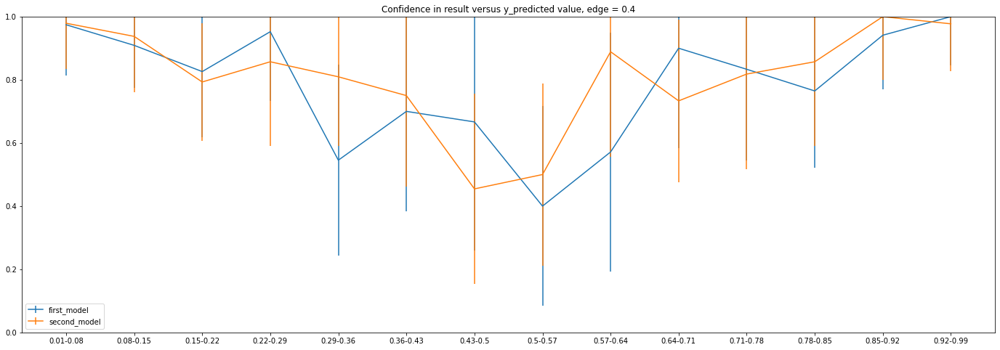

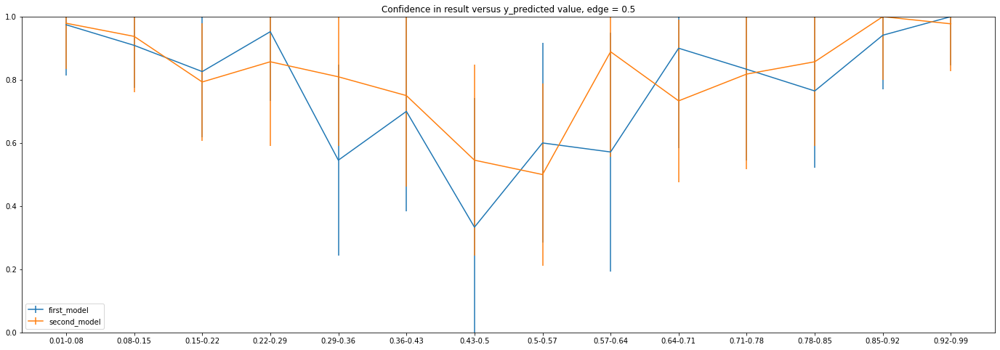

In [ ]:
edges = [0.4,0.5]
for edge in edges:
  confidence_plot(log_log_models,lin_log_models,y,edge=edge)


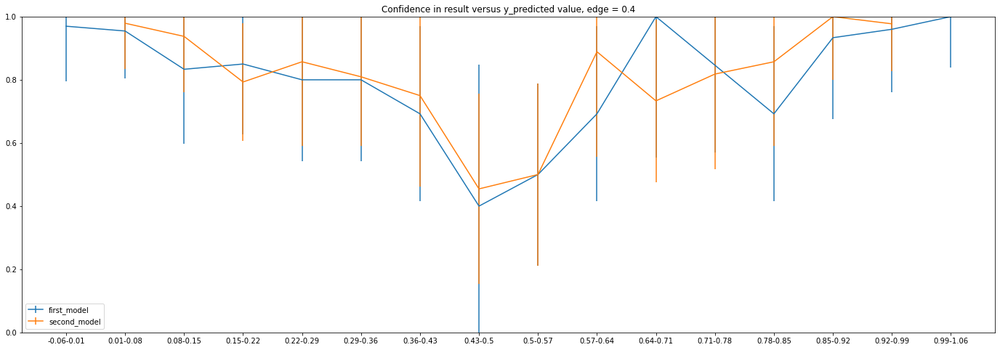

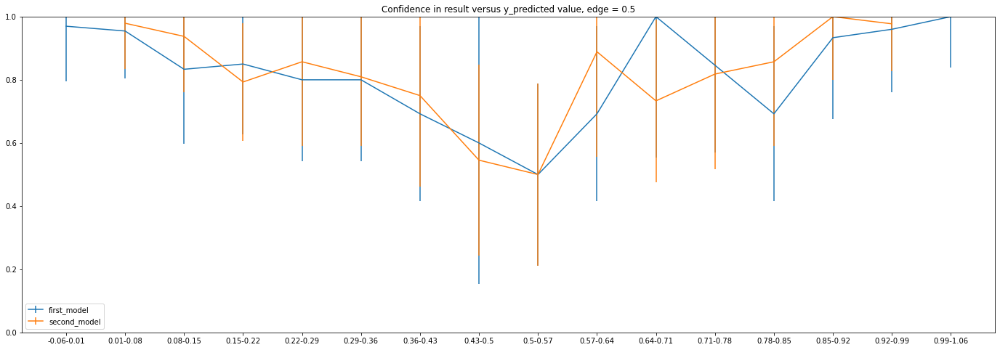

In [ ]:
edges = [0.4,0.5]
for edge in edges:
  confidence_plot(log_lin_models,lin_log_models,y,edge=edge)

You can see how similar log_lin and lin_log are.

For log's, you can't really look at the lowest point to see which model is better because there are very few people at y = 0.5.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


0.8443407407407407
0.020866784919857894
0.8740056176603431
0.0009608901282299534
###McFadden###
0.27326480585380836
0.012782454164396577
0.25267589782088595
0.0004924782804033949


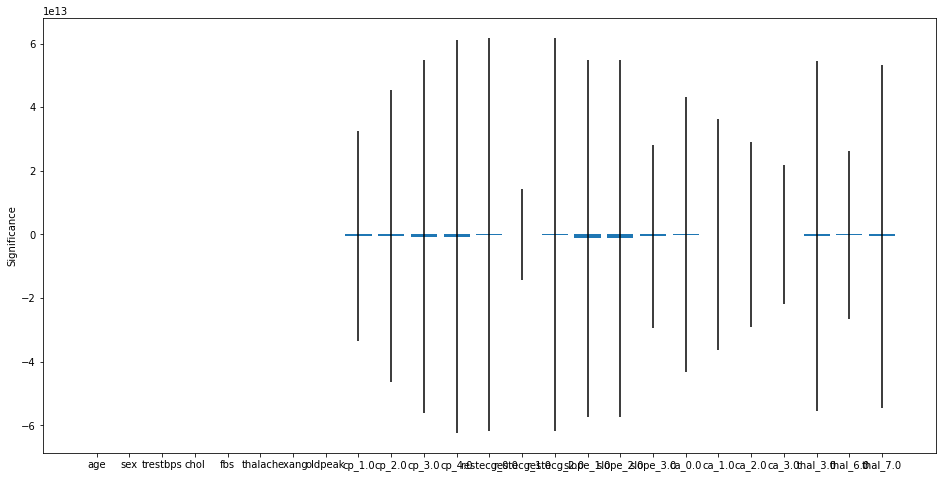

([-0.0023138522212388575,
  0.1531150373395197,
  0.0025376072196301915,
  0.00034096151202327125,
  -0.05442936985547289,
  -0.002059617805774803,
  0.07973840253529613,
  0.04013868911846762,
  3705766203.101416,
  3705766203.203383,
  3705766203.143502,
  3705766203.3708067,
  -6049393640.142765,
  -6049393640.016294,
  -6049393640.089097,
  -7536653756.720931,
  -7536653756.593101,
  -7536653756.65219,
  -1830181634.4862583,
  -1830181634.220868,
  -1830181634.1485107,
  -1830181634.197048,
  219948550.63542053,
  219948550.70297927,
  219948550.85142517],
 11490514277.468285)

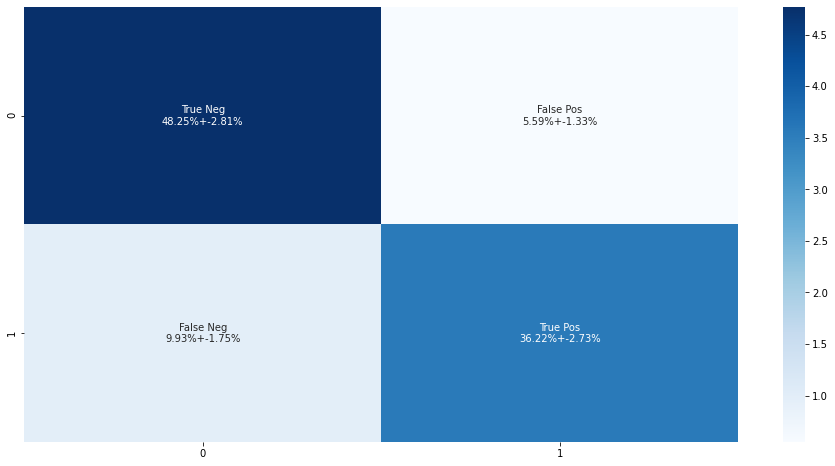

In [ ]:
loading_scores(X_encoded,y)


The story is this:
we have 


1.   84.43% from the SVD on all features
2.   86.06% on model1
3.   86.32% from logistic regression on model1
4.   86.55% from logistic regression on all models

So the effect is 
1.   'Feature Selection' = 1.63%
2.   'Logistic Regression' = 0.26%
3.   'Corroborative Models' = 0.23%



The only question is: why doesn't the delta accuracy work? Or does it? It's easy to find out.

In [ ]:
log_model1

0      0.255039
1      0.975099
2      0.974421
3      0.104512
4      0.016586
         ...   
297    0.771405
298    0.447718
299    0.981008
300    0.984406
301    0.244784
Length: 297, dtype: float64

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


0.7744000000000001
0.023461039175343004
0.7744107626790553
0.0008087059647598988
###McFadden###
0.22110401972978694
0.01327787168806415
0.22108701672976275
0.00045778287261782067
0.7541444444444444
0.024556090379544857
0.7542086841850562
0.000846251675809468
###McFadden###
0.23895655382645045
0.01225759899944054
0.23898762628031683
0.0004227549291847472


([1], 0)

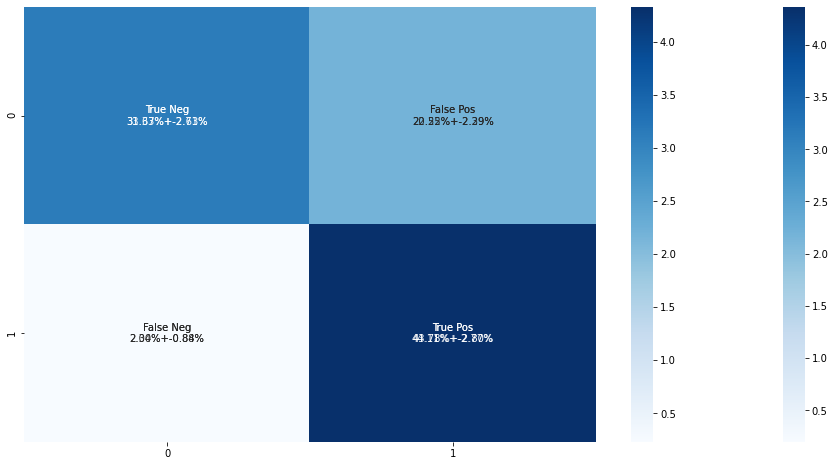

In [ ]:
loading_scores(log_model1,y,edge=0.2,pad=False)
loading_scores(lin_log_models,y,edge=0.2,pad=False)

It's really true. Log_model1 does much better at edge = 0.2, 0.02 like is written in the delta_accuracy.

That means that log_model1 is more accurate for y between (0 and 0.2) and (0.8 and 1) but it doesn't matter much for edge close to 0.5. It just means that it is better at telling people their chances.

Between 0.3 and 0.7 the two are the same so you can use either.

For edge between 0.3 and 0.7, the best is actually the log_log_models.

0.8148185185185184
0.022173060318916242
0.8148148188475933
0.0007640863049825428
###McFadden###
0.22102136005330567
0.01321039916012753
0.22108692672575964
0.0004553609017505306
0.8149074074074073
0.021520654938874947
0.8148149156342752
0.0007422572297957203
###McFadden###
0.23894900129866262
0.012180544127951267
0.2389876180567456
0.0004196936572908896


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


0.8519814814814815
0.01960155599864834
0.8518519929990965
0.0006762232556873776
###McFadden###
0.23131069002367433
0.012319636546840573
0.23140168027100022
0.0004248095172548062


([1], 0)

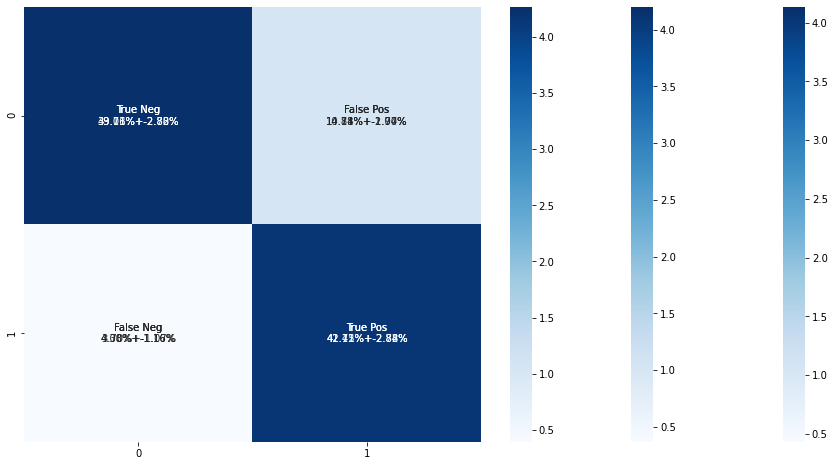

In [ ]:
loading_scores(log_model1,y,edge=0.3,pad=False)
loading_scores(lin_log_models,y,edge=0.3,pad=False)
loading_scores(log_log_models,y,edge=0.3,pad=False)

We can see that for edge = 0.3, log_log_models still has 85.2%, the others have 81.5%. That's almost 4% better.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


0.8518111111111112
0.020114790873915454
0.8518518074912891
0.0006924958739901092
###McFadden###
0.2314102897188645
0.012594761810520874
0.23140178872014566
0.0004341352150756928


([1], 0)

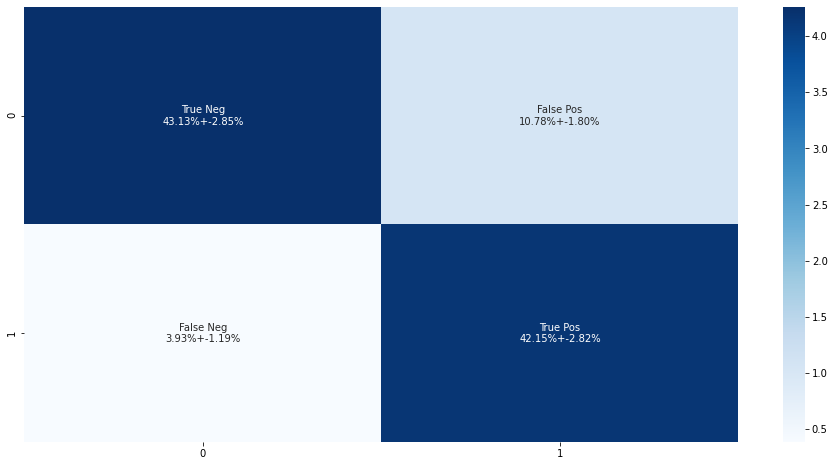

In [ ]:
loading_scores(log_log_models,y,edge=0.3,pad=False)

Look at this, only 4% False Negative.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


0.8519777777777778
0.020391184409039424
0.8518519889663182
0.0007033306485837453
###McFadden###
0.23133779245942018
0.01251247067012956
0.23140170978149208
0.0004317999865677814


([1], 0)

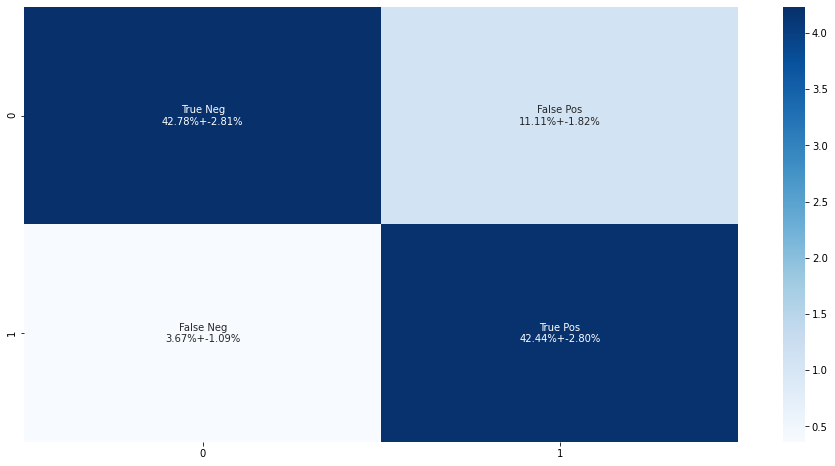

In [ ]:
loading_scores(log_log_models,y,edge=0.29,pad=False)

## This is the best model. 3.67% False Negatives. 85.2% Accuracy.

0.8114407407407408
0.021665693985183053
0.8114478037488709
0.0007465581298558178
###McFadden###
0.22109436458125575
0.012941632533516361
0.2210870062167526
0.0004456711701708786


([1], 0)

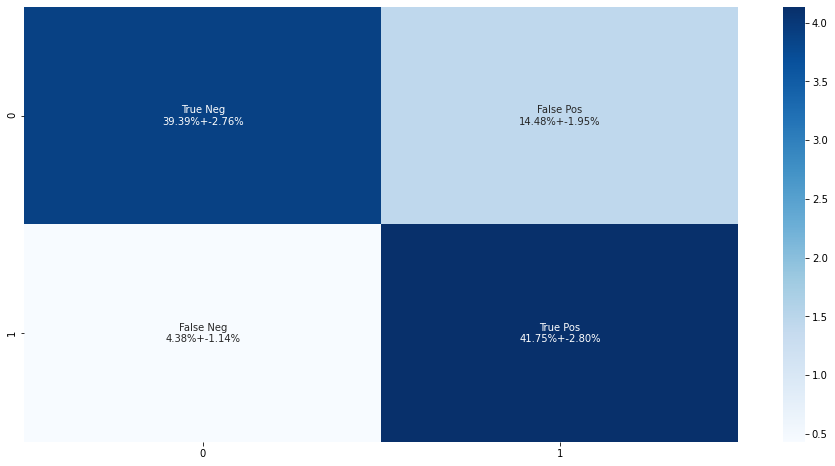

In [ ]:
loading_scores(log_model1,y,edge=0.29,pad=False)

## Log_model1 only has 81.1% accuracy and 4.38% False Negatives.

0.8045703703703704
0.02241855045201391
0.8047136485352949
0.0007720812736792524
###McFadden###
0.2211333445740425
0.013043547754794564
0.22108704866012452
0.00044989262759267517


([1], 0)

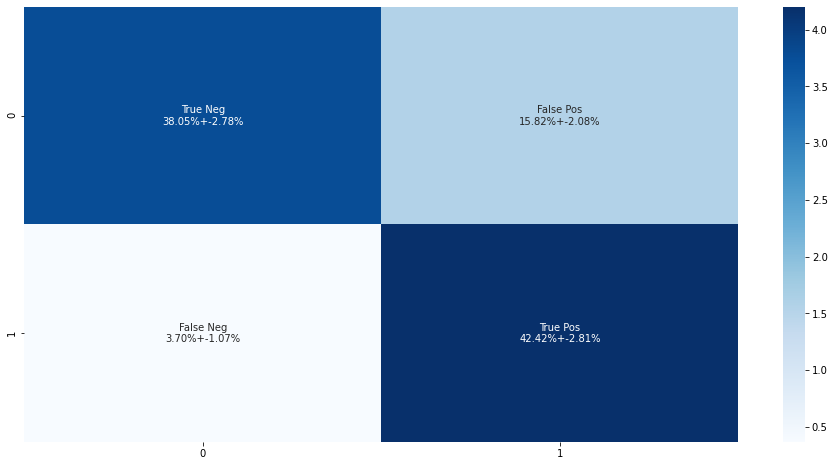

In [ ]:
loading_scores(log_model1,y,edge=0.28,pad=False)

To get the same False Negatives, you lose 85.2% - 80.5% = 4.7% accuracy.

0.8081222222222226
0.022894257518933772
0.8080808531746031
0.0007894483526634577
###McFadden###
0.25948578890479285
0.012422643393708696
0.2595265989443049
0.0004284186130644371


([1], 0)

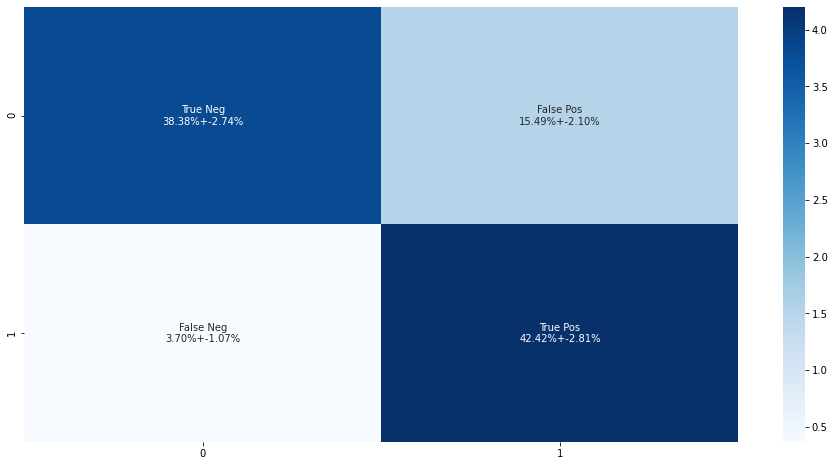

In [ ]:
loading_scores(model1,y,edge=0.34,pad=False)

model1 has accuracy of 80.8% for the same False Negatives of 3.7%. That's 0.3% better than log_model1.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


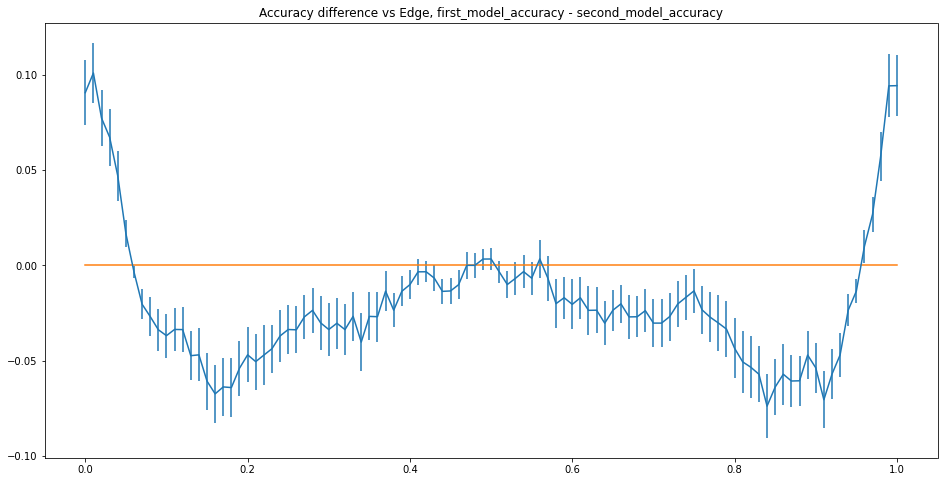

In [ ]:
delta_accuracy(model1,log_model1)

So log_model1 is clearly better.

However, it doesn't say how it is bettter. It must be a lot better at false positives but not for false negatives.

0.8944773175542406
0.730962962962963
0.025062397817118564
0.7610466673119112
0.008474424629868606
###McFadden###
0.2930998263888889
0.013371380062140295
0.2742908140175849
0.0029027617428203653


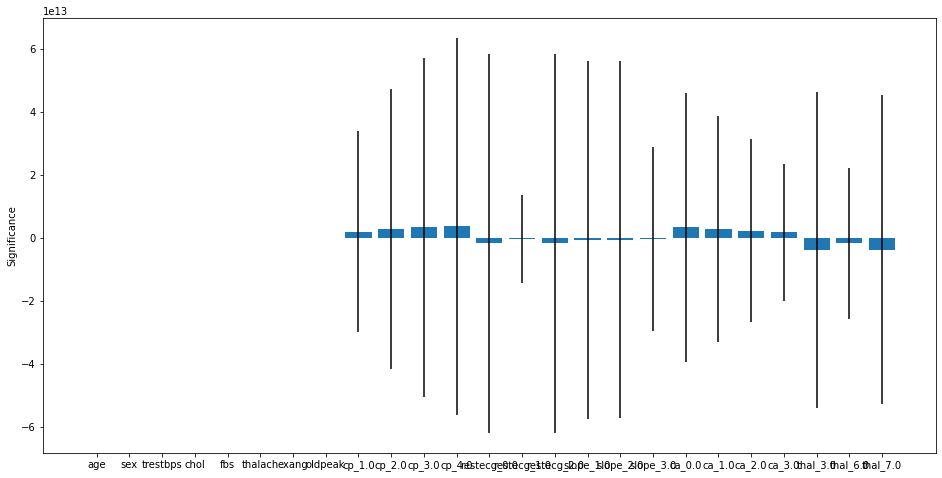

([-0.0019760885571547164,
  0.15043383431213467,
  0.0024553729762725072,
  0.000335103387851453,
  -0.05191105342429675,
  -0.0019270607302537984,
  0.08273576585050132,
  0.03935522710830977,
  -7247401455749.102,
  -7247401455749.005,
  -7247401455749.067,
  -7247401455748.828,
  8761443403282.547,
  8761443403282.666,
  8761443403282.588,
  -920612034470.9369,
  -920612034470.8168,
  -920612034470.8789,
  -4263233055429.436,
  -4263233055429.1836,
  -4263233055429.1104,
  -4263233055429.154,
  3669803142366.7725,
  3669803142366.849,
  3669803142366.996],
 3669803142366.996,
 0.730962962962963,
 0.025062397817118564)

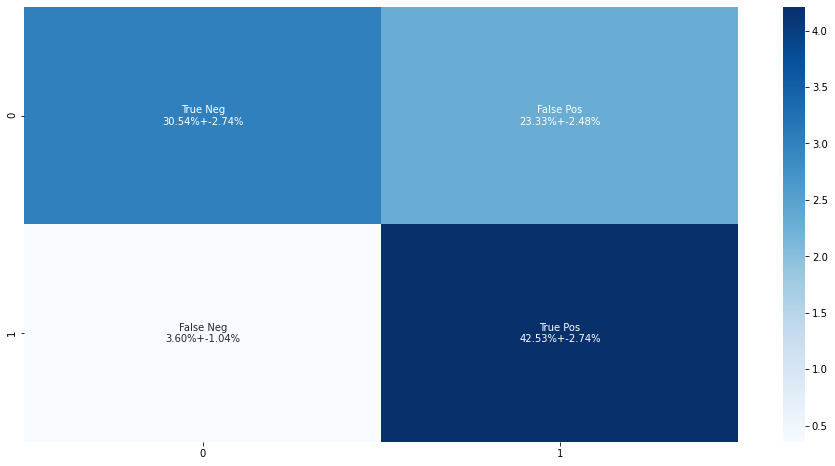

In [ ]:
loading_scores(X_encoded,y,edge=0.25,pad=False)

Here a simple SVD for 3.7% False Negatives has 74.0% accuracy.

1.   Feature selection = 80.8 - 74.0 = 6.8%
2.   Logistic Regression = -0.3% in this case.
3.   'Corroborative Models' = 4.6%

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


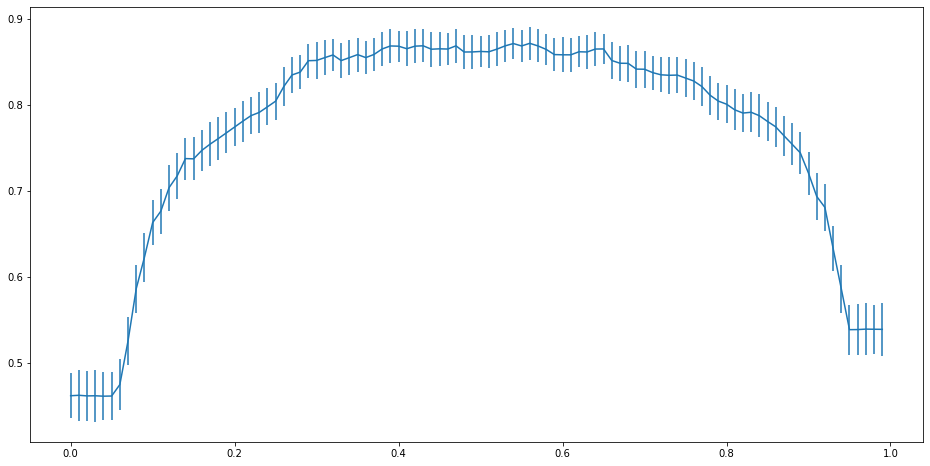

In [ ]:
means = []
errors = []
for i in np.arange(0.0,1.0,0.01):
  _,_,mean,mean_err = loading_scores(log_log_models,y,pad=False,show=False,edge=np.round(i,2))
  means.append(mean)
  errors.append(mean_err)

plt.figure()
plt.errorbar([round(i,2) for i in np.arange(0.0,1.0,0.01)],means,yerr=errors)
plt.show()
plt.close()

That's CRAZY flat!!!

False positive rate should be called sensitivity. It would be great to put sensitivity on the x-axis.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:334: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:335: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:335: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


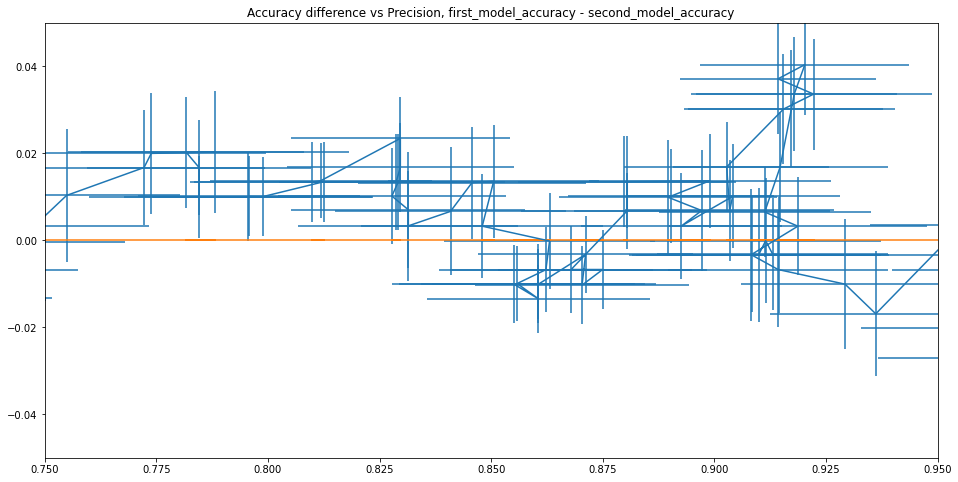

In [ ]:
sensitivity_delta_accuracy(log_log_models,log_model1)

Actually, model1 and model2 won't have the same sensitivity each time so this may not work.

In [ ]:
38.4/(3.7+38.4)

0.9121140142517814

For Sensitivity = 0.912, I found that delta_accuracy is 4.6%.

I found edge=0.28 for log_model1 to have the same false_negatives of 3.70% (38.05%) as edge=0.29 for log_log_models of 3.70% (42%). These don't have the same sensitivity. But I think I need to make the steps smaller. The numbers change a lot.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


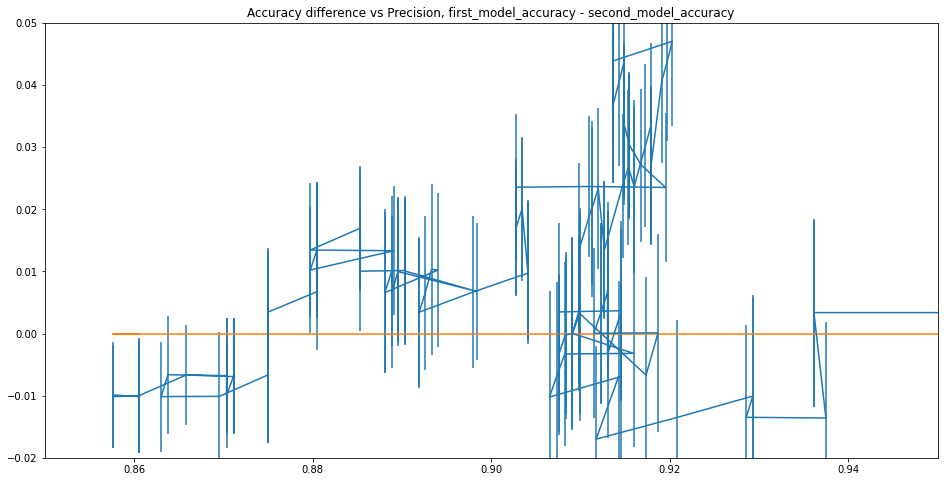

In [ ]:
sensitivitys,sensitivitys_err,accuracy_deltas,accuracy_deltas_err = sensitivity_delta_accuracy(log_log_models,log_model1,sensitivity_range=[0.85,0.95],accuracy_delta_range=[-0.02,0.05],ymin=0.1)

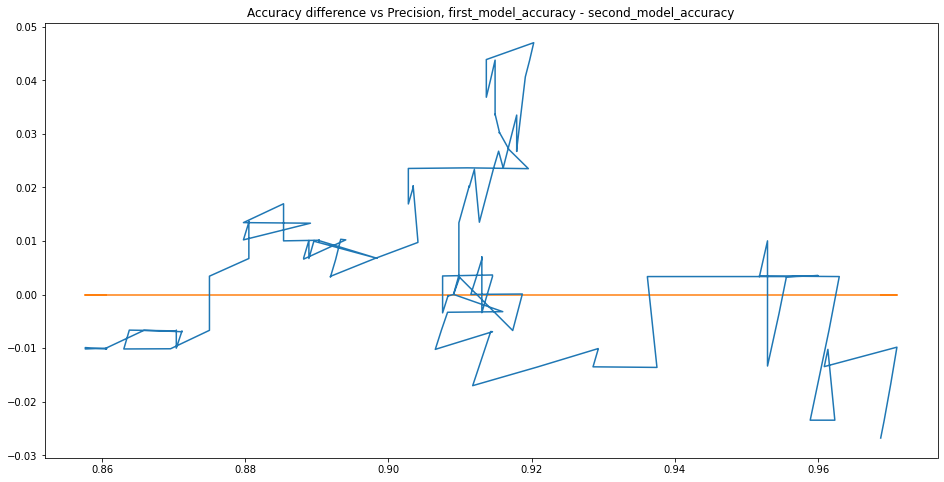

In [ ]:
  plt.errorbar(sensitivitys,accuracy_deltas)
  plt.title(f"Accuracy difference vs Sensitivity, first_model_accuracy - second_model_accuracy") 
  plt.plot(sensitivitys,0*np.ones_like(sensitivitys))

  plt.show()
  plt.close()

The reason it looks like this is because of the large errors.

The sensitivity errors are about 0.025 on either side. The accuracy errors are about 0.01 on either side.

I think the best one was still this one:

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:339: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:341: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


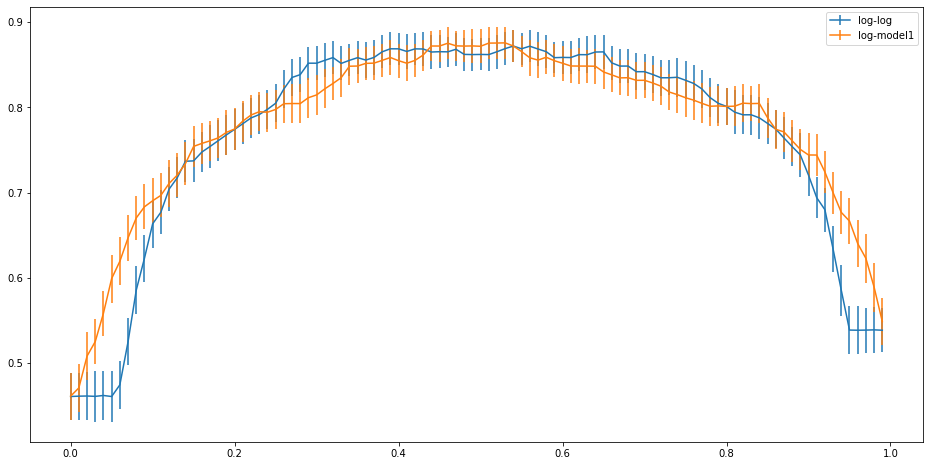

In [ ]:
means1 = []
errors1 = []
means2 = []
errors2 = []
for i in np.arange(0.0,1.0,0.01):
  _,_,numbers = loading_scores(log_log_models,y,pad=False,show=False,edge=np.round(i,2))
  mean1 = numbers[0]
  error1 = numbers[1]
  means1.append(mean1)
  errors1.append(error1)
  _,_,numbers = loading_scores(log_model1,y,pad=False,show=False,edge=np.round(i,2))
  mean2 = numbers[0]
  error2 = numbers[1]
  means2.append(mean2)
  errors2.append(error2)

plt.figure()
plt.errorbar([round(i,2) for i in np.arange(0.0,1.0,0.01)],means1,yerr=errors1,label="log-log")
plt.errorbar([round(i,2) for i in np.arange(0.0,1.0,0.01)],means2,yerr=errors2,label='log-model1')
plt.legend()
plt.show()
plt.close()

As you can see, the log-log one is higher for longer. The log_model1 goes down faster but is broader.

The log-log model realized that even for the most sure cases, there is a 5% rate of being wrong so that's why the log-log model doesn't go to 0 and 1 but only to 0.05 and 0.95. That's thanks to the 'useless' features. It also puts much fewer people in between 0.3 and 0.7 which is why the accuracy doesn't change much but for some reason, the sensitivity does change because it's 'monotonic with edge'.

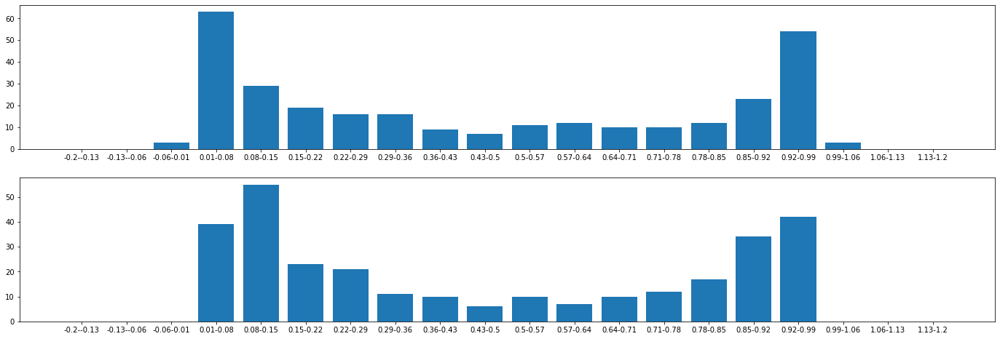

In [ ]:
population_y_predicted(log_model1,log_log_models)

You can see clearly that at layer 2, it realized that 'second-to-last' space of 0.08-0.15 and 0.85-0.92. Because it is able to take lots of people and put them in that space, it is able to clear our a lot of people from the middle where it didn't know if they have a problem or not. It also takes some people that it thought it was sure of and puts them in that space. That's why we are able to achieve flat accuracy for so many values of edge, and get almost 5% better accuracy at 92% sensitivity.

The last thing I want to test is if putting a 'second layer' without model2 and model3 will make a difference.

In [ ]:
abc = pd.DataFrame(log_model1).join(pd.Series(np.ones_like(log_model1),name='abc',index=log_model1.index))

In [ ]:
fake_log_log_model
[4.924316975239765, 1.3176868386941977e-05] -2.4916316669803207

0      0.563382
1      0.726133
2      0.725997
3      0.526096
4      0.504143
         ...   
297    0.683783
298    0.610018
299    0.727306
300    0.727979
301    0.560883
Length: 297, dtype: float64

## Fake log-log

In [ ]:
warnings.filterwarnings('ignore')
fake_log_log_scores_t,fake_log_log_average_t,_ = loading_scores(log_model1,y,estimator = logistic_estimator,pad = False,show=False)
print(fake_log_log_scores_t,fake_log_log_average_t)
fake_log_log_model = (log_model1 * fake_log_log_scores_t[0] + fake_log_log_average_t * np.ones_like(y)).apply(lambda row: sigmoid(row))
fake_log_log_model
warnings.resetwarnings()

[4.924320307637151] -2.465089388960482


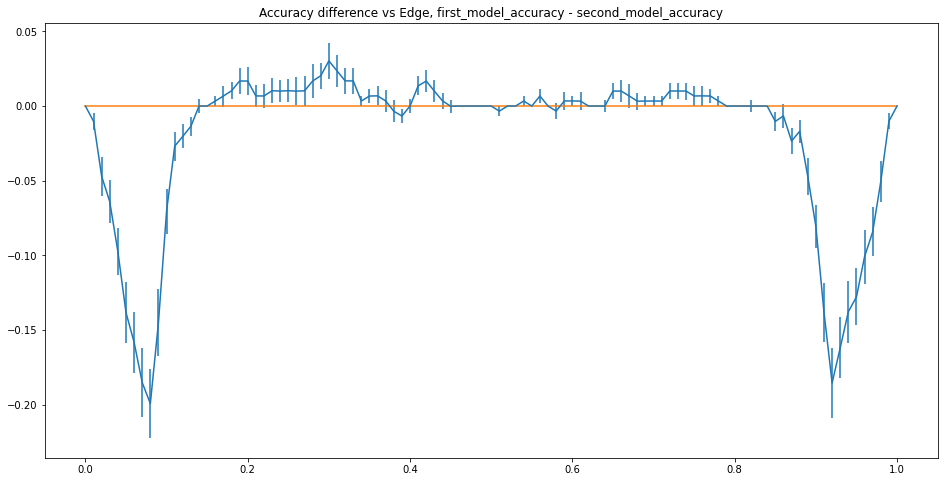

In [ ]:
delta_accuracy(log_model1,fake_log_log_model)

This shows that although the fake_log_log_model does better for important edge values, it does a bad job differentiating people with edge < 0.15 and edge > 0.85. log_model_1 does much better there.

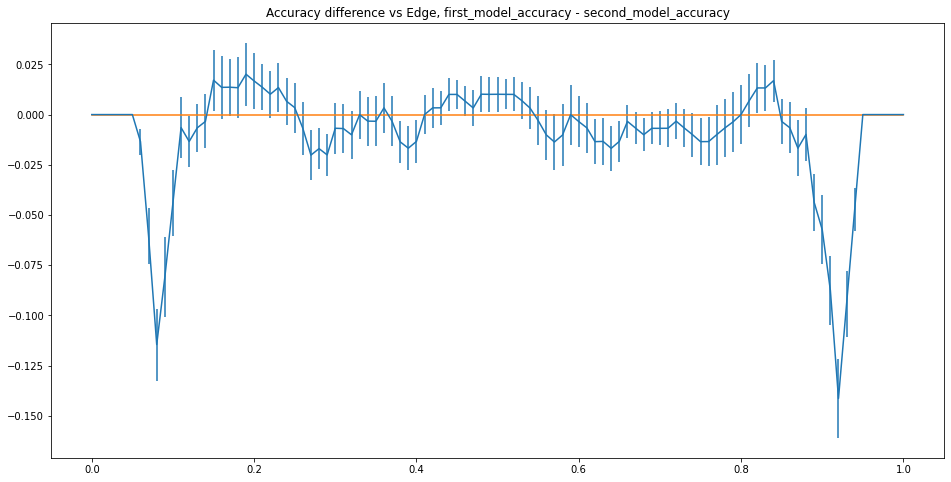

In [ ]:
delta_accuracy(fake_log_log_model,log_log_models)

This clearly shows the main effect of the log_log_model that is different from fake_log_log_model that is to differentiate the 0.0-0.15 and 0.85-1.0 people better.

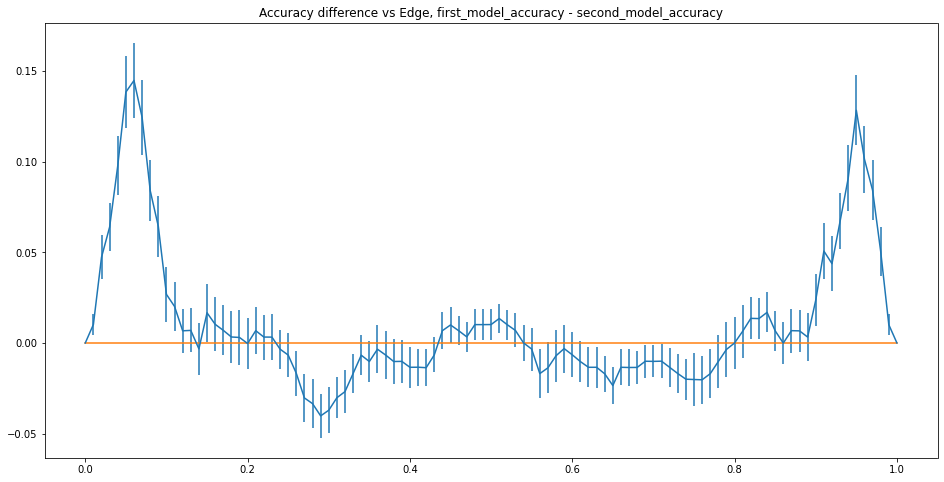

In [ ]:
delta_accuracy(log_model1,log_log_models)

This shows that log_model1 does a better job with the log and high edge cases. The McFadden R^2 will have to say more. Maybe the second log is not worth it because it is not able to return the identity so it just changes things too much. Maybe we should use lin-log or log-lin.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


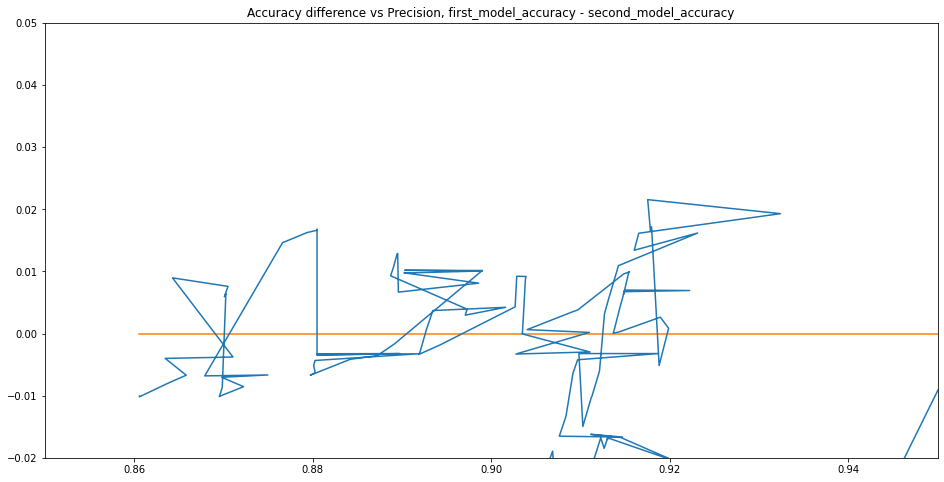

In [ ]:
sensitivitys,sensitivitys_err,accuracy_deltas,accuracy_deltas_err = sensitivity_delta_accuracy(log_log_models,fake_log_log_model,sensitivity_range=[0.85,0.95],accuracy_delta_range=[-0.02,0.05],ymin=0.1)

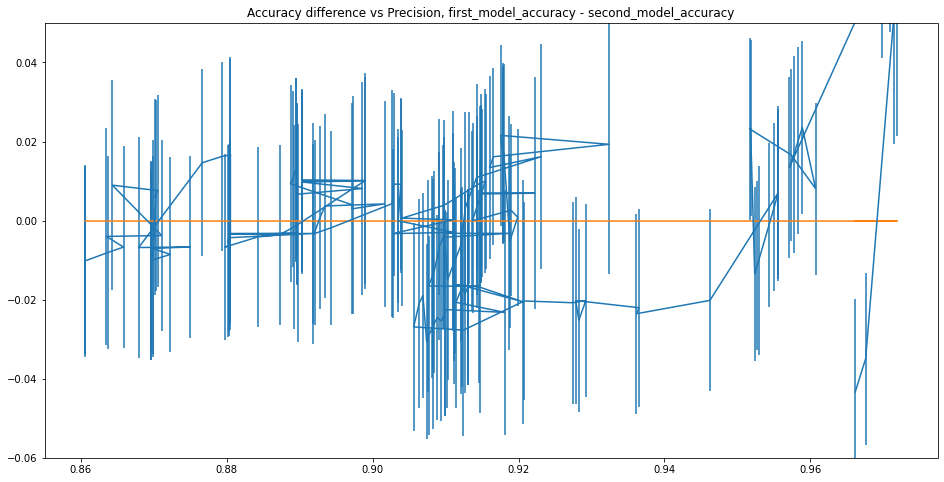

In [ ]:
plt.errorbar(sensitivitys,accuracy_deltas,yerr=sensitivitys_err)
plt.title(f"Accuracy difference vs Sensitivity, first_model_accuracy - second_model_accuracy") 
plt.plot(sensitivitys,0*np.ones_like(sensitivitys))
plt.ylim([-0.06,0.05])
plt.show()
plt.close()

This shows that although the fake_log_log_model has similar accuracy and sensitivity to the log_log_model, when the two come together, the fake_log_log_model is not able to capture the same result as the log_log_model. We see that there is still a lot in the log_log_model that the fake_log_log_model does not capture.

However, after doing it again, we find that the two cannot be distinguished. Even before, the adjusted p-value must have been over 0.05.

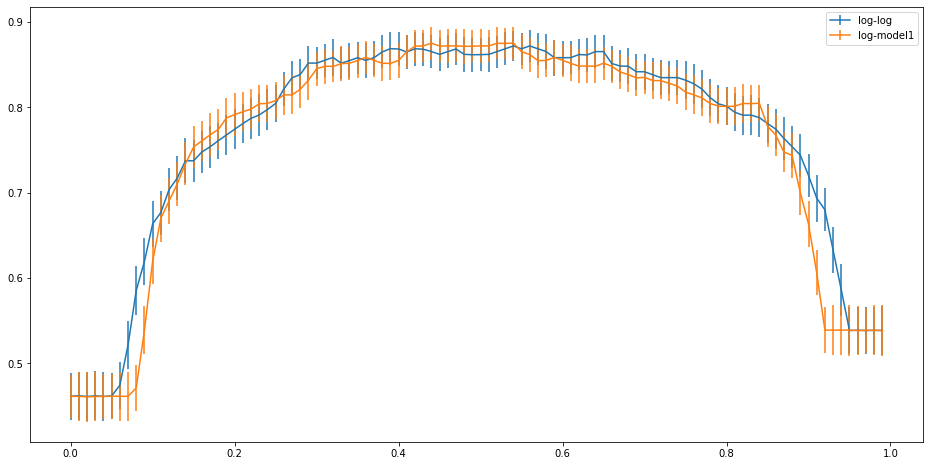

In [ ]:
means1 = []
errors1 = []
means2 = []
errors2 = []
for i in np.arange(0.0,1.0,0.01):
  _,_,numbers = loading_scores(log_log_models,y,pad=False,show=False,edge=np.round(i,2))
  mean1 = numbers[0]
  error1 = numbers[1]
  means1.append(mean1)
  errors1.append(error1)
  _,_,numbers = loading_scores(fake_log_log_model,y,pad=False,show=False,edge=np.round(i,2))
  mean2 = numbers[0]
  error2 = numbers[1]
  means2.append(mean2)
  errors2.append(error2)

plt.figure()
plt.errorbar([round(i,2) for i in np.arange(0.0,1.0,0.01)],means1,yerr=errors1,label="log-log")
plt.errorbar([round(i,2) for i in np.arange(0.0,1.0,0.01)],means2,yerr=errors2,label='log-model1')
plt.legend()
plt.show()
plt.close()

Here it should say fake_log_log_model, not log_model1. The two look the same except at the ends. But this doesn't look at sensitivity. It must be that while both do equally well on accuracy, ours does better on sensitivity. Let's look at sensitivity-edge.

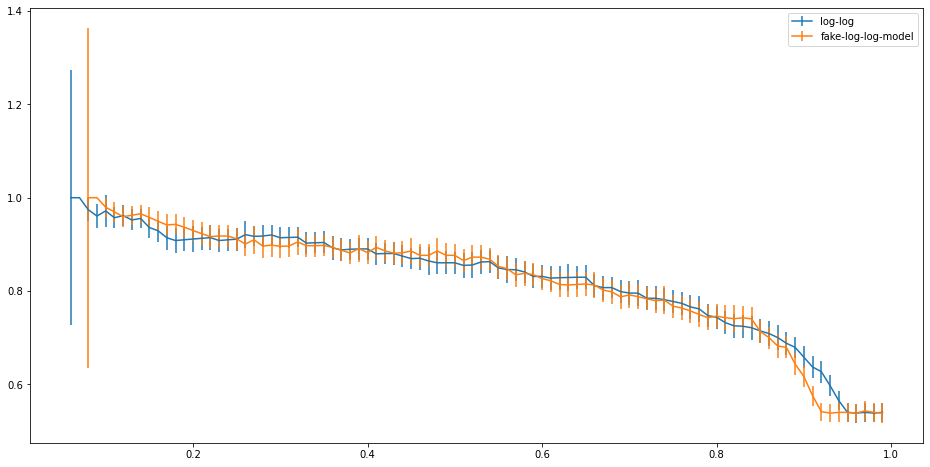

In [ ]:
means1 = []
errors1 = []
means2 = []
errors2 = []
for i in np.arange(0.0,1.0,0.01):
  _,_,numbers = loading_scores(log_log_models,y,pad=False,show=False,edge=np.round(i,2))
  mean1 = numbers[2]
  error1 = numbers[3]
  means1.append(mean1)
  errors1.append(error1)
  _,_,numbers = loading_scores(fake_log_log_model,y,pad=False,show=False,edge=np.round(i,2))
  mean2 = numbers[2]
  error2 = numbers[3]
  means2.append(mean2)
  errors2.append(error2)

plt.figure()
plt.errorbar([round(i,2) for i in np.arange(0.0,1.0,0.01)],means1,yerr=errors1,label="log-log")
plt.errorbar([round(i,2) for i in np.arange(0.0,1.0,0.01)],means2,yerr=errors2,label='fake-log-log-model')
plt.legend()
plt.show()
plt.close()

x is edge. y is sensitivity. We are looking at 0.28 edge? I'm not sure. It looks random.

Neither accuracy or sensitivity give us confidence. Is it still possible that both come together to have an effect?

sensitivitys_err is about 0.025


accuracy_deltas_err is about 0.013?

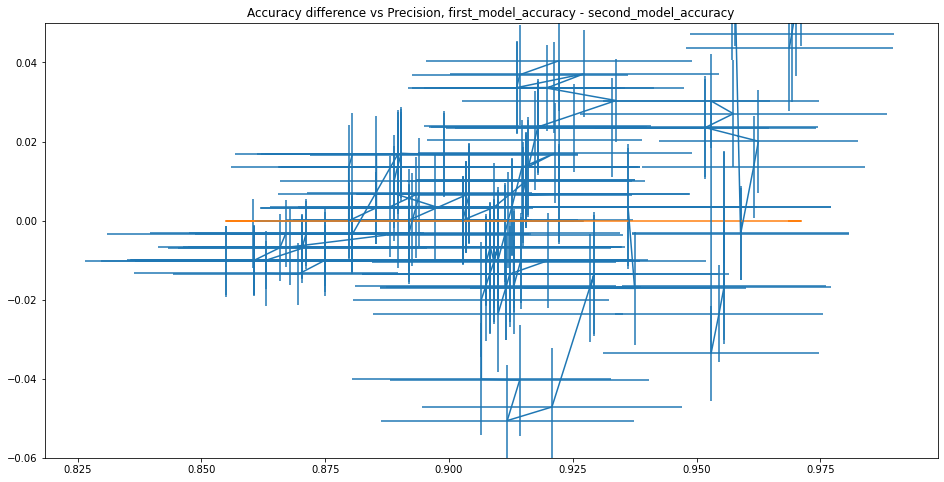

In [ ]:
plt.errorbar(sensitivitys,accuracy_deltas,xerr=sensitivitys_err,yerr=accuracy_deltas_err)
plt.title(f"Accuracy difference vs Sensitivity, first_model_accuracy - second_model_accuracy") 
plt.plot(sensitivitys,0*np.ones_like(sensitivitys))
plt.ylim([-0.06,0.05])
plt.show()
plt.close()

It looks like the errorbars don't go to 0 in y. We still have 0.04. But we also have -0.05 but we had that before. We said it had reasons.

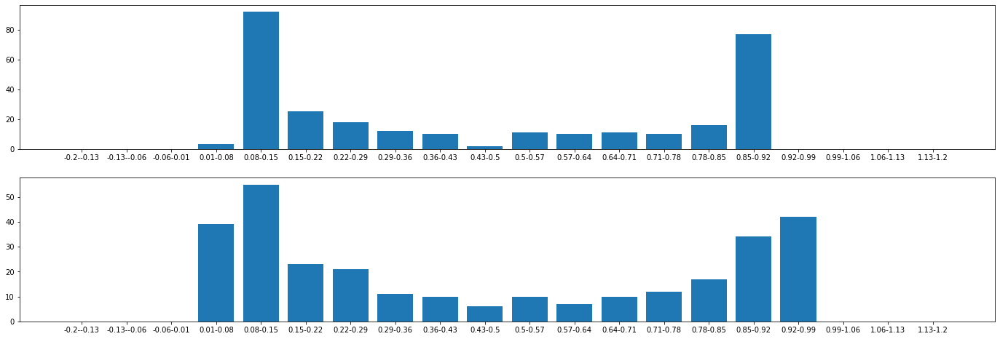

In [ ]:
population_y_predicted(fake_log_log_model,log_log_models)

They just moved everybody to the second-to-last position. We kept the last position. It's hard to know which one is right?

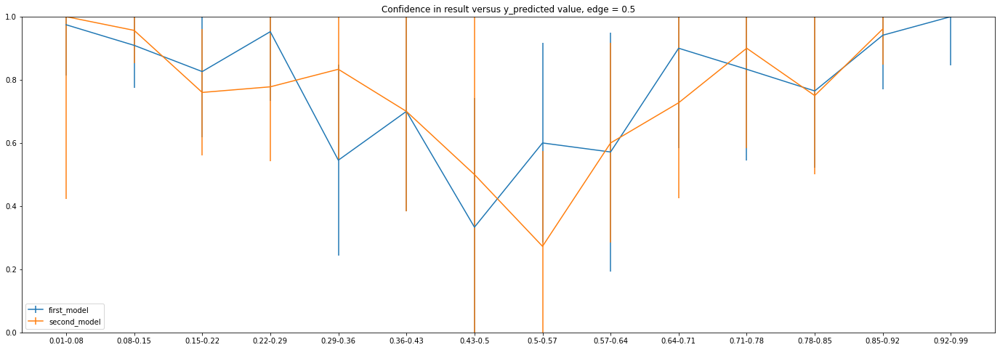

In [ ]:
confidence_plot(log_log_models,fake_log_log_model,y)

It looks like we are very sure of our 0.01-0.08 and 0.92-0.99 so our model is better. It doesn't have an effect on accuracy or sensitivity, though.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


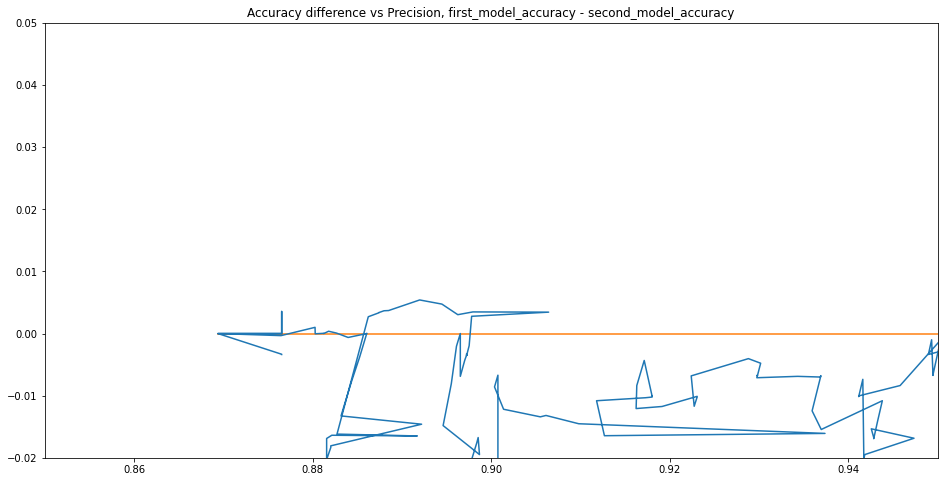

In [ ]:
sensitivitys,sensitivitys_err,accuracy_deltas,accuracy_deltas_err = sensitivity_delta_accuracy(log_model1,fake_log_log_model,sensitivity_range=[0.85,0.95],accuracy_delta_range=[-0.02,0.05],ymin=0.1)

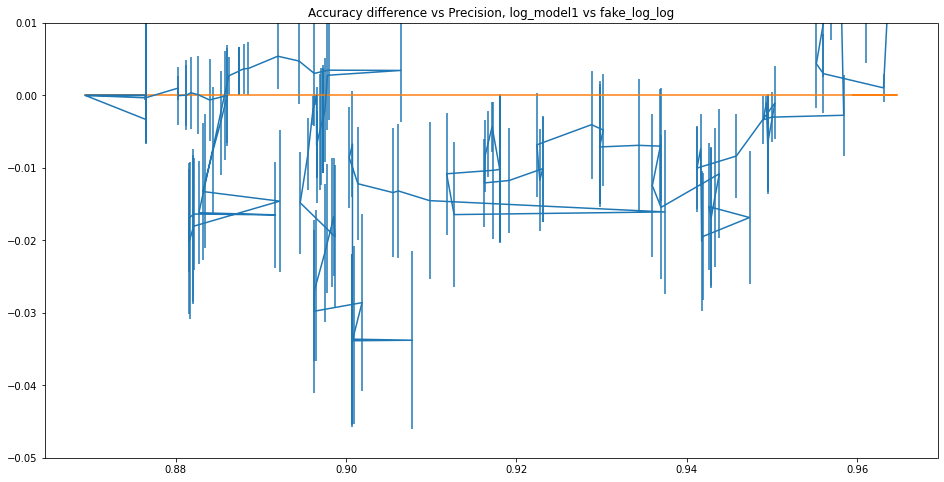

In [ ]:
plt.errorbar(sensitivitys,accuracy_deltas,yerr=accuracy_deltas_err)
plt.title(f"Accuracy difference vs Sensitivity, log_model1 vs fake_log_log") 
plt.plot(sensitivitys,0*np.ones_like(sensitivitys))
plt.ylim([-0.05,0.01])
plt.show()
plt.close()

We see here that fake_log_log_model is also able to be 4% better than log_model1 but only at 0.90 sensitivity, not 0.92. However, it is a bit better for all sensitivitys until 0.96, log_log_models was only better until 0.92.

We should calculate the adjusted p-value for this at 0.90 and 0.92. 4% is good but the error bar is also high. Looks like for the 0.90 fake_log_log_model we have 3 sigma at 3.5% and for the 0.92 log_log_model we have 3.5 sigma at 4.5%. For the difference between fake_log_log and log_log we have nothing at 0.90 and 4% with unknown sigma.

I used step = 0.0025,ymin=0.1,ymax=0.5, so that is 160 points. The p-value for 3.5 sigma is 4.653*10^-4 and so it's adjust p-value is 

In [ ]:
4.653*10**(-4)*160

0.074448

0.074448 which is not significant.

The p-value for 4.5 sigma is 6.795*10^-6, so it's adjusted p-value is 

In [ ]:
6.795*10**(-6)*160

0.0010872

which is significant at 3.27 sigma.

However, the log_log_model is NOT significant over the fake_log_log_model. So that's strange, the log_log_model is significant over log_model1, the fake_log_log_model is not significant over log_model1 but the log_log_model is not significant over the fake_log_log_model. Actually it's not strange, it just means that the fake_log_log_model is in between the log_log_model and the log_model1. 

The picture we have is that adding the 2 other models and doing another logistic regression together were significant. Just doing another logistic regression was not significant but also not insignificant.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


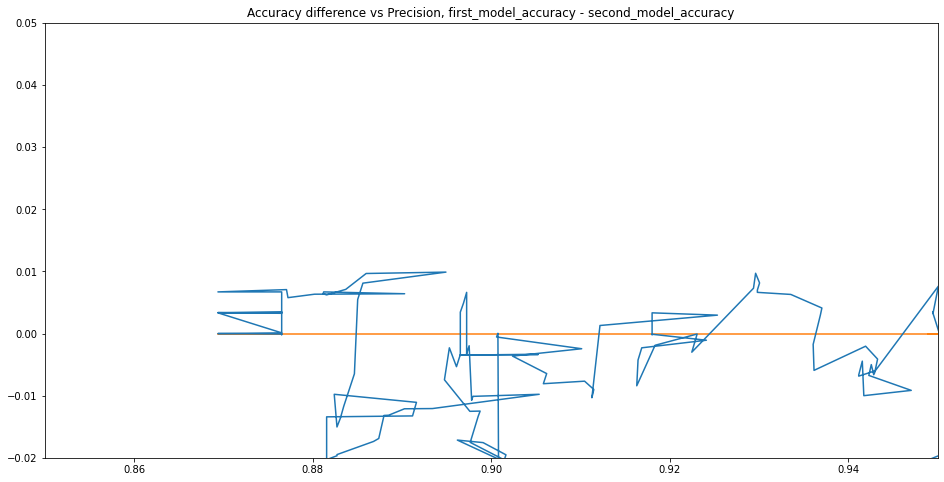

In [ ]:
sensitivitys,sensitivitys_err,accuracy_deltas,accuracy_deltas_err = sensitivity_delta_accuracy(log_model1,log_lin_models,sensitivity_range=[0.85,0.95],accuracy_delta_range=[-0.02,0.05],ymin=0.1)

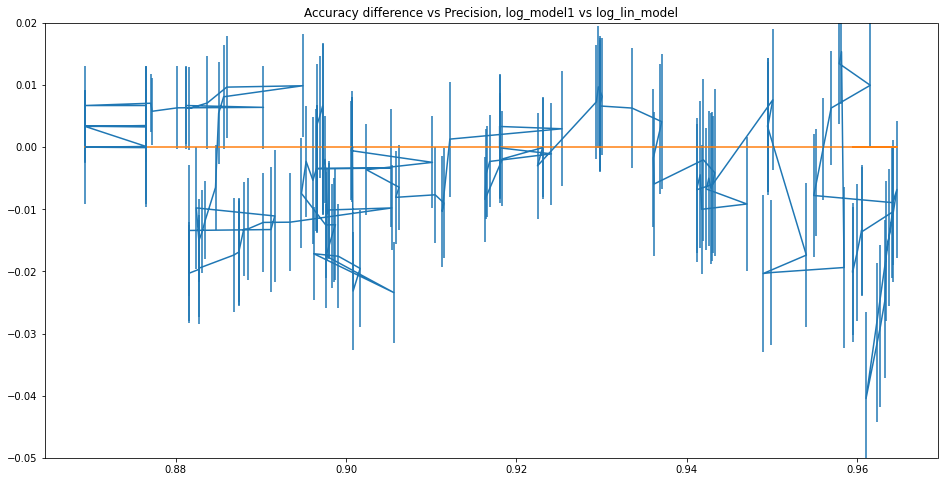

In [ ]:
plt.errorbar(sensitivitys,accuracy_deltas,yerr=accuracy_deltas_err)
plt.title(f"Accuracy difference vs Sensitivity, log_model1 vs log_lin_model") 
plt.plot(sensitivitys,0*np.ones_like(sensitivitys))
plt.ylim([-0.05,0.02])
plt.show()
plt.close()

log_model1 is not better than log_lin_model so maybe I should use that one. Also log_lin_model is better than log_model1 for sensitivity = 0.96. It's only 3 sigma so it will be less than 2 sigma adjusted.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


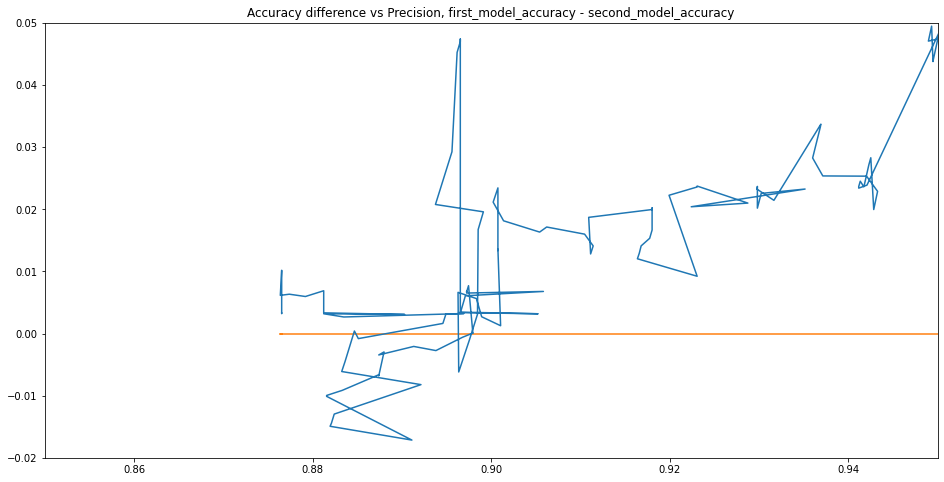

In [ ]:
sensitivitys,sensitivitys_err,accuracy_deltas,accuracy_deltas_err = sensitivity_delta_accuracy(log_model1,lin_log_models,sensitivity_range=[0.85,0.95],accuracy_delta_range=[-0.02,0.05],ymin=0.1)

log_model1 is a lot better than lin_log_models! lin_log_models is really such a bad model. The loading scores that make a good linear model must be completely different from the loading scores for a logistic regression.

We know that log_lin_models is not really significant. Now we have to find out if it is insignificant.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


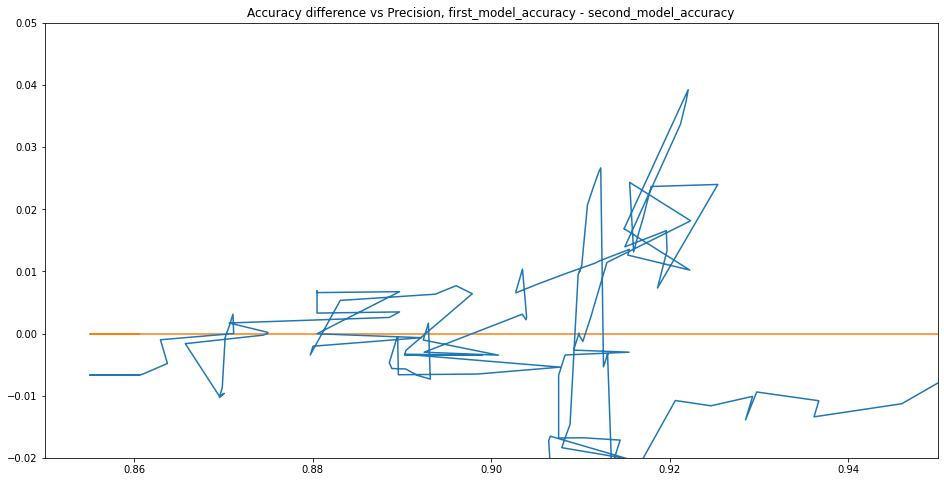

In [ ]:
sensitivitys,sensitivitys_err,accuracy_deltas,accuracy_deltas_err = sensitivity_delta_accuracy(log_log_models,log_lin_models,sensitivity_range=[0.85,0.95],accuracy_delta_range=[-0.02,0.05],ymin=0.1)

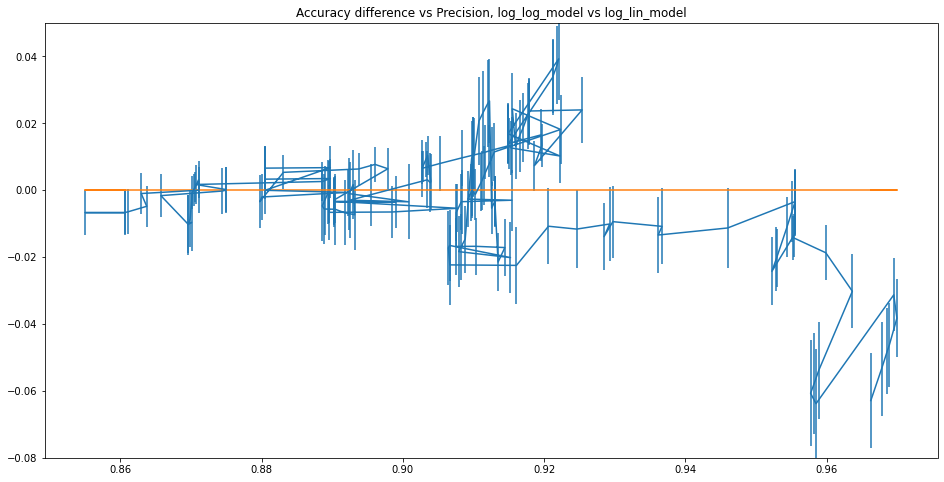

In [ ]:
plt.errorbar(sensitivitys,accuracy_deltas,yerr=accuracy_deltas_err)
plt.title(f"Accuracy difference vs Sensitivity, log_log_model vs log_lin_model") 
plt.plot(sensitivitys,0*np.ones_like(sensitivitys))
plt.ylim([-0.08,0.05])
plt.show()
plt.close()

At 0.92, the log_log_model is only 3.2 sigma different which is not significant when adjusted. So the log_lin_model is not insignificant.

In [ ]:
accuracy_deltas_err[:5]

[0.014283713796573682,
 0.014039070529023845,
 0.01278961630860348,
 0.012531088464497978,
 0.011614574213397618]

In [ ]:
accuracy_deltas[:5]

[-0.0628888888888889,
 -0.05344444444444445,
 -0.04811111111111112,
 -0.04629629629629631,
 -0.038259259259259264]

In [ ]:
0.0628888888888889/0.014283713796573682

4.402838770402584

At 0.96, log_lin_models is significantly better than log_log_models.

In [ ]:
1.083*10**(-5)*160

0.0017328000000000003

adjusted p-value which is 3.14 sigma.

The story is the following: log_model1 is what we call the 'baseline'. From here, we look at two directions: another logistic regression and adding the other two models. Doing both is significant at a sensitivity of 0.92. Just logistic regression was not significant and not insignificant at all sensitivitys. Just adding the models was also not significant at all sensitivitys and not insignificant at all sensitivitys. So the the baseline is on the bottom at 0.92 and the log_log_model is on the top. The other two models are in between and not really 'different' from either the baseline or the 'alternative'.

We have another story which is what is happening at sensitivity = 0.96. Here just the models (log_lin_models) is significant over the log_log_models but not over the log_model1. That means that log_log_models is at the bottom and log_lin_models is at the top with log_model1 in between. Here accuracy is about 70%.

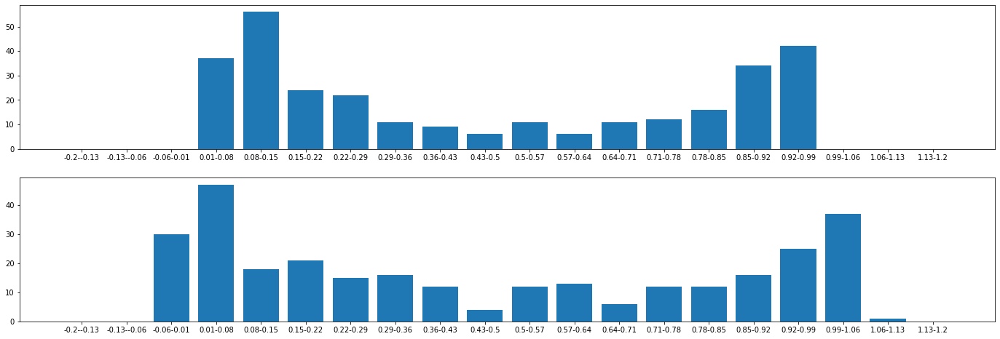

In [ ]:
population_y_predicted(log_log_models,log_lin_models)

That's interesting. The log_log_model is really pushed in and the log_lin_model is not. I think maybe the log_lin_model has a better McFadden R^2.

Looks like it's not clear which way to go. The log_log_model does a lot better for 0.92 but that's giving up something at 0.96 that the log_lin_model catches. The log_lin_model on its own is not significant over the log_model1 so we can't use it. 

I'm not sure that's true because even though log_log may have a better R^2 because it goes in further it gets caught by the egde earlier and punished.

You don't want to require 96% sensitivity because then all your 0.1 chance people get told they have it and that makes your accuracy a lot worse. You just can't get 96% here (and if you do you should use log_lin which leaves them further out). The question is always how far can you go before the accuracy goes down a lot.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:372: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:373: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:373: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:374: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


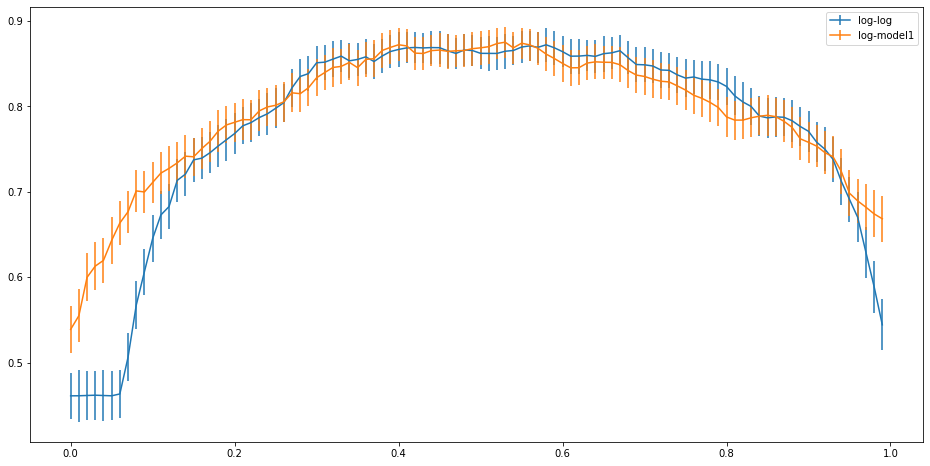

In [ ]:
means1 = []
errors1 = []
means2 = []
errors2 = []
for i in np.arange(0.0,1.0,0.01):
  _,_,numbers = loading_scores(log_log_models,y,pad=False,show=False,edge=np.round(i,2))
  mean1 = numbers[0]
  error1 = numbers[1]
  means1.append(mean1)
  errors1.append(error1)
  _,_,numbers = loading_scores(log_lin_models,y,pad=False,show=False,edge=np.round(i,2))
  mean2 = numbers[0]
  error2 = numbers[1]
  means2.append(mean2)
  errors2.append(error2)


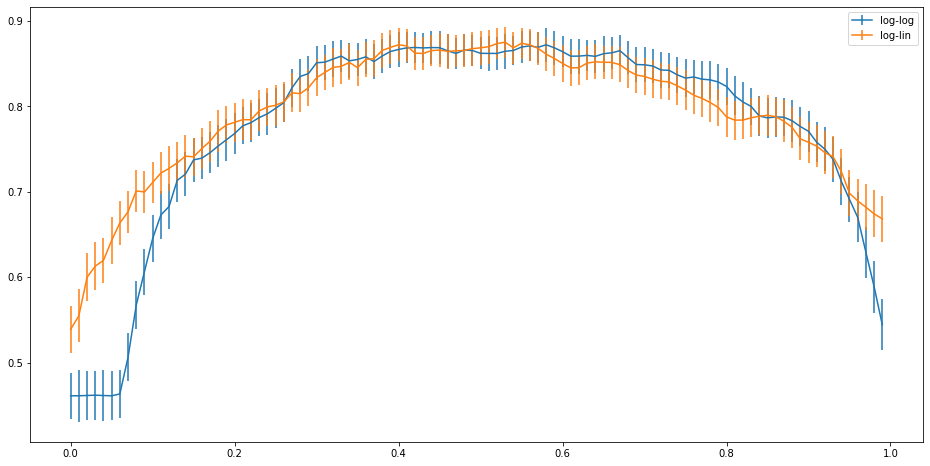

In [ ]:
plt.figure()
plt.errorbar([round(i,2) for i in np.arange(0.0,1.0,0.01)],means1,yerr=errors1,label="log-log")
plt.errorbar([round(i,2) for i in np.arange(0.0,1.0,0.01)],means2,yerr=errors2,label='log-lin')
plt.legend()
plt.show()
plt.close()

It's like I said. The 0.1 people all get told they have it which makes your accuracy worse. It may be best not to go much below edge = 0.3.

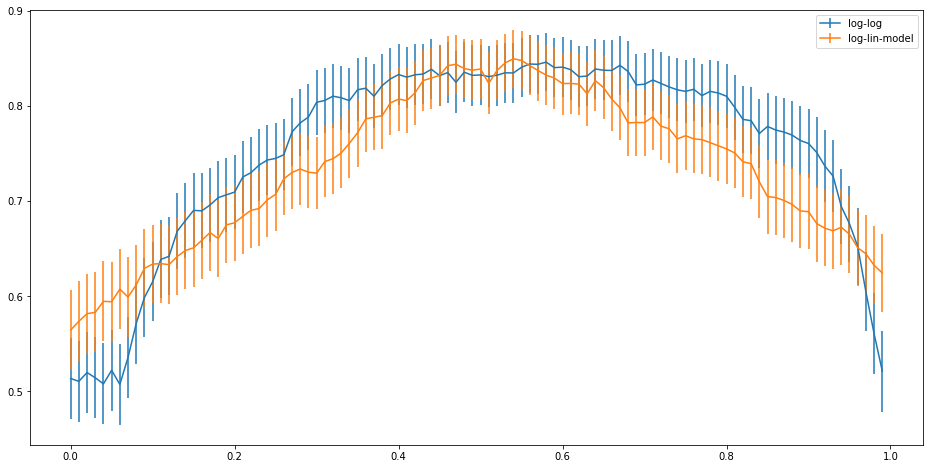

In [ ]:
means1 = []
errors1 = []
means2 = []
errors2 = []
for i in np.arange(0.0,1.0,0.01):
  _,_,numbers = loading_scores(log_log_models,y,pad=False,show=False,edge=np.round(i,2))
  mean1 = numbers["Sensitivity"]
  error1 = numbers["Sensitivity_Error"]
  means1.append(mean1)
  errors1.append(error1)
  _,_,numbers = loading_scores(models,y,pad=False,show=False,edge=np.round(i,2))
  mean2 = numbers["Sensitivity"]
  error2 = numbers["Sensitivity_Error"]
  means2.append(mean2)
  errors2.append(error2)

plt.figure()
plt.errorbar([round(i,2) for i in np.arange(0.0,1.0,0.01)],means1,yerr=errors1,label="log-log")
plt.errorbar([round(i,2) for i in np.arange(0.0,1.0,0.01)],means2,yerr=errors2,label='log-lin-model')
plt.legend()
plt.show()
plt.close()

Here is half of the effect. The other half is due to model2 and model3 which is why it is not significant on its own. We were lucky that logistic regression over SVD already has an effect. Otherwise, the effect of adding model2 and model3 alone would not have been significant.

I'm not happy that log_lin_models isn't better than log_model1. Now I always have two things together and I can't say which one has the bigger effect - the logistic regression or adding the other models.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


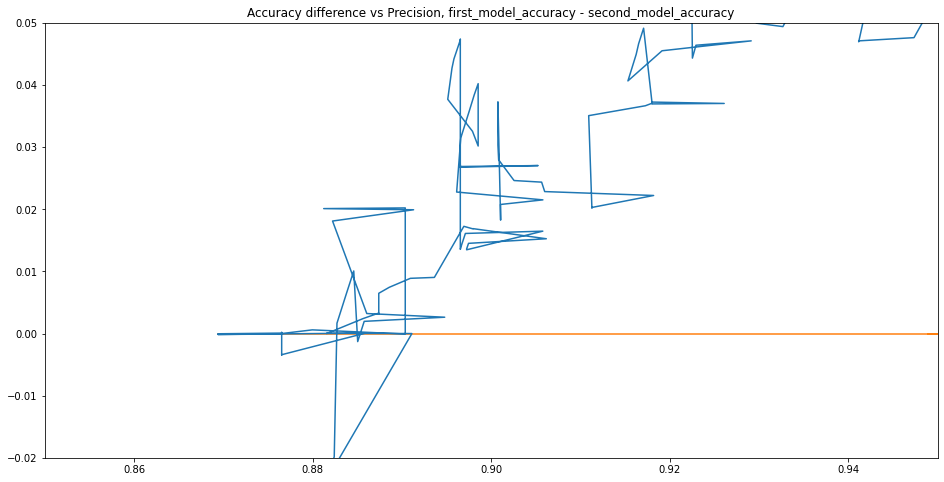

In [ ]:
sensitivitys,sensitivitys_err,accuracy_deltas,accuracy_deltas_err = sensitivity_delta_accuracy(log_model1,models,sensitivity_range=[0.85,0.95],accuracy_delta_range=[-0.02,0.05],ymin=0.1)

I just wanted to make sure but yes, at least one logistic regression is required.

The last interesting thing is the McFadden R^2.

Actually what we want is not the McFadden but the Efron R^2. This is the same as the r2_score from sklearn between y_pred and y. McFadden is a bit different and wrong I think because it doesn't have the correct saturated model.

To-do today:

*   why is the fake log log model better than the log-model1? It is the same x and the same y on the accuracy-sensitivity axes. It makes no sense.
*   r^2
*   accuracy_sensitivity
*   how can I tell the logistic regression that I want an edge of 0.3? It will change the likelihood so it will change the fit.

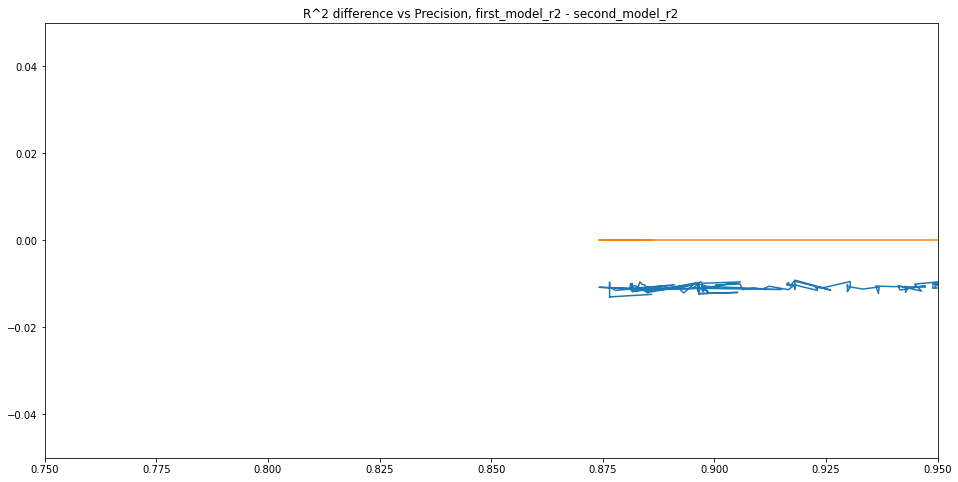

In [ ]:
sensitivitys,sensitivitys_err,r2_deltas,r2_deltas_err = sensitivity_delta_r2(log_model1,log_lin_models,ymin=0.1)

The R^2 doesn't depend on edge, correct? No, because it takes the y_pred probability and doesn't look at the 0 or 1.

In [ ]:
delta_r2(log_model1,log_log_models)

'R^2 of model 1 - R^2 of model 2 = -0.00931535837283172+-0.013853421977499007'

In [ ]:
delta_r2(log_lin_models,log_log_models)

'R^2 of model 1 - R^2 of model 2 = -0.0020954928164626033+-0.007408568832711822'

In [ ]:
delta_r2(log_model1,log_model2)

'R^2 of model 1 - R^2 of model 2 = 0.2848892339972375+-0.057424430545269856'

In [ ]:
delta_r2(log_model1,models)

'R^2 of model 1 - R^2 of model 2 = 0.02799448587014356+-0.016217532013331915'

In [ ]:
delta_r2(log_model1,model1)

'R^2 of model 1 - R^2 of model 2 = 0.03699621456280464+-0.014075385105591035'

In [ ]:
delta_r2(log_model1,log_lin_models)

'R^2 of model 1 - R^2 of model 2 = -0.009551243314692866+-0.007568803937125804'

In [ ]:
delta_r2(log_model1,fake_log_log_model)

'R^2 of model 1 - R^2 of model 2 = 0.0013509554399817546+-0.006091985218651905'

In [ ]:
delta_r2(lin_log_models,log_lin_models)

'R^2 of model 1 - R^2 of model 2 = -0.010703832366815182+-0.010653516026614658'

In the end, the only real effect was doing a logistic regression. Adding the other models didn't help?

In [ ]:
delta_r2(model1,models)

'R^2 of model 1 - R^2 of model 2 = -0.015203436416592381+-0.010215896438872102'

Adding the models alone is not significant for R^2.

This is all not strange because we know the models are all the same at edge = 0.5. I wish there was a batch-R^2.

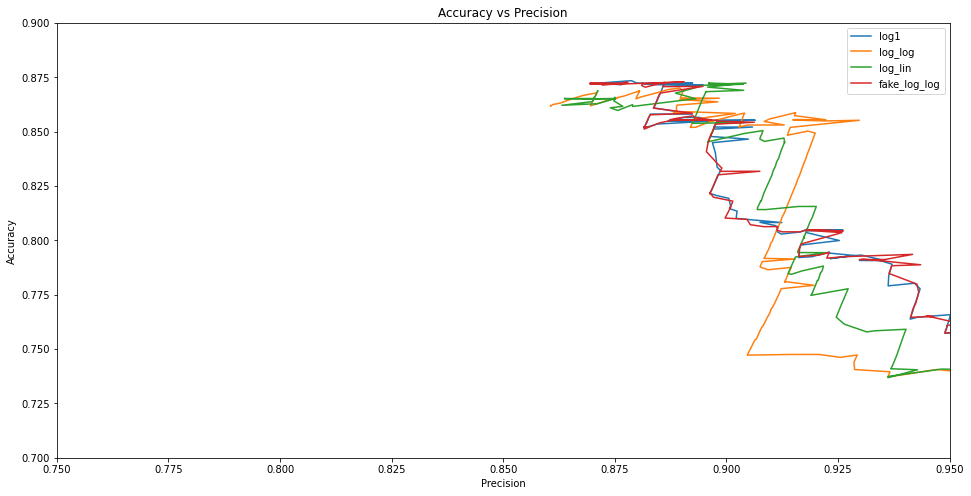

In [ ]:
all_sensitivitys,all_sensitivitys_err,all_accuracies,all_accuracies_err = sensitivity_accuracy(log1 = log_model1, log_log = log_log_models, log_lin = log_lin_models, fake_log_log = fake_log_log_model)

I'm so happy to see that log_model1 and fake_log_log are the same! That makes it a lot easier for me. I don't know why they looked so different before. Must be because of edge??

Log_log really does a good job up to 0.925 and then falls. That makes sense because it only changes values close to the middle, small changes are not included by the log. Log_lin, however, changes all values a bit so it goes out to higher sensitivity.

I have bad news. When looking at the 4.5 sigma difference for log_log_models over log_model1, I only looked at the yerr. But the xerr is very large! Looking above, it could really change the outcome.

In [ ]:
all_sensitivitys_err

{'fake_log_log': 0.022741007515370542,
 'log1': 0.023382247300965987,
 'log_lin': 0.02459906525033191,
 'log_log': 0.02364767417612041}

There is a bug. But is that every point? That would be the end :-( There should be a delta_sensitivity?

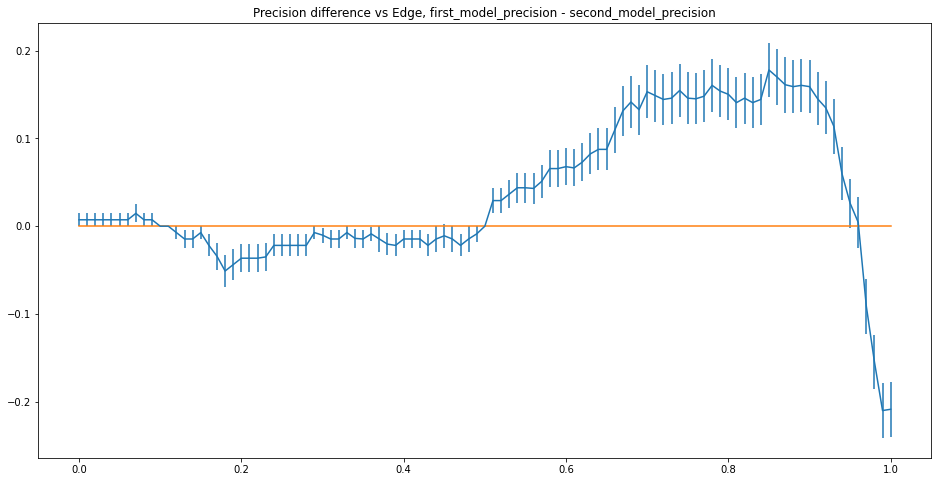

In [ ]:
sensitivity_delta,sensitivity_delta_err = delta_sensitivity(log_log_models,models,ymin=0.0,ymax=1.0)

I don't know why it looks like this but if the errors are 0.01 like it looks like then we only have 2 sigma in the sensitivity direction which will disappear when we do adjusted p-values.

WOW! The default estimator function is baked in. If you change it, it won't work. You need to 'restart the runtime'.

I don't know why it would NOT be 0.01 because it's about 0.01 in the accuracy.

The problem is that the sensitivity only looks at where y=1. So each cross-correlation has different 'sample size'. Some have 10, some have 0. For accuracy, this was not a problem.

How do you do standard deviation on errors with different sample size? I think I have to go back to the 1 and 0 data points and go from there.

In [ ]:
sensitivity_delta_err

[0.007272191272466723,
 0.0,
 0.0,
 0.007271996095631989,
 0.01032272673265033,
 0.012626979623483225,
 0.014543601827117326,
 0.016009977326021434,
 0.014374367993429902,
 0.014374367993429902,
 0.014374367993429902,
 0.012496363093264632,
 0.014542430671805832,
 0.015541958778363105,
 0.014542040265742007,
 0.012626305171392576,
 0.012626305171392576,
 0.013217975663770424,
 0.014598540145985403,
 0.016308875828506826,
 0.016308875828506826,
 0.014540868984658733,
 0.014540868984658733,
 0.013217660905450523,
 0.012625855516649862,
 0.016308614739587526,
 0.016308614739587526,
 0.014539697609220036,
 0.014539697609220036,
 0.017565295280683648,
 0.017879487173599835,
 0.016308353646488312,
 0.016308353646488312,
 0.016308353646488312,
 0.01783083801330993,
 0.01453813562848725,
 0.013390362854099757,
 0.012625181004508096,
 0.012483067091446517,
 0.012483067091446517,
 0.012483067091446517]

These look about 0.014 and we only have 0.25 in the sensitivity direction so less than 2 sigma.

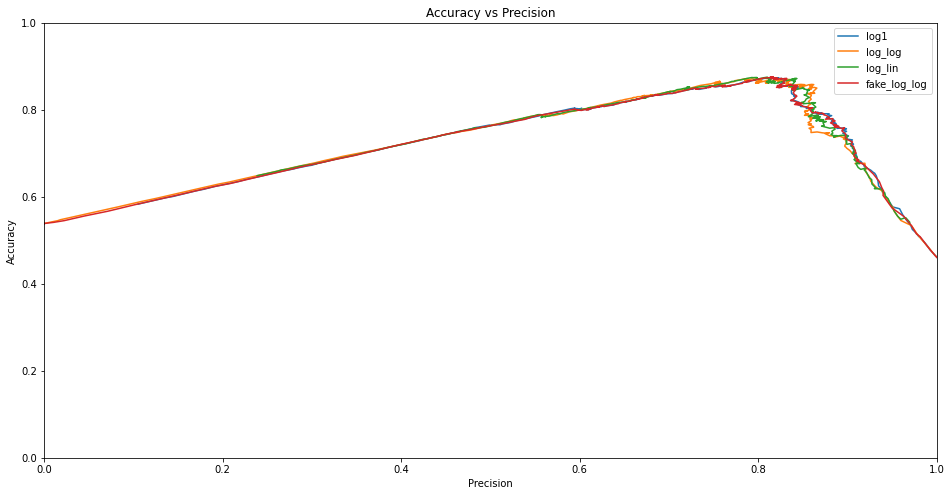

In [ ]:
all_sensitivitys,all_sensitivitys_err,all_accuracies,all_accuracies_err,all_edges = sensitivity_accuracy(log1 = log_model1, log_log = log_log_models, log_lin = log_lin_models, fake_log_log = fake_log_log_model,ymin=0.0,ymax=1.0,sensitivity_range=[0.0,1.0],accuracy_range=[0.0,1.0])

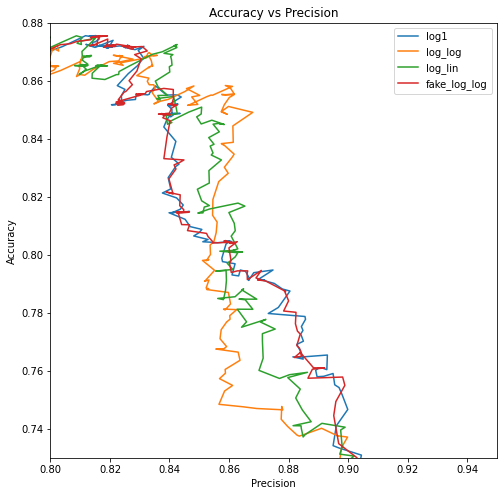

In [ ]:
fig = plt.figure(figsize=(8,8))
for i in all_sensitivitys.keys():
  sensitivitys = all_sensitivitys[i]
  accuracies = all_accuracies[i]
  plt.errorbar(sensitivitys,accuracies,label = i)
  plt.title(f"Accuracy vs Sensitivity")
  plt.xlim([0.8,0.95])
  plt.ylim([0.73,0.88])
  plt.xlabel("Sensitivity")
  plt.ylabel("Accuracy")
  plt.legend()
plt.show()
plt.close()
  

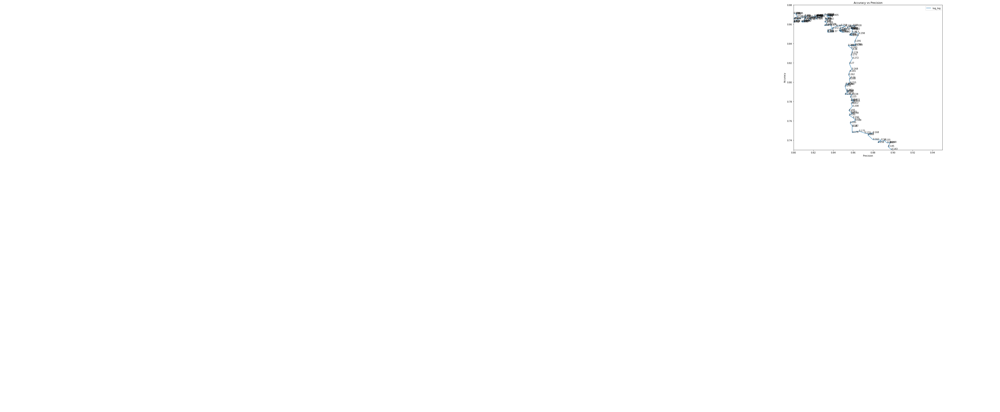

In [ ]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
i = 'log_log'
sensitivitys = all_sensitivitys[i]
accuracies = all_accuracies[i]
plt.errorbar(sensitivitys,accuracies,label = i)
plt.title(f"Accuracy vs Sensitivity")
plt.xlim([0.8,0.95])
plt.ylim([0.73,0.88])
plt.xlabel("Sensitivity")
plt.ylabel("Accuracy")
plt.legend()

for j, edge in enumerate(all_edges[i]):
    ax.annotate(np.round(edge,3), (sensitivitys[j], accuracies[j]))

plt.show()
plt.close()
  

Interesting. Everything between edge 0.178 and 0.298 has b_test = 0. Everything above 0.30 and below 0.18 has some of both.  

log_log


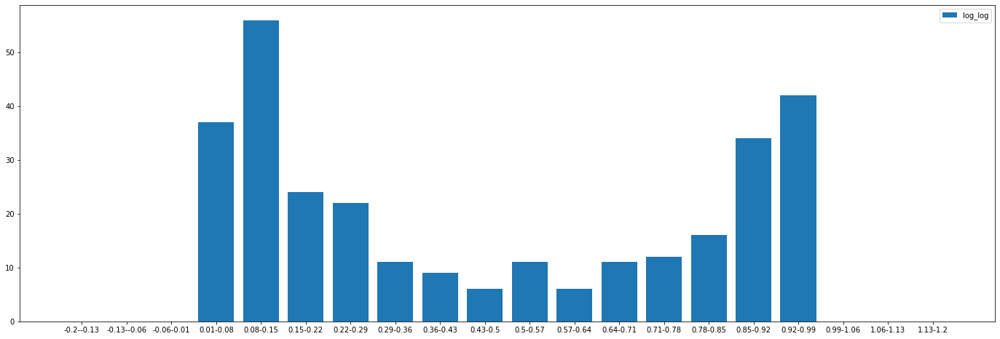

log1


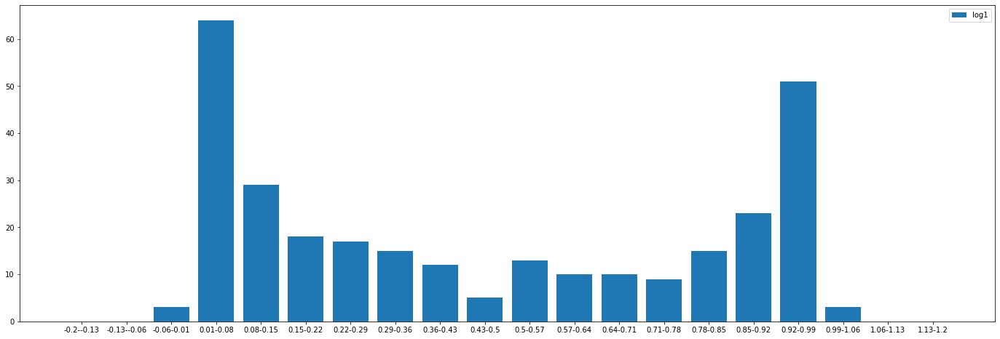

In [ ]:
population_y_predicted(log_log = log_log_models,log1 = log_model1)

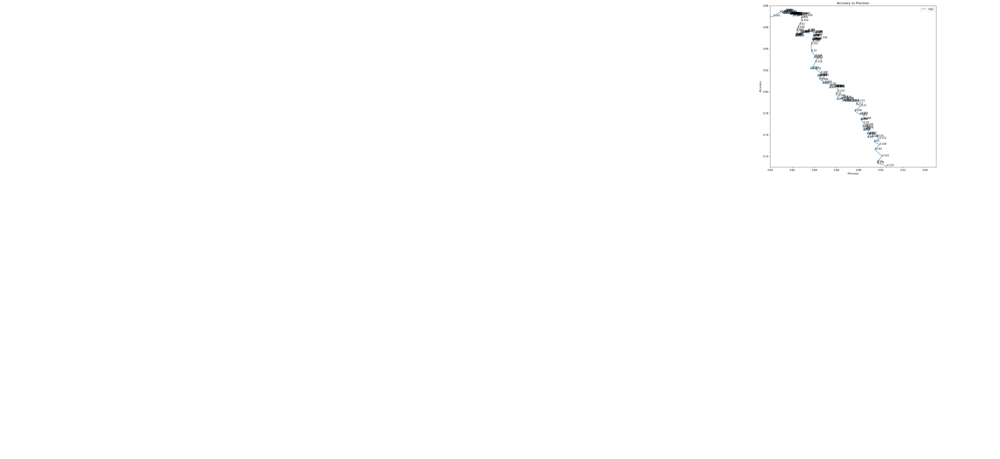

In [ ]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
i = 'log1'
sensitivitys = all_sensitivitys[i]
accuracies = all_accuracies[i]
plt.errorbar(sensitivitys,accuracies,label = i)
plt.title(f"Accuracy vs Sensitivity")
plt.xlim([0.8,0.95])
plt.ylim([0.73,0.88])
plt.xlabel("Sensitivity")
plt.ylabel("Accuracy")
plt.legend()

for j, edge in enumerate(all_edges[i]):
    ax.annotate(np.round(edge,3), (sensitivitys[j], accuracies[j]))

plt.show()
plt.close()

I get much less separation for log_model1. Should I say that those data are 'bad data' because they have y_pred between 0.18 and 0.30 but actually, they all have y = 0? Together they are 10% of our data. So model2 and model3 helped 'cluster our bad data' but they didn't push it to y_predicted = 0 like they should have. If they had, I could have had 90% sensitivity with 85% accuracy.

Maybe because model2 realized model1 was wrong for lots of the data between 0.15 and 0.45 it divided it into two parts, 0.45 - 0.30 and 0.15 - 0.30. 0.30-0.45 is actually 1 and 0.15-0.30 is actually 0. Because it's loading score is low, it can't do more. It can't actually make the numbers 0 and 1 so it creates these 'micro-divisions'. 

How do we give model2 the power to actually make 0.30-0.45 -> 1 and 0.15-0.30 -> 0?

Is it 'neural networks' with 'back-propagation'?

Or maybe we should have different loading scores for y_pred between 0.15 and 0.45 and elsewhere.

Maybe we can do 0-0.5 and 0.5-1.0.

In [ ]:
log_model1_upper_half = log_model1[log_model1>=0.5]
log_model2_upper_half = log_model2[log_model1>=0.5]
log_model3_upper_half = log_model3[log_model1>=0.5]
log_model1_lower_half = log_model1[log_model1<0.5]
log_model2_lower_half = log_model2[log_model1<0.5]
log_model3_lower_half = log_model3[log_model1<0.5]
y_upper_half = y[log_model1>=0.5]
y_lower_half = y[log_model1<0.5]

In [ ]:
(log_models_upper_half_df @ log_log_upper_half_scores_t + log_log_upper_half_average_t * np.ones_like(y_upper_half)).describe()

count    134.000000
mean       2.029780
std        0.515411
min        0.898974
25%        1.680066
50%        2.172419
75%        2.422577
max        2.780801
dtype: float64

Accuracy (test)= 0.874+-0.0288
Acuracy (train)= 0.8731+-0.001
Efron's R^2 (test)= -0.0252+-0.0334
Efron's R^2 (train)= 0.1039+-0.0016
Precision = 1.0+-0.0


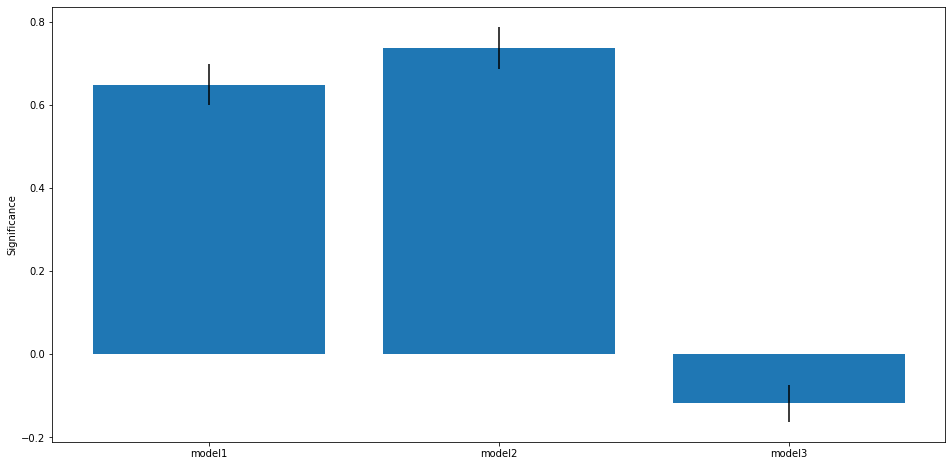

Accuracy (test)= 0.8759+-0.0257
Acuracy (train)= 0.8773+-0.0009
Efron's R^2 (test)= -0.0489+-0.0244
Efron's R^2 (train)= 0.0346+-0.0007
Precision = 0.0+-0.0


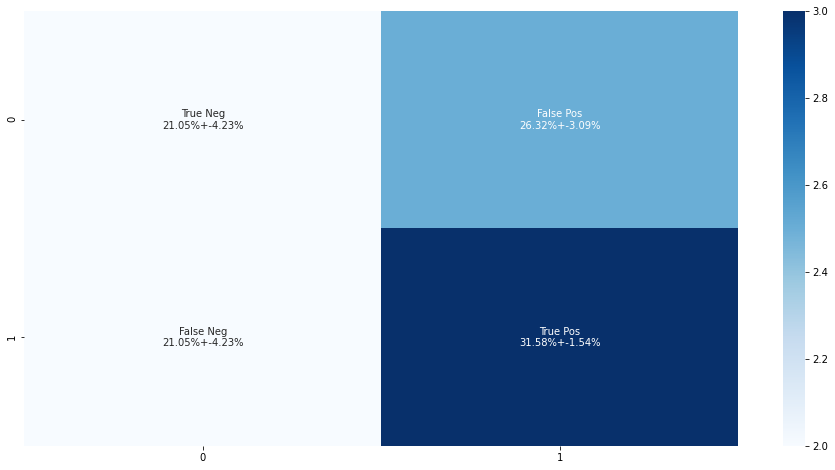

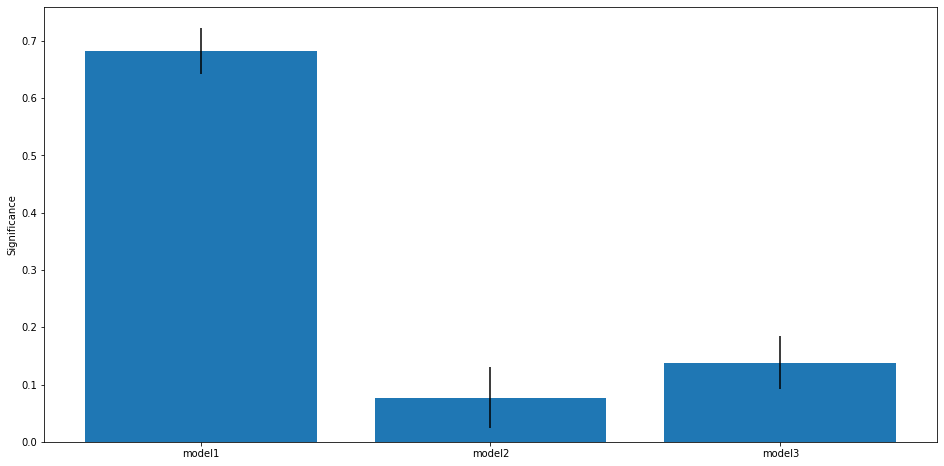

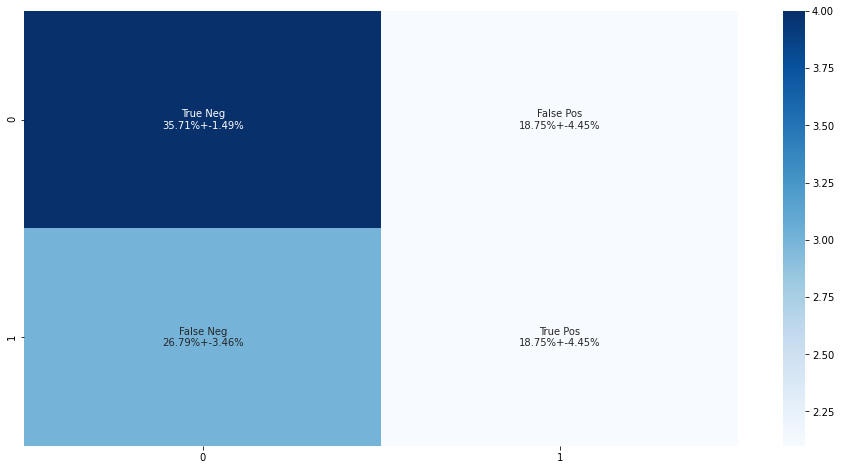

In [ ]:
warnings.filterwarnings('ignore')
log_models_upper_half_df = pd.DataFrame({'model1': log_model1_upper_half,'model2': log_model2_upper_half,'model3': log_model3_upper_half})
log_log_upper_half_scores_t,log_log_upper_half_average_t,_ = loading_scores(log_models_upper_half_df,y_upper_half,estimator = logistic_estimator,pad=True)
log_models_lower_half_df = pd.DataFrame({'model1': log_model1_lower_half,'model2': log_model2_lower_half,'model3': log_model3_lower_half})
log_log_lower_half_scores_t,log_log_lower_half_average_t,_ = loading_scores(log_models_lower_half_df,y_lower_half,estimator = logistic_estimator,pad=True)
log_log_upper_half_models = (log_models_upper_half_df @ log_log_upper_half_scores_t + log_log_upper_half_average_t * np.ones_like(y_upper_half)).apply(lambda row: sigmoid(row))
log_log_lower_half_models = (log_models_lower_half_df @ log_log_lower_half_scores_t + log_log_lower_half_average_t * np.ones_like(y_lower_half)).apply(lambda row: sigmoid(row))


In [ ]:
log_model1_upper_half.describe()

count    134.000000
mean       0.829685
std        0.151960
min        0.502910
25%        0.715030
50%        0.882046
75%        0.956711
max        0.994175
dtype: float64

In [ ]:
log_log_upper_half_models.describe()

count    134.000000
mean       0.873247
std        0.060554
min        0.710739
25%        0.842910
50%        0.897745
75%        0.918532
max        0.941630
dtype: float64

In [ ]:
log_log_lower_half_models.describe()

count    163.000000
mean       0.122580
std        0.026753
min        0.088073
25%        0.100675
50%        0.116236
75%        0.140653
max        0.211883
dtype: float64

We still don't get any 0's to become 1's or 1's to become 0's. Let's do 10 'folds'.

122
Accuracy (test)= 0.9173+-0.0243
Acuracy (train)= 0.918+-0.0008
Efron's R^2 (test)= -0.0669+-0.0249
Efron's R^2 (train)= 0.0055+-0.0001
Precision = 0.0+-0.0


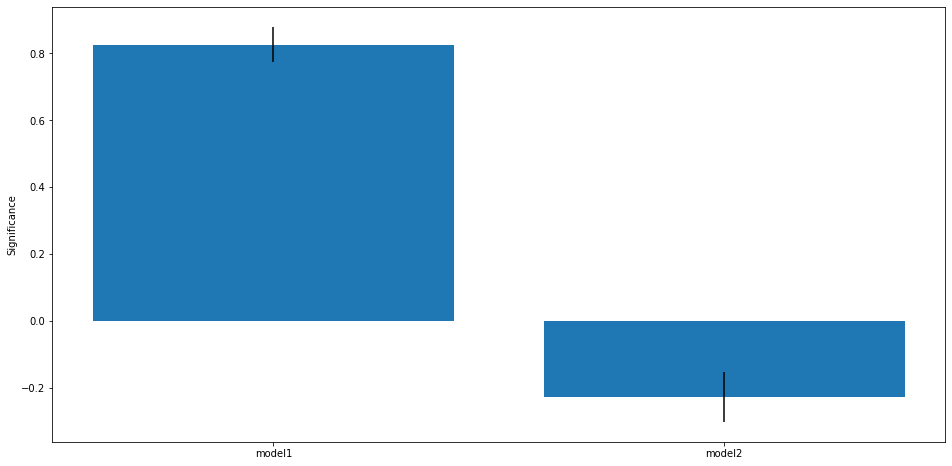

41
Accuracy (test)= 0.7583+-0.0691
Acuracy (train)= 0.7561+-0.0022
Efron's R^2 (test)= nan+-nan
Efron's R^2 (train)= 0.0086+-0.0007
Precision = 0.0+-0.0


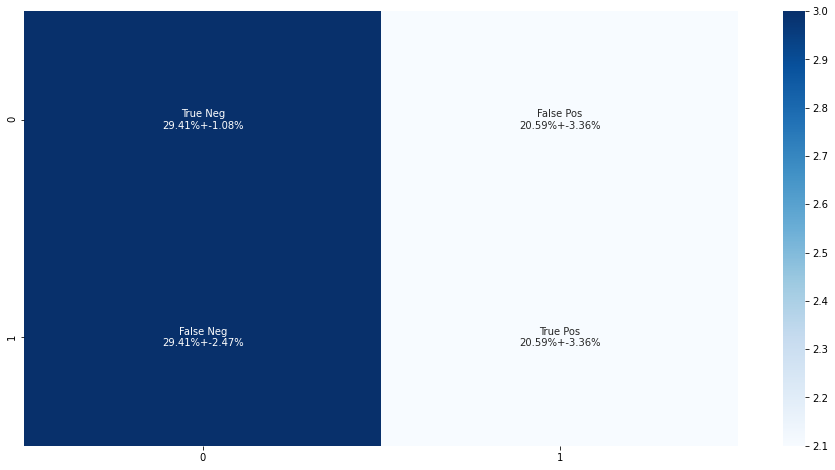

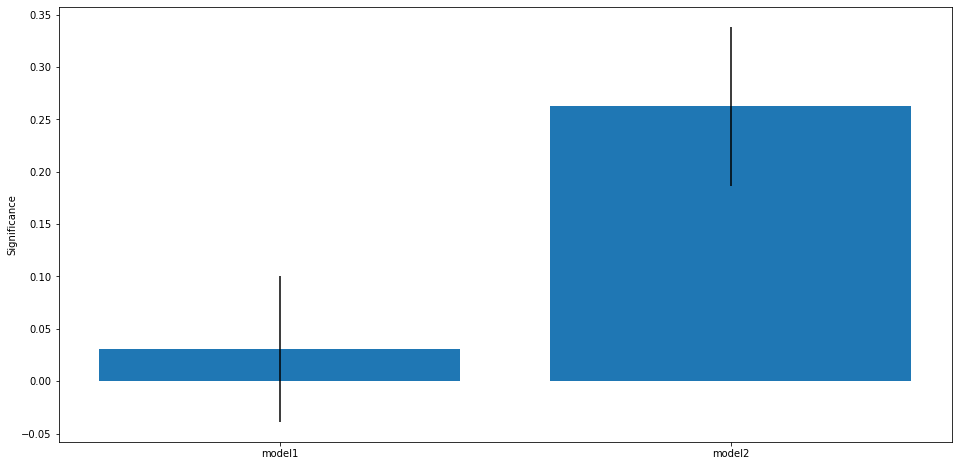

40
Accuracy (test)= 0.745+-0.0723
Acuracy (train)= 0.75+-0.0023
Efron's R^2 (test)= nan+-nan
Efron's R^2 (train)= 0.0462+-0.0017
Precision = 1.0+-0.0


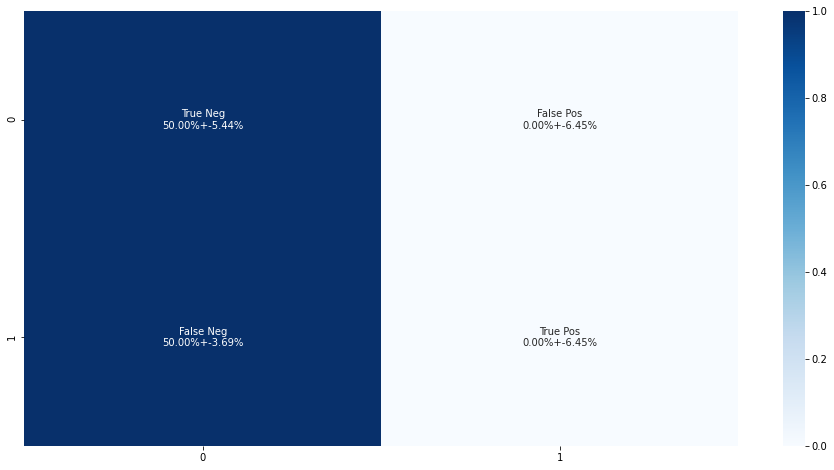

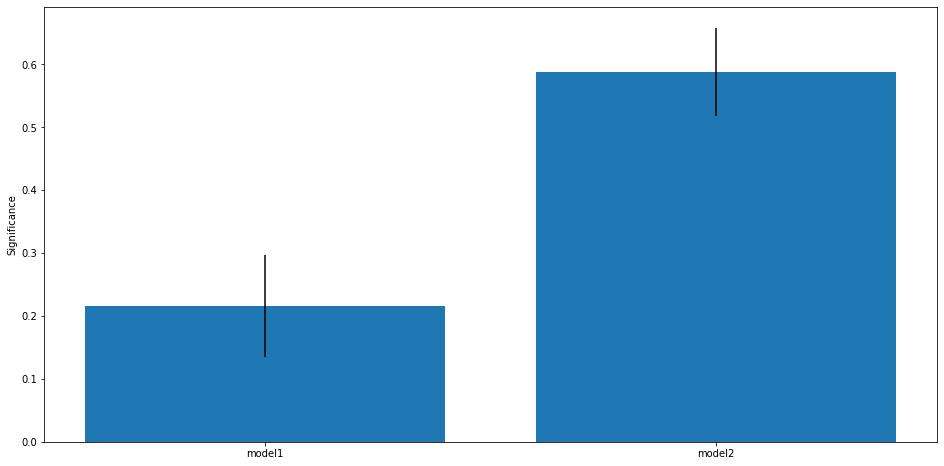

94
Accuracy (test)= 0.9272+-0.026
Acuracy (train)= 0.9255+-0.0009
Efron's R^2 (test)= -0.0684+-0.0296
Efron's R^2 (train)= 0.0397+-0.001
Precision = 1.0+-0.0


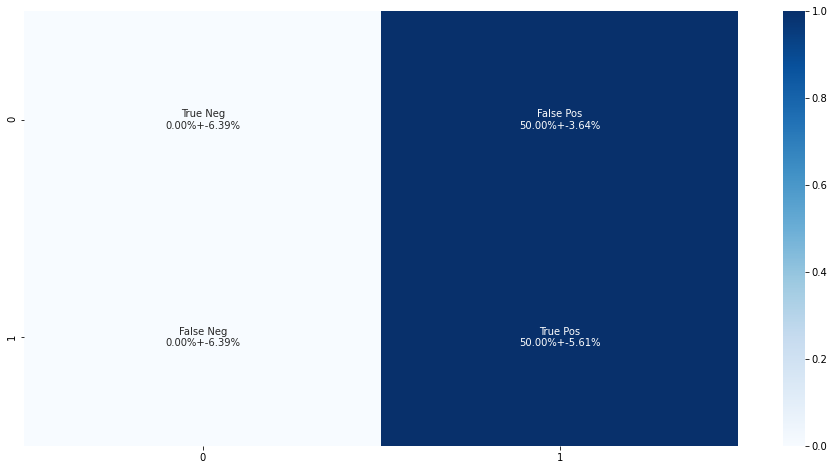

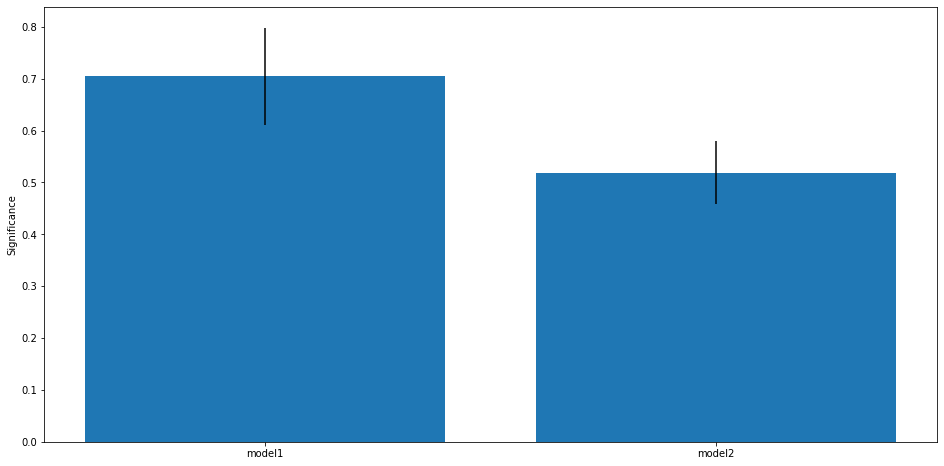

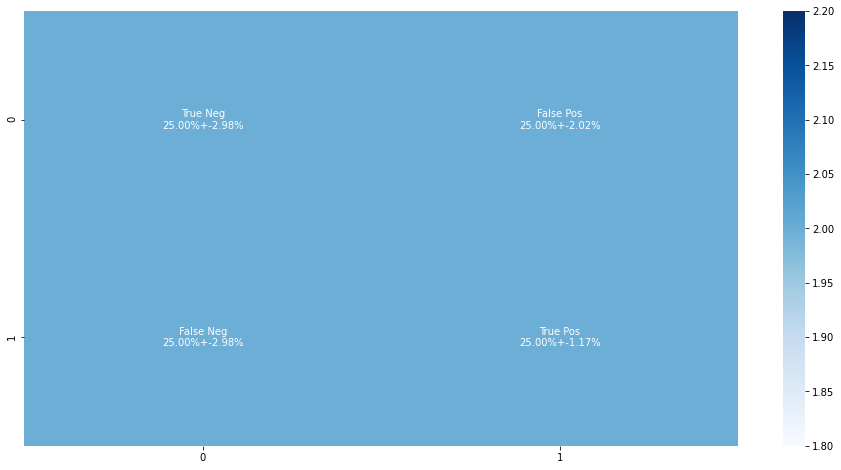

In [ ]:
warnings.filterwarnings('ignore')
step = 0.25
log_model1_partitions = []
log_model2_partitions = []
log_model3_partitions = []
y_partitions = []
log_models_partition_df = []
log_log_partitions = []
log_log_partition_scores_t,log_log_partition_average_t = [],[]
for i in np.arange(0,1.0,step):
  abc = (log_model1<=i+step) & (log_model1>i)
  abc1 = log_model1[abc]
  log_model1_partitions.append(abc)
  abc2 = log_model2[abc]
  log_model2_partitions.append(abc2)
  abc3 = log_model3[abc]
  log_model3_partitions.append(abc3)
  yy = y[abc]
  y_partitions.append(yy)
  print(len(yy))
  abc_df = pd.DataFrame({'model1': abc1,'model2': abc2})
  log_models_partition_df.append(abc_df)
  abc_scores,abc_average,_ = loading_scores(abc_df,yy,estimator = logistic_estimator,pad=True)
  abc_model = (abc_df @ abc_scores + abc_average * np.ones_like(yy)).apply(lambda row: sigmoid(row))
  log_log_partitions.append(abc_model)
log_log_partitioned_model = pd.concat(log_log_partitions)
y_partitioned = pd.concat(y_partitions)

In [ ]:
accuracy_score(y_partitioned,np.round(log_log_partitioned_model))

0.8754208754208754

It's no use.

In [ ]:
log_log_partitions[2].describe()

count    40.000000
mean      0.750235
std       0.038968
min       0.687088
25%       0.716471
50%       0.760154
75%       0.783969
max       0.811163
dtype: float64

122
Accuracy (test)= 0.9183+-0.0247
Acuracy (train)= 0.918+-0.0009
Efron's R^2 (test)= -0.039+-0.0249
Efron's R^2 (train)= 0.0766+-0.0018
Precision = 0.0+-0.0


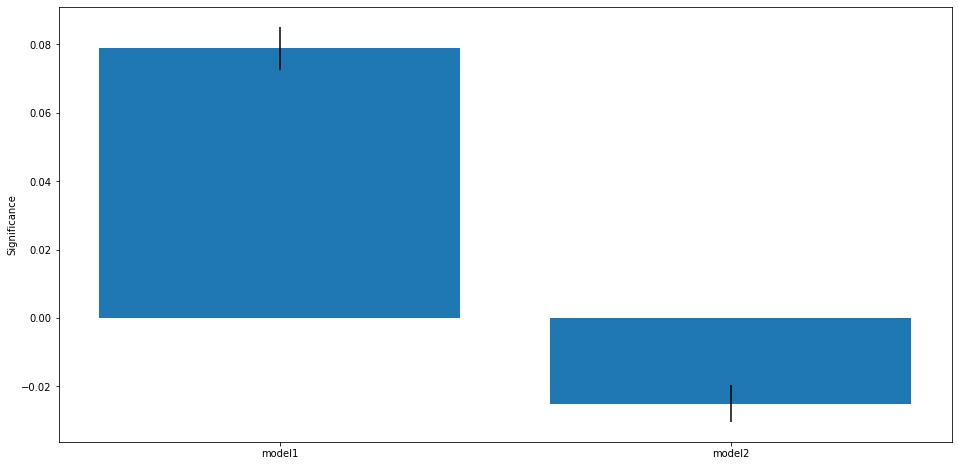

41
Accuracy (test)= 0.7533+-0.0692
Acuracy (train)= 0.7558+-0.0022
Efron's R^2 (test)= nan+-nan
Efron's R^2 (train)= 0.0199+-0.0019
Precision = 0.005+-0.0069


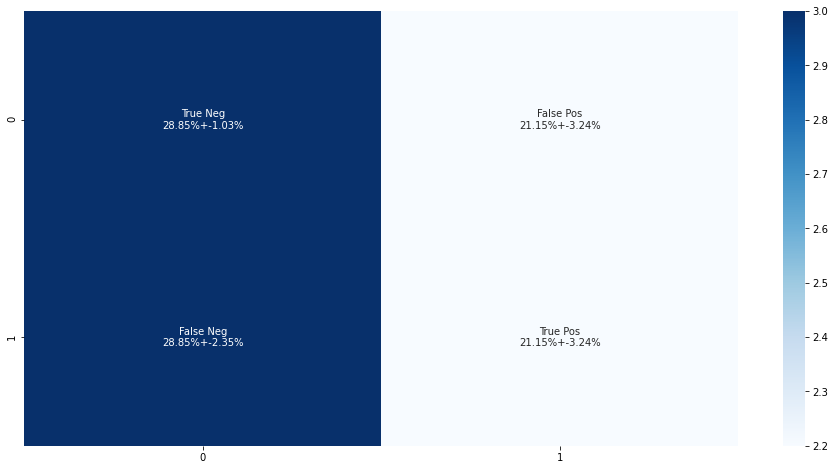

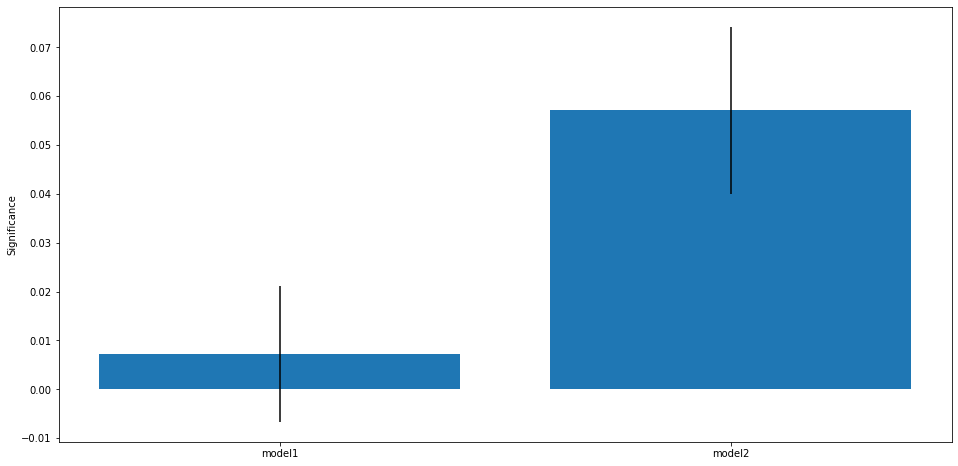

40
Accuracy (test)= 0.69+-0.0763
Acuracy (train)= 0.7492+-0.0026
Efron's R^2 (test)= nan+-nan
Efron's R^2 (train)= 0.095+-0.0036
Precision = 0.9333+-0.0452


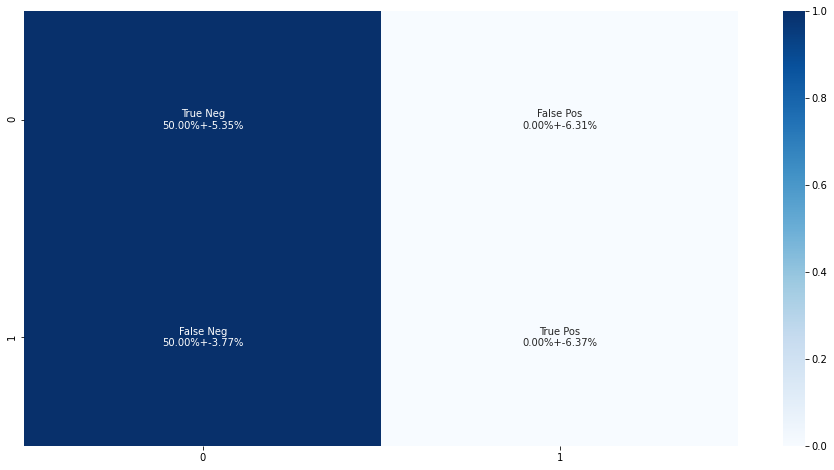

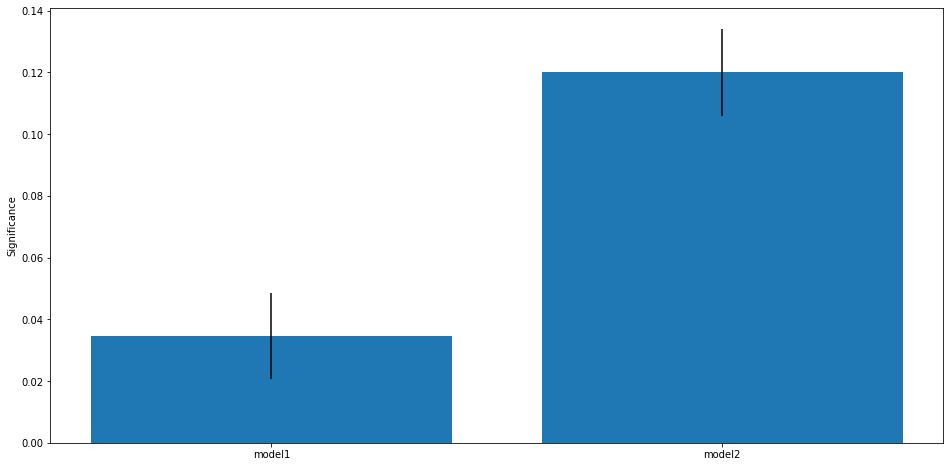

94
Accuracy (test)= 0.9253+-0.0269
Acuracy (train)= 0.9255+-0.0009
Efron's R^2 (test)= -0.0365+-0.0307
Efron's R^2 (train)= 0.124+-0.0023
Precision = 1.0+-0.0


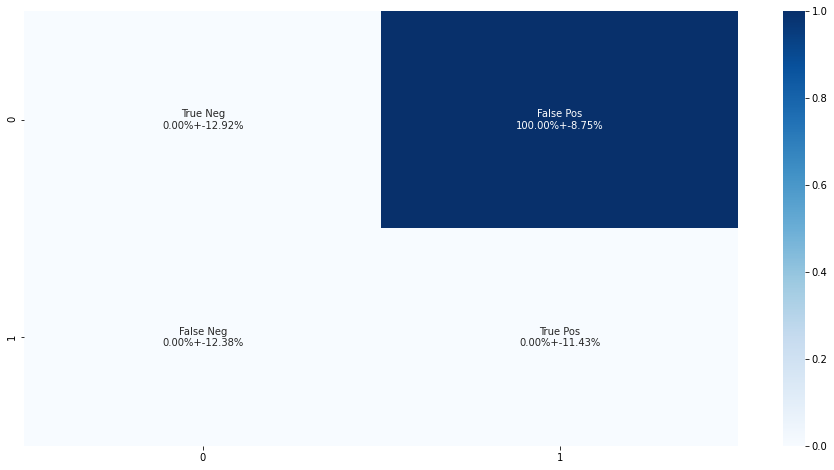

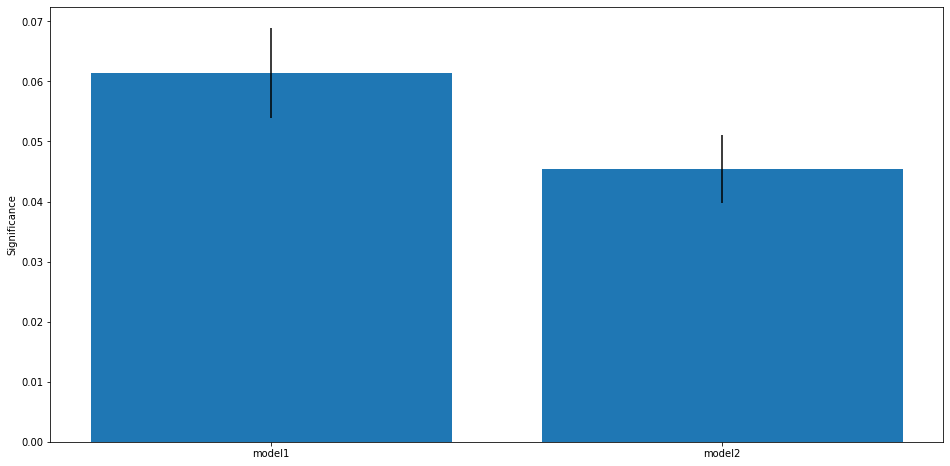

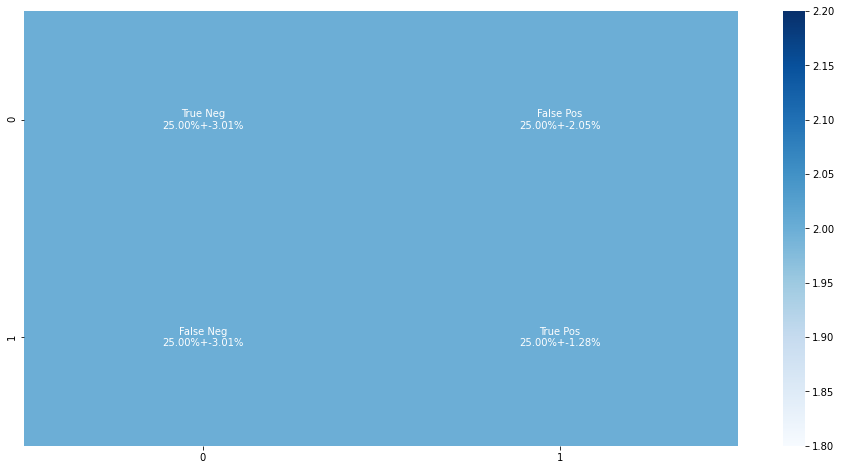

In [ ]:
warnings.filterwarnings('ignore')
step = 0.25
log_model1_partitions = []
log_model2_partitions = []
log_model3_partitions = []
y_partitions = []
log_models_partition_df = []
log_lin_partitions = []
for i in np.arange(0,1.0,step):
  abc = (log_model1<=i+step) & (log_model1>i)
  abc1 = log_model1[abc]
  log_model1_partitions.append(abc)
  abc2 = log_model2[abc]
  log_model2_partitions.append(abc2)
  abc3 = log_model3[abc]
  log_model3_partitions.append(abc3)
  yy = y[abc]
  y_partitions.append(yy)
  print(len(yy))
  abc_df = pd.DataFrame({'model1': abc1,'model2': abc2})
  log_models_partition_df.append(abc_df)
  abc_scores,abc_average,_ = loading_scores(abc_df,yy,pad=True)
  abc_model = (abc_df @ abc_scores + abc_average * np.ones_like(yy))
  log_lin_partitions.append(abc_model)
log_lin_partitioned_model = pd.concat(log_lin_partitions)
y_partitioned = pd.concat(y_partitions)

Model 1
Accuracy (test)= 0.7733+-0.0507
Acuracy (train)= 0.7693+-0.0017
Efron's R^2 (test)= -0.2059+-0.0589
Efron's R^2 (train)= 0.0485+-0.0018
Precision (test) = 0.0+-0.0
Precision (train) = 0.0005+-0.0018


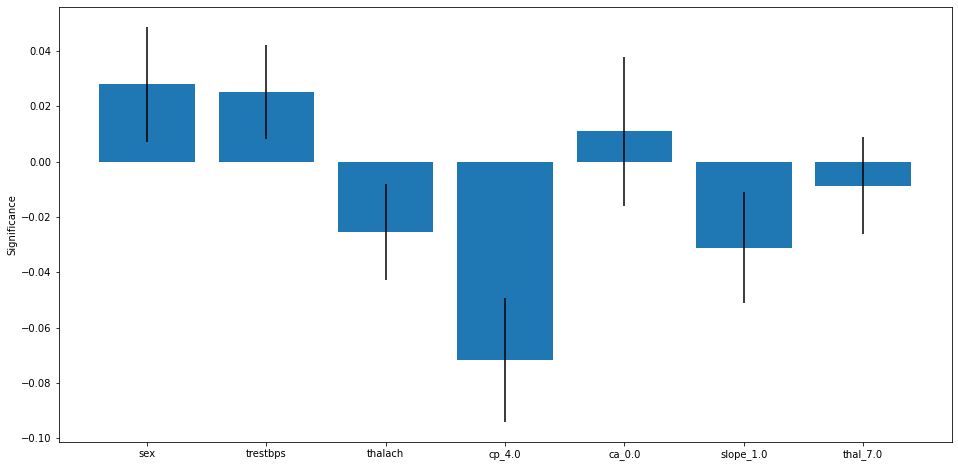

Model 2
Accuracy (test)= 0.6922+-0.0556
Acuracy (train)= 0.8109+-0.0044
Efron's R^2 (test)= -1.613729086978248e+29+-1.5866056579863592e+29
Efron's R^2 (train)= 0.1574+-0.0226
Precision (test) = 0.0467+-0.041
Precision (train) = 0.3858+-0.1256


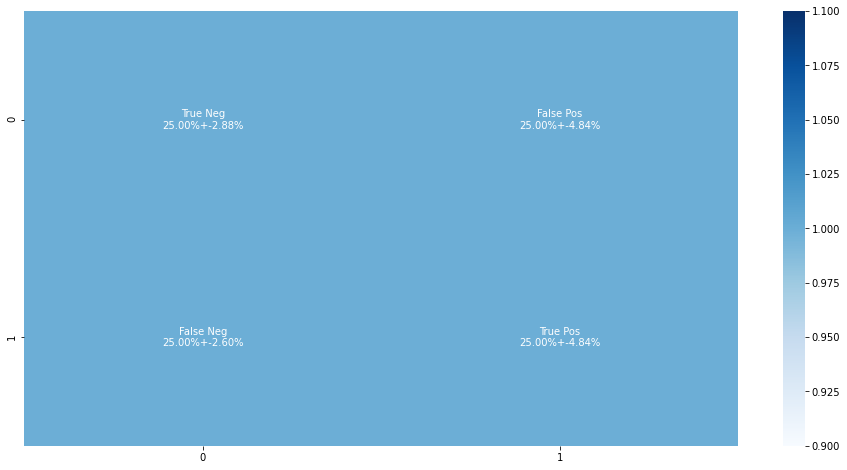

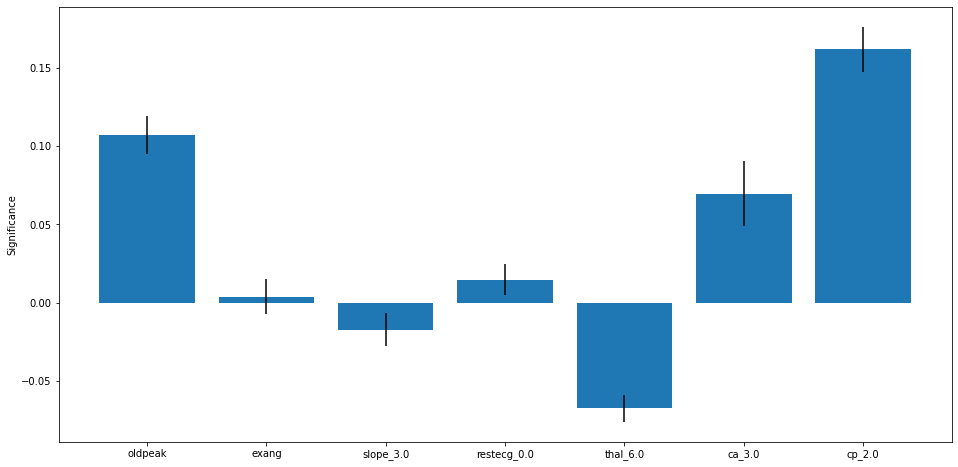

Model 3
Accuracy (test)= 0.7561+-0.0542
Acuracy (train)= 0.767+-0.0034
Efron's R^2 (test)= -2.4368174050935506e+24+-2.395859573703761e+24
Efron's R^2 (train)= -0.2108+-0.2484
Precision (test) = 0.0+-0.0
Precision (train) = 0.0005+-0.0018


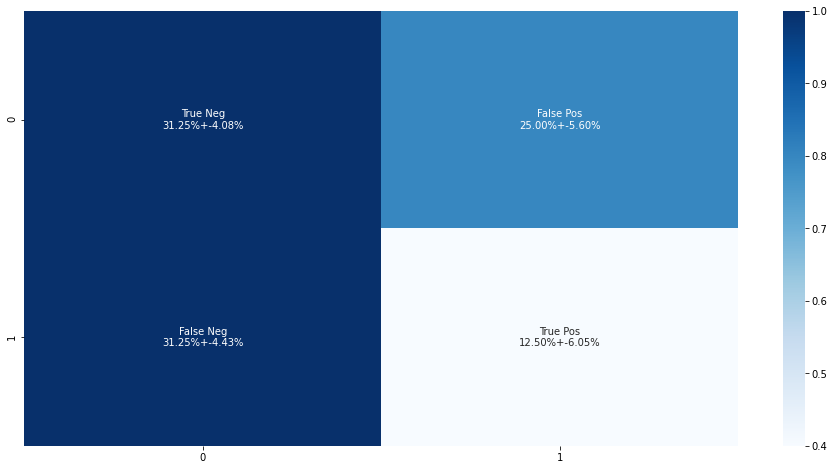

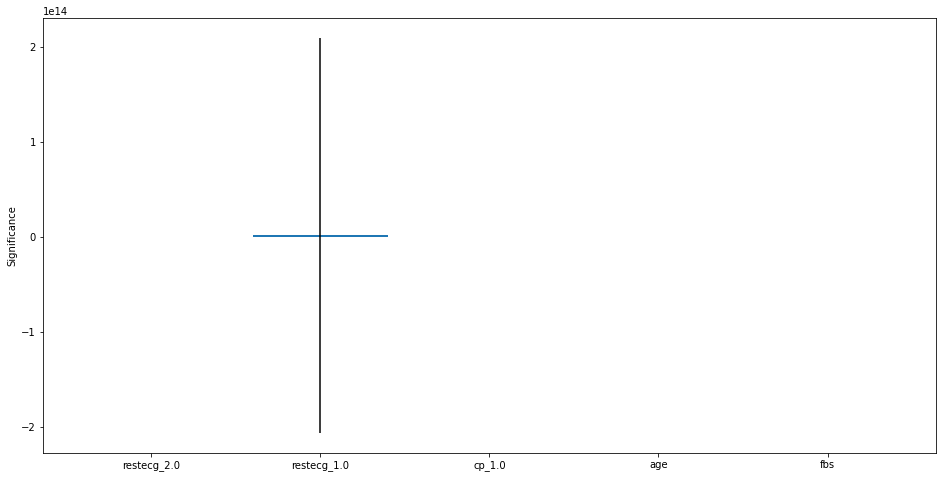

Lin_Lin_Models
Accuracy (test)= 0.7394+-0.0571
Acuracy (train)= 0.7676+-0.0023
Efron's R^2 (test)= -1.4748314952377698e+23+-1.4500426458212989e+23
Efron's R^2 (train)= 0.0887+-0.0023
Precision (test) = 0.0+-0.0
Precision (train) = 0.0019+-0.0071


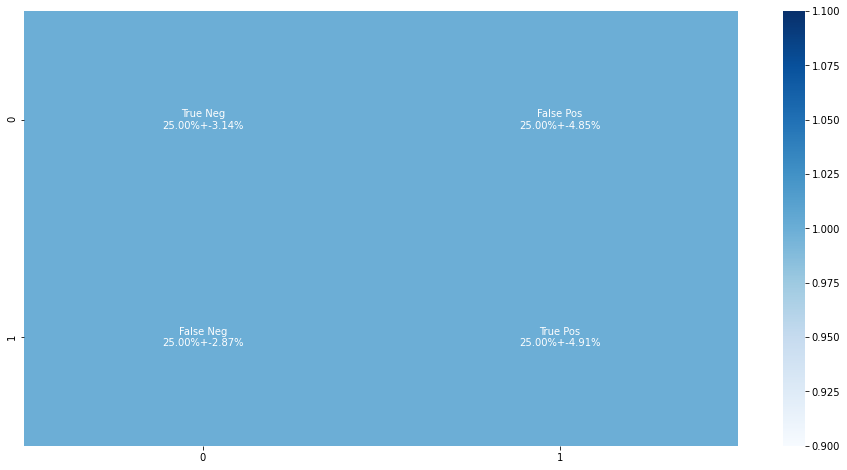

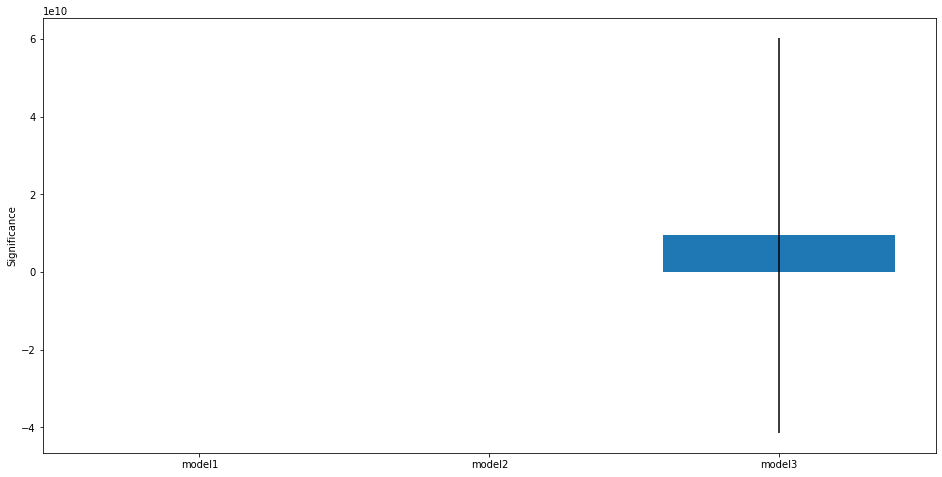

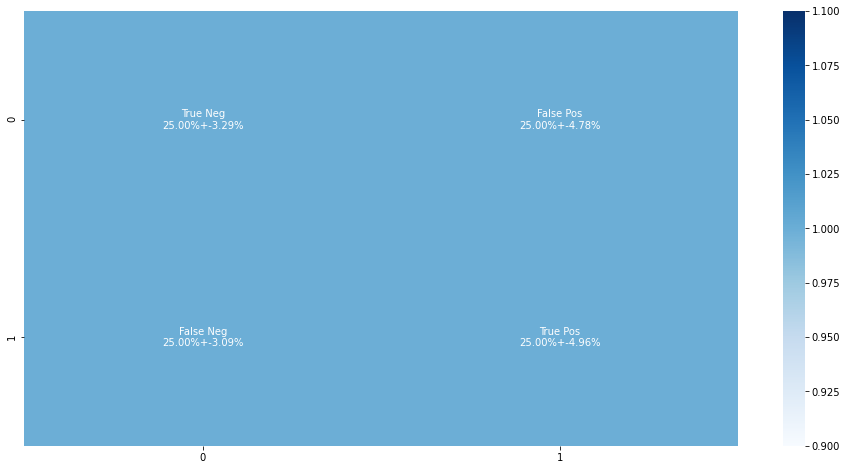

In [ ]:
warnings.filterwarnings('ignore')
abc = (log_model1<=0.45) & (log_model1>0.15)
yy = y[abc]
XX_encoded = X_encoded.loc[abc]
features1 = ['sex','trestbps','thalach','cp_4.0', 'ca_0.0', 'slope_1.0','thal_7.0']
features2 = ['oldpeak','exang','slope_3.0','restecg_0.0','thal_6.0','ca_3.0','cp_2.0']
features3 = ['restecg_2.0','restecg_1.0','cp_1.0','age','fbs']
print("Model 1")
Xscores1,Xaverage1,_ = loading_scores(XX_encoded[features1],yy,pad=True)
print("Model 2")
Xscores2,Xaverage2,_ = loading_scores(XX_encoded[features2],yy,pad=True)
print("Model 3")
scores3,average3,_ = loading_scores(XX_encoded[features3],yy,pad=True)
Xmodel1 = XX_encoded[features1] @ scores1 + average1 * np.ones_like(yy)
Xmodel2 = XX_encoded[features2] @ scores2 + average2 * np.ones_like(yy)
Xmodel3 = XX_encoded[features3] @ scores3 + average3 * np.ones_like(yy)
Xmodels_df = pd.DataFrame({'model1': model1,'model2': model2,'model3': model3})
print("Lin_Lin_Models")
Xscores_t,Xaverage_t,_ = loading_scores(models_df,yy,pad=True)
Xmodels = models_df @ scores_t + average_t * np.ones_like(yy)


In [ ]:
scores_t,average_t

([0.5986355143776061, 0.9150107818646607, 0.027830367260055278],
 -0.1209151481501645)

In [ ]:
scores_t,average_t

([0.9708923141373192, 9.524654069011298e-15], -0.000973730835724238)

It's interesting how important the third model is. Even though it only has a loading score of 0.025, it really changes the answer.

It's also interesting how bad logs are for this data.

The best we can do for this data is the lin_lin model that's mainly model2.

In [ ]:
odd_stretch_model = Xmodels
odd_stretch_y = yy
odd_stretch_X = XX_encoded

Model 1
Accuracy (test)= 0.8923+-0.0203
Acuracy (train)= 0.8988+-0.001
Efron's R^2 (test)= 0.5545+-0.0606
Efron's R^2 (train)= 0.6574+-0.0016
Precision (test) = 0.9426+-0.021
Precision (train) = 0.9526+-0.0192


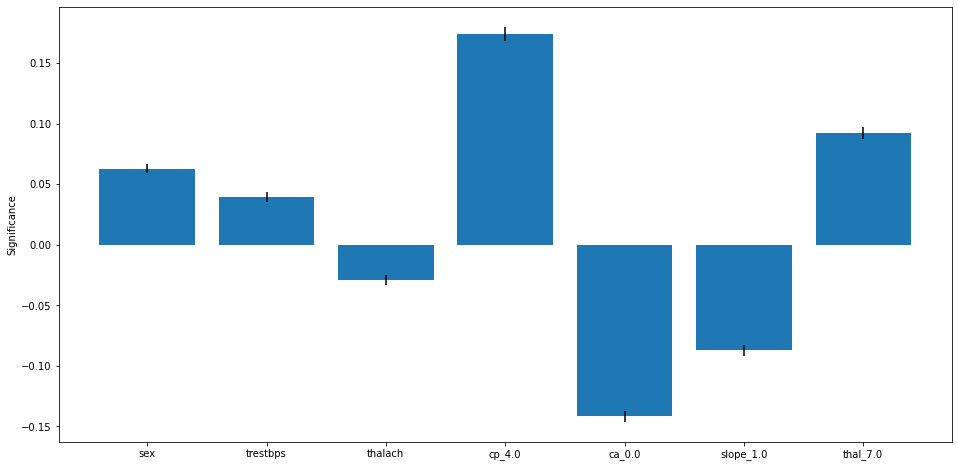

Model 2
Accuracy (test)= 0.7971+-0.0256
Acuracy (train)= 0.8058+-0.0009
Efron's R^2 (test)= 0.2581+-0.0683
Efron's R^2 (train)= 0.4253+-0.0016
Precision (test) = 0.7623+-0.0385
Precision (train) = 0.7706+-0.0381


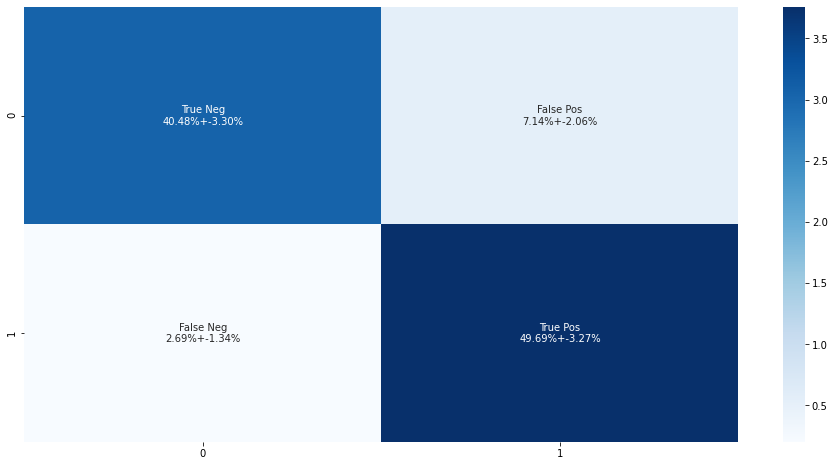

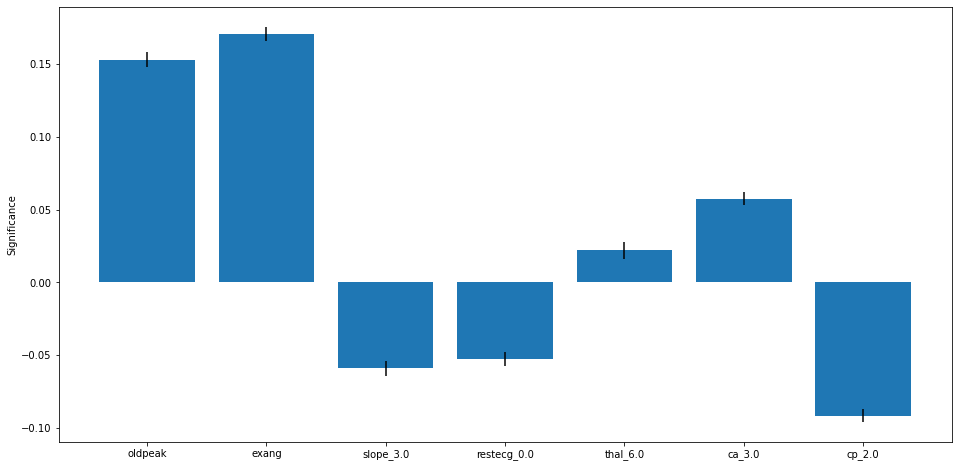

Model 3
Accuracy (test)= 0.6347+-0.0303
Acuracy (train)= 0.6619+-0.0013
Efron's R^2 (test)= -0.036+-0.0636
Efron's R^2 (train)= 0.1464+-0.0015
Precision (test) = 0.6697+-0.0426
Precision (train) = 0.688+-0.0419


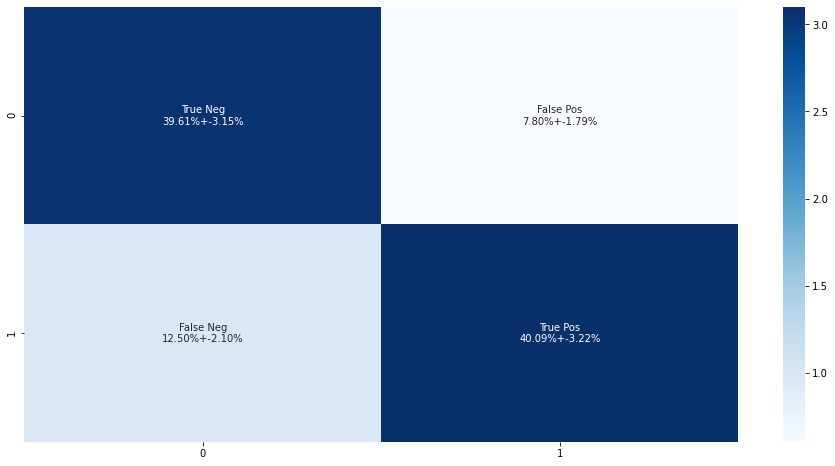

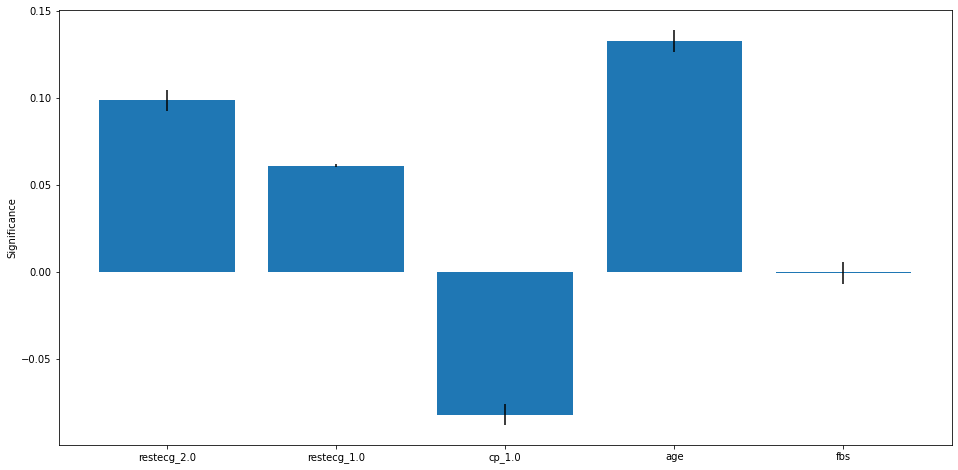

Log Model 1
Accuracy (test)= 0.8951+-0.0195
Acuracy (train)= 0.9016+-0.0009
Efron's R^2 (test)= 0.6009+-0.061
Efron's R^2 (train)= 0.6942+-0.0018
Precision (test) = 0.9484+-0.02
Precision (train) = 0.9598+-0.0178


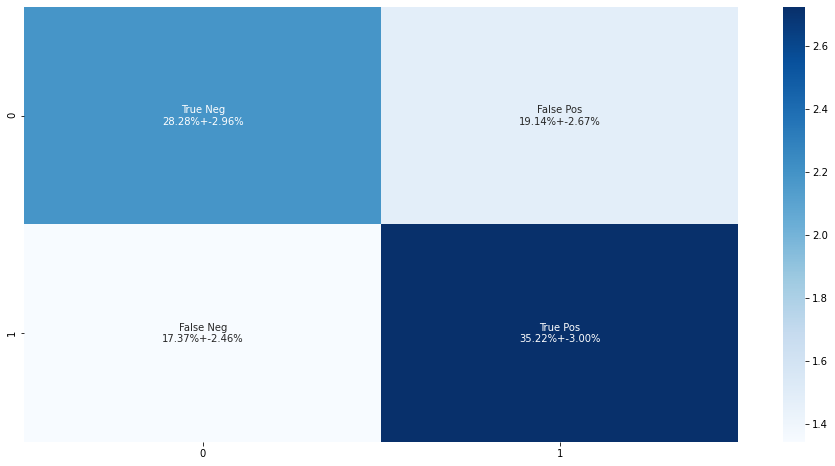

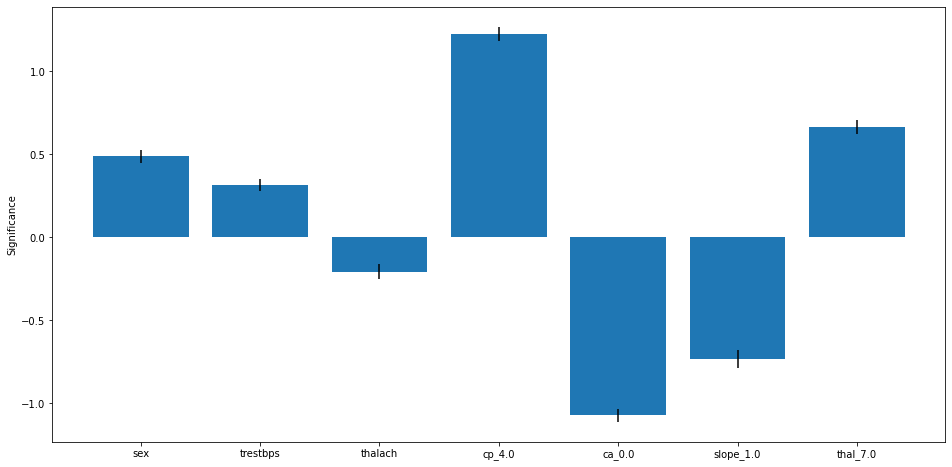

Log Model 2
Accuracy (test)= 0.7921+-0.0254
Acuracy (train)= 0.8+-0.0011
Efron's R^2 (test)= 0.2833+-0.0736
Efron's R^2 (train)= 0.4326+-0.0018
Precision (test) = 0.773+-0.0379
Precision (train) = 0.7807+-0.0375


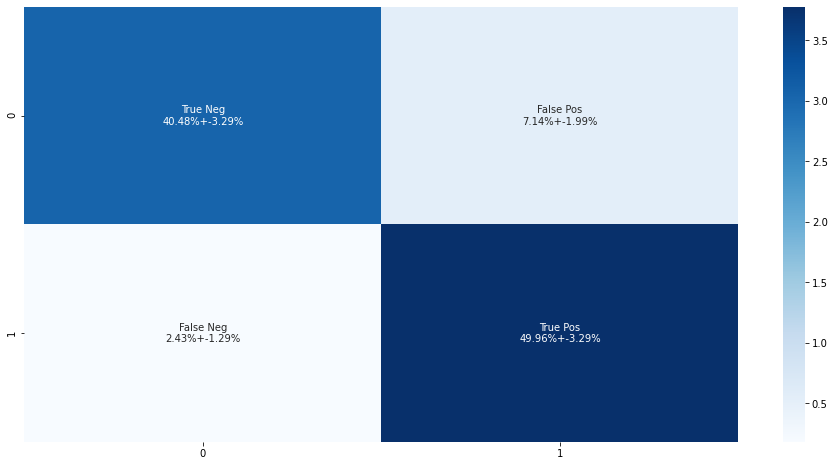

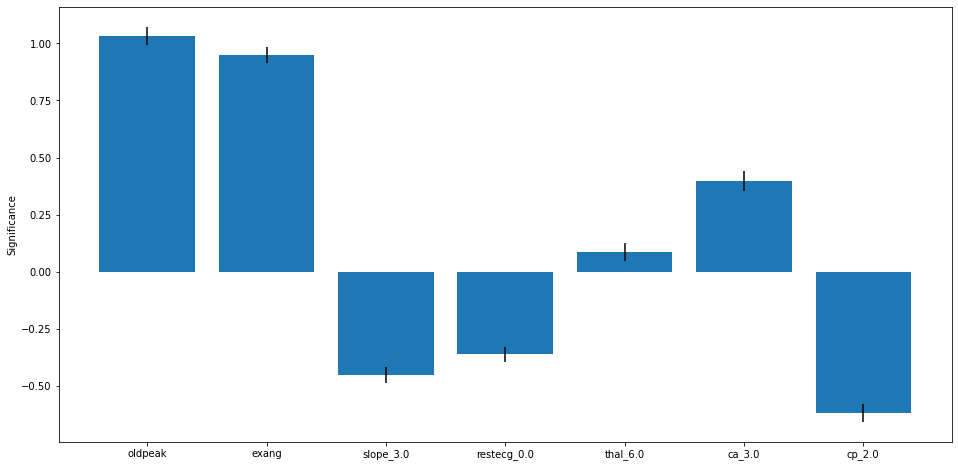

Log Model 3
Accuracy (test)= 0.6321+-0.0304
Acuracy (train)= 0.6608+-0.0013
Efron's R^2 (test)= -0.069+-0.0686
Efron's R^2 (train)= 0.1412+-0.0015
Precision (test) = 0.673+-0.0425
Precision (train) = 0.6981+-0.0416


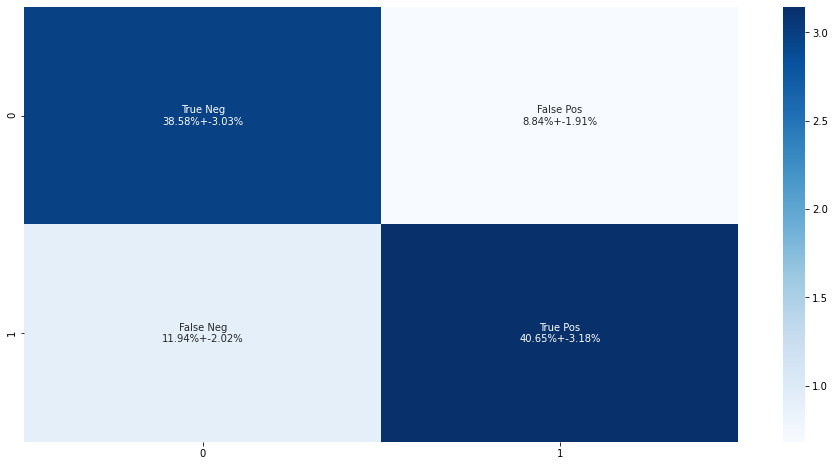

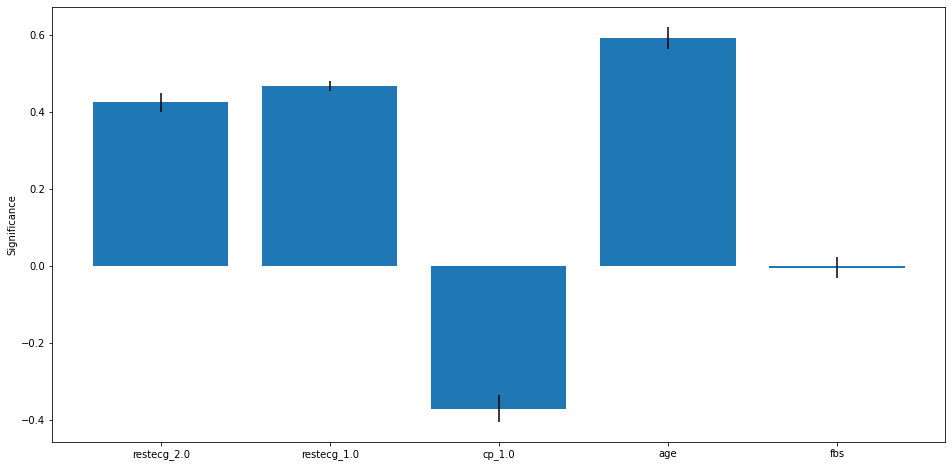

Lin_Lin_Models
Accuracy (test)= 0.9054+-0.0189
Acuracy (train)= 0.9073+-0.0008
Efron's R^2 (test)= 0.5928+-0.0508
Efron's R^2 (train)= 0.6675+-0.0014
Precision (test) = 0.9508+-0.0196
Precision (train) = 0.9513+-0.0195


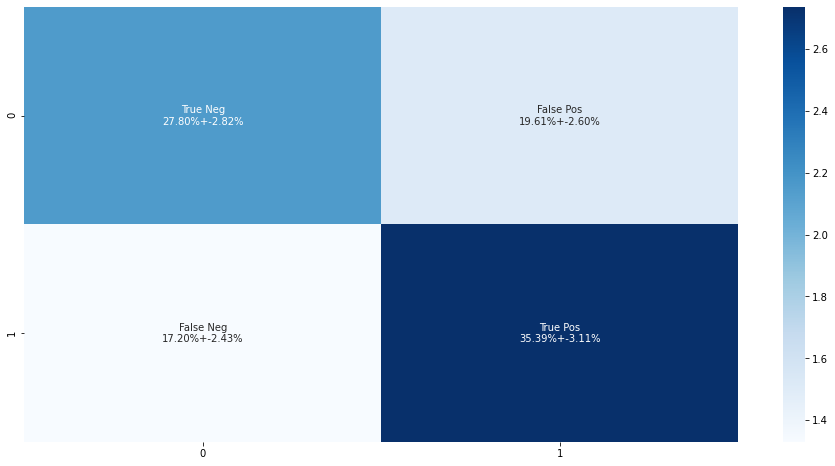

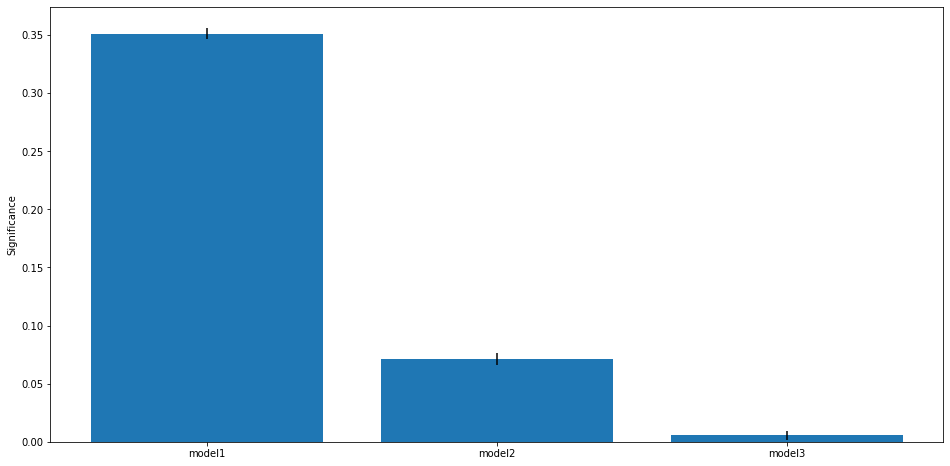

Log_Lin_Models
Accuracy (test)= 0.9031+-0.0192
Acuracy (train)= 0.906+-0.0007
Efron's R^2 (test)= 0.6299+-0.0627
Efron's R^2 (train)= 0.7015+-0.0017
Precision (test) = 0.9631+-0.017
Precision (train) = 0.9661+-0.0164


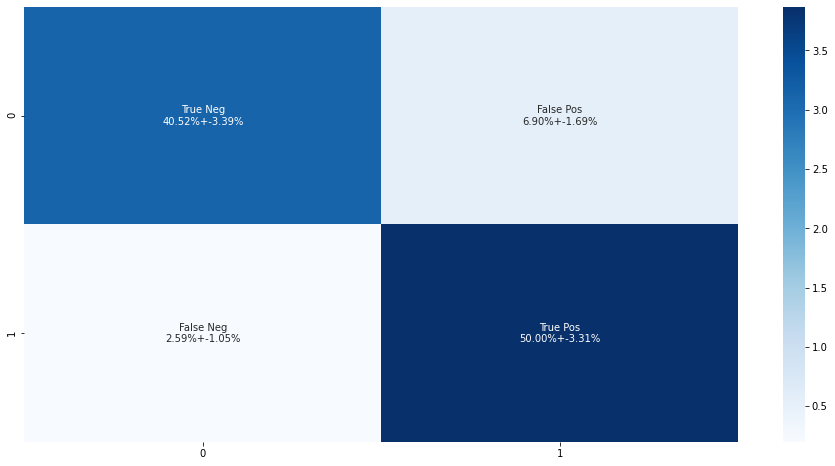

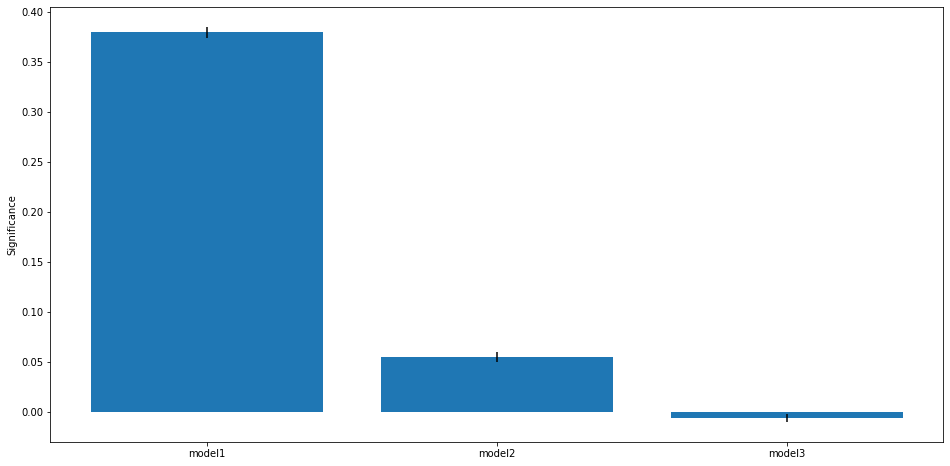

Lin_Log_Models
Accuracy (test)= 0.902+-0.0181
Acuracy (train)= 0.9051+-0.0007
Efron's R^2 (test)= 0.6194+-0.0491
Efron's R^2 (train)= 0.6895+-0.0014
Precision (test) = 0.9328+-0.0227
Precision (train) = 0.9344+-0.0224


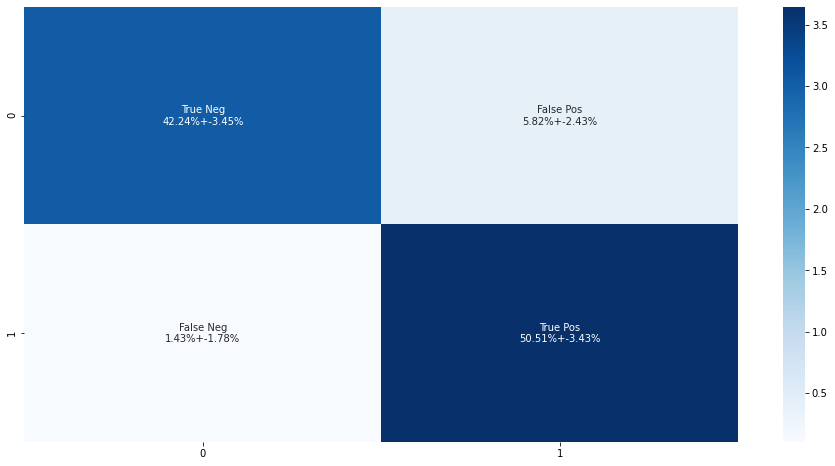

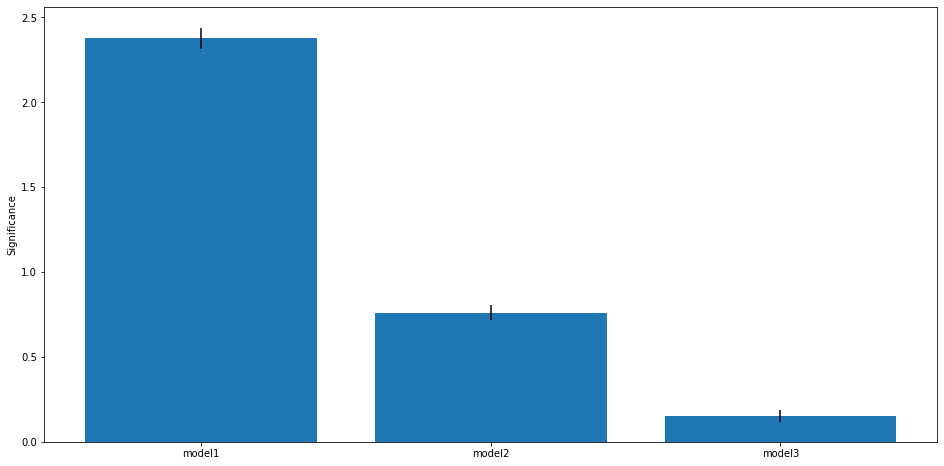

Log_Log_Models
Accuracy (test)= 0.9011+-0.0177
Acuracy (train)= 0.9035+-0.0007
Efron's R^2 (test)= 0.6269+-0.0527
Efron's R^2 (train)= 0.6956+-0.0015
Precision (test) = 0.9426+-0.0211
Precision (train) = 0.9435+-0.0209


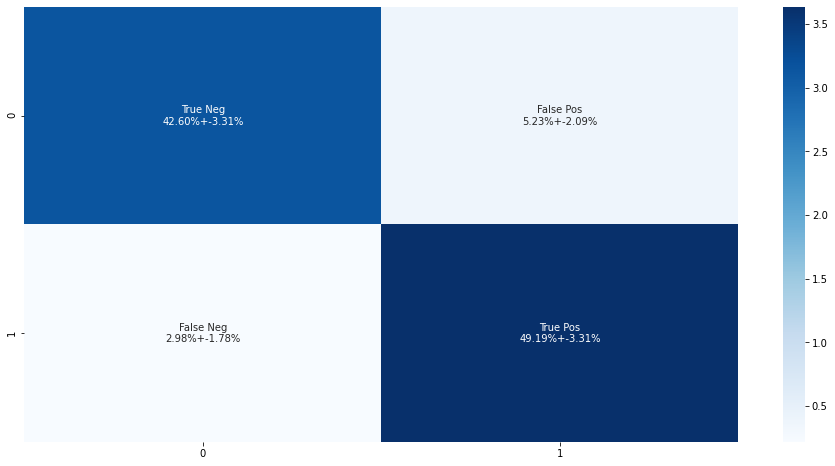

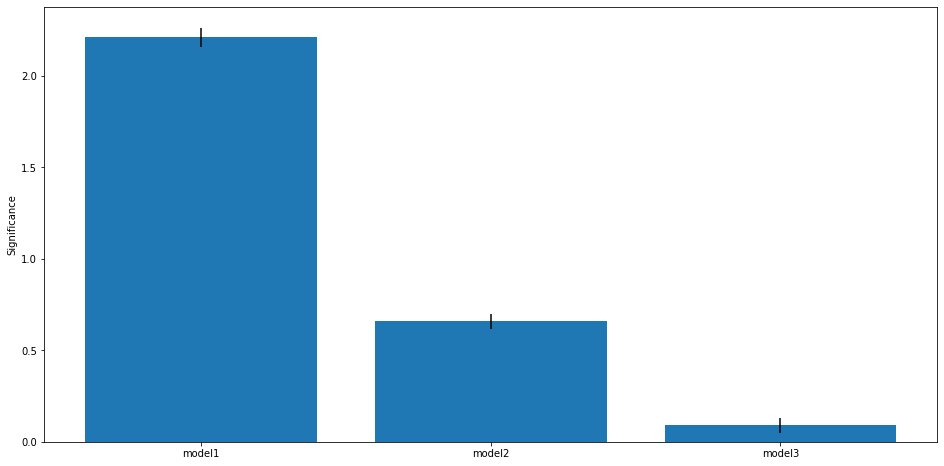

Fake_Log_Log_Model
Accuracy (test)= 0.9005+-0.0191
Acuracy (train)= 0.9009+-0.0007
Efron's R^2 (test)= 0.6064+-0.0579
Efron's R^2 (train)= 0.6856+-0.0017
Precision (test) = 0.959+-0.0179
Precision (train) = 0.959+-0.018


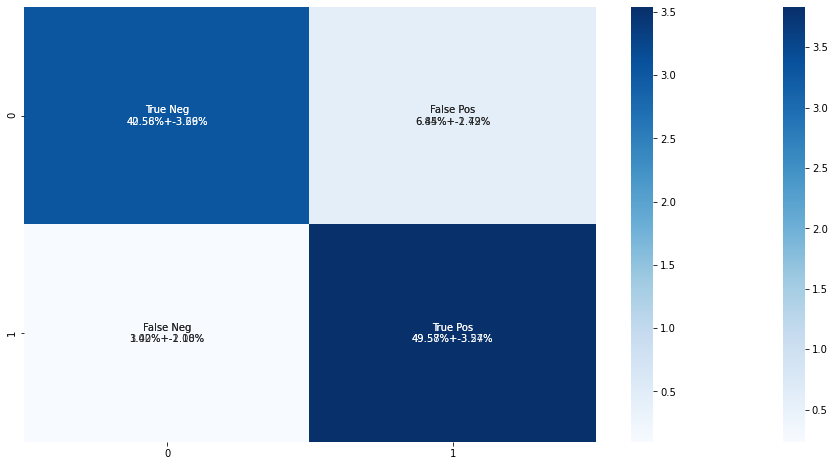

In [ ]:
warnings.filterwarnings('ignore')
abc = (log_model1>0.45) | (log_model1<=0.15)
yy = y[abc]
XX_encoded = X_encoded.loc[abc]
features1 = ['sex','trestbps','thalach','cp_4.0', 'ca_0.0', 'slope_1.0','thal_7.0']
features2 = ['oldpeak','exang','slope_3.0','restecg_0.0','thal_6.0','ca_3.0','cp_2.0']
features3 = ['restecg_2.0','restecg_1.0','cp_1.0','age','fbs']
print("Model 1")
Xscores1,Xaverage1,_ = loading_scores(XX_encoded[features1],yy,pad=True)
print("Model 2")
Xscores2,Xaverage2,_ = loading_scores(XX_encoded[features2],yy,pad=True)
print("Model 3")
Xscores3,Xaverage3,_ = loading_scores(XX_encoded[features3],yy,pad=True)
print("Log Model 1")
Xlog_scores1,Xlog_average1,_ = loading_scores(XX_encoded[features1],yy,estimator=logistic_estimator,pad=True)
print("Log Model 2")
Xlog_scores2,Xlog_average2,_ = loading_scores(XX_encoded[features2],yy,estimator=logistic_estimator,pad=True)
print("Log Model 3")
Xlog_scores3,Xlog_average3,_ = loading_scores(XX_encoded[features3],yy,estimator=logistic_estimator,pad=True)
Xmodel1 = XX_encoded[features1] @ scores1 + average1 * np.ones_like(yy)
Xmodel2 = XX_encoded[features2] @ scores2 + average2 * np.ones_like(yy)
Xmodel3 = XX_encoded[features3] @ scores3 + average3 * np.ones_like(yy)
Xlog_model1 = (XX_encoded[features1] @ log_scores1 + log_average1 * np.ones_like(yy)).apply(lambda row: sigmoid(row))
Xlog_model2 = (XX_encoded[features2] @ log_scores2 + log_average2 * np.ones_like(yy)).apply(lambda row: sigmoid(row))
Xlog_model3 = (XX_encoded[features3] @ log_scores3 + log_average3 * np.ones_like(yy)).apply(lambda row: sigmoid(row))
Xmodels_df = pd.DataFrame({'model1': model1,'model2': model2,'model3': model3})
Xlog_models_df = pd.DataFrame({'model1': log_model1,'model2': log_model2,'model3': log_model3})
print("Log_Lin_Models")
Xlog_lin_scores_t,Xlog_lin_average_t,_ = loading_scores(log_models_df,yy,pad=True)
Xlog_lin_models = log_models_df @ log_lin_scores_t + log_lin_average_t * np.ones_like(yy)
#warnings.resetwarnings()

The best model here is the log_lin_models.

In [ ]:
np.round(odd_stretch_model).value_counts()

-0.000000e+00    55
 1.000000e+00     9
 4.045385e+10     1
dtype: int64

In [ ]:
odd_stretch_model.loc[odd_stretch_model>2] = 1.0
odd_stretch_model.loc[odd_stretch_model>2]

Series([], dtype: float64)

In [ ]:
best_model = pd.concat([Xlog_lin_models,odd_stretch_model]).sort_index()

Accuracy (test)= 0.8725+-0.0188
Acuracy (train)= 0.8739+-0.0006
Efron's R^2 (test)= 0.5429+-0.0587
Efron's R^2 (train)= 0.6101+-0.0015
Precision (test) = 0.8606+-0.0296
Precision (train) = 0.8609+-0.0296


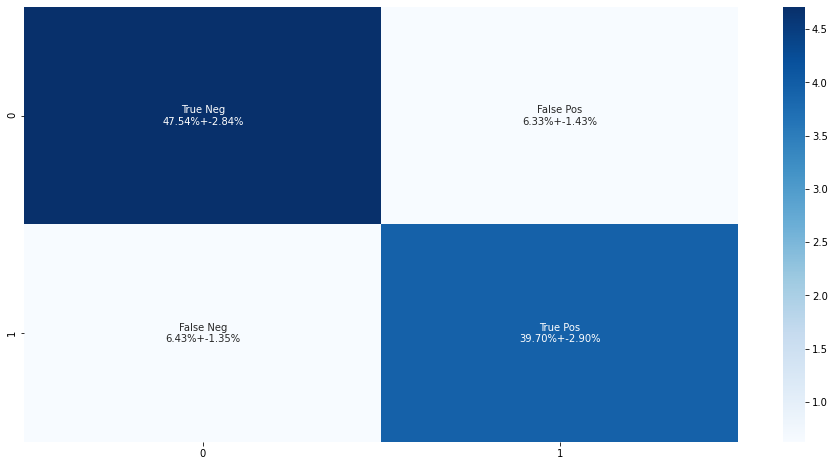

In [ ]:
loading_scores(best_model,y,pad=False);

Got another 2% accuracy and 3% sensitivity out of that.

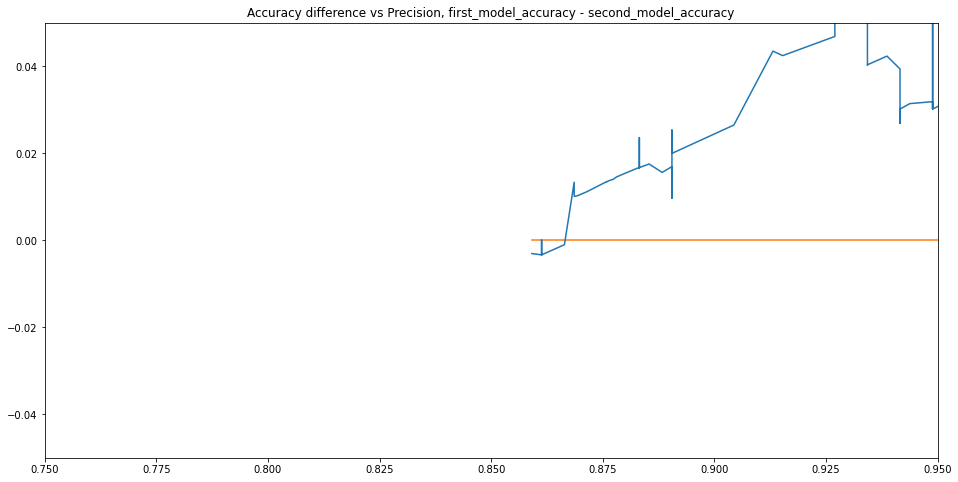

In [ ]:
sensitivitys,sensitivitys_err,accuracy_deltas,accuracy_deltas_err = sensitivity_delta_accuracy(best_model,log_model1,ymin=0.1,ymax=0.5)

No handles with labels found to put in legend.


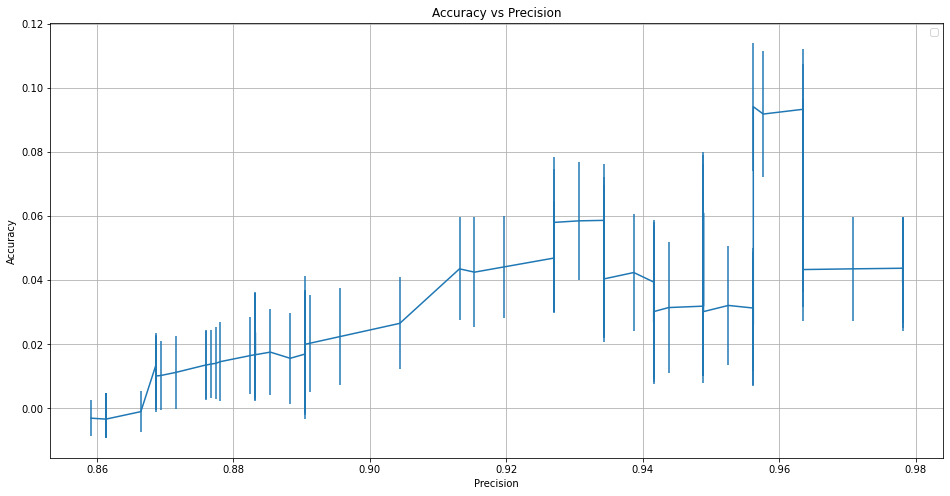

In [ ]:
plt.errorbar(sensitivitys,accuracy_deltas,yerr=accuracy_deltas_err)
plt.title(f"Accuracy vs Sensitivity")
plt.xlabel("Sensitivity")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()
plt.close()

In [ ]:
np.mean(accuracy_deltas_err)

0.015037125246343359

In [ ]:
np.std(accuracy_deltas_err)

0.004542967826613213

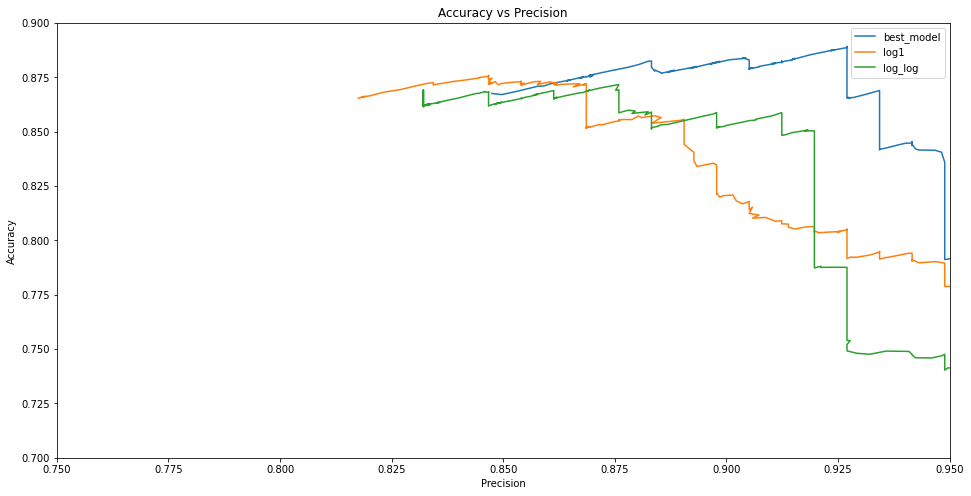

In [ ]:
all_sensitivitys,all_accuracies,all_edges = sensitivity_accuracy(best_model=best_model,log1=log_model1,log_log=log_log_models,ymin=0.1,ymax=0.55,step=0.001)

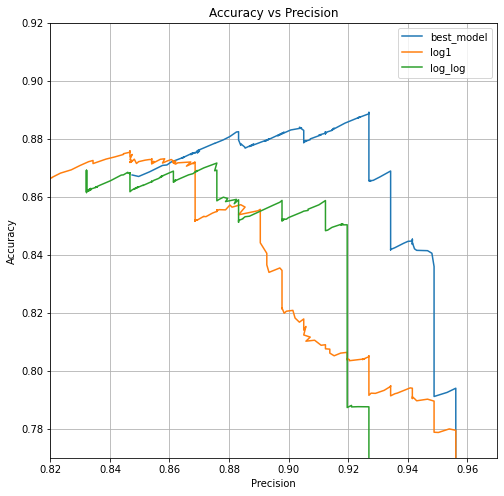

In [ ]:
fig = plt.figure(figsize=(8,8))
for i in all_sensitivitys.keys():
  sensitivitys = all_sensitivitys[i]
  accuracies = all_accuracies[i]
  plt.errorbar(sensitivitys,accuracies,label = i)
  plt.title(f"Accuracy vs Sensitivity")
  plt.xlim([0.82,0.97])
  plt.ylim([0.77,0.92])
  plt.xlabel("Sensitivity")
  plt.ylabel("Accuracy")
  plt.legend()
  plt.grid()
plt.show()
plt.close()

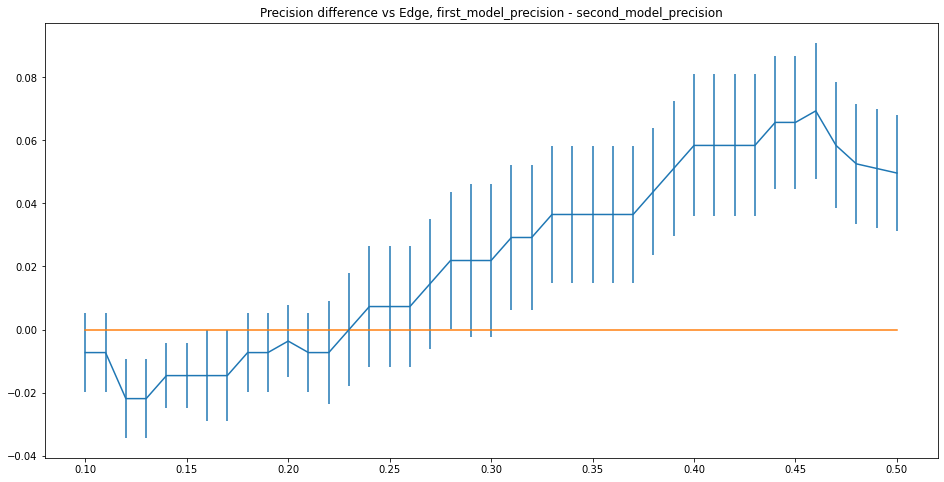

In [ ]:
sensitivity_deltas,sensitivity_deltas_err = delta_sensitivity(best_model,log_model1,ymin=0.1,ymax=0.5)

In [ ]:
np.mean(sensitivity_deltas_err)

0.01848718120409824

In [ ]:
np.std(sensitivity_deltas_err)

0.004244240567795264

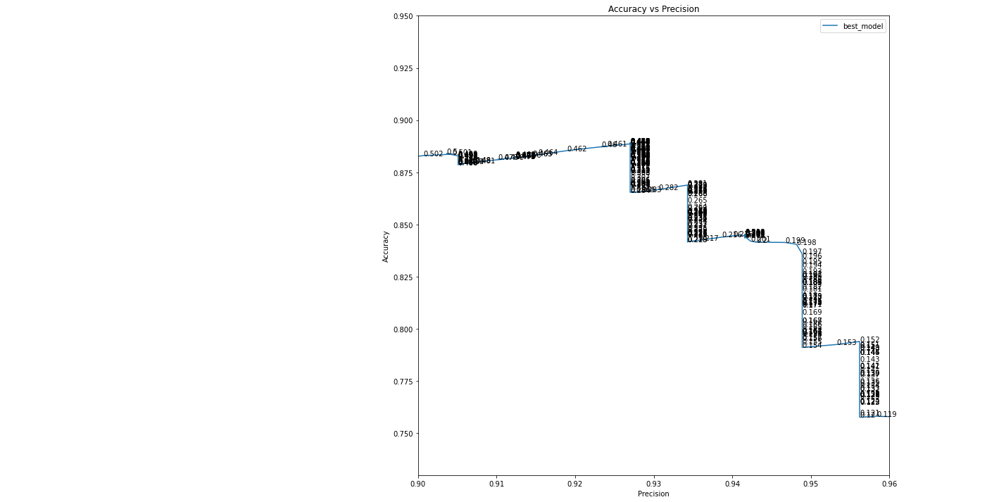

In [ ]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
i = 'best_model'
sensitivitys = all_sensitivitys[i]
accuracies = all_accuracies[i]
plt.errorbar(sensitivitys,accuracies,label = i)
plt.title(f"Accuracy vs Sensitivity")
plt.xlim([0.9,0.96])
plt.ylim([0.73,0.95])
plt.xlabel("Sensitivity")
plt.ylabel("Accuracy")
plt.legend()

for j, edge in enumerate(all_edges[i]):
    ax.annotate(np.round(edge,3), (sensitivitys[j], accuracies[j]))

plt.show()
plt.close()

best_model has the highest accuracy at edge=0.460, best_model is at least 0.2 in sensitivity away from log_model1 at edge = 0.280. It stops being 0.2 in sensitivity away from log_model1 at edge 0.19.

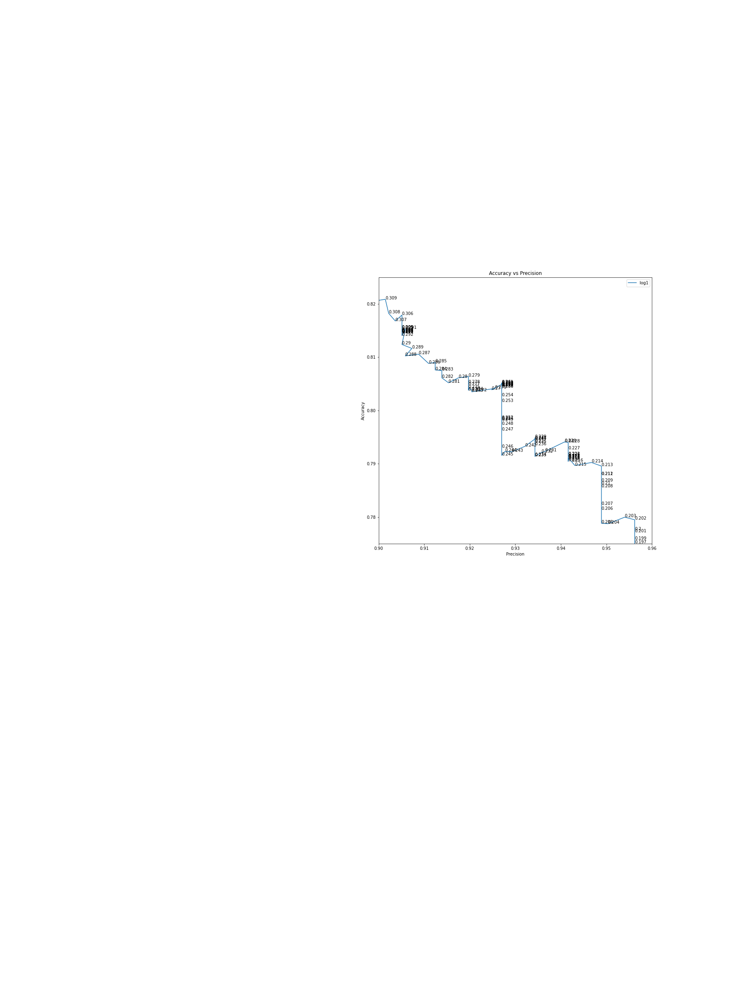

In [ ]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
i = 'log1'
sensitivitys = all_sensitivitys[i]
accuracies = all_accuracies[i]
plt.errorbar(sensitivitys,accuracies,label = i)
plt.title(f"Accuracy vs Sensitivity")
plt.xlim([0.9,0.96])
plt.ylim([0.775,0.825])
plt.xlabel("Sensitivity")
plt.ylabel("Accuracy")
plt.legend()

for j, edge in enumerate(all_edges[i]):
    ax.annotate(np.round(edge,3), (sensitivitys[j], accuracies[j]))

plt.show()
plt.close()

At edge = 0.28, log_model1 is already down at 0.92 sensitivity so they are more vertically than horizontally the same edge.

But at edge 0.28, best_model is at sensitivity of 0.93.

I'm going to make a delta-sensitivity against delta-accuracy and then find the radial standard deviation and p-value for each point and then do adjusted p-values.

Actually, I don't know what using the same edge will tell us. log_lin isn't even between 0 and 1. Edge is not important, it's not something we can report.

The hope is to find the closest point on the accuracy-sensitivity graph and find the error in between. It may not be one with the same edge.

That's not easy because the angle could be between 0 and 90 degrees, different for each point.

I need an accuracy_delta_sensitivity plot. The problem is that unlike sensitivity_delta_accuracy, there can be more than one edge with the same accuracy so how to tell it to find "the closest one to the other line"?

I just found out that everything I've been calling sensitivity is actually recall. Sensitivity and accuracy and recall are all not the same.

And what I call the edge is actually the 'ROC threshold'.

Looks like we have to do an ROC curve.

Can you find accuracy from ROC? You have A/(A+B) and C/(C+D). We want (A+D)/(A+D+B+C). The problem is I don't know D at all. We have the same thing on the x-axis. The problem is that I don't really know 'what's good' on the y-axis.

I'm told that accuracy is the mean of sensitivity and specificity if I have the same positive and negative cases.

'In general, accuracy is a weighted sum of sensitivity and specificity with the weights being the proportion of positive and negative samples respectively.'

A/n1 = sn, D/n2 = sp -> A = sn*n1, D = sp*n2 -> A+D = sn*n1 + sp*n2 -> (A+D)/n = sn*n1/n + sp*n2/n.

1.   Sensitivity = TP/(TP+FN) = Recall
2.   Specificity = TN/(TN+FP)
3.   Sensitivity = TP/(TP+FP)

As I lower the edge, false negatives will become true positives and true negatives will become false positives. So if I do an ROC curve, I won't have this problem. And I can find the accuracy from both.

Precision is not 'monotonous'. As edge goes down, false positives keeps going up which means precision goes down. But also true positives goes up as well, which means precision goes down. So it depends if you meet someone who has it or not, precision may go up or down.

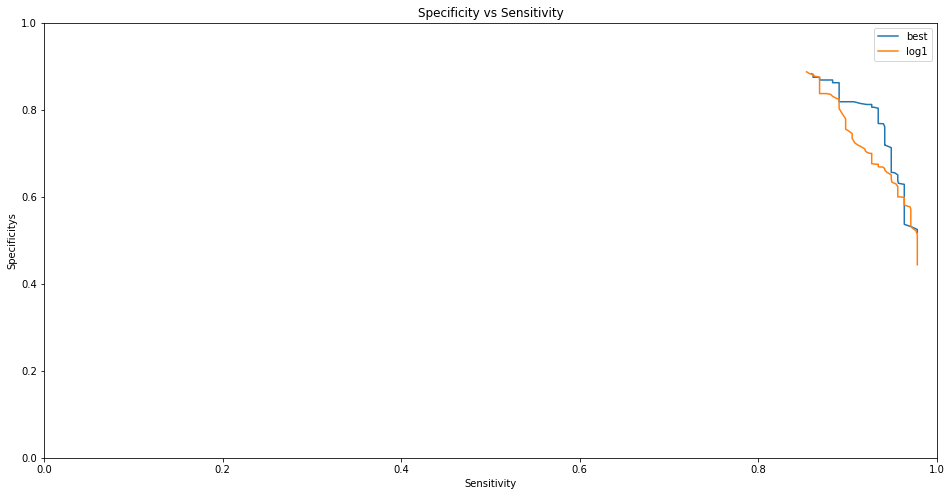

In [ ]:
all_sensitivitys,all_specificitys,all_edges = ROC(best = best_model,log1 = log_model1)

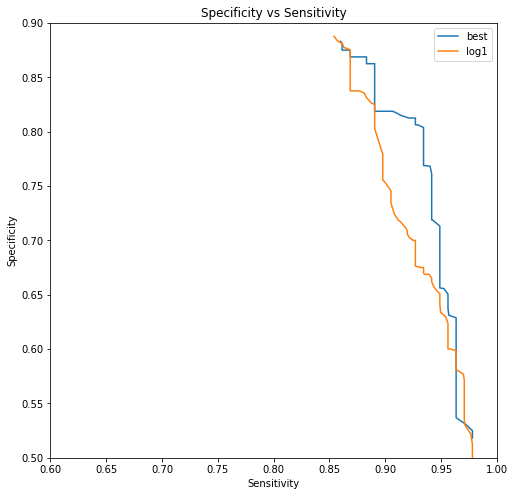

In [ ]:
fig = plt.figure(figsize=(8,8))
for i in all_sensitivitys.keys():
  sensitivitys = all_sensitivitys[i]
  specificitys = all_specificitys[i]
  plt.errorbar(sensitivitys,specificitys,label = i)
  plt.title(f"Specificity vs Sensitivity")
  plt.xlim([0.6,1.00])
  plt.ylim([0.5,0.9])
  plt.xlabel("Sensitivity")
  plt.ylabel("Specificity")
  plt.legend()
  plt.grid()
plt.show()
plt.close()

I want to have a feel for how large the specificity errors are.

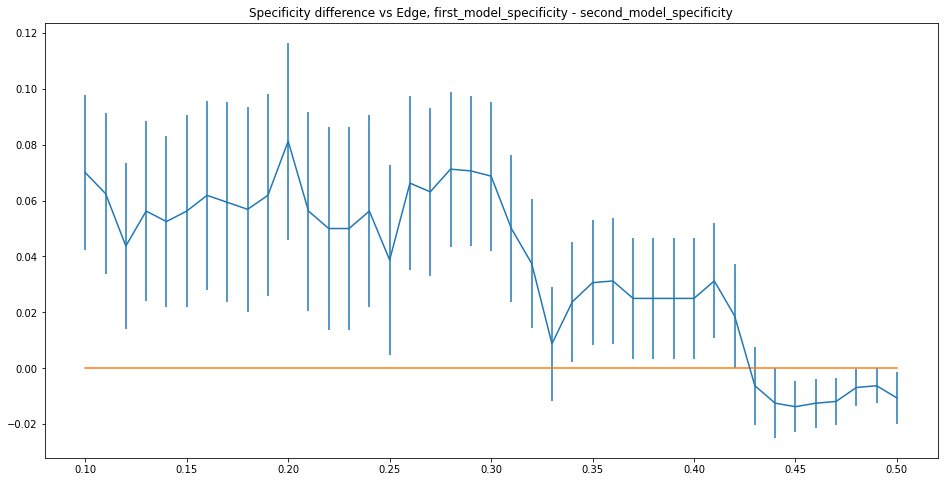

In [ ]:
specificity_deltas,specificity_deltas_err = delta_specificity(best_model,log_model1)

These are about the same as sensitivity errors. Looks like we could have just taken the sensitivity errors.

But it also means that it makes sense to look in a circle for 'radial_...' function.

The reason that the r=0 points don't have an error bar is there is no best way to take the two directions and find a 'best direction'. It doesn't matter.

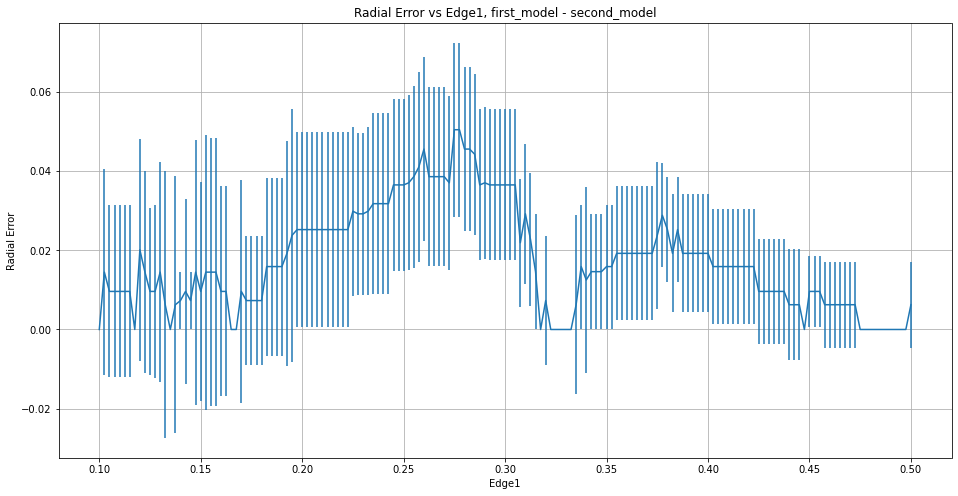

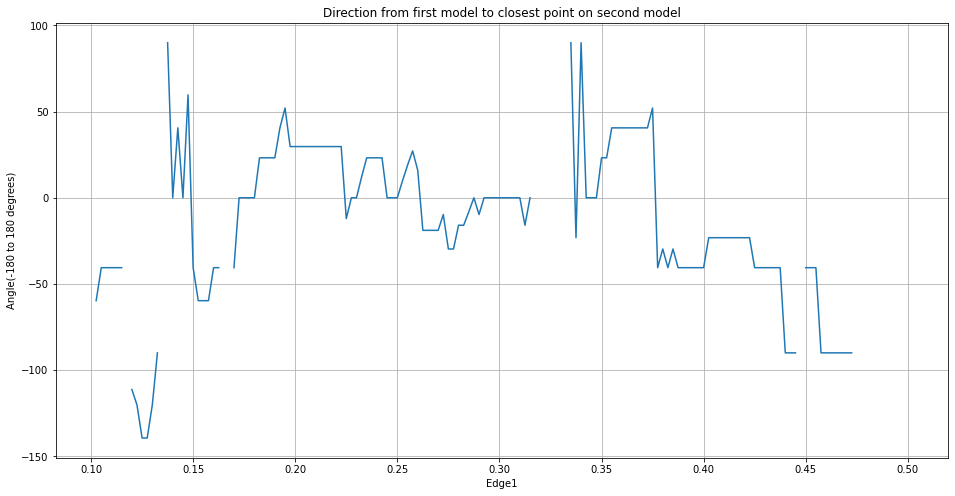

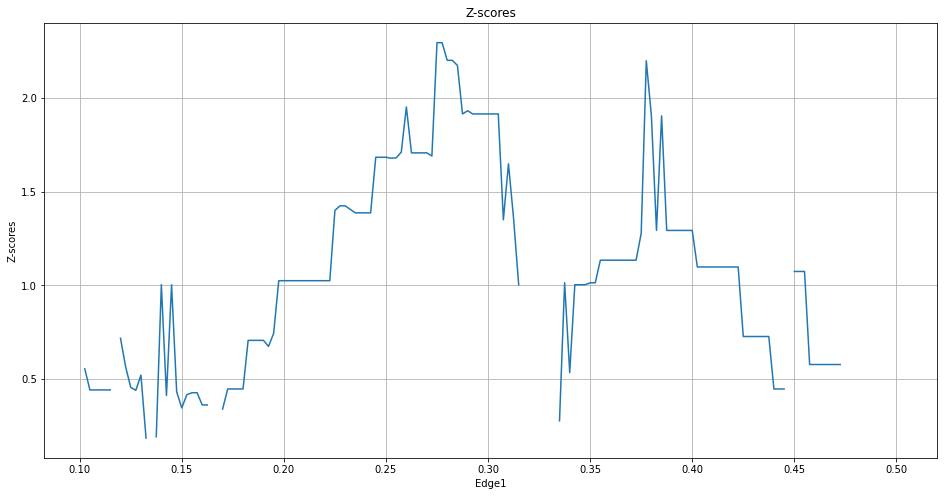

In [ ]:
edges1,edges2,rs,rs_err,angles,sensitivitys_specificitys1,sensitivitys_specificitys2 = radial_delta_accuracy(best_model,log_model1,ymin=0.1,adjust_p_values=False)

In [ ]:
nan = 0
np.max([0.21825037038653858, 0.5548230338804715, 0.4423334983769902, 0.4423334983769902, 0.4423334983769902, 0.4423334983769902, 0.4423334983769902, 0.44749336630961795, 0.49463561527600913, 0.566207178733025, 0.45629208321669057, 0.4401866436024469, 0.5029389320970771, 0.18571535168556255, 0.18571535168556255, 0.18571535168556255, 0.412508976858378, 1.0036697371030325, 1.0036697371030325, 0.8653288644781586, 0.34643849826759254, 0.34643849826759254, 0.5492410610569701, 0.36235250796777774, 0.36235250796777774, 0.36235250796777774, nan, nan, 0.44754038662540685, 0.44754038662540685, 0.44754038662540685, 0.44754038662540685, 0.44754038662540685, 0.7068085378118641, 0.7068085378118641, 0.7068085378118641, 0.674844280557226, 0.674844280557226, 0.9941826582801433, 1.080004095979194, 1.0252579814335834, 1.0252579814335834, 1.0252579814335834, 1.0252579814335834, 1.0252579814335834, 1.0252579814335834, 1.0252579814335834, 1.0252579814335834, 1.0252579814335834, 1.0252579814335834, 1.0252579814335834, 1.4246507044288539, 1.4246507044288539, 1.4246507044288539, 1.4056203558922782, 1.387162488713592, 1.387162488713592, 1.387162488713592, 1.6838244862996414, 1.6838244862996414, 1.6838244862996414, 1.6788326637347863, 1.9227978115984674, 1.9227978115984674, 1.9520352433873418, 1.707256427165854, 1.707256427165854, 1.707256427165854, 1.707256427165854, 1.6904755072868514, 1.6838244862996414, 2.355981363061392, 2.2009966660031095, 2.1698037247660054, 2.157041999748555, 1.914947402568502, 1.914947402568502, 1.914947402568502, 1.914947402568502, 1.914947402568502, 1.914947402568502, 1.914947402568502, 1.914947402568502, 1.6491218807800392, 1.3505422973907262, 1.0036697371030325, 1.0036697371030325, 0.44754038662540685, nan, nan, nan, nan, nan, nan, 0.2774167928588263, 0.5350003761722718, 0.5350003761722718, 0.5350003761722718, 0.5350003761722718, 0.5350003761722718, 1.0139026695156683, 1.0139026695156683, 1.134663138635831, 1.134663138635831, 1.134663138635831, 1.134663138635831, 1.134663138635831, 1.134663138635831, 1.134663138635831, 2.198812969426928, 1.9045206364598608, 1.9045206364598608, 1.9045206364598608, 1.9045206364598608, 1.2933932370332681, 1.2933932370332681, 1.2933932370332681, 1.2933932370332681, 1.2933932370332681, 1.2933932370332681, 1.2933932370332681, 1.2933932370332681, 1.098436217734398, 1.2933932370332681, 1.098436217734398, 1.098436217734398, 1.098436217734398, 1.098436217734398, 1.098436217734398, 1.098436217734398, 0.7274123217972706, 0.7274123217972706, 0.7274123217972706, 0.7274123217972706, 0.44749336630961795, 0.44749336630961795, 0.44749336630961795, 0.44749336630961795, 0.44749336630961795, 1.074464046716026, 1.074464046716026, 1.074464046716026, 0.5779526170521345, 0.5779526170521345, 0.5779526170521345, 0.5779526170521345, 0.5779526170521345, 0.5779526170521345, 0.5779526170521345, 0.5779526170521345, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.5779526170521345, 0.5779526170521345])

2.355981363061392

I only have 2.35 sigma to begin with, but I feel like it should be adjusted for the direction. The direction is always the same but it should be 'random'.

I feel like I don't have to use 'adjusted p-values' because you don't see best_model jumping up and down and left and right in any direction looking from log_model1 but it's always the same direction which means you only do the 'random measurement' once and everything else is not random.

Looks like I have to use a moving average and then I don't have to adjust p-values.

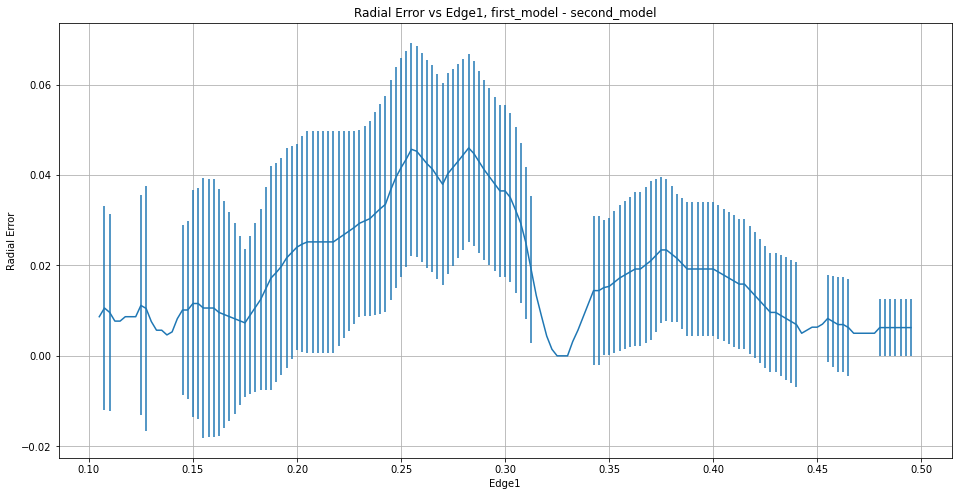

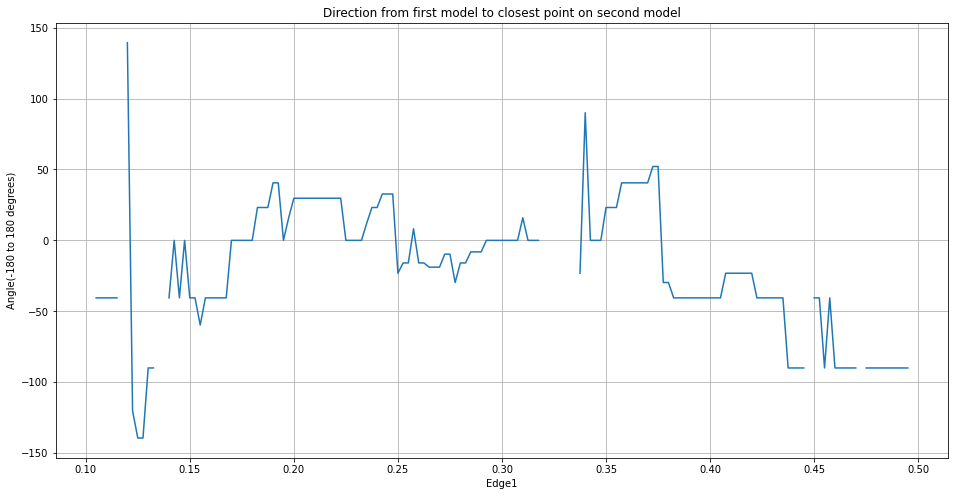

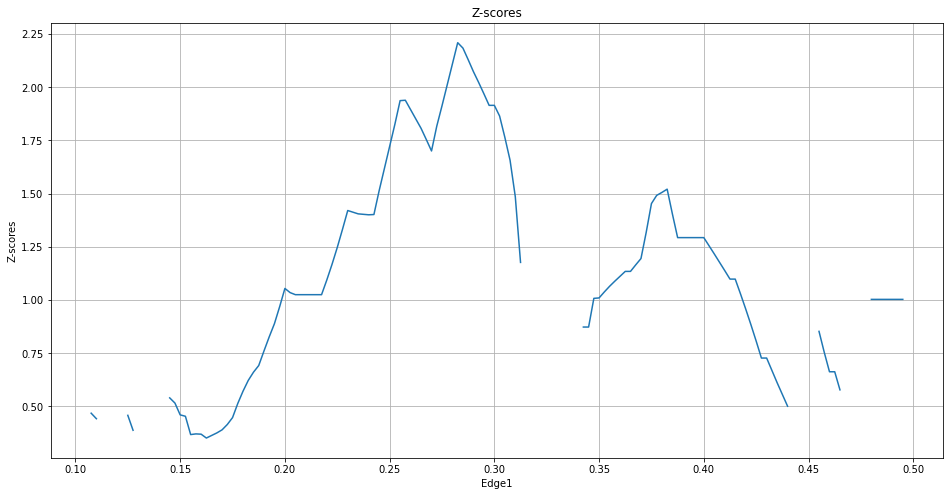

In [ ]:
edges1,edges2,rs,rs_err,angles,sensitivitys_specificitys1,sensitivitys_specificitys2 = radial_delta_accuracy(best_model,log_model1,ymin=0.1,moving_average=True)

Even if I used an average over 10 numbers, I would still have 2 sigma. I think it's real.

edge1 = 0.2825 +- 0.025

rs = 0.045999301087766634

edge2 = 0.3275

Accuracy (test)= 0.8622+-0.0202
Acuracy (train)= 0.8596+-0.0007
Efron's R^2 (test)= 0.5542+-0.0526
Efron's R^2 (train)= 0.6101+-0.0015
Sensitivity (test) = 0.9343+-0.0212
Sensitivity (train) = 0.9338+-0.0212
Specificity (test) = 0.8+-0.0316
Specificity (train) = 0.7948+-0.0319


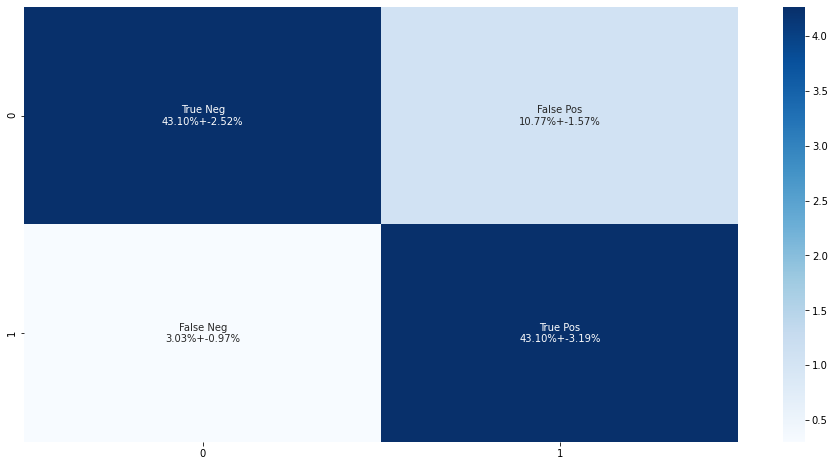

In [ ]:
loading_scores(best_model,y,pad=False,edge=0.2825);

Accuracy (test)= 0.8363+-0.0251
Acuracy (train)= 0.8348+-0.0008
Efron's R^2 (test)= 0.5357+-0.0635
Efron's R^2 (train)= 0.5851+-0.002
Sensitivity (test) = 0.8978+-0.0259
Sensitivity (train) = 0.8969+-0.026
Specificity (test) = 0.7812+-0.0327
Specificity (train) = 0.7806+-0.0327


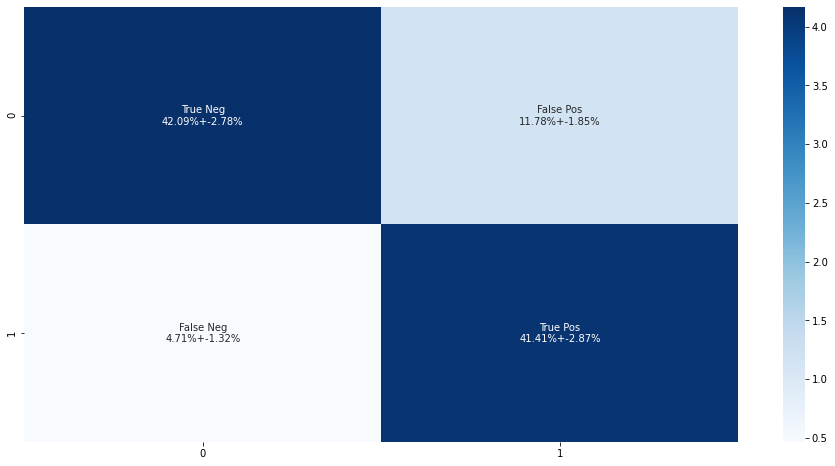

In [ ]:
loading_scores(log_model1,y,pad=False,edge = 0.3275);

2.6% more accuracy and 3.5% more sensitivity.

The angle shows that the direction is mostly sensitivity, a bit of specificity.

The biggest change would be to find new models for the bad data. Right now we only get ~35% sensitivity for the training data. It would also help to take out the one person who doesn't let me see how I'm doing.

## Let's use Support Vector Machines to 'cluster the data'.

We are going to have the y_predicted_log_model1 on the x-axis (and maybe y_predicted_log_model2) on the y-axis and use a new y = y_SVC which is which model gives the better answer: 0 for model1 is better and 1 for model2 is better. Then we will use the SVC to divide the data into two parts - one in a region of y_predicted_log_model1 and y_predicted_log_model2 where model1 is better and one where model2 is better.

In [ ]:
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/heart-disease/processed.switzerland.data',header=None)

In [ ]:
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,32,1,1,95,0,?,0,127,0,.7,1,?,?,1
1,34,1,4,115,0,?,?,154,0,.2,1,?,?,1
2,35,1,4,?,0,?,0,130,1,?,?,?,7,3
3,36,1,4,110,0,?,0,125,1,1,2,?,6,1
4,38,0,4,105,0,?,0,166,0,2.8,1,?,?,2


In [ ]:
columns = ["age","sex","cp","trestbps","chol","fbs","restecg","thalach","exang","oldpeak","slope","ca","thal","num"]       
df.columns = columns
df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,32,1,1,95,0,?,0,127,0,.7,1,?,?,1
1,34,1,4,115,0,?,?,154,0,.2,1,?,?,1
2,35,1,4,?,0,?,0,130,1,?,?,?,7,3
3,36,1,4,110,0,?,0,125,1,1,2,?,6,1
4,38,0,4,105,0,?,0,166,0,2.8,1,?,?,2


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116 entries, 0 to 122
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   age       116 non-null    int64 
 1   sex       116 non-null    int64 
 2   cp        116 non-null    int64 
 3   trestbps  116 non-null    object
 4   chol      116 non-null    int64 
 5   fbs       116 non-null    object
 6   restecg   116 non-null    object
 7   thalach   116 non-null    object
 8   exang     116 non-null    object
 9   oldpeak   116 non-null    object
 10  slope     116 non-null    object
 11  thal      116 non-null    object
 12  num       116 non-null    int64 
dtypes: int64(5), object(8)
memory usage: 17.7+ KB


In [ ]:
df.loc[df['ca']=='?']

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,32,1,1,95,0,?,0,127,0,.7,1,?,?,1
1,34,1,4,115,0,?,?,154,0,.2,1,?,?,1
2,35,1,4,?,0,?,0,130,1,?,?,?,7,3
3,36,1,4,110,0,?,0,125,1,1,2,?,6,1
4,38,0,4,105,0,?,0,166,0,2.8,1,?,?,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117,69,1,4,?,0,0,1,?,?,?,?,?,7,3
118,70,1,4,115,0,0,1,92,1,0,2,?,7,1
119,70,1,4,140,0,1,0,157,1,2,2,?,7,3
121,73,0,3,160,0,0,1,121,0,0,1,?,3,1


In [ ]:
np.sum(df.apply(lambda x: x=='?').values)/df.shape[0]

2.2195121951219514

In [ ]:
df.drop(df.loc[df['trestbps']=='?'].index,inplace=True)
df.drop(df.loc[df['exang']=='?'].index,inplace=True)
df.drop(df.loc[df['oldpeak']=='?'].index,inplace=True)
df.drop(df.loc[df['restecg']=='?'].index,inplace=True)
df.drop(df.loc[df['thalach']=='?'].index,inplace=True)
df.drop('ca',axis=1,inplace=True)
df_encoded = pd.get_dummies(df,columns = ["cp","restecg","slope","thal"])
df_encoded.rename(columns={"cp_1":"cp_1.0","cp_2":"cp_2.0","cp_3":"cp_3.0","cp_4":"cp_4.0","restecg_0":"restecg_0.0","restecg_1":"restecg_1.0","restecg_2":"restecg_2.0","slope_1":"slope_1.0","slope_2":"slope_2.0","slope_3":"slope_3.0","thal_3":"thal_3.0","thal_6":"thal_6.0","thal_7":"thal_7.0"},inplace=True)
df_encoded

,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,num,cp_1.0,cp_2.0,cp_3.0,cp_4.0,restecg_0.0,restecg_1.0,restecg_2.0,slope_1.0,slope_2.0,slope_3.0,slope_?,thal_3.0,thal_6.0,thal_7.0,thal_?
0,32,1,95,0,?,127,0,.7,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1
3,36,1,110,0,?,125,1,1,1,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0
4,38,0,105,0,?,166,0,2.8,2,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1
5,38,0,110,0,0,156,0,0,1,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0
6,38,1,100,0,?,179,0,-1.1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,70,1,115,0,0,92,1,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0
119,70,1,140,0,1,157,1,2,3,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0
120,72,1,160,0,?,114,0,1.6,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1
121,73,0,160,0,0,121,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0


We still have fbs and the ?. Let's use the average.

In [ ]:
df_encoded.describe()

,age,sex,chol,cp_1.0,cp_2.0,cp_3.0,cp_4.0,restecg_0.0,restecg_1.0,restecg_2.0,slope_1.0,slope_2.0,slope_3.0,slope_?,thal_3.0,thal_6.0,thal_7.0,thal_?
count,116.000000,116.000000,116.0,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000
mean,55.568966,0.913793,0.0,0.034483,0.034483,0.146552,0.784483,0.706897,0.232759,0.060345,0.275862,0.525862,0.103448,0.094828,0.155172,0.077586,0.336207,0.431034
std,8.542705,0.281887,0.0,0.183257,0.183257,0.355193,0.412965,0.457160,0.424423,0.239158,0.448887,0.501497,0.305865,0.294248,0.363640,0.268680,0.474460,0.497369
min,32.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,51.000000,1.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,56.000000,1.000000,0.0,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,61.000000,1.000000,0.0,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,74.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
for row in df_encoded.iterrows():
  index = row[0]
  row = row[1]
  if row['slope_?']:
    row['slope_1.0'] = 0.468013
    row['slope_2.0'] = 0.461279
    row['slope_3.0'] = 0.070707
  if row['thal_?']:
    row['thal_3.0'] = 0.552189
    row['thal_4.0'] = 0.060606
    row['thal_7.0'] = 0.387205
  if row['fbs'] == '?':
    row['fbs'] = 0.144781
  df_encoded.loc[index] = row
df_encoded.drop(columns=['slope_?','thal_?'],inplace=True)
df_encoded

,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,num,cp_1.0,cp_2.0,cp_3.0,cp_4.0,restecg_0.0,restecg_1.0,restecg_2.0,slope_1.0,slope_2.0,slope_3.0,thal_3.0,thal_6.0,thal_7.0
0,32,1,95,0,0.144781,127,0,.7,1,1,0,0,0,1,0,0,1.0,0.0,0.0,0.552189,0,0.387205
3,36,1,110,0,0.144781,125,1,1,1,0,0,0,1,1,0,0,0.0,1.0,0.0,0.000000,1,0.000000
4,38,0,105,0,0.144781,166,0,2.8,2,0,0,0,1,1,0,0,1.0,0.0,0.0,0.552189,0,0.387205
5,38,0,110,0,0,156,0,0,1,0,0,0,1,1,0,0,0.0,1.0,0.0,1.000000,0,0.000000
6,38,1,100,0,0.144781,179,0,-1.1,0,0,0,1,0,1,0,0,1.0,0.0,0.0,0.552189,0,0.387205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,70,1,115,0,0,92,1,0,1,0,0,0,1,0,1,0,0.0,1.0,0.0,0.000000,0,1.000000
119,70,1,140,0,1,157,1,2,3,0,0,0,1,1,0,0,0.0,1.0,0.0,0.000000,0,1.000000
120,72,1,160,0,0.144781,114,0,1.6,0,0,0,1,0,0,0,1,0.0,1.0,0.0,0.552189,0,0.387205
121,73,0,160,0,0,121,0,0,1,0,0,1,0,0,1,0,1.0,0.0,0.0,1.000000,0,0.000000


In [ ]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116 entries, 0 to 122
Data columns (total 22 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          116 non-null    int64  
 1   sex          116 non-null    int64  
 2   trestbps     116 non-null    object 
 3   chol         116 non-null    int64  
 4   fbs          116 non-null    object 
 5   thalach      116 non-null    object 
 6   exang        116 non-null    object 
 7   oldpeak      116 non-null    object 
 8   num          116 non-null    int64  
 9   cp_1.0       116 non-null    uint8  
 10  cp_2.0       116 non-null    uint8  
 11  cp_3.0       116 non-null    uint8  
 12  cp_4.0       116 non-null    uint8  
 13  restecg_0.0  116 non-null    uint8  
 14  restecg_1.0  116 non-null    uint8  
 15  restecg_2.0  116 non-null    uint8  
 16  slope_1.0    116 non-null    float64
 17  slope_2.0    116 non-null    float64
 18  slope_3.0    116 non-null    float64
 19  thal_3.0

In [ ]:
df_encoded.drop(columns=['chol'],inplace=True)

In [ ]:
df_encoded = df_encoded.astype(float)

In [ ]:
df_encoded.describe()

,age,sex,trestbps,fbs,thalach,exang,oldpeak,num,cp_1.0,cp_2.0,cp_3.0,cp_4.0,restecg_0.0,restecg_1.0,restecg_2.0,slope_1.0,slope_2.0,slope_3.0,thal_3.0,thal_6.0,thal_7.0
count,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000
mean,55.568966,0.913793,130.086207,0.121851,122.025862,0.439655,0.657759,1.775862,0.034483,0.034483,0.146552,0.784483,0.706897,0.232759,0.060345,0.320243,0.569604,0.110153,0.393185,0.077586,0.503106
std,8.542705,0.281887,22.476875,0.180458,25.700774,0.498498,1.059791,1.013699,0.183257,0.183257,0.355193,0.412965,0.457160,0.424423,0.239158,0.442453,0.472776,0.304281,0.364902,0.268680,0.386005
min,32.000000,0.000000,80.000000,0.000000,60.000000,0.000000,-2.600000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,51.000000,1.000000,115.000000,0.000000,104.750000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.387205
50%,56.000000,1.000000,125.000000,0.144781,121.000000,0.000000,0.350000,2.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.552189,0.000000,0.387205
75%,61.000000,1.000000,145.000000,0.144781,140.250000,1.000000,1.500000,3.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.552189,0.000000,1.000000
max,74.000000,1.000000,200.000000,1.000000,182.000000,1.000000,3.700000,4.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
y = df['num'].copy()
X_encoded = df_encoded.drop('num',axis=1).copy()

In [ ]:
y.value_counts()

1    108
0      8
Name: num, dtype: int64

In [ ]:
y[y >= 1.0] = 1.0

In [ ]:
X_encoded.shape

(116, 20)

No ca, and no chol.

Accuracy (test)= 0.9278+-0.0221
Acuracy (train)= 0.931+-0.0007
Efron's R^2 (test)= 0.0632+-0.0534
Efron's R^2 (train)= -0.5958+-0.0159
Sensitivity (test) = 0.9722+-0.0158
Sensitivity (train) = 0.9722+-0.0158
Specificity (test) = 0.375+-0.1712
Specificity (train) = 0.375+-0.1712


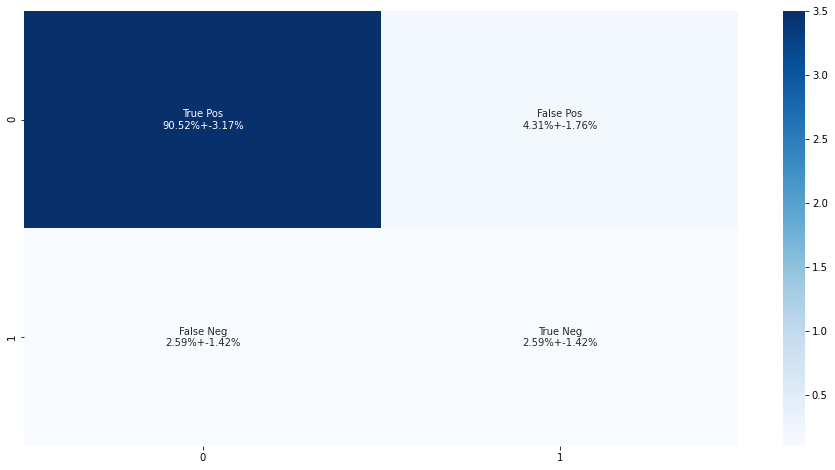

In [ ]:
log_model1 = (X_encoded[features1] @ log_scores1 + log_average1 * np.ones_like(y)).apply(lambda row: sigmoid(row))
abc = (log_model1<=0.45) & (log_model1>0.15)
yy = y[abc]
XX_encoded = X_encoded.loc[abc]
Xmodel1 = XX_encoded[features1] @ Xscores1 + Xaverage1 * np.ones_like(yy)
Xmodel2 = XX_encoded[features2] @ Xscores2 + Xaverage2 * np.ones_like(yy)
Xmodel3 = XX_encoded[features3] @ Xscores3 + Xaverage3 * np.ones_like(yy)
Xmodels_df = pd.DataFrame({'model1': Xmodel1,'model2': Xmodel2,'model3': Xmodel3})
Xmodels = Xmodels_df @ Xscores_t + Xaverage_t * np.ones_like(yy)

abc = (log_model1>0.45) | (log_model1<=0.15)
yy = y[abc]
XX_encoded = X_encoded.loc[abc]
Xlog_model1 = (XX_encoded[features1] @ Xlog_scores1 + Xlog_average1 * np.ones_like(yy)).apply(lambda row: sigmoid(row))
Xlog_model2 = (XX_encoded[features2] @ Xlog_scores2 + Xlog_average2 * np.ones_like(yy)).apply(lambda row: sigmoid(row))
Xlog_model3 = (XX_encoded[features3] @ Xlog_scores3 + Xlog_average3 * np.ones_like(yy)).apply(lambda row: sigmoid(row))
Xlog_models_df = pd.DataFrame({'model1': Xlog_model1,'model2': Xlog_model2,'model3': Xlog_model3})
Xlog_lin_models = Xlog_models_df @ Xlog_lin_scores_t + Xlog_lin_average_t * np.ones_like(yy)

Xmodels.loc[np.abs(Xmodels)>2] = 1.0
best_model = pd.concat([Xlog_lin_models,Xmodels]).sort_index()
loading_scores(best_model,y,pad=False,edge=0.2825,estimator=estimator);

We can't use the R^2 test here because it doesn't make sense if all y_test are the same since R^2 = 1 - (y-y_pred)^2/(y-y^bar)^2.

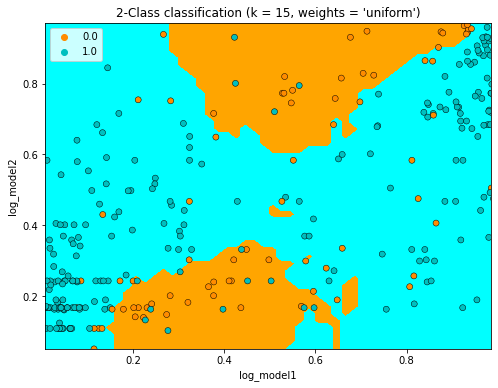

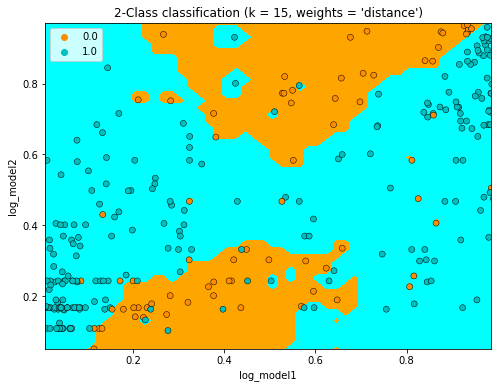

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets

n_neighbors = 15

h = .02  # step size in the mesh

y_best_model = []
for i in y.index:
  if np.abs(log_model1[i] - y[i]) < np.abs(log_model2[i] - y[i]):
    y_best_model.append(1.0)
  else:
    y_best_model.append(0.0)

# Create color maps
#cmap_light = ListedColormap(['orange', 'cyan', 'cornflowerblue'])
#cmap_bold = ['darkorange', 'c', 'darkblue']

cmap_light = ListedColormap(['orange', 'cyan'])
cmap_bold = ['darkorange', 'c']
X_k_neighbors = np.column_stack((log_model1,log_model2))

for weights in ['uniform', 'distance']:
    # we create an instance of Neighbours Classifier and fit the data.
    clf = neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
    clf.fit(X_k_neighbors, y_best_model)

    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    x_min, x_max = X_k_neighbors[:, 0].min(), X_k_neighbors[:, 0].max()
    y_min, y_max = X_k_neighbors[:, 1].min(), X_k_neighbors[:, 1].max()
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.figure(figsize=(8, 6))
    plt.contourf(xx, yy, Z, cmap=cmap_light)

    # Plot also the training points
    sns.scatterplot(x=X_k_neighbors[:, 0], y=X_k_neighbors[:, 1], hue=y_best_model,
                    palette=cmap_bold, alpha=1.0, edgecolor="black")
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.title("2-Class classification (k = %i, weights = '%s')"
              % (n_neighbors, weights))
    plt.xlabel("log_model1")
    plt.ylabel("log_model2")

plt.show()

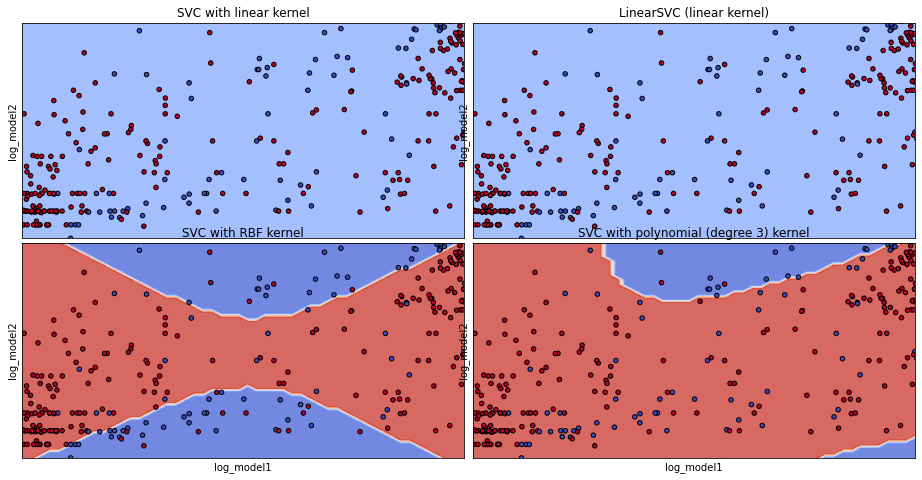

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from sklearn import svm, datasets

def make_meshgrid(x, y, h=.02):
    """Create a mesh of points to plot in

    Parameters
    ----------
    x: data to base x-axis meshgrid on
    y: data to base y-axis meshgrid on
    h: stepsize for meshgrid, optional

    Returns
    -------
    xx, yy : ndarray
    """
    x_min, x_max = x.min(), x.max()
    y_min, y_max = y.min(), y.max()
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    return xx, yy

def plot_contours(ax, clf, xx, yy, **params):
    """Plot the decision boundaries for a classifier.

    Parameters
    ----------
    ax: matplotlib axes object
    clf: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    params: dictionary of params to pass to contourf, optional
    """
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out

C = 10000  # SVM regularization parameter

y_best_model = []
for i in y.index:
  if np.abs(log_model1[i] - y[i]) < np.abs(log_model2[i] - y[i]):
    y_best_model.append(1.0)
  else:
    y_best_model.append(0.0)

# Create color maps
#cmap_light = ListedColormap(['orange', 'cyan', 'cornflowerblue'])
#cmap_bold = ['darkorange', 'c', 'darkblue']

cmap_light = ListedColormap(['orange', 'cyan'])
cmap_bold = ['darkorange', 'c']
X_k_neighbors = np.column_stack((log_model1,log_model2))

models = (svm.SVC(kernel='linear', C=C),
          svm.LinearSVC(C=C, max_iter=10000),
          svm.SVC(kernel='rbf', gamma=0.1, C=C),
          svm.SVC(kernel='poly', degree=3, gamma='auto', C=C))
models = [clf.fit(X_k_neighbors, y_best_model) for clf in models]

# title for the plots
titles = ('SVC with linear kernel',
          'LinearSVC (linear kernel)',
          'SVC with RBF kernel',
          'SVC with polynomial (degree 3) kernel')

# Set-up 2x2 grid for plotting.
fig, sub = plt.subplots(2, 2)
plt.subplots_adjust(wspace=0.02, hspace=0.02)

X0, X1 = X_k_neighbors[:, 0], X_k_neighbors[:, 1]
xx, yy = make_meshgrid(X0, X1)

for clf, title, ax in zip(models, titles, sub.flatten()):
    plot_contours(ax, clf, xx, yy,
                  cmap=plt.cm.coolwarm, alpha=0.8)
    ax.scatter(X0, X1, c=y_best_model, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xlabel('log_model1')
    ax.set_ylabel('log_model2')
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(title)

plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV
parameters = [{'kernel':['rbf'], 'C':[1,10,100,1000,10000,100000], 'gamma':['scale',0.0001,0.001,0.01,0.1,1,10,100]},]
optimal_params = GridSearchCV(svm.SVC(),parameters,cv=30,scoring='accuracy',verbose=0)
optimal_params.fit(X_k_neighbors,y_best_model) #StatQuest said to use training data here but it's just a number...

GridSearchCV(cv=30, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid=[{'C': [1, 10, 100, 1000, 10000, 100000],
                          'gamma': ['scale', 0.0001, 0.001, 0.01, 0.1, 1, 10,
                                    100],
                          'kernel': ['rbf']}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='accuracy', verbose=0)

In [ ]:
optimal_params.best_params_

{'C': 10000, 'gamma': 0.1, 'kernel': 'rbf'}

In [ ]:
clf = svm.SVC(kernel='rbf', gamma=0.1, C=10000)
clf.fit(X_k_neighbors, y_best_model)
which_model = clf.predict(X_k_neighbors)
X_encoded['which_model'] = which_model
X_encoded['y'] = y
grouped = X_encoded.groupby(X_encoded.which_model)
model1_group = grouped.get_group(1.0)
model1_y = model1_group['y']
model1_group.drop(columns=['which_model','y'],inplace=True)
model2_group = grouped.get_group(0.0)
model2_y = model2_group['y']
model2_group.drop(columns=['which_model','y'],inplace=True)

Feature-selection for model1_group

How many features?

In [ ]:
beta = model1_group.shape[1]/model1_group.shape[0]
omega = 0.56*beta**3 - 0.95*beta**2 + 1.82*beta+1.43
result = cross_correlate(model1_group,model1_y,pad=True)
np.median(np.diagonal(result['S'][0]))*omega

8.595758165671507

In [ ]:
np.diagonal(result['S'][0])

array([4.63505570e+03, 5.01400530e+02, 3.05784436e+02, 1.23468944e+02,
       1.44581249e+01, 1.05294428e+01, 9.98882205e+00, 7.77791064e+00,
       7.65028037e+00, 6.62812441e+00, 6.25863922e+00, 6.20335513e+00,
       5.60077409e+00, 5.00825650e+00, 4.54475502e+00, 4.11374387e+00,
       3.61422537e+00, 3.15702973e+00, 3.04433163e+00, 1.75550461e+00,
       1.31861502e+00, 4.47002444e-13, 4.47002444e-13, 4.47002444e-13,
       4.47002444e-13, 4.47002444e-13])

7 again (but possibly 8 or 9 as we saw).

In [ ]:
beta = model2_group.shape[1]/model2_group.shape[0]
omega = 0.56*beta**3 - 0.95*beta**2 + 1.82*beta+1.43
result = cross_correlate(model2_group,model2_y,pad=True)
np.median(np.diagonal(result['S'][0]))*omega

5.613822392509769

In [ ]:
np.diagonal(result['S'][0])

array([2.53269280e+03, 2.77191019e+02, 1.56973356e+02, 6.44757522e+01,
       1.18483150e+01, 6.26420344e+00, 5.28692980e+00, 4.79725622e+00,
       4.76687511e+00, 3.73349464e+00, 3.50354502e+00, 3.35698531e+00,
       2.92481744e+00, 2.75285515e+00, 2.49491335e+00, 2.08149664e+00,
       1.91545730e+00, 1.80218606e+00, 1.68665085e+00, 1.29740491e+00,
       6.61281958e-01, 2.45664069e-13, 2.45664069e-13, 2.45664069e-13,
       2.45664069e-13, 2.45664069e-13])

Only 6 for the second group (but possibly 7 or 8).

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features = [feature for feature in model1_group.columns if random.random() > 0.5]
    temp = hard_function(tau = tau, X = model1_group[features], y=model1_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

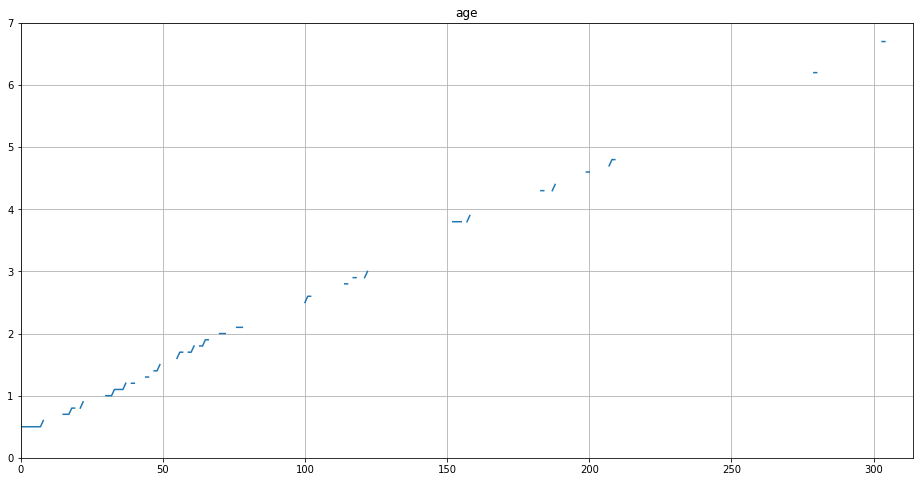

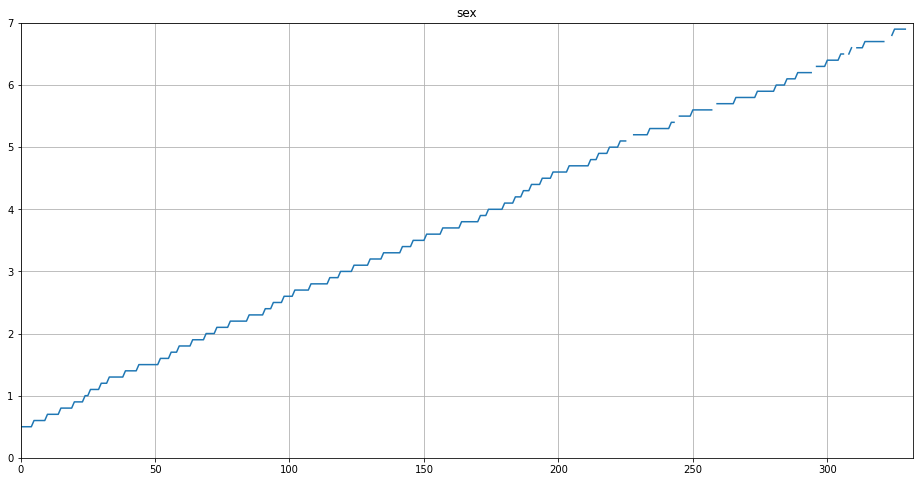

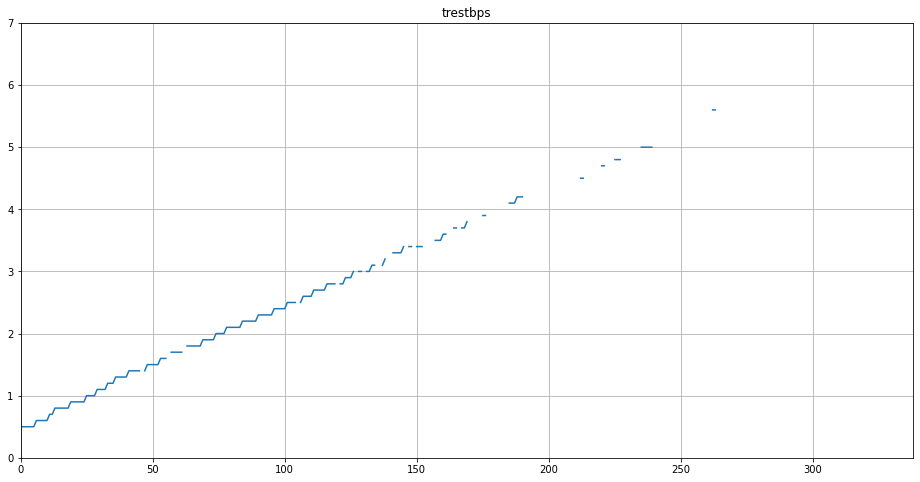

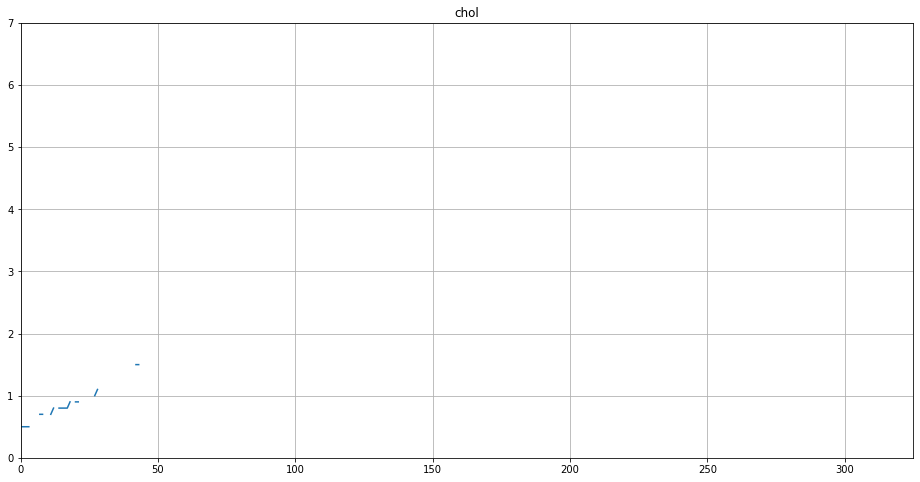

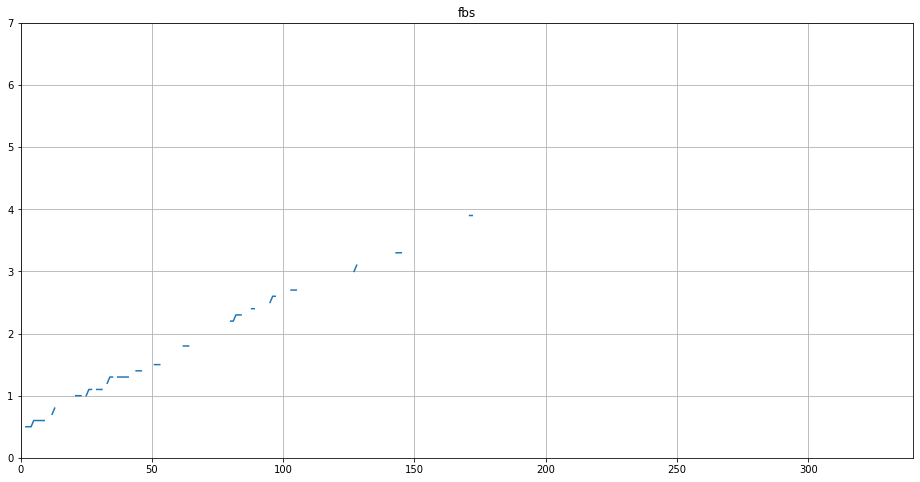

...

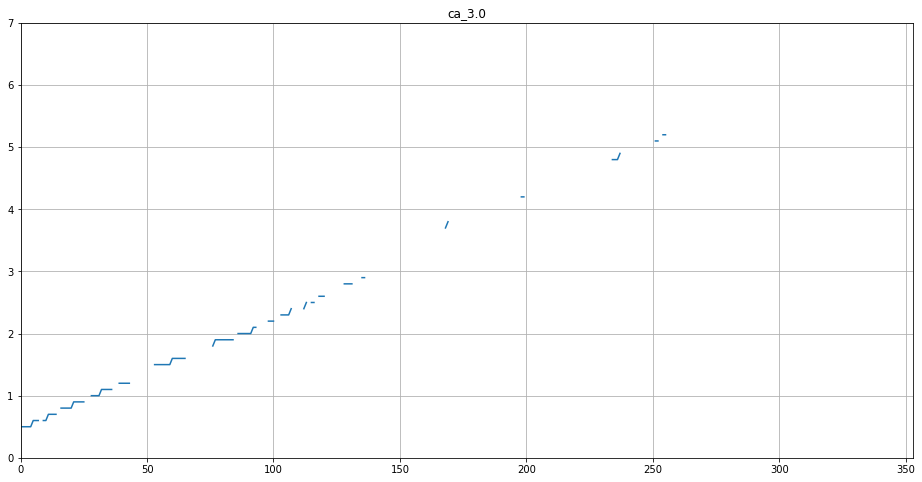

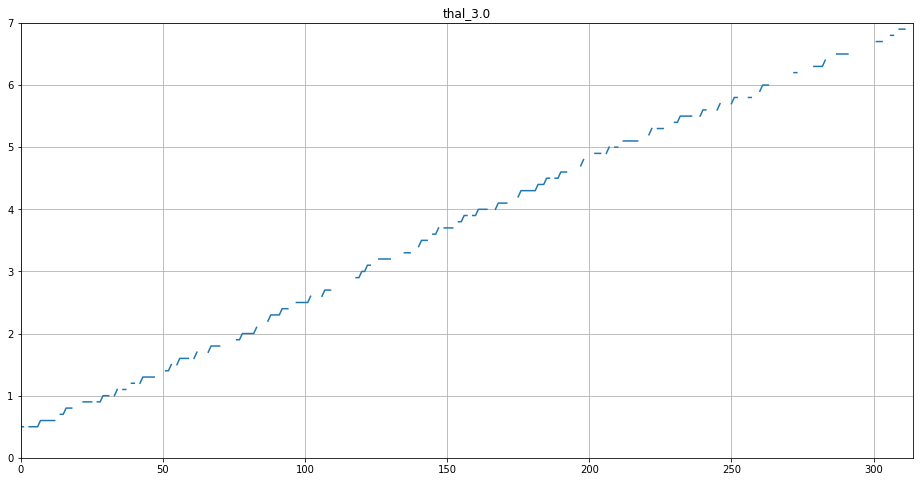

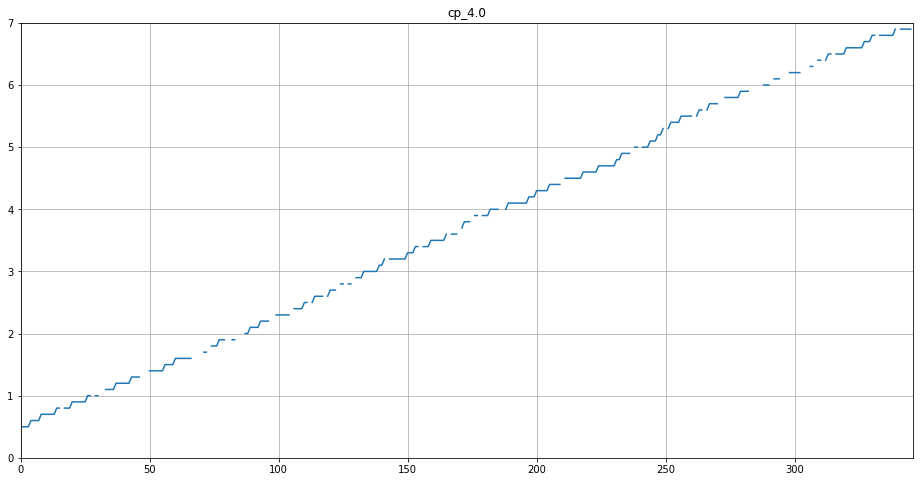

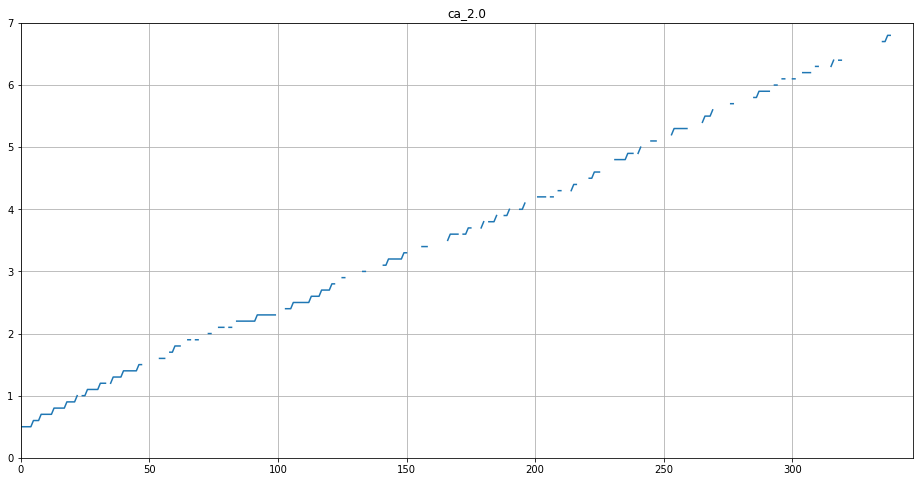

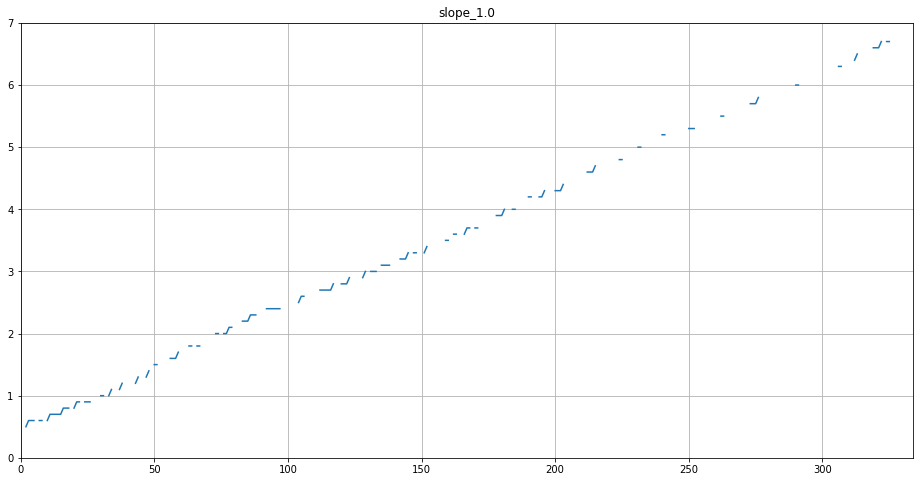

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  #ax1 = fig.add_subplot(141)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])

  plt.grid()

non-zero
```
sex 350
cp_4.0 300
thalach 300
ca_0.0 300
oldpeak 250
thal_3.0 200
ca_2.0 200
trestbps 150
age 50
exang 75
cp_1.0 60
ca_1.0 50
ca_3.0 50
```

Not so easy this time.

In [ ]:
features1 = ['sex','thalach','ca_0.0','oldpeak','cp_4.0','thal_3.0','ca_2.0']

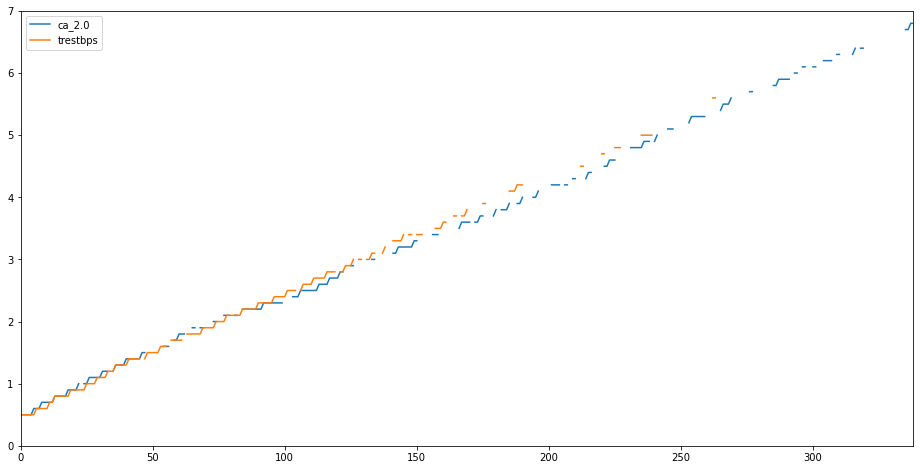

In [ ]:
fig = plt.figure(i)
for i in ['ca_2.0','trestbps']:
  #ax1 = fig.add_subplot(141)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i],label=i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

plt.legend()

Accuracy (test)= 0.8912+-0.0199
Acuracy (train)= 0.906+-0.0008
Efron's R^2 (test)= 0.5601+-0.0653
Efron's R^2 (train)= 0.6558+-0.0019
Sensitivity (test) = 0.8347+-0.0375
Sensitivity (train) = 0.8579+-0.0353
Specificity (test) = 0.9344+-0.0219
Specificity (train) = 0.9421+-0.0207


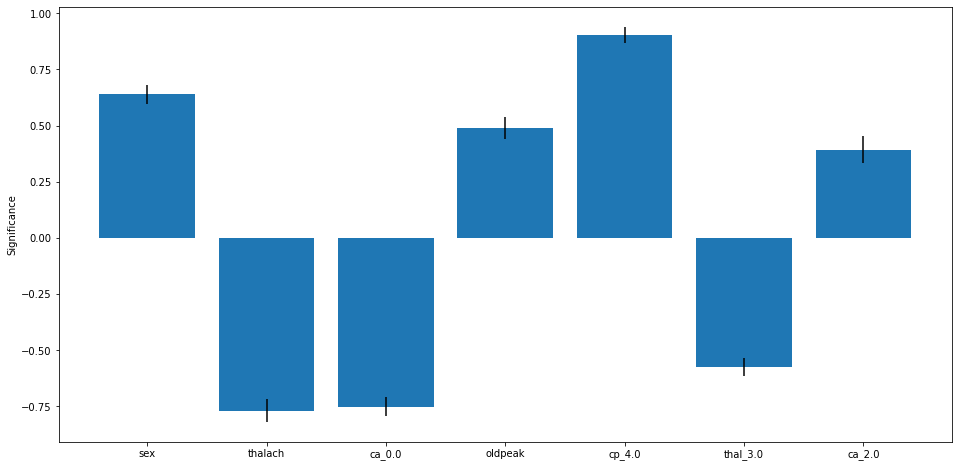

Accuracy (test)= 0.8914+-0.0213
Acuracy (train)= 0.9077+-0.0009
Efron's R^2 (test)= 0.5626+-0.0679
Efron's R^2 (train)= 0.6653+-0.0019
Sensitivity (test) = 0.8316+-0.0378
Sensitivity (train) = 0.8666+-0.0343
Specificity (test) = 0.9359+-0.0216
Specificity (train) = 0.9375+-0.0214


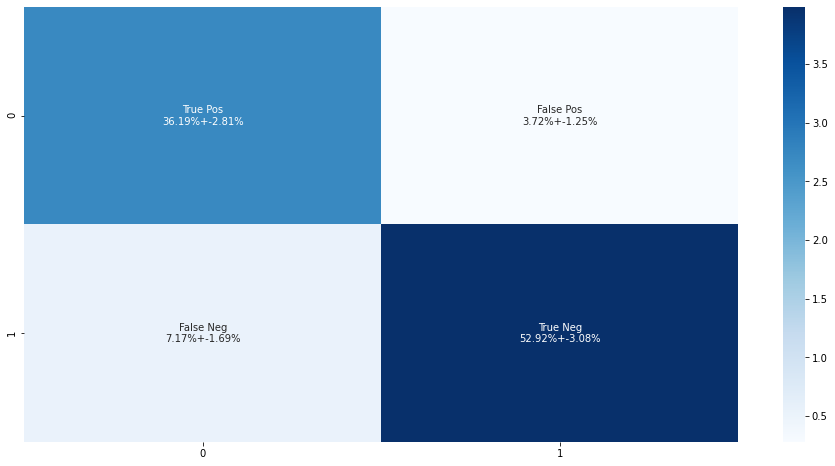

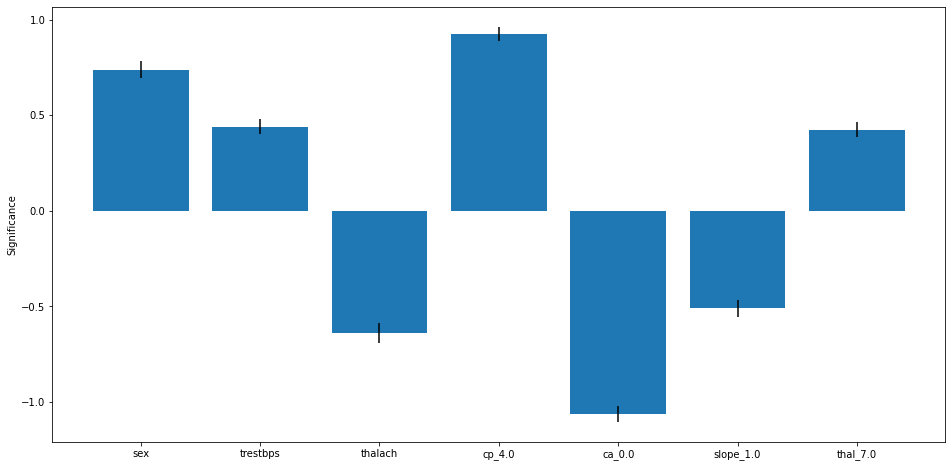

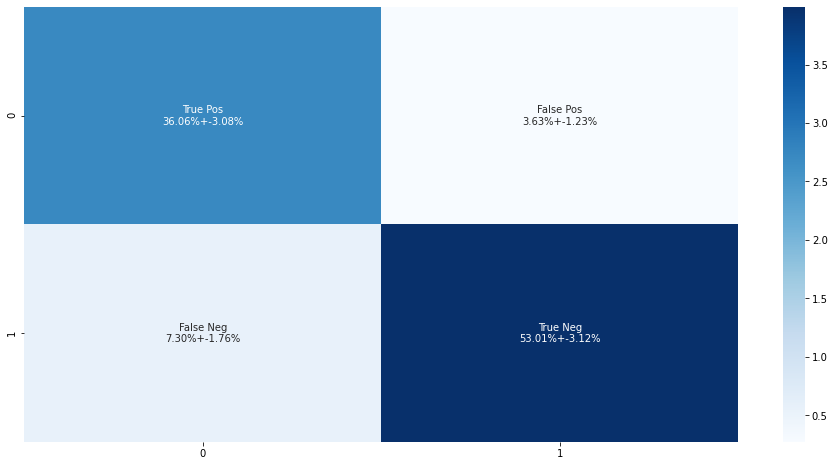

In [ ]:
features1 = ['sex','thalach','ca_0.0','oldpeak','cp_4.0','thal_3.0','ca_2.0']
features1_old = ['sex','trestbps','thalach','cp_4.0', 'ca_0.0', 'slope_1.0','thal_7.0']
loading_scores(model1_group[features1],model1_y,pad=True,estimator=logistic_estimator);
loading_scores(model1_group[features1_old],model1_y,pad=True,estimator=logistic_estimator);

I did it. Now I can explain.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features = [feature for feature in model2_group.columns if random.random() > 0.5]
    temp = hard_function(tau = tau, X = model2_group[features], y=model2_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

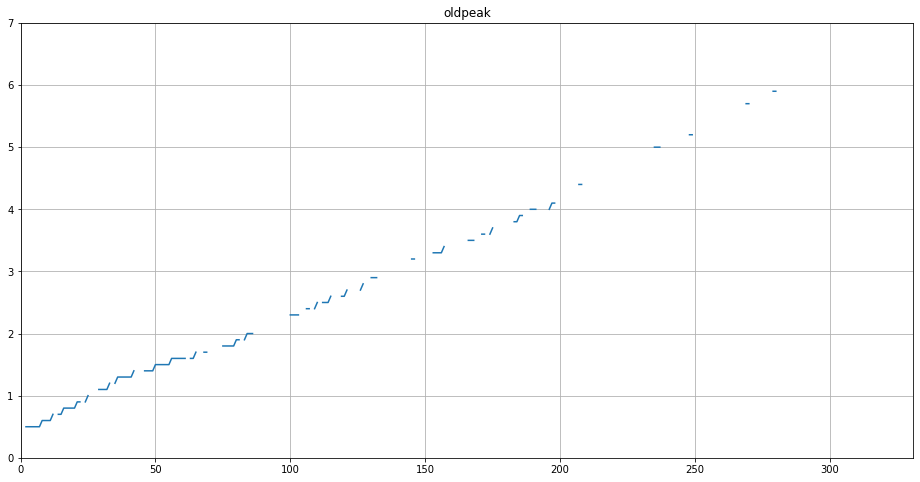

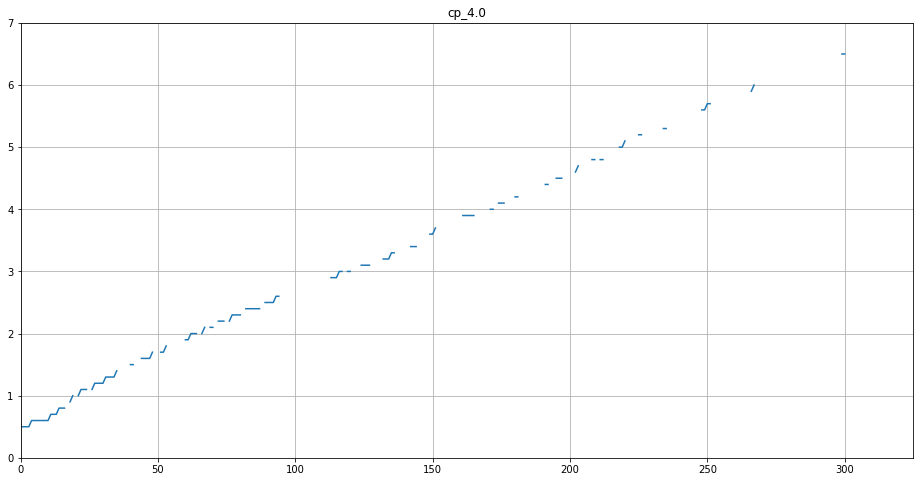

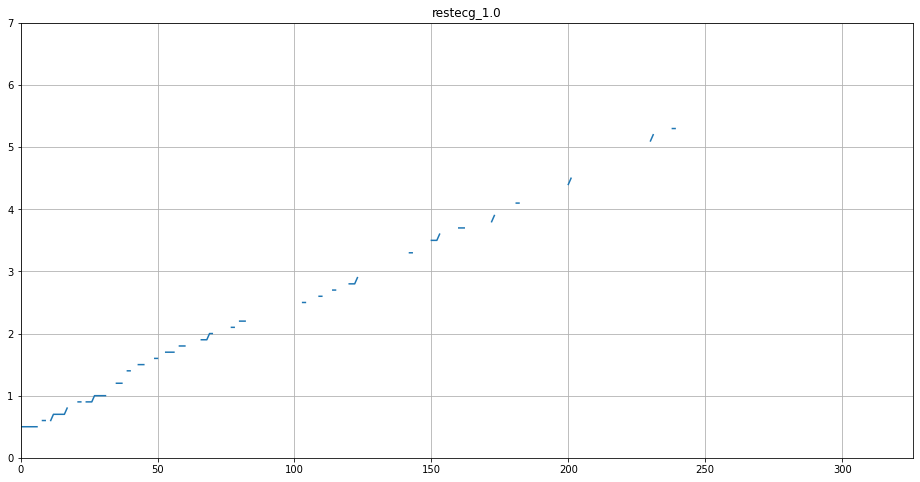

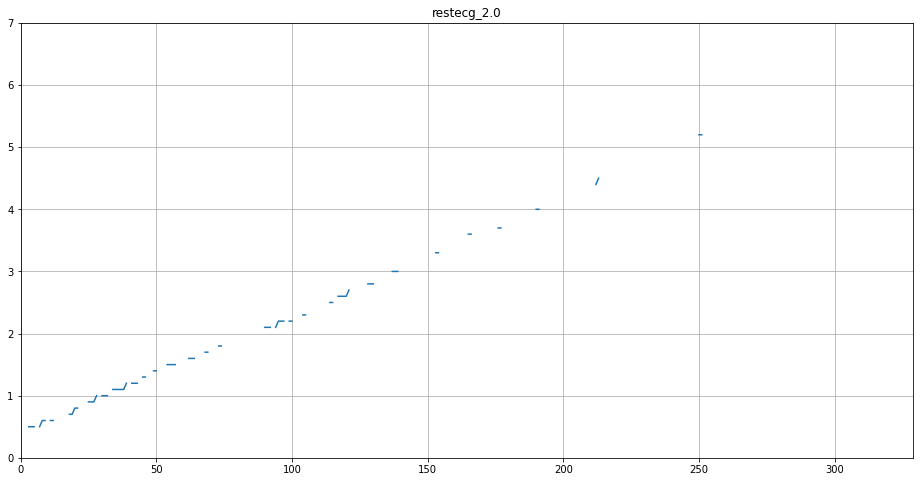

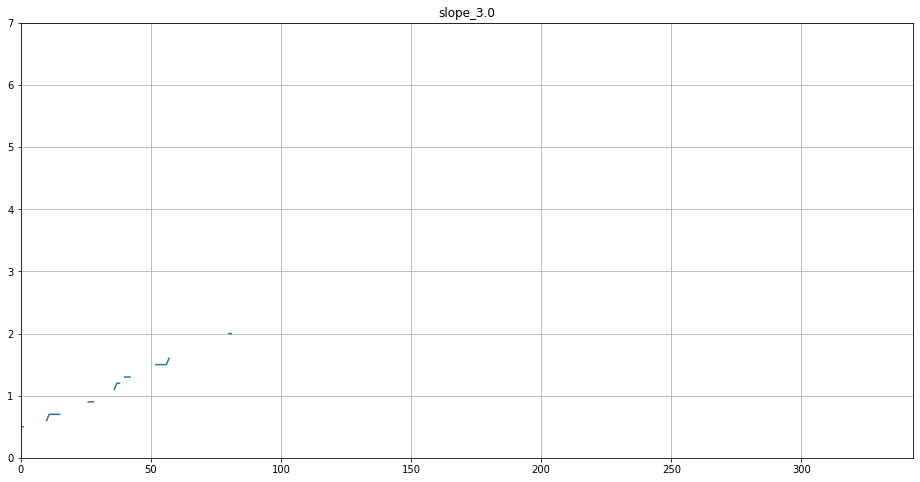

...

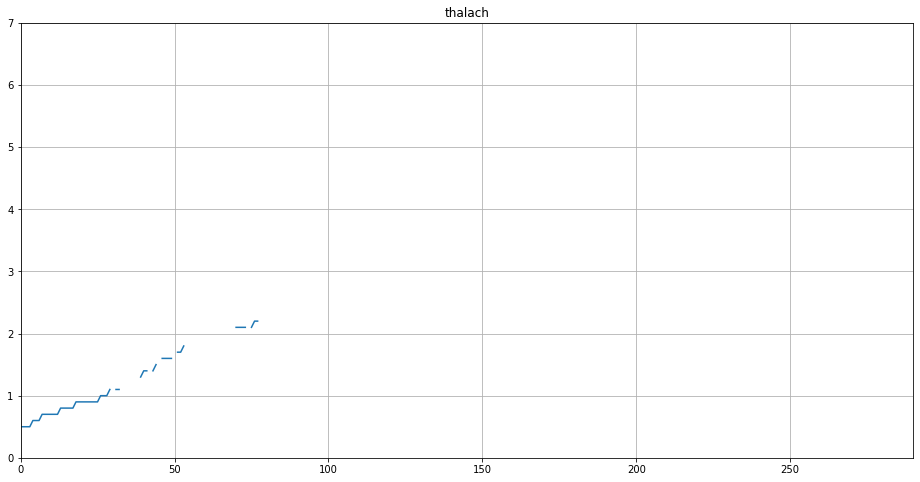

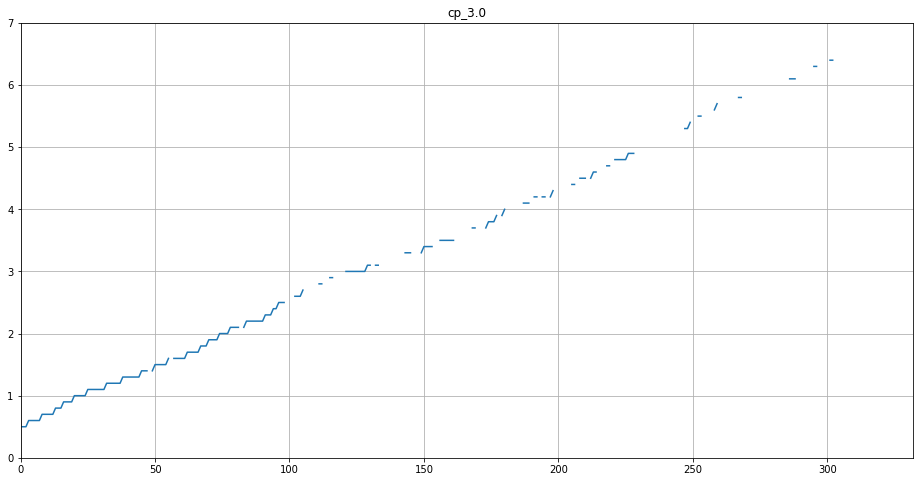

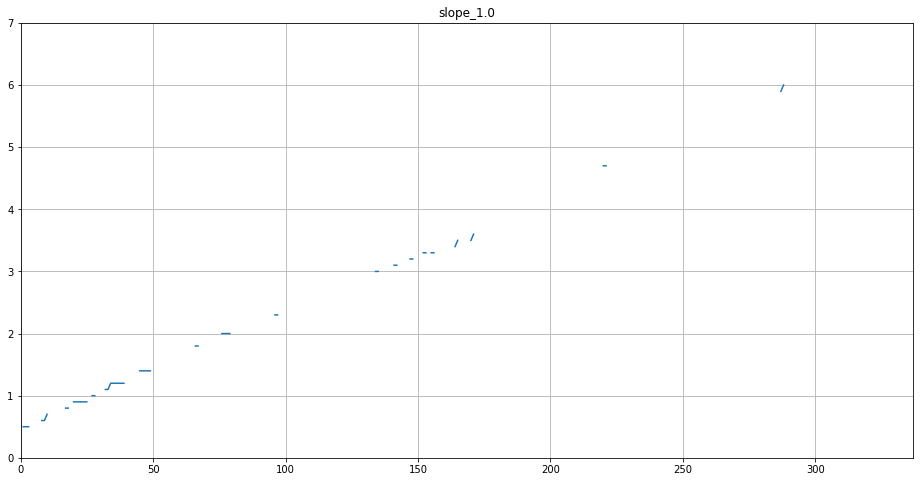

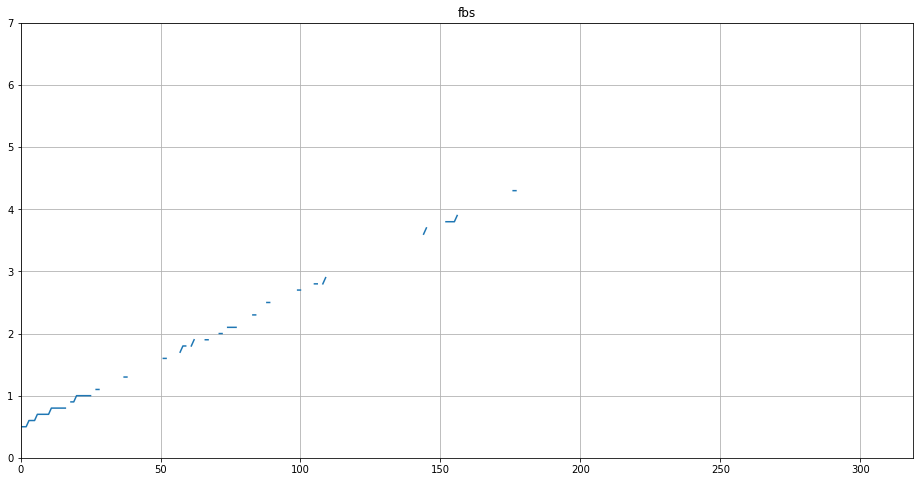

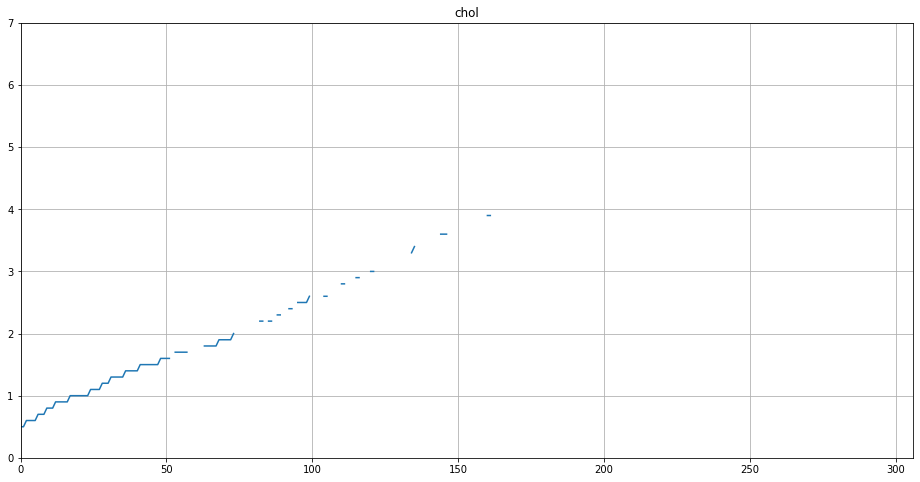

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  #ax1 = fig.add_subplot(141)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])

  plt.grid()

```
exang 300
thal_7.0 170
cp_3.0 100
ca_0.0 100
age 100
ca_3.0 80
oldpeak 70
chol 50
fbs 25
thalach 35
thal_6.0 30
restecg_0.0 50
cp_4.0 50
```

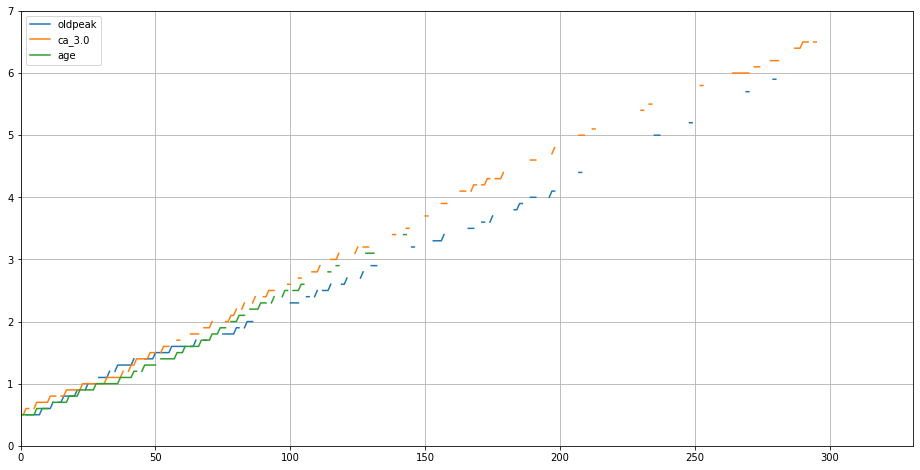

In [ ]:
fig = plt.figure(i)
for i in ['oldpeak','ca_3.0','age']:
  #ax1 = fig.add_subplot(141)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i],label=i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

plt.legend()

Accuracy (test)= 0.7561+-0.0491
Acuracy (train)= 0.7909+-0.0018
Efron's R^2 (test)= 0.1711+-0.0735
Efron's R^2 (train)= 0.4228+-0.0027
Sensitivity (test) = 0.7026+-0.0731
Sensitivity (train) = 0.7281+-0.0712
Specificity (test) = 0.8125+-0.069
Specificity (train) = 0.8539+-0.0624


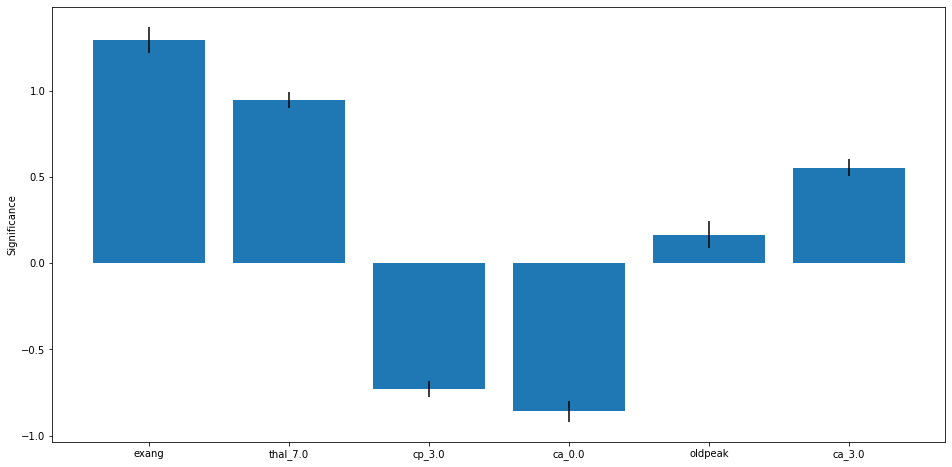

Accuracy (test)= 0.7528+-0.0516
Acuracy (train)= 0.7977+-0.0023
Efron's R^2 (test)= 0.1542+-0.0755
Efron's R^2 (train)= 0.3826+-0.0035
Sensitivity (test) = 0.6949+-0.0737
Sensitivity (train) = 0.7575+-0.0686
Specificity (test) = 0.8312+-0.0661
Specificity (train) = 0.8417+-0.0645


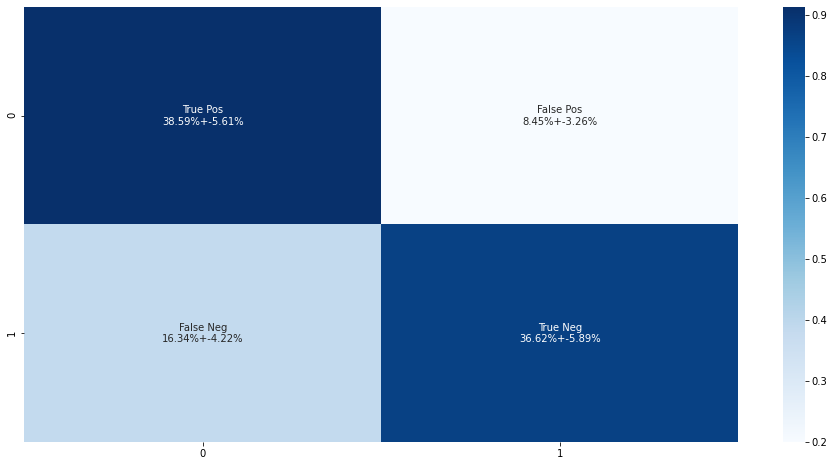

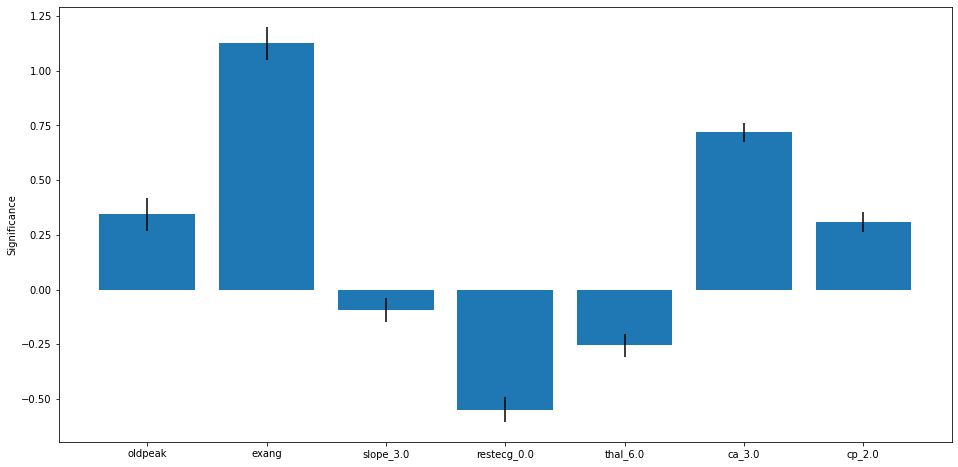

Accuracy (test)= 0.5844+-0.0589
Acuracy (train)= 0.7595+-0.0042
Efron's R^2 (test)= 0.0783+-0.0552
Efron's R^2 (train)= 0.3327+-0.0027
Sensitivity (test) = 0.659+-0.0755
Sensitivity (train) = 0.8097+-0.0629
Specificity (test) = 0.4906+-0.0883
Specificity (train) = 0.6571+-0.0839


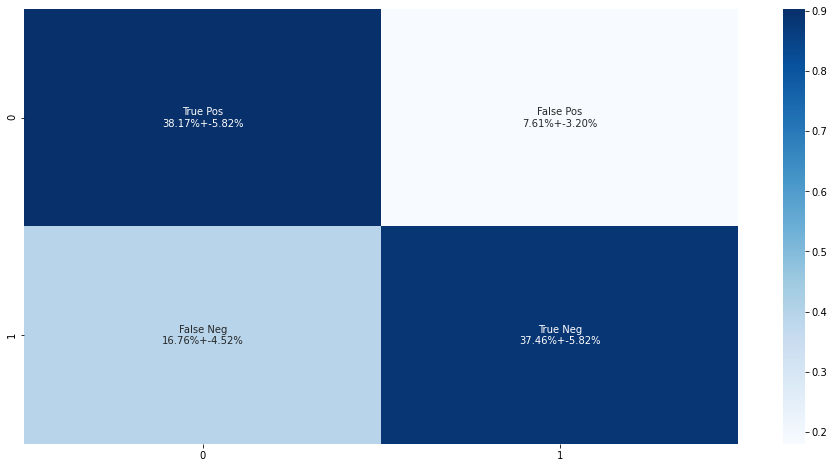

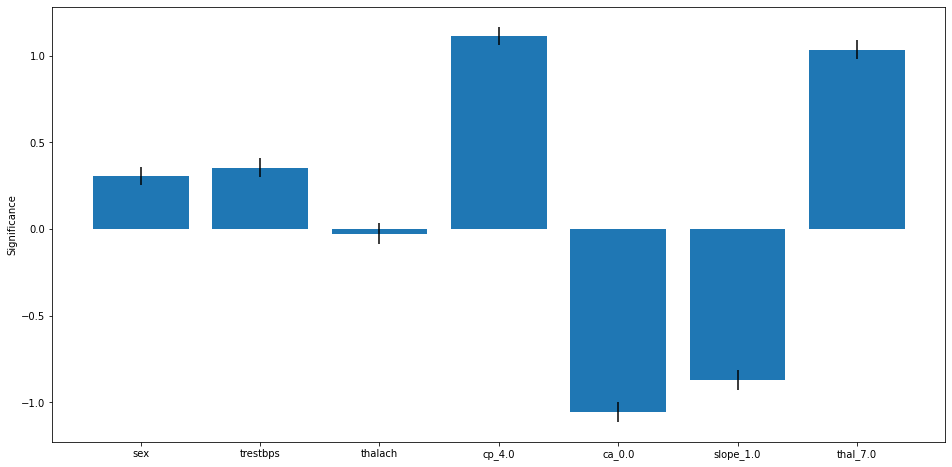

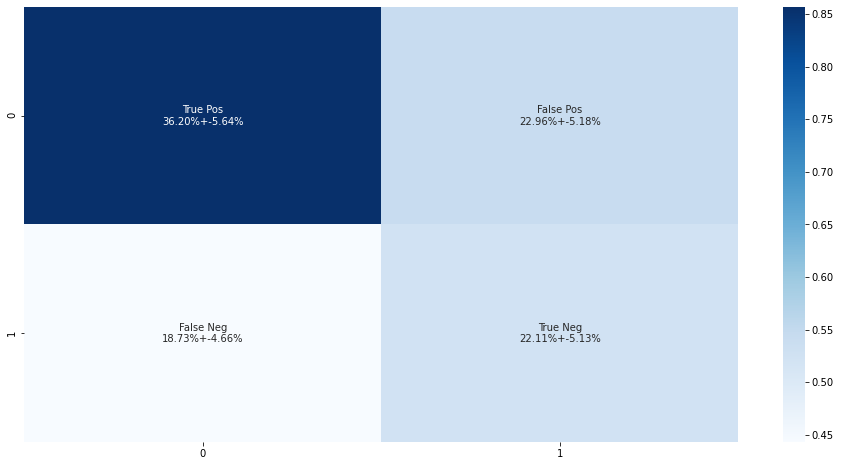

In [ ]:
features2=['exang','thal_7.0','cp_3.0','ca_0.0','oldpeak','ca_3.0']
features2_old = ['oldpeak','exang','slope_3.0','restecg_0.0','thal_6.0','ca_3.0','cp_2.0']
features1_old = ['sex','trestbps','thalach','cp_4.0', 'ca_0.0', 'slope_1.0','thal_7.0']
loading_scores(model2_group[features2],model2_y,pad=True,estimator=logistic_estimator);
loading_scores(model2_group[features2_old],model2_y,pad=True,estimator=logistic_estimator);
loading_scores(model2_group[features1_old],model2_y,pad=True,estimator=logistic_estimator);

I did it again. Higher R^2 and the same accuracy.

I don't like that Efron's R^2 is so much worse for test than train with nr_fold = 30. Something about having just 4 people in test makes it bad.

In [40]:
warnings.filterwarnings('ignore')
features1 = ['sex','thalach','ca_0.0','oldpeak','cp_4.0','thal_3.0','ca_2.0']
features2=['exang','thal_7.0','cp_3.0','ca_0.0','oldpeak','ca_3.0']
print("Log Model 1")
log_scores1,log_average1,_ = loading_scores(X_encoded[features1],y,estimator=logistic_estimator,pad=True)
print("Log Model 2")
log_scores2,log_average2,_ = loading_scores(X_encoded[features2],y,estimator=logistic_estimator,pad=True)
log_model1 = (X_encoded[features1] @ log_scores1 + log_average1 * np.ones_like(y)).apply(lambda row: sigmoid(row))
log_model2 = (X_encoded[features2] @ log_scores2 + log_average2 * np.ones_like(y)).apply(lambda row: sigmoid(row))


Log Model 1


KeyError: ignored

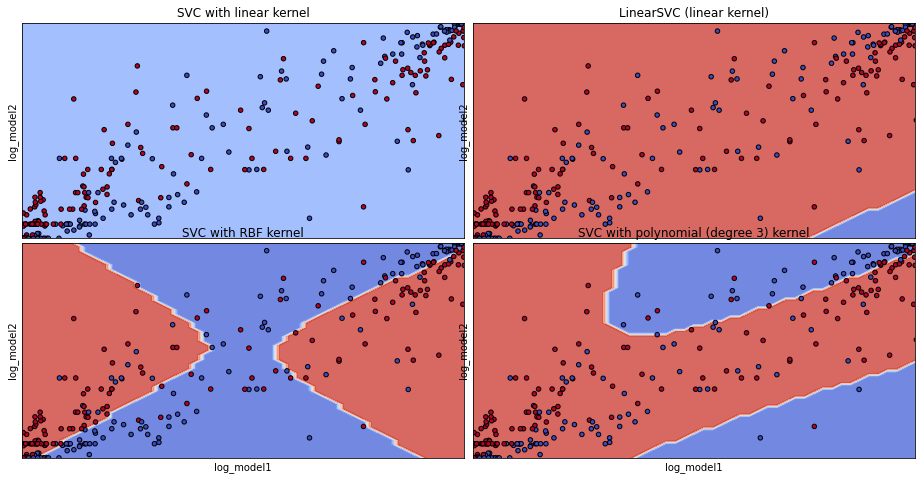

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from sklearn import svm, datasets

def make_meshgrid(x, y, h=.02):
    """Create a mesh of points to plot in

    Parameters
    ----------
    x: data to base x-axis meshgrid on
    y: data to base y-axis meshgrid on
    h: stepsize for meshgrid, optional

    Returns
    -------
    xx, yy : ndarray
    """
    x_min, x_max = x.min(), x.max()
    y_min, y_max = y.min(), y.max()
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    return xx, yy

def plot_contours(ax, clf, xx, yy, **params):
    """Plot the decision boundaries for a classifier.

    Parameters
    ----------
    ax: matplotlib axes object
    clf: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    params: dictionary of params to pass to contourf, optional
    """
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out

C = 10000  # SVM regularization parameter

y_best_model = []
for i in y.index:
  if np.abs(log_model1[i] - y[i]) < np.abs(log_model2[i] - y[i]):
    y_best_model.append(1.0)
  else:
    y_best_model.append(0.0)

# Create color maps
#cmap_light = ListedColormap(['orange', 'cyan', 'cornflowerblue'])
#cmap_bold = ['darkorange', 'c', 'darkblue']

cmap_light = ListedColormap(['orange', 'cyan'])
cmap_bold = ['darkorange', 'c']
X_k_neighbors = np.column_stack((log_model1,log_model2))

models = (svm.SVC(kernel='linear', C=C),
          svm.LinearSVC(C=C, max_iter=10000),
          svm.SVC(kernel='rbf', gamma=0.1, C=C),
          svm.SVC(kernel='poly', degree=3, gamma='auto', C=C))
models = [clf.fit(X_k_neighbors, y_best_model) for clf in models]

# title for the plots
titles = ('SVC with linear kernel',
          'LinearSVC (linear kernel)',
          'SVC with RBF kernel',
          'SVC with polynomial (degree 3) kernel')

# Set-up 2x2 grid for plotting.
fig, sub = plt.subplots(2, 2)
plt.subplots_adjust(wspace=0.02, hspace=0.02)

X0, X1 = X_k_neighbors[:, 0], X_k_neighbors[:, 1]
xx, yy = make_meshgrid(X0, X1)

for clf, title, ax in zip(models, titles, sub.flatten()):
    plot_contours(ax, clf, xx, yy,
                  cmap=plt.cm.coolwarm, alpha=0.8)
    ax.scatter(X0, X1, c=y_best_model, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xlabel('log_model1')
    ax.set_ylabel('log_model2')
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(title)

plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV
parameters = [{'kernel':['rbf'], 'C':[1,10,100,1000,10000,100000], 'gamma':['scale',0.0001,0.001,0.01,0.1,1,10,100]},]
optimal_params = GridSearchCV(svm.SVC(),parameters,cv=30,scoring='accuracy',verbose=0)
optimal_params.fit(X_k_neighbors,y_best_model) #StatQuest said to use training data here but it's just a number...

GridSearchCV(cv=30, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid=[{'C': [1, 10, 100, 1000, 10000, 100000],
                          'gamma': ['scale', 0.0001, 0.001, 0.01, 0.1, 1, 10,
                                    100],
                          'kernel': ['rbf']}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='accuracy', verbose=0)

In [ ]:
optimal_params.best_params_

{'C': 10000, 'gamma': 1, 'kernel': 'rbf'}

In [ ]:
clf = svm.SVC(kernel='rbf', gamma=1, C=10000)
clf.fit(X_k_neighbors, y_best_model)
which_model = clf.predict(X_k_neighbors)
X_encoded['which_model'] = which_model
X_encoded['y'] = y
grouped = X_encoded.groupby(X_encoded.which_model)
model1_group = grouped.get_group(1.0)
model1_y = model1_group['y']
model1_group.drop(columns=['which_model','y'],inplace=True)
model2_group = grouped.get_group(0.0)
model2_y = model2_group['y']
model2_group.drop(columns=['which_model','y'],inplace=True)

## finding features

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features = [feature for feature in model1_group.columns if random.random() > 0.5]
    temp = hard_function(tau = tau, X = model1_group[features], y=model1_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

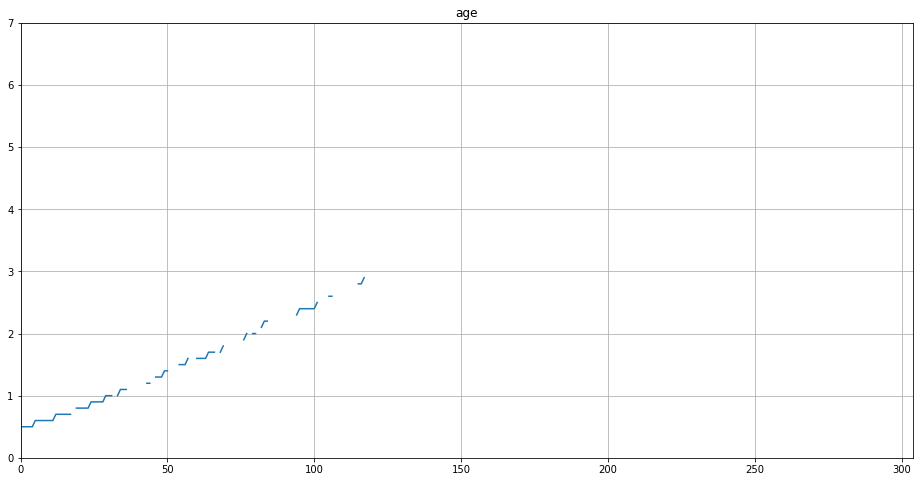

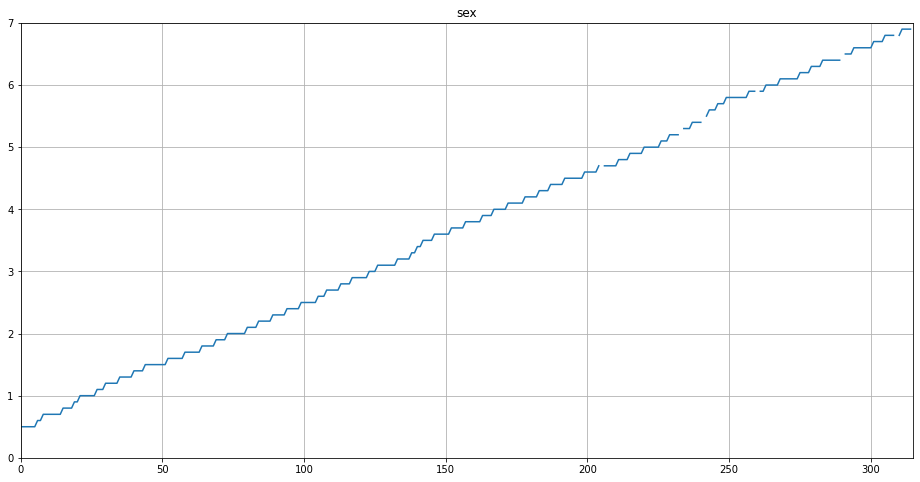

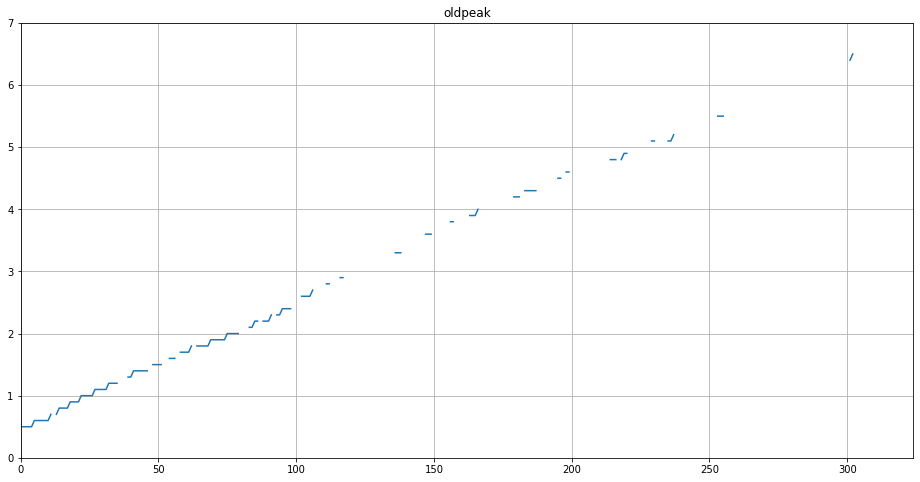

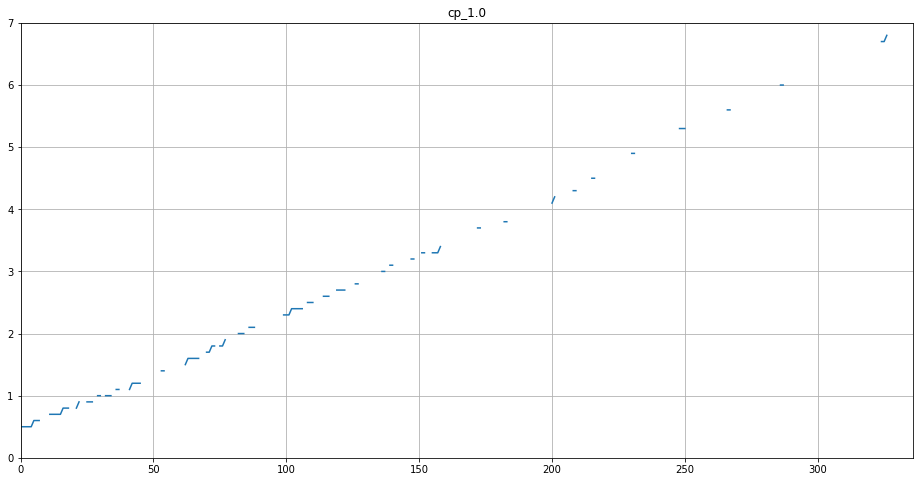

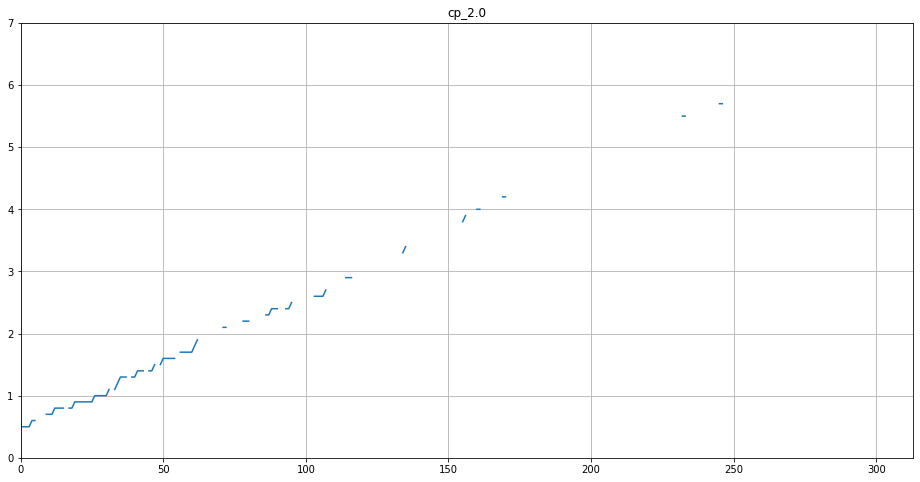

...

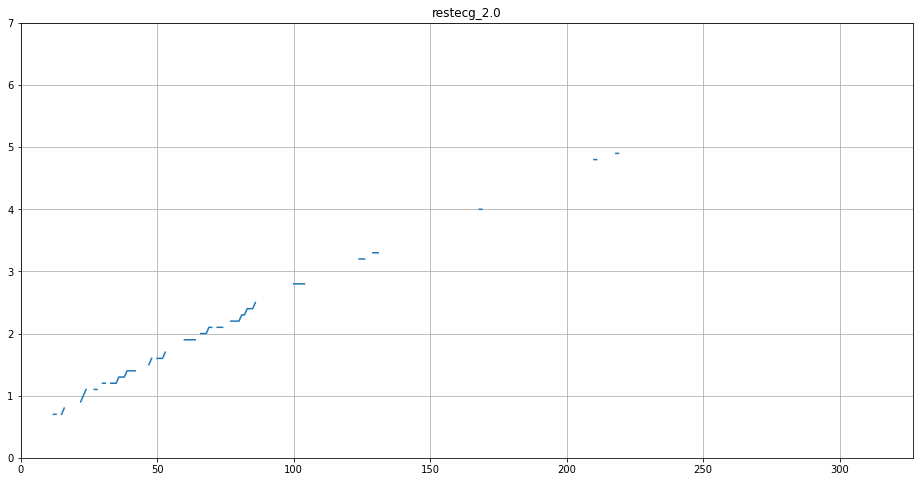

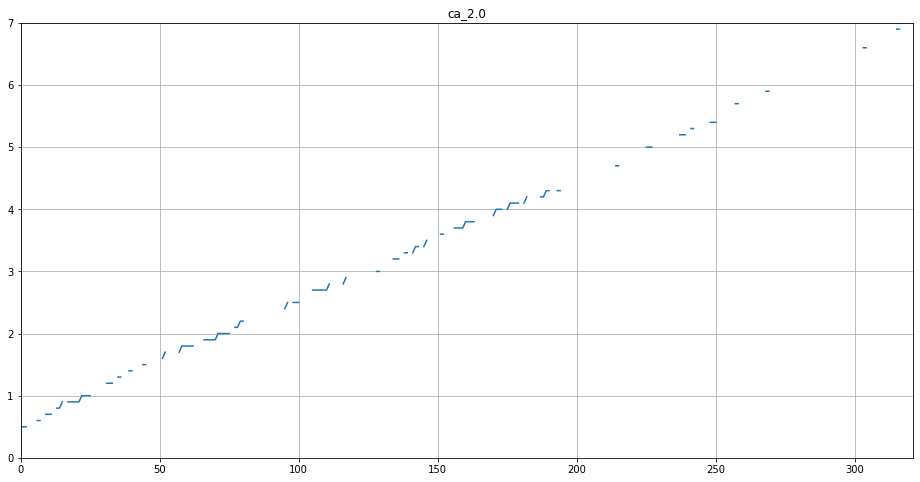

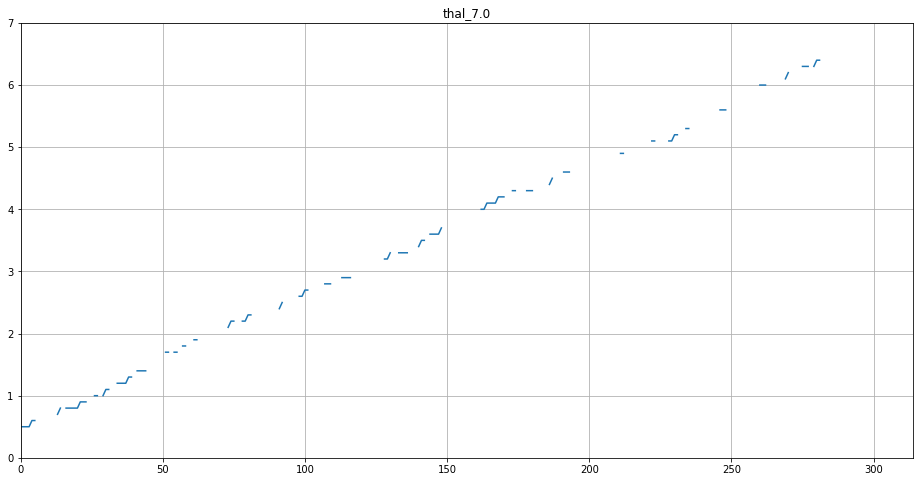

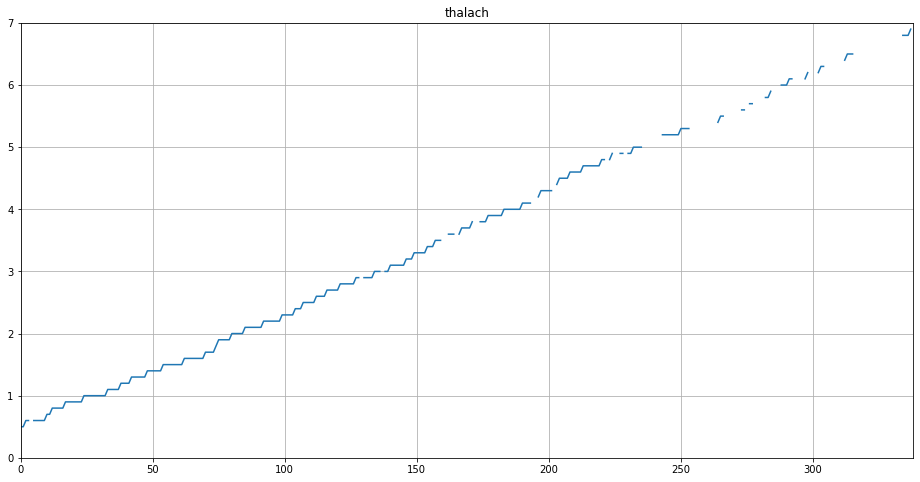

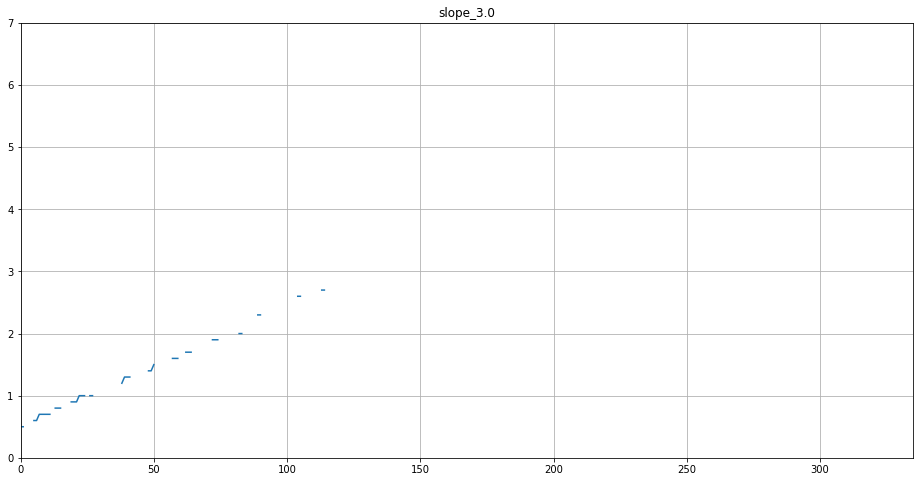

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  #ax1 = fig.add_subplot(141)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])

  plt.grid()

```
thalach 225
thal_7.0 unknown
ca_2.0 unknown
cp_4.0 325
thal_3.0 unknown
ca_1.0 unknown
ca_0.0 325
slope_2.0 unknown
slope_1.0 unknown
cp_3.0 unknown
sex 325
```

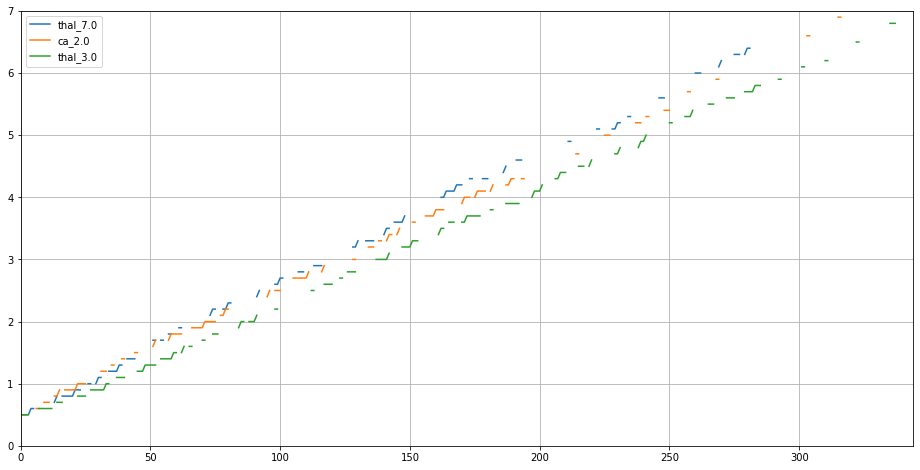

In [ ]:
fig = plt.figure(i)
for i in ['thal_7.0','ca_2.0','thal_3.0']:
  #ax1 = fig.add_subplot(141)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i],label=i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

plt.legend()

We won't take ca_2.0

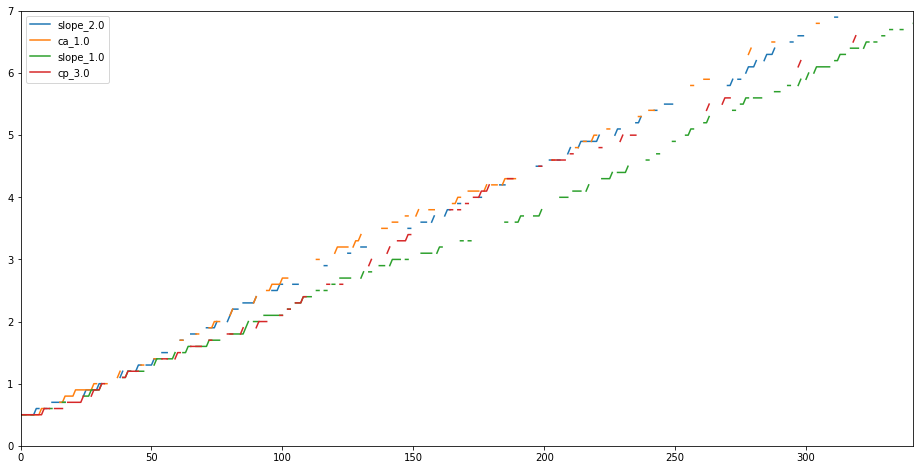

In [ ]:
fig = plt.figure(i)
for i in ['slope_2.0','ca_1.0','slope_1.0','cp_3.0']:
  #ax1 = fig.add_subplot(141)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i],label=i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

plt.legend()

We won't take cp_3.0.

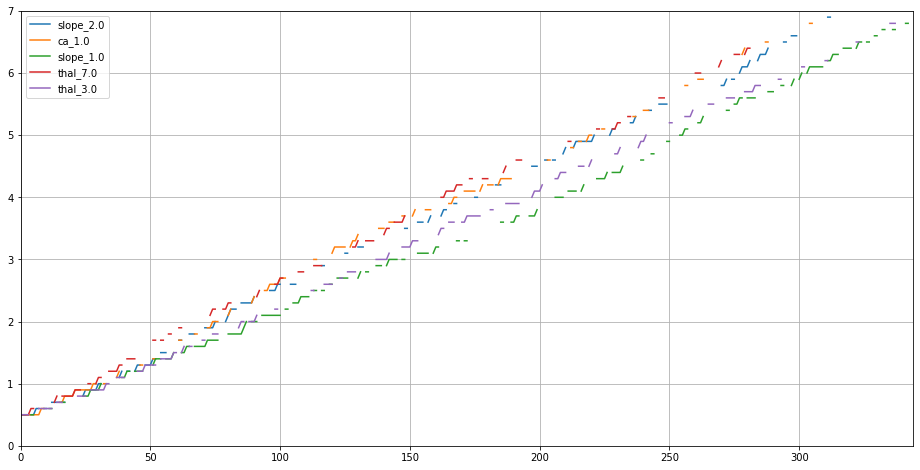

In [ ]:
fig = plt.figure(i)
for i in ['slope_2.0','ca_1.0','slope_1.0','thal_7.0','thal_3.0']:
  #ax1 = fig.add_subplot(141)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i],label=i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

plt.legend()

We won't take ca_1.0

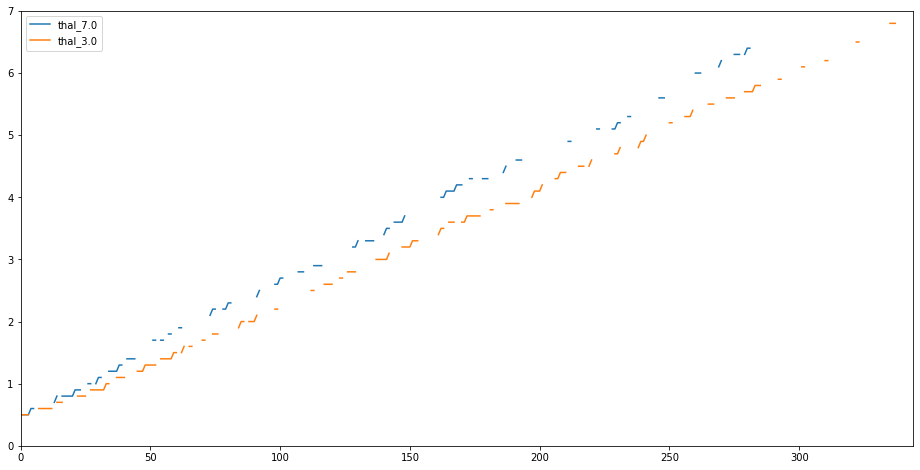

In [ ]:
fig = plt.figure(i)
for i in ['thal_7.0','thal_3.0']:
  #ax1 = fig.add_subplot(141)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i],label=i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

plt.legend()

I think maybe I should take slope_1.0,thal_3.0.

Accuracy (test)= 0.8305+-0.0286
Acuracy (train)= 0.8468+-0.0014
Efron's R^2 (test)= 0.4244+-0.0719
Efron's R^2 (train)= 0.5756+-0.0021
Sensitivity (test) = 0.7538+-0.0488
Sensitivity (train) = 0.764+-0.0481
Specificity (test) = 0.8869+-0.0306
Specificity (train) = 0.905+-0.0283


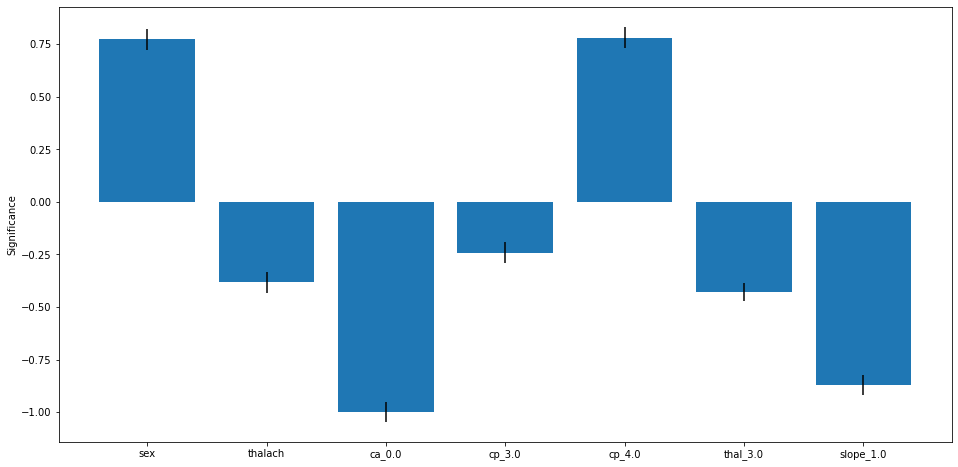

Accuracy (test)= 0.8183+-0.026
Acuracy (train)= 0.8435+-0.0012
Efron's R^2 (test)= 0.3661+-0.0779
Efron's R^2 (train)= 0.5323+-0.0021
Sensitivity (test) = 0.7564+-0.0486
Sensitivity (train) = 0.7796+-0.0469
Specificity (test) = 0.8626+-0.0332
Specificity (train) = 0.8877+-0.0305


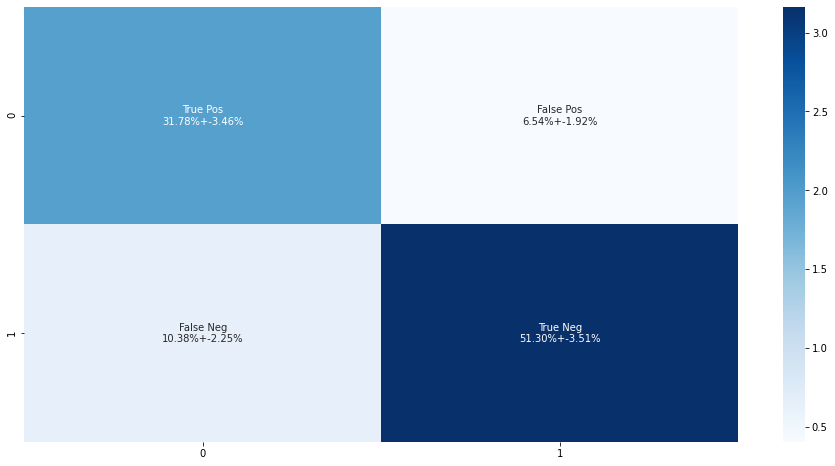

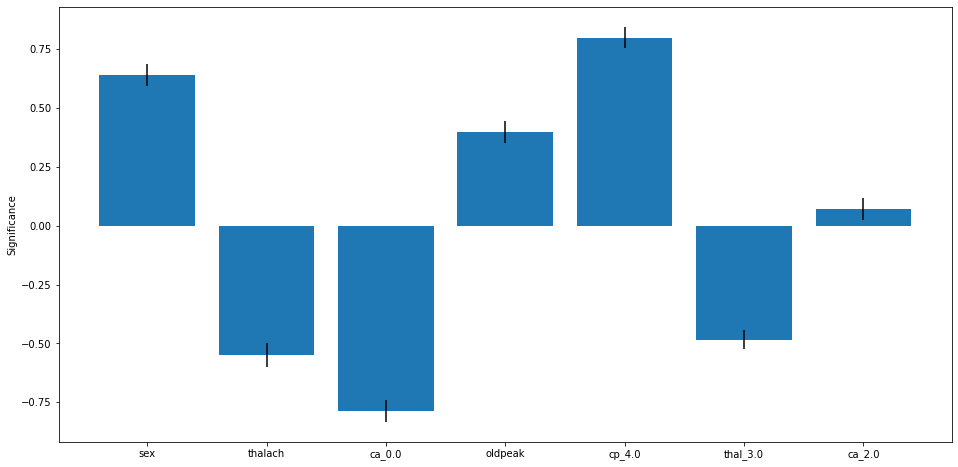

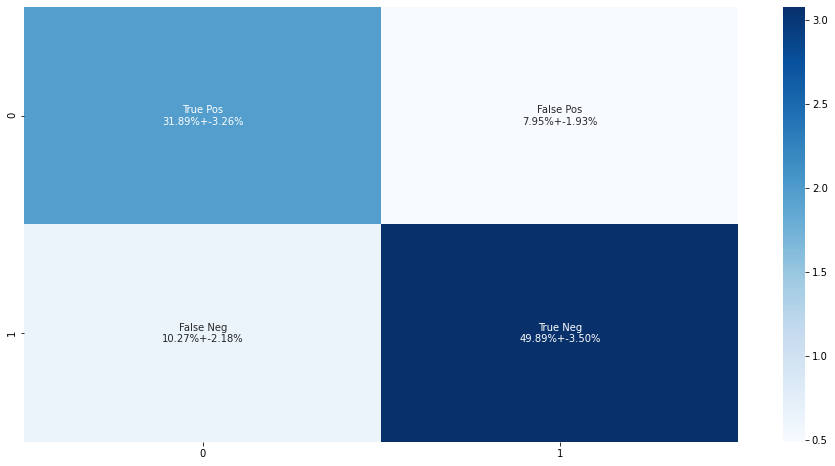

In [ ]:
features1 = ['sex','thalach','ca_0.0','cp_3.0','cp_4.0','thal_3.0','slope_1.0']
features1_old = ['sex','thalach','ca_0.0','oldpeak','cp_4.0','thal_3.0','ca_2.0']
loading_scores(model1_group[features1],model1_y,pad=True,estimator=logistic_estimator);
loading_scores(model1_group[features1_old],model1_y,pad=True,estimator=logistic_estimator);

### finding features

We do a bit better with the Efron R^2 but I feel like it's all we are going to get.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features = [feature for feature in model2_group.columns if random.random() > 0.5]
    temp = hard_function(tau = tau, X = model2_group[features], y=model2_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

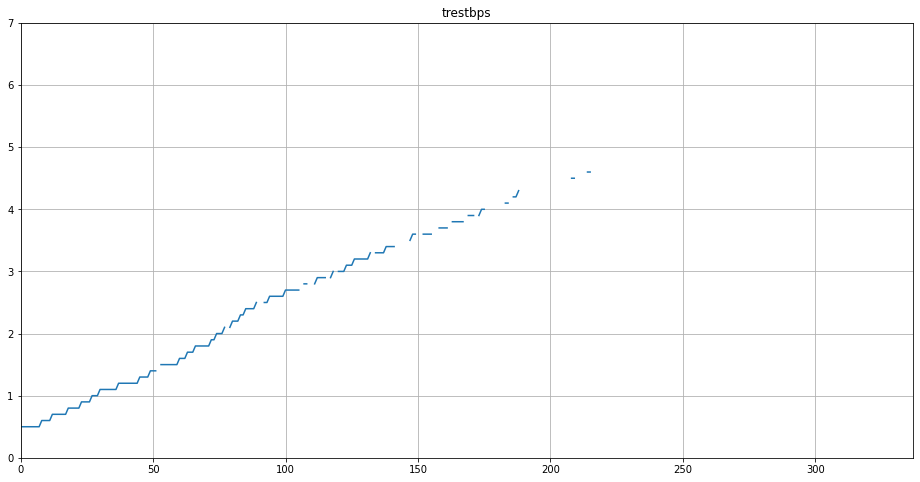

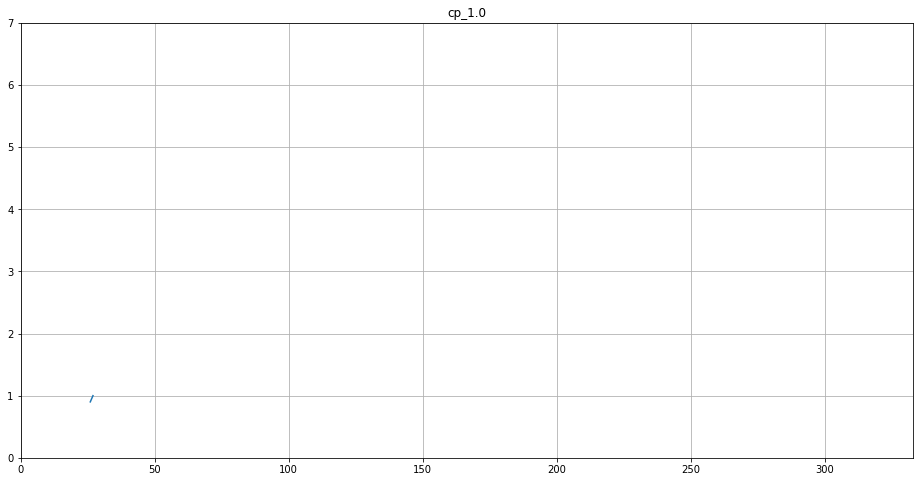

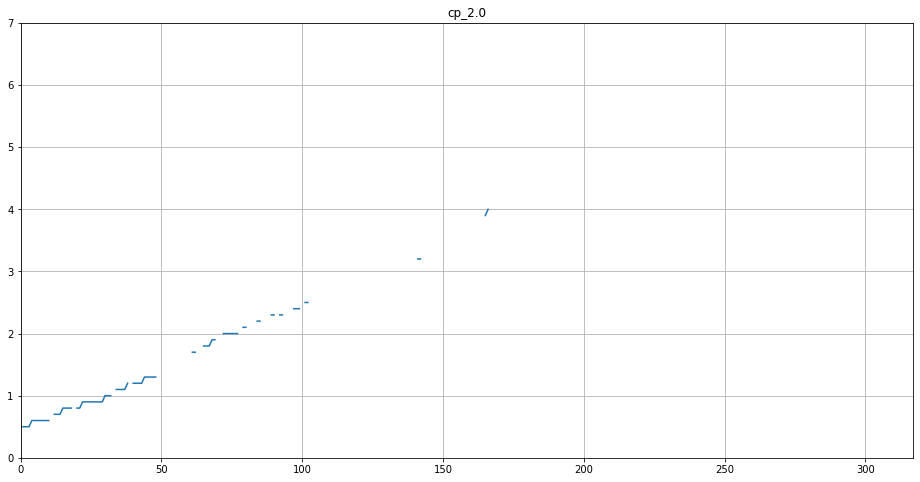

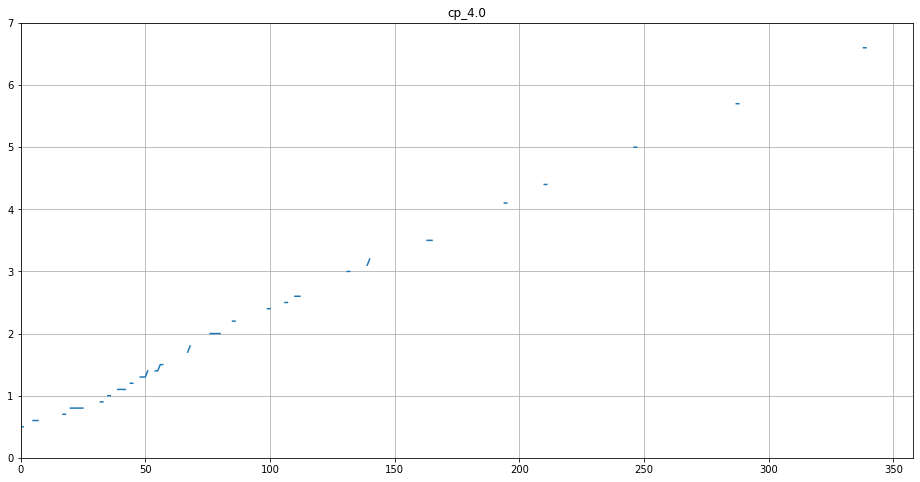

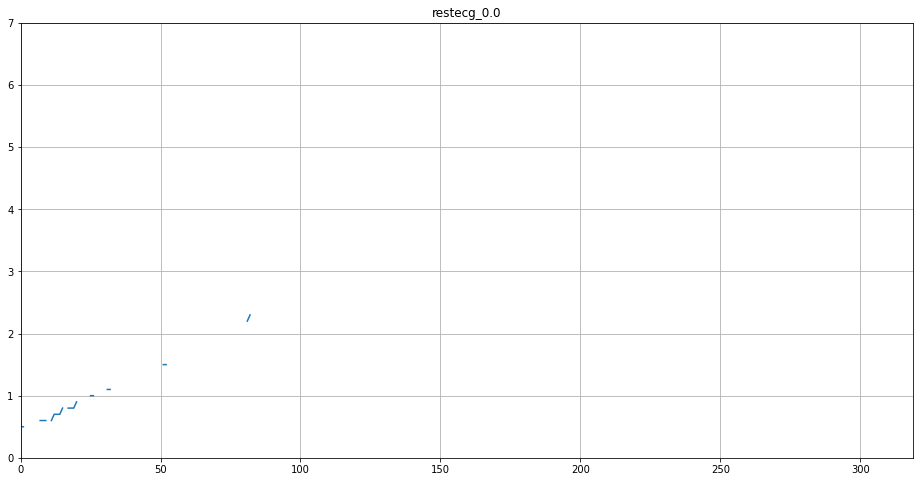

...

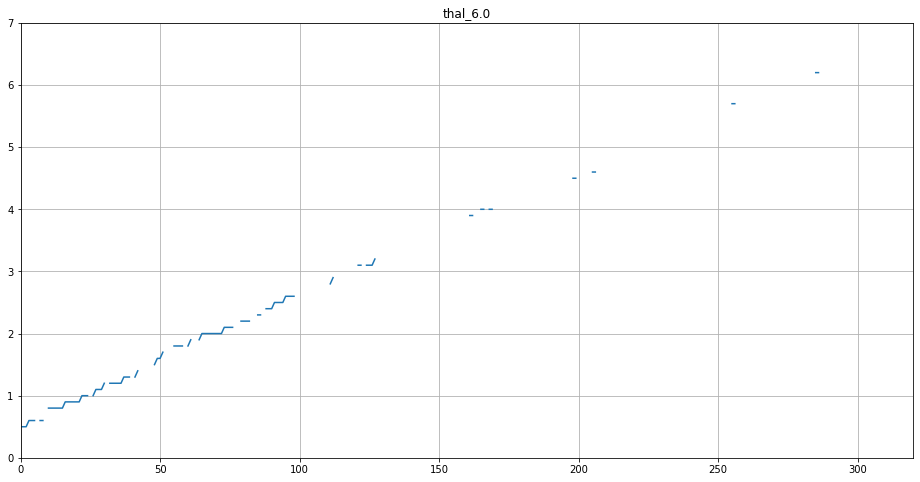

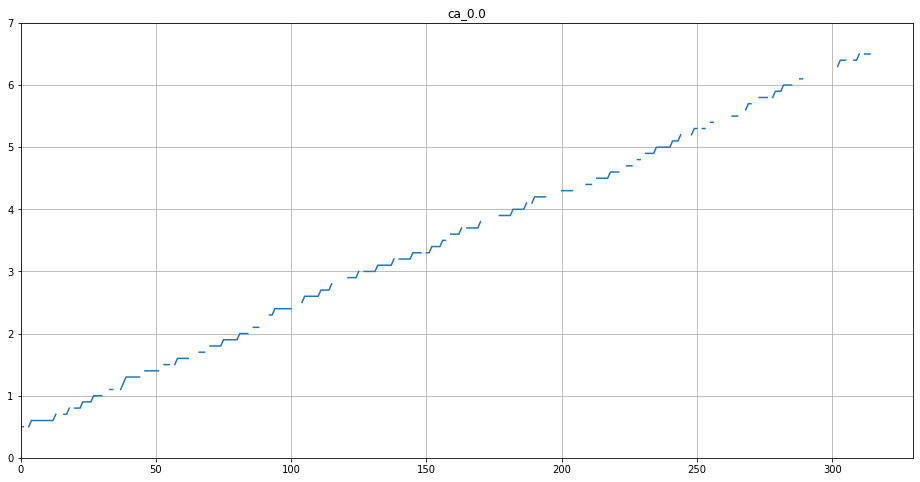

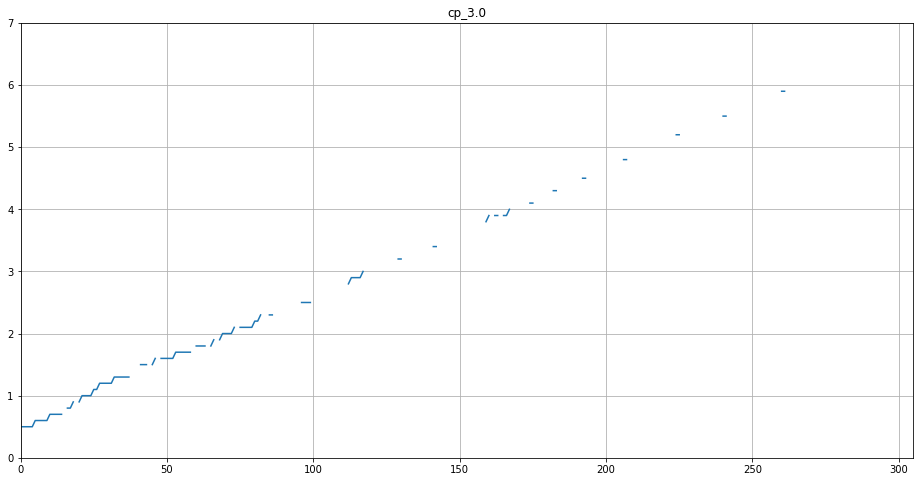

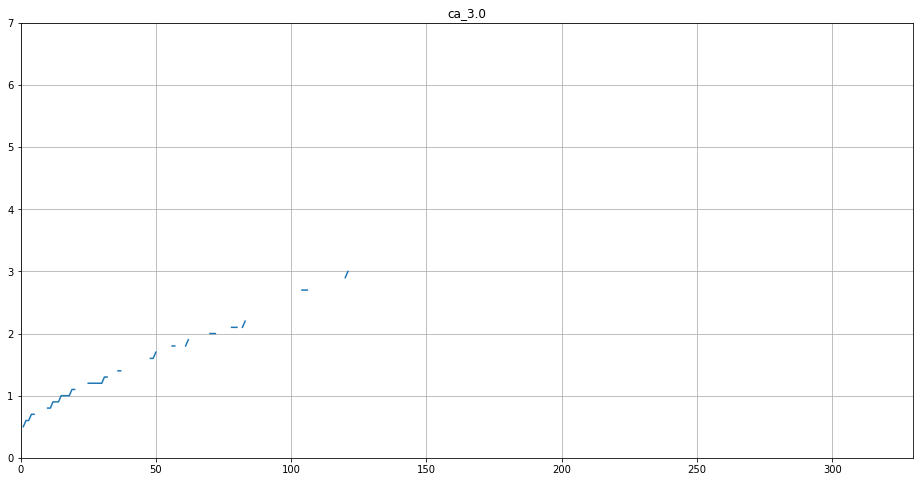

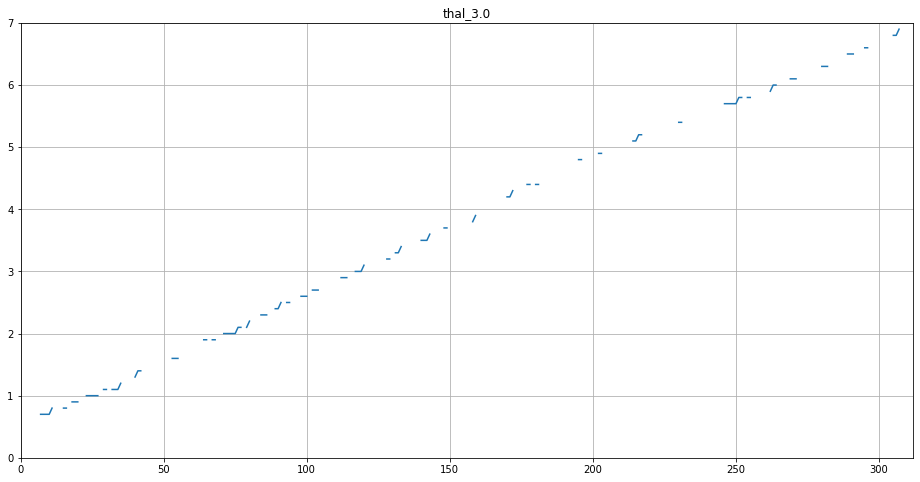

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  #ax1 = fig.add_subplot(141)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

```
ca_0.0
oldpeak
exang
age
thal_7.0
ca_2.0
```
we'll start with exang

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang']
    features = [feature for feature in model2_group.columns.drop('exang') if random.random() > 0.5]
    features.extend(features_premade)
    temp = hard_function(tau = tau, X = model2_group[features], y=model2_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

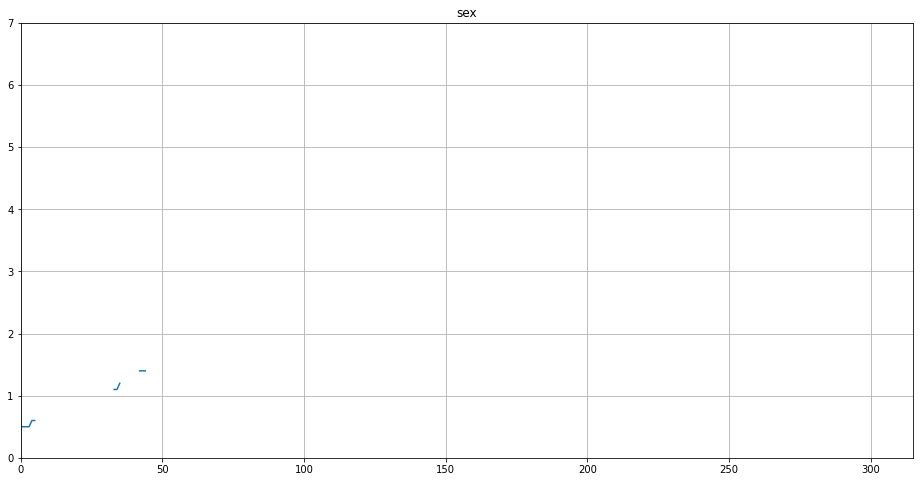

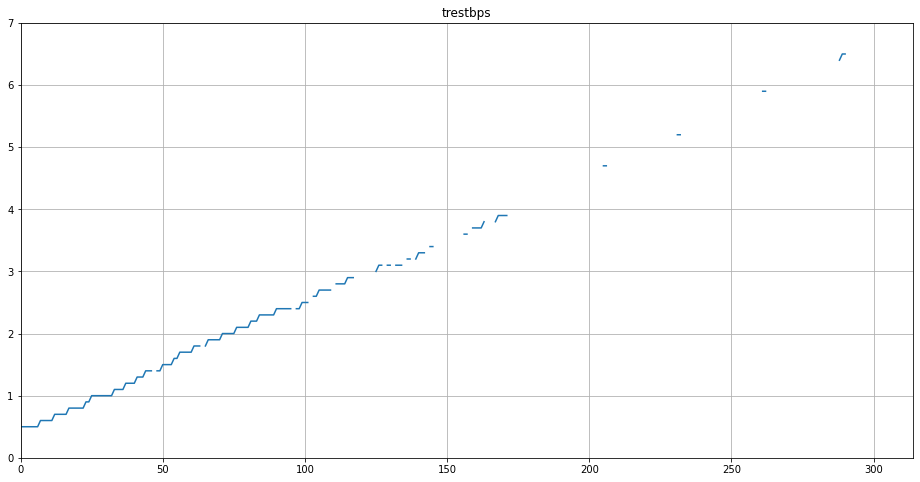

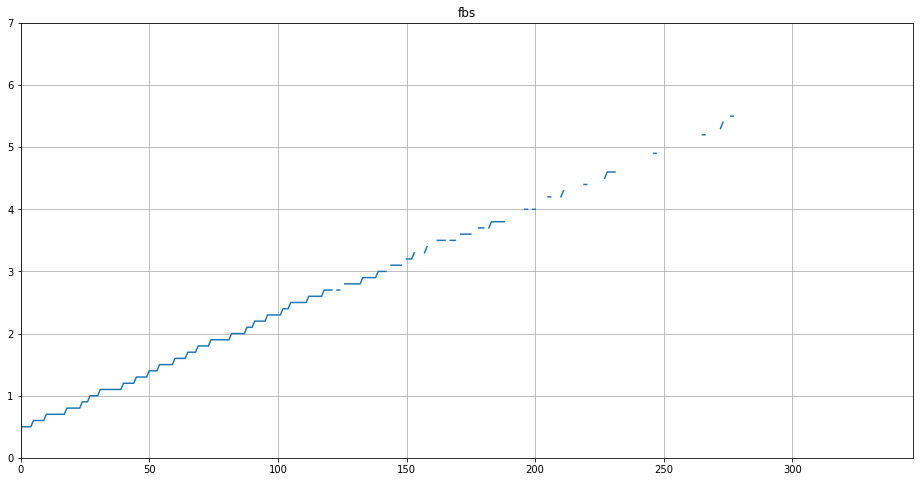

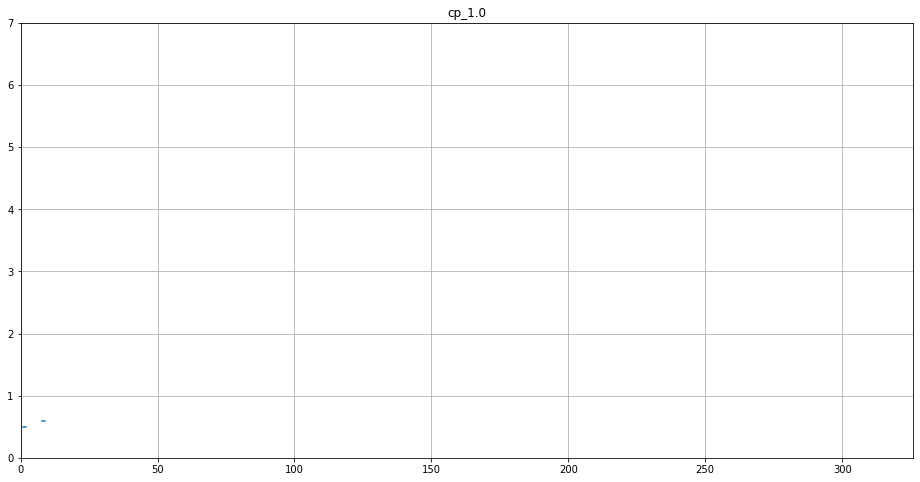

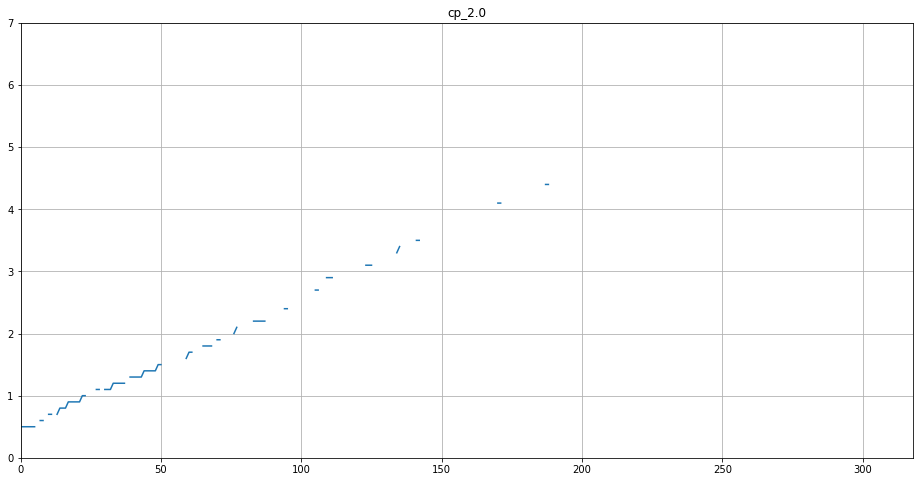

...

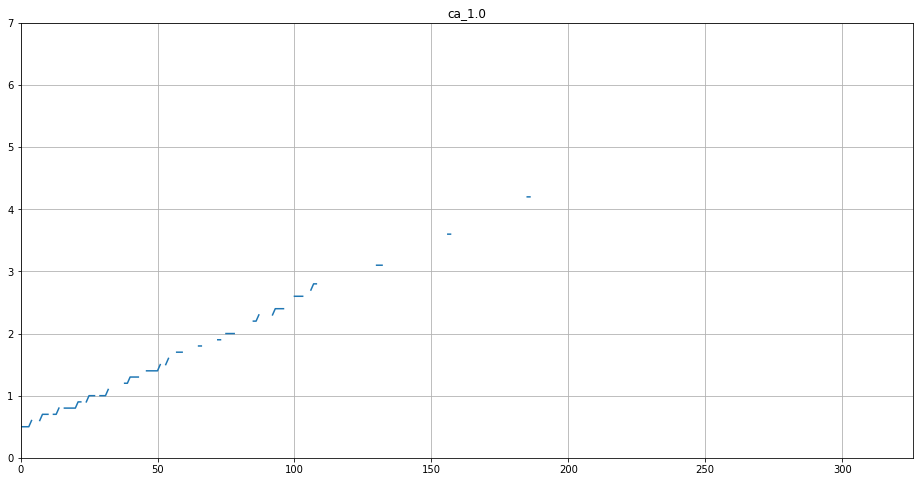

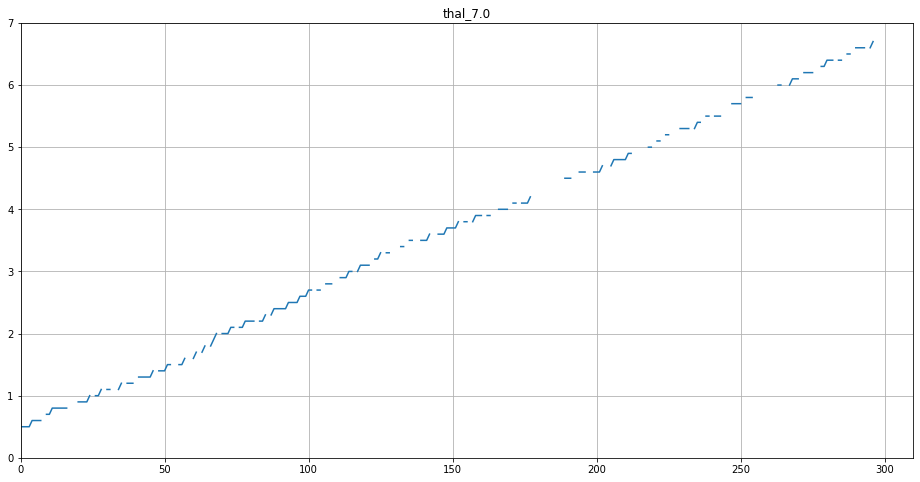

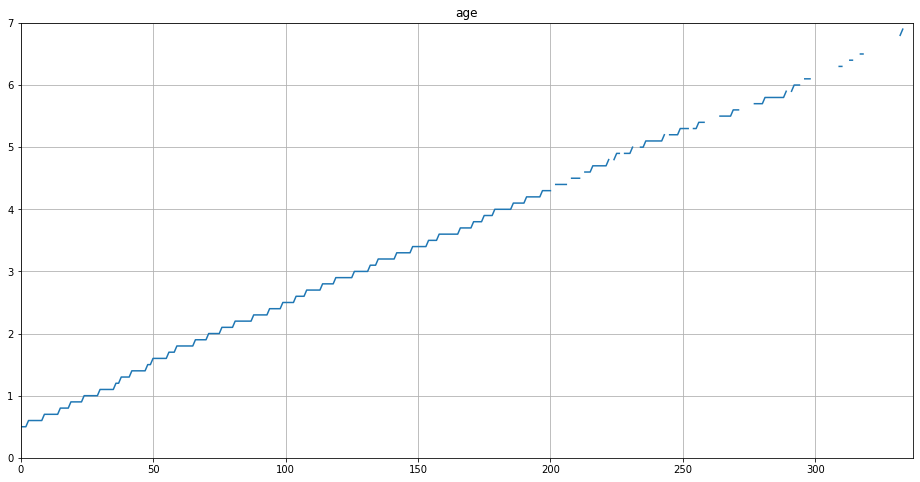

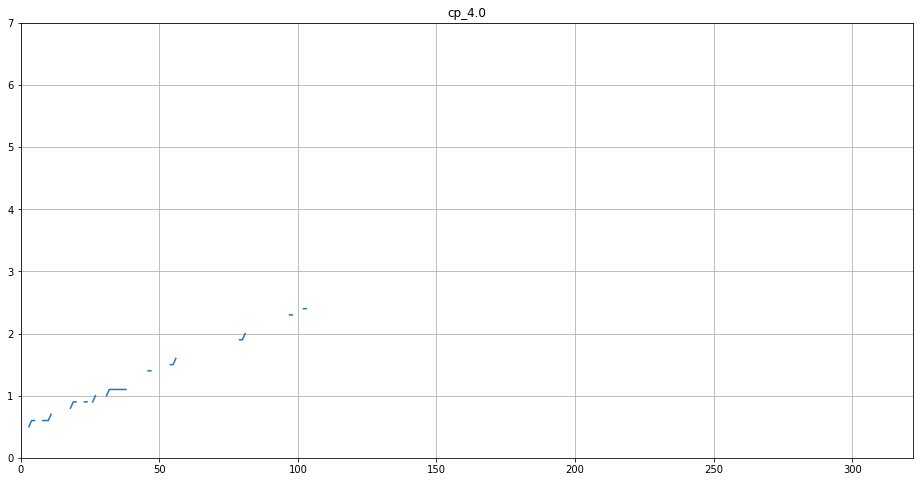

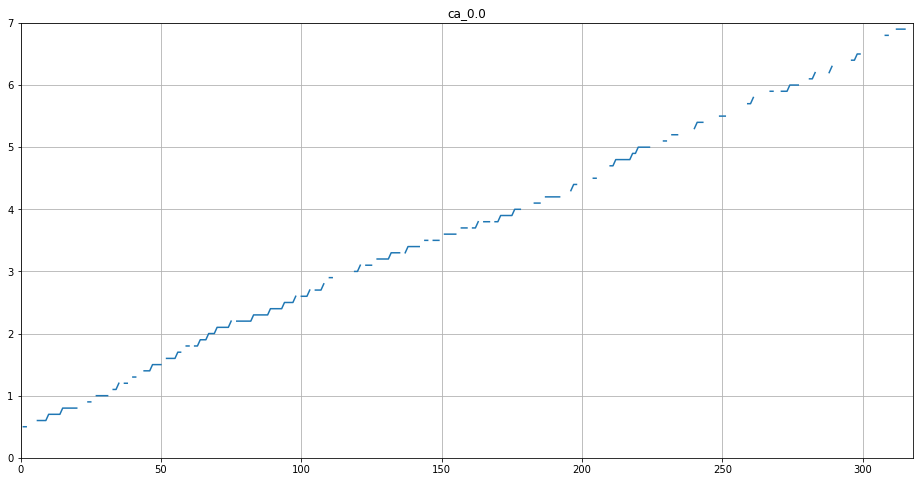

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

```
ca_0.0
age
```
Let's do age next.

In [ ]:
beta = model2_group.shape[1]/model2_group.shape[0]
omega = 0.56*beta**3 - 0.95*beta**2 + 1.82*beta+1.43
result = cross_correlate(model2_group,model2_y,pad=True)
print(np.median(np.diagonal(result['S'][0]))*omega)
np.diagonal(result['S'][0])

5.994400233367114


array([3.25669723e+03, 3.35602423e+02, 1.95473168e+02, 8.89979335e+01,
       1.42743895e+01, 7.23360756e+00, 6.89229911e+00, 6.11113683e+00,
       5.75694145e+00, 4.34419508e+00, 4.03221216e+00, 3.62270514e+00,
       3.47453926e+00, 3.20391988e+00, 3.02501415e+00, 2.58706461e+00,
       2.37934529e+00, 2.02644884e+00, 1.76746723e+00, 1.29329833e+00,
       9.00243958e-01, 3.13979356e-13, 3.13979356e-13, 3.13979356e-13,
       3.13979356e-13, 3.13979356e-13])

8 for model2_group!

In [ ]:
beta = model1_group.shape[1]/model1_group.shape[0]
omega = 0.56*beta**3 - 0.95*beta**2 + 1.82*beta+1.43
result = cross_correlate(model1_group,model1_y,pad=True)
print(np.median(np.diagonal(result['S'][0]))*omega)
np.diagonal(result['S'][0])

7.461288821139392


array([4.15255365e+03, 4.66633684e+02, 2.74596560e+02, 1.05183689e+02,
       1.24701655e+01, 9.44976424e+00, 8.95739545e+00, 7.65598799e+00,
       7.30345051e+00, 6.63195043e+00, 5.92448935e+00, 5.59303541e+00,
       4.75148756e+00, 4.23812823e+00, 4.16670685e+00, 4.05301075e+00,
       3.65372436e+00, 3.28895598e+00, 2.80496456e+00, 1.39115417e+00,
       9.21580985e-01, 4.01823140e-13, 4.01823140e-13, 4.01823140e-13,
       4.01823140e-13, 4.01823140e-13])

8 (or 7 or 9) for model1_group.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang','age']
    features = [feature for feature in model2_group.columns.drop(['exang','age']) if random.random() > 0.5]
    features.extend(features_premade)
    temp = hard_function(tau = tau, X = model2_group[features], y=model2_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

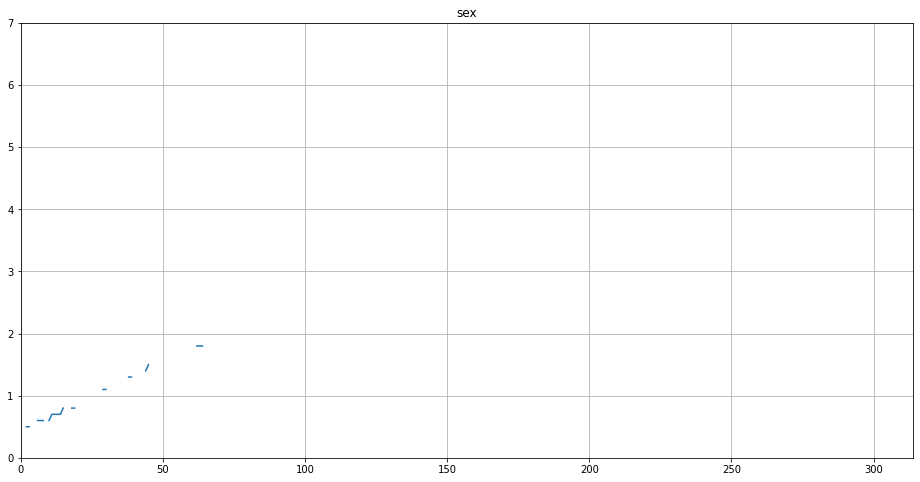

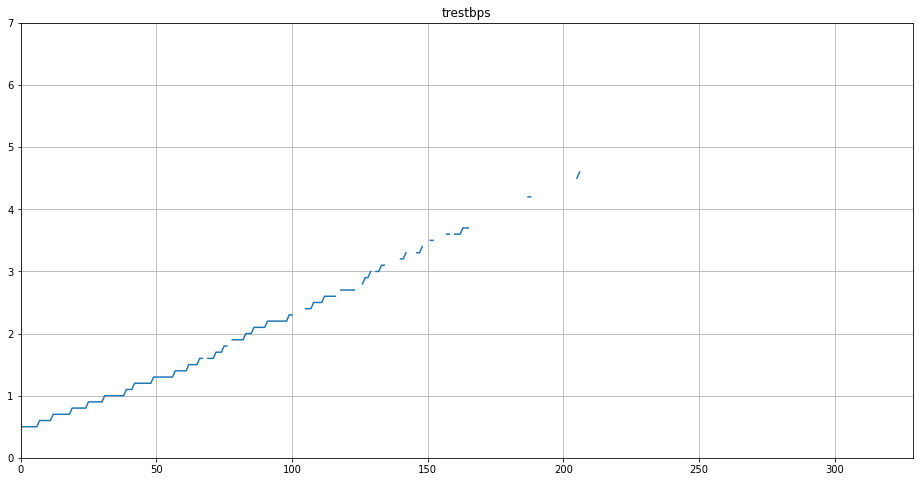

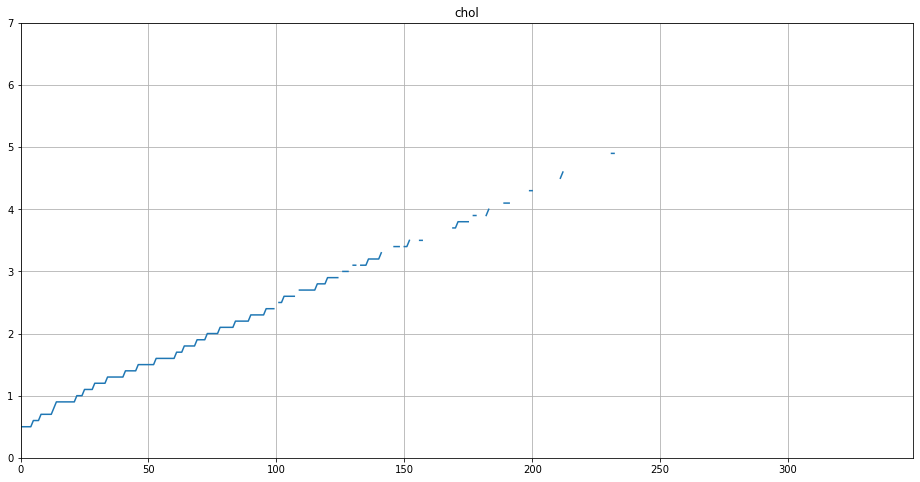

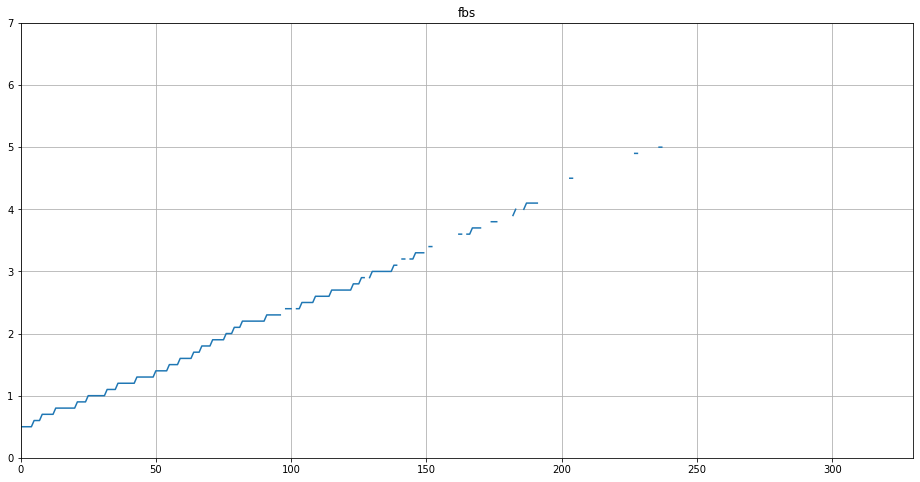

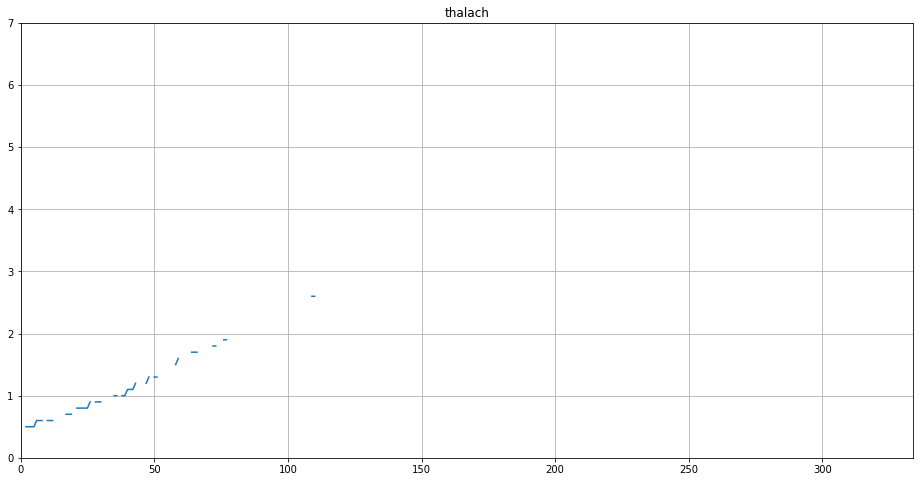

...

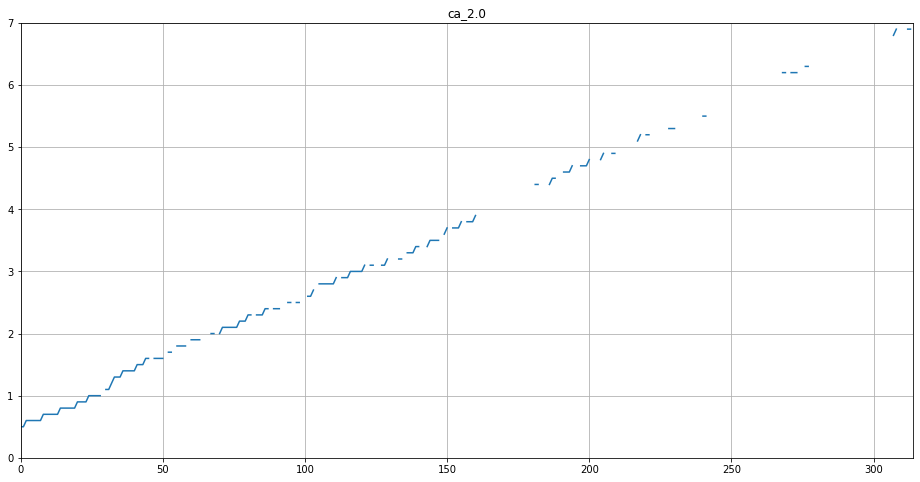

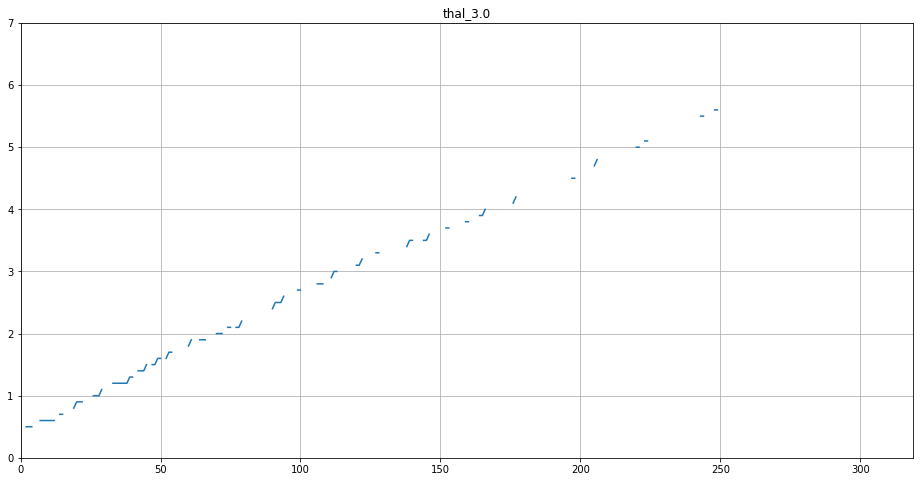

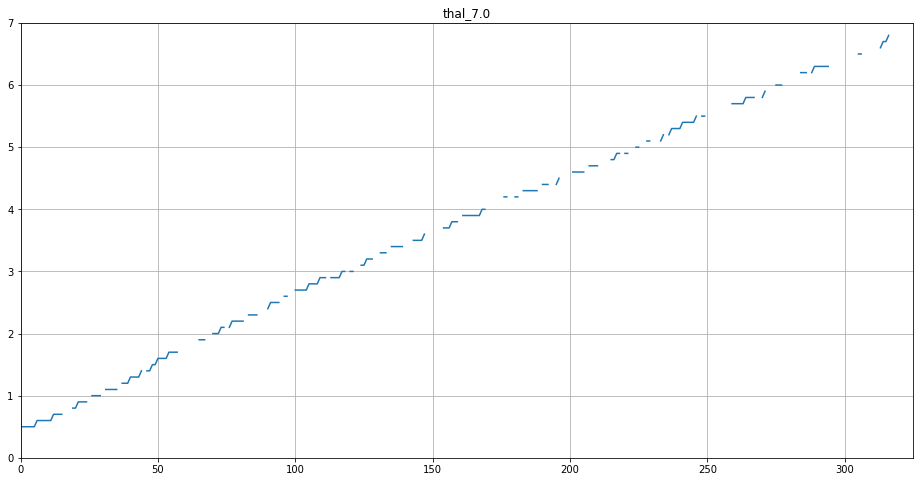

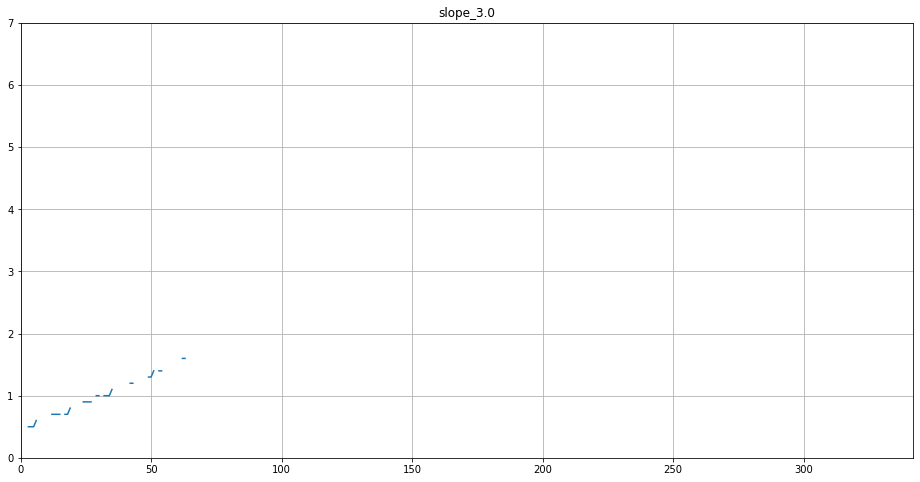

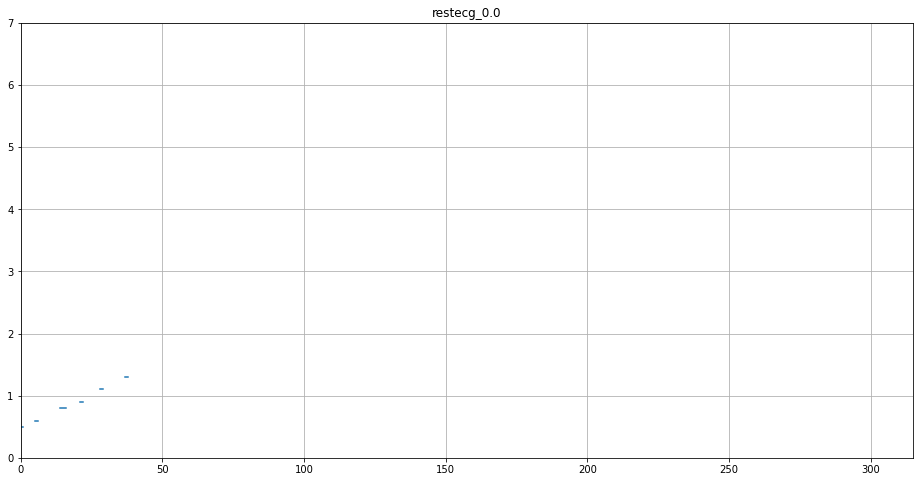

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

thal_7.0 next.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang','age','thal_7.0']
    features = [feature for feature in model2_group.columns.drop(['exang','age','thal_7.0']) if random.random() > 0.5]
    features.extend(features_premade)
    temp = hard_function(tau = tau, X = model2_group[features], y=model2_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

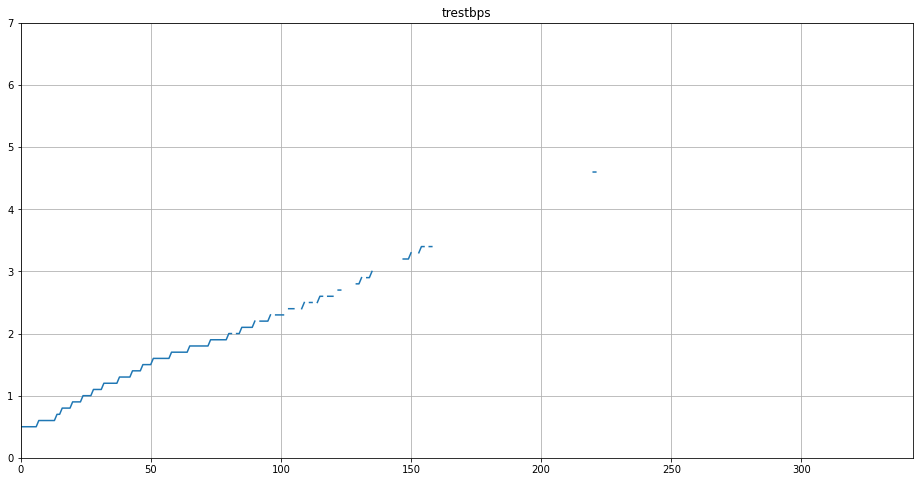

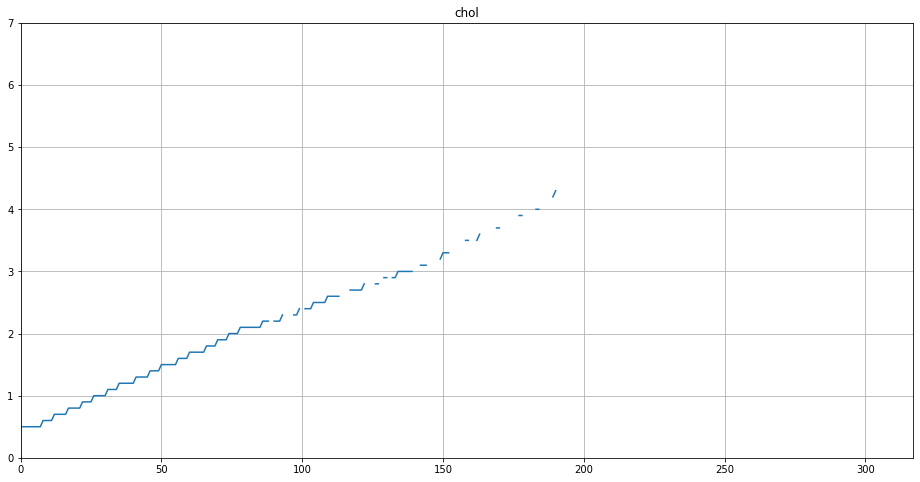

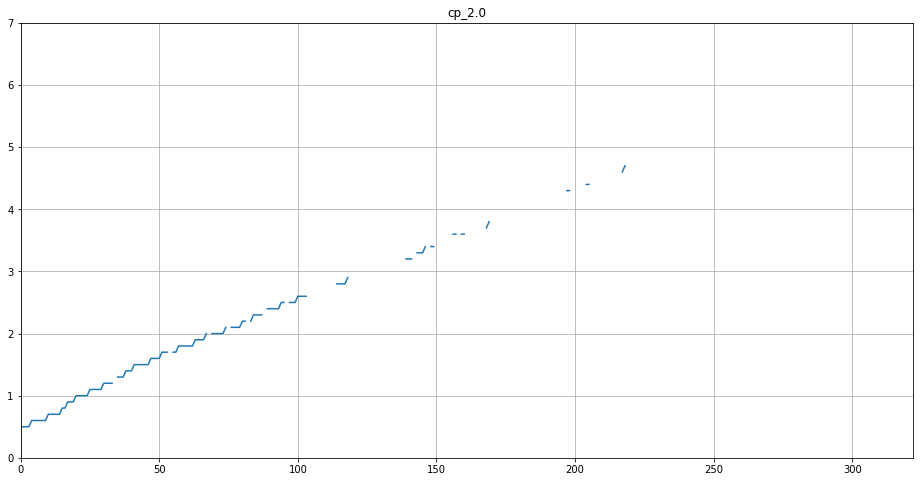

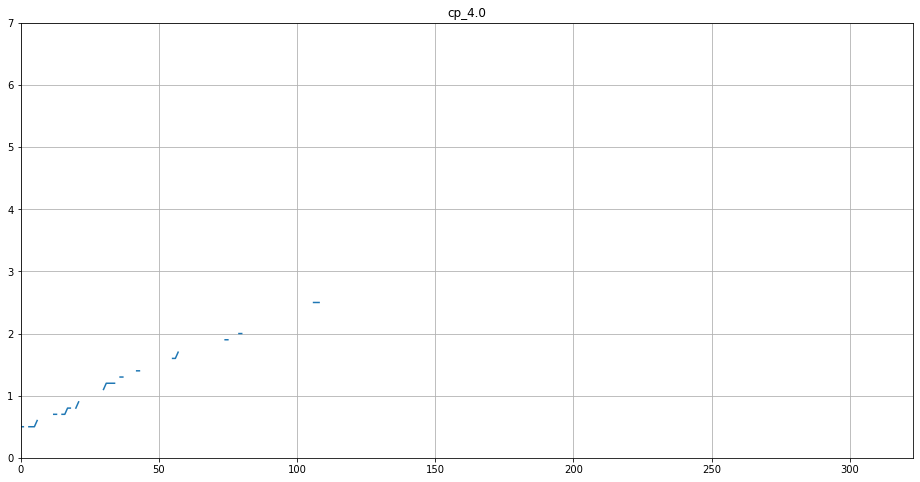

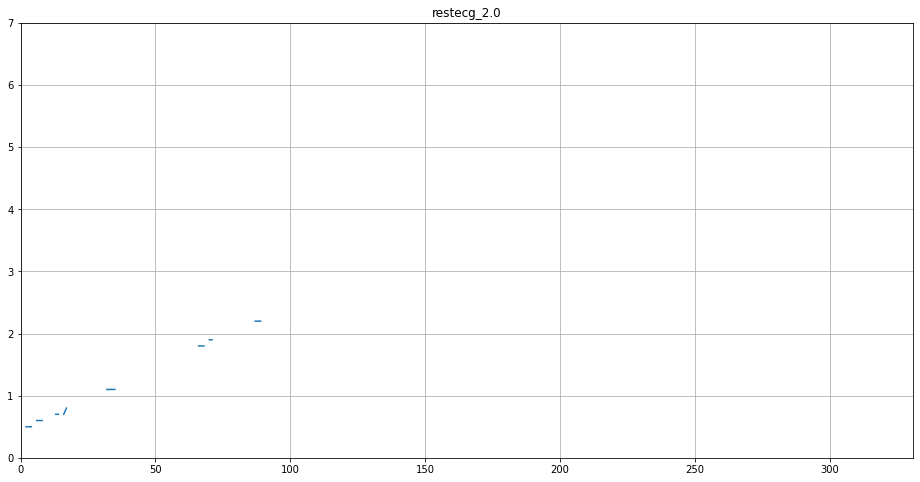

...

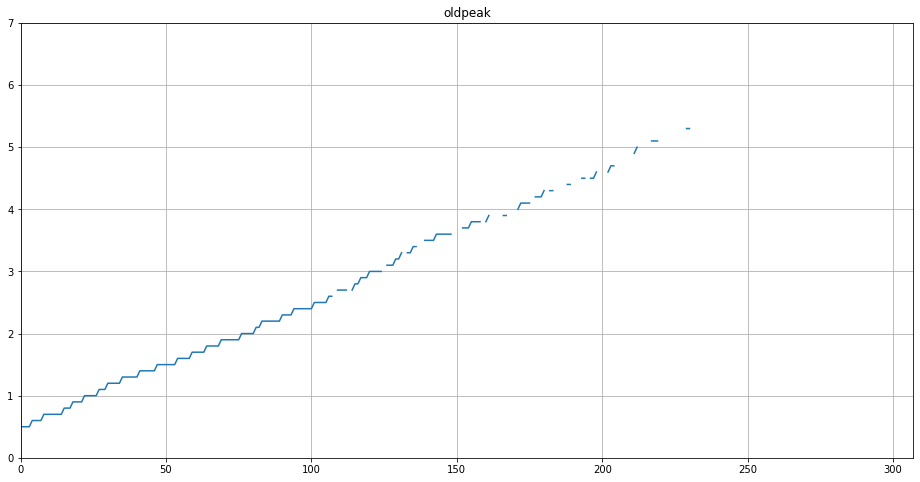

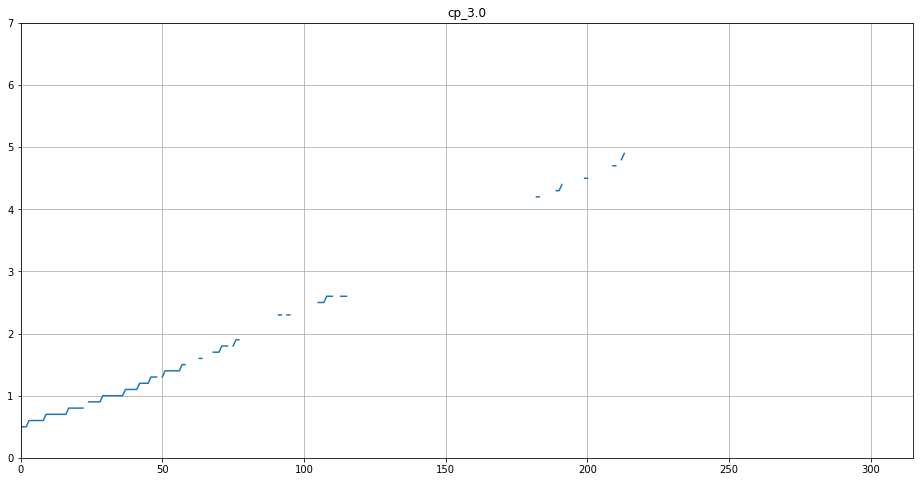

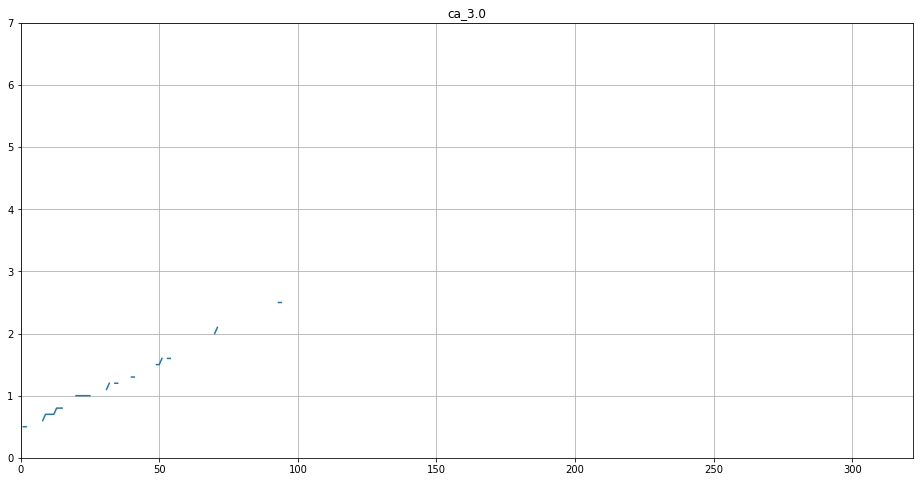

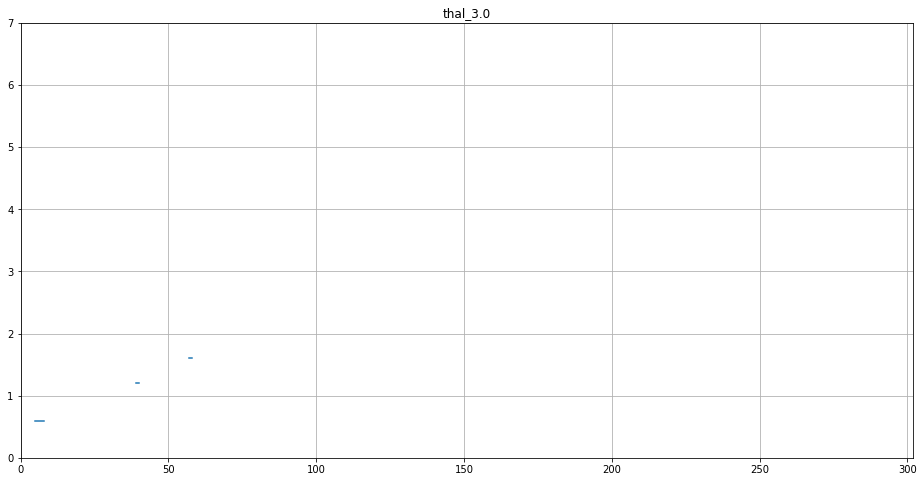

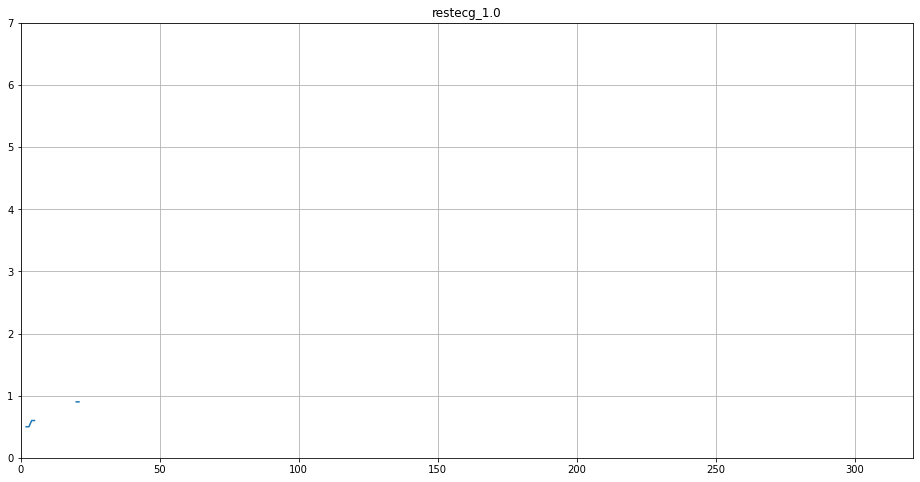

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

```
here we're deciding between ca_2.0 and ca_0.0. They are both the same. Let's do ca_2.0 but let's do the decision later.
```

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang','age','thal_7.0','ca_2.0']
    features = [feature for feature in model2_group.columns.drop(['exang','age','thal_7.0','ca_2.0']) if random.random() > 0.5]
    features.extend(features_premade)
    temp = hard_function(tau = tau, X = model2_group[features], y=model2_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

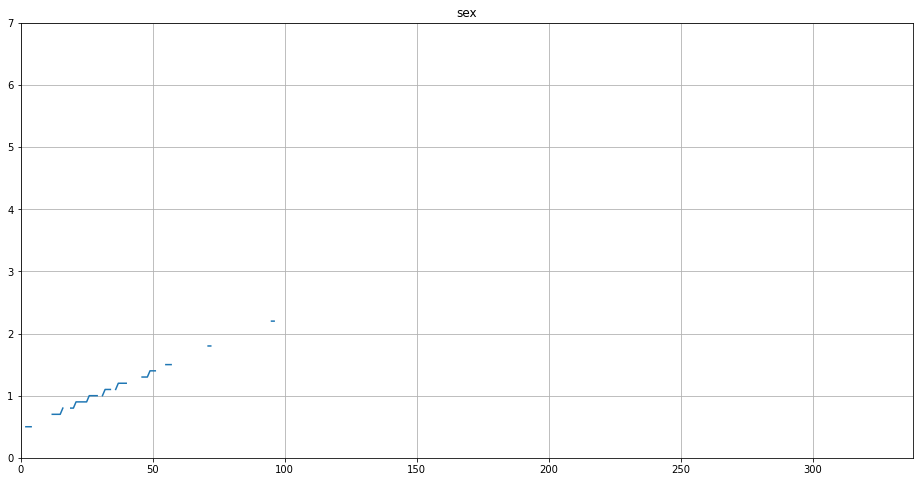

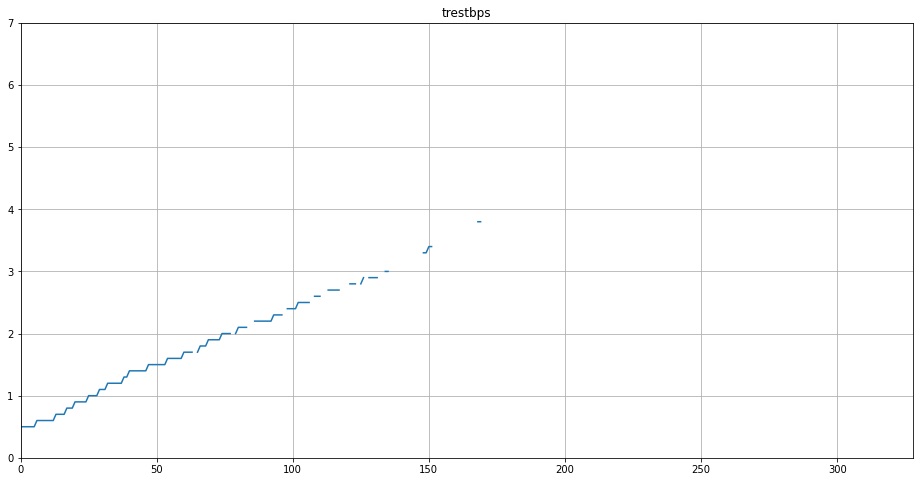

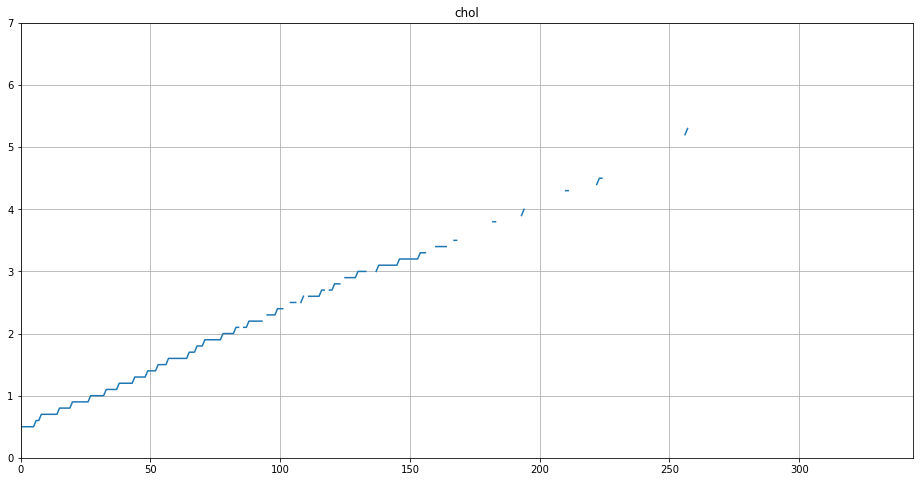

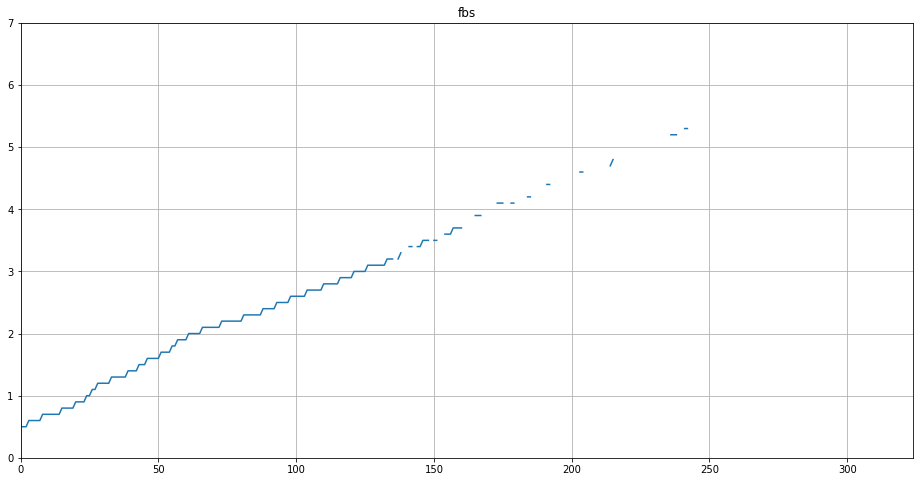

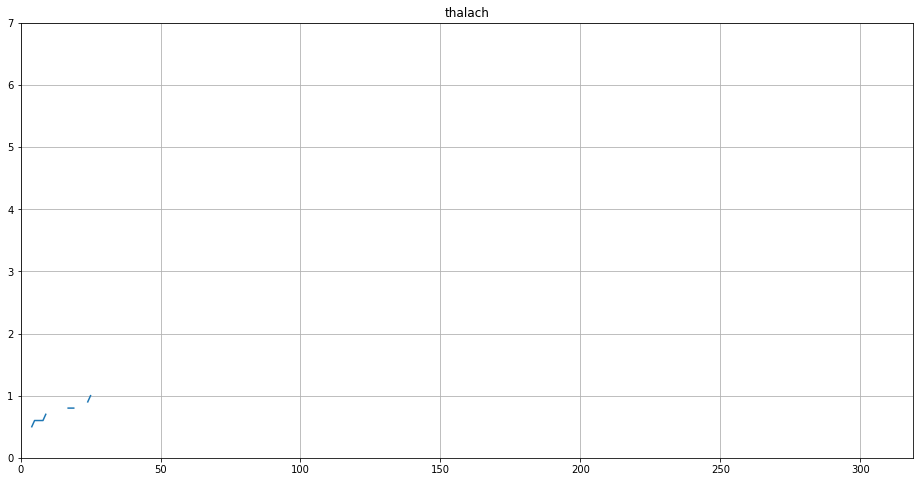

...

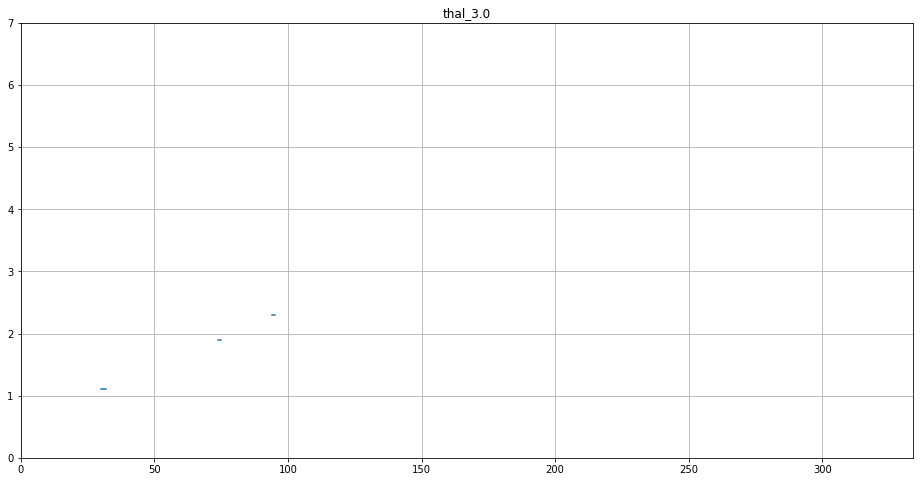

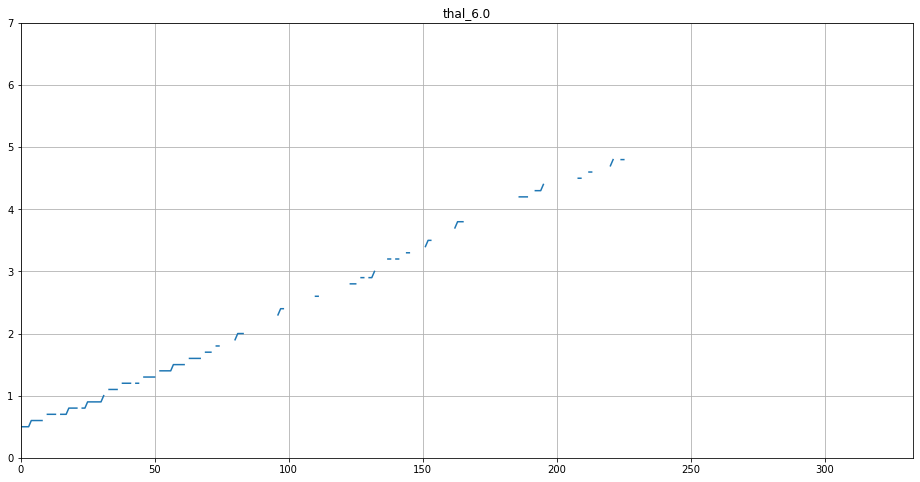

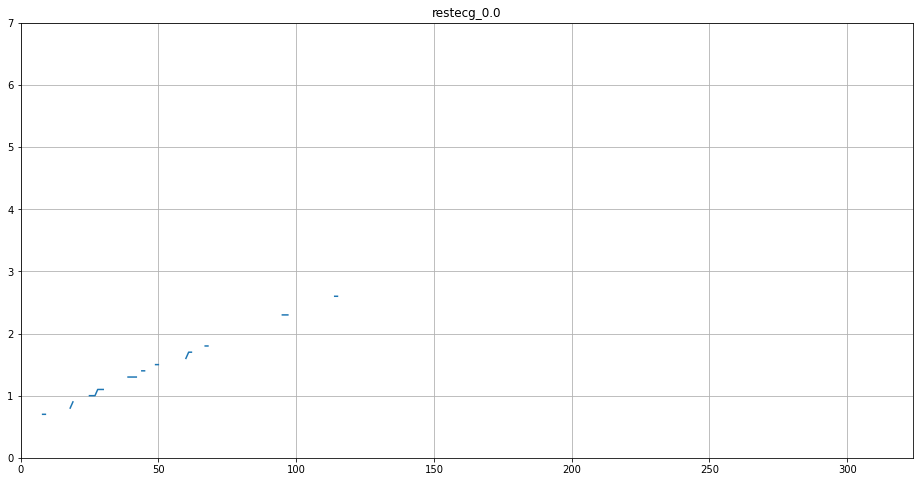

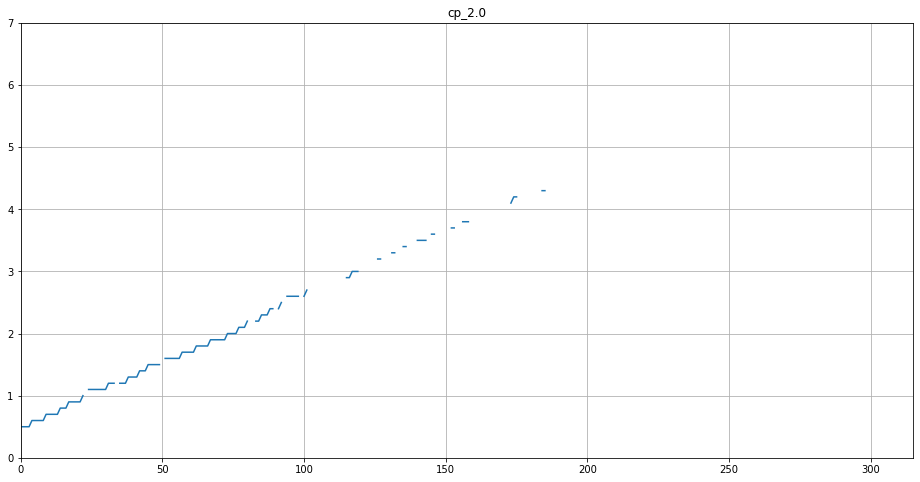

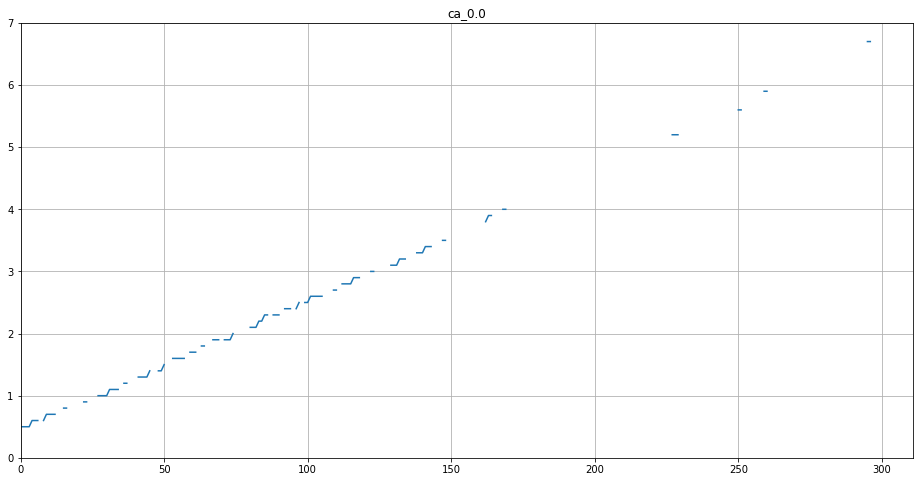

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

Let's do oldpeak next.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang','age','thal_7.0','ca_2.0','oldpeak']
    features = [feature for feature in model2_group.columns.drop(['exang','age','thal_7.0','ca_2.0','oldpeak']) if random.random() > 0.5]
    features.extend(features_premade)
    temp = hard_function(tau = tau, X = model2_group[features], y=model2_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

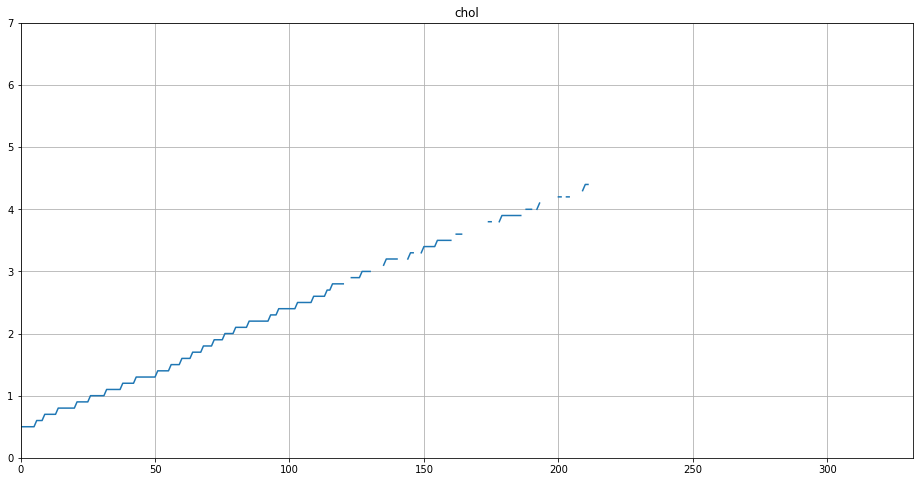

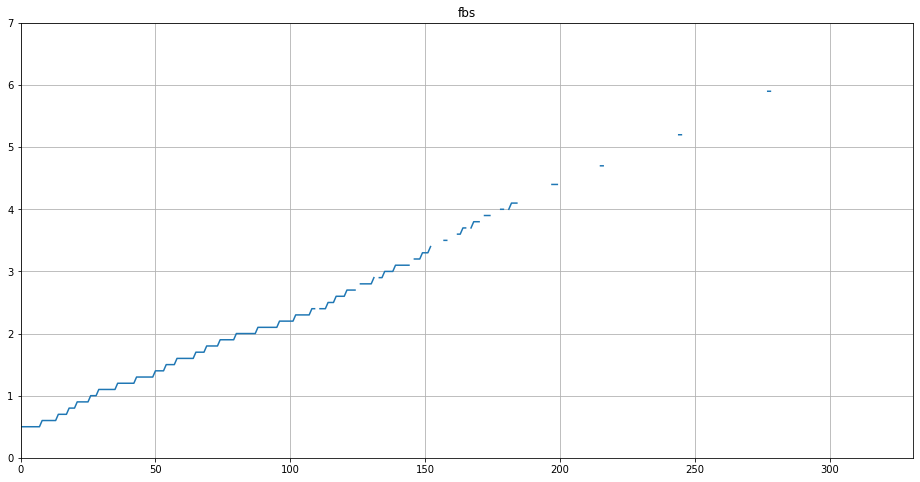

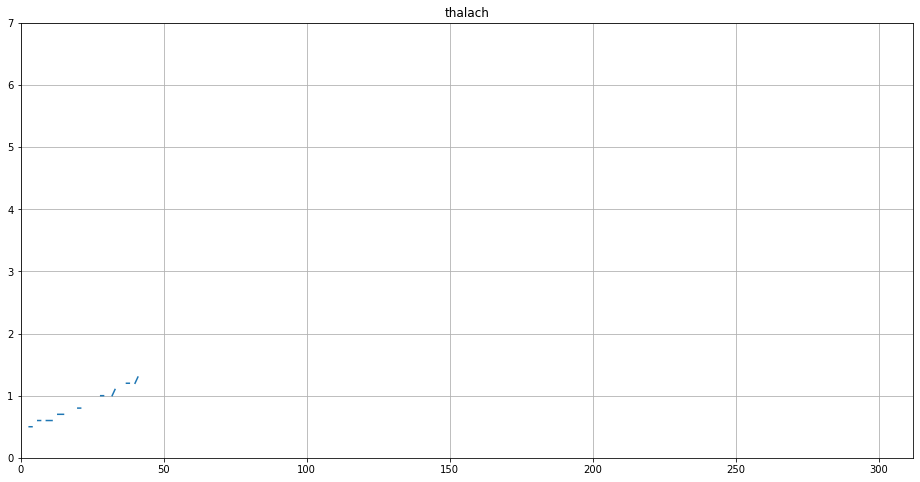

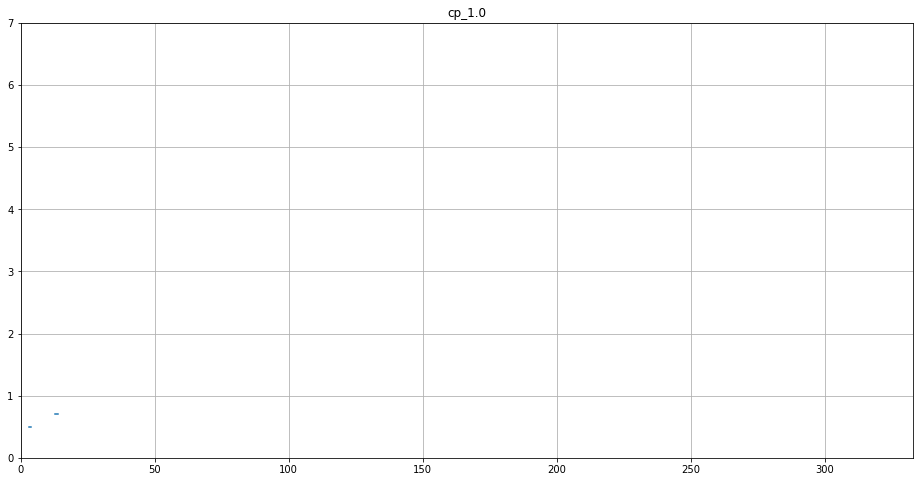

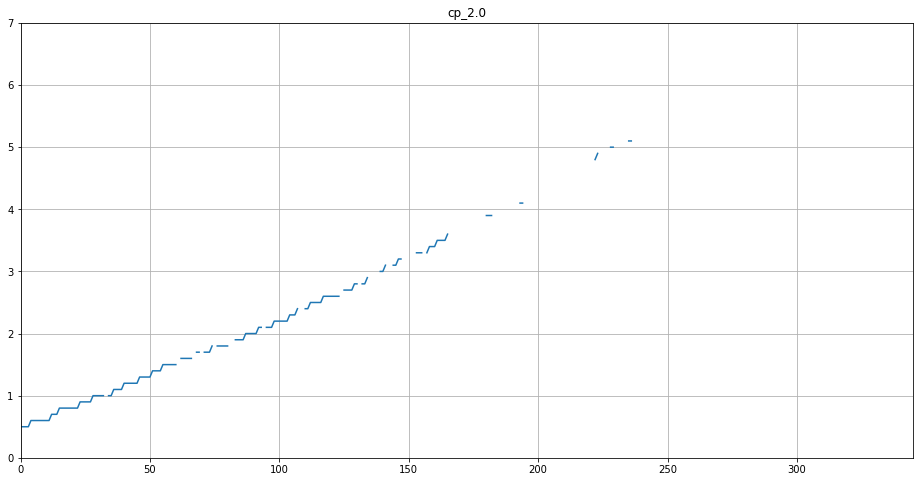

...

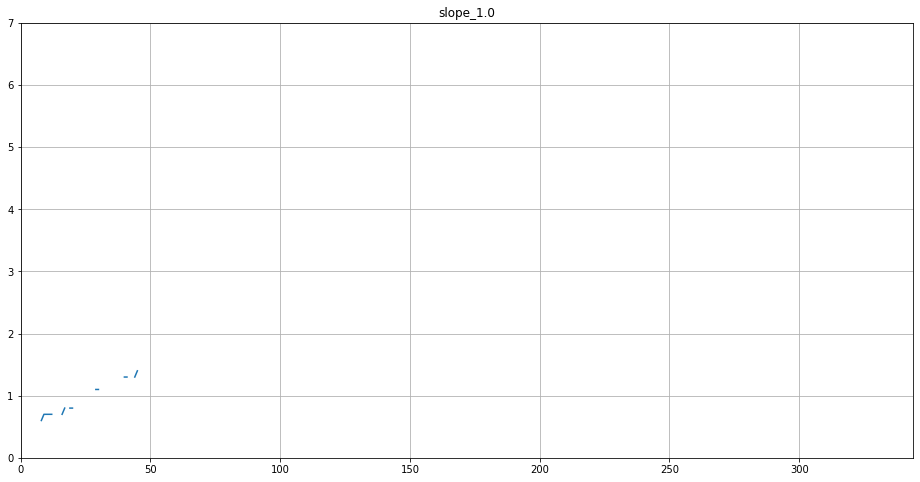

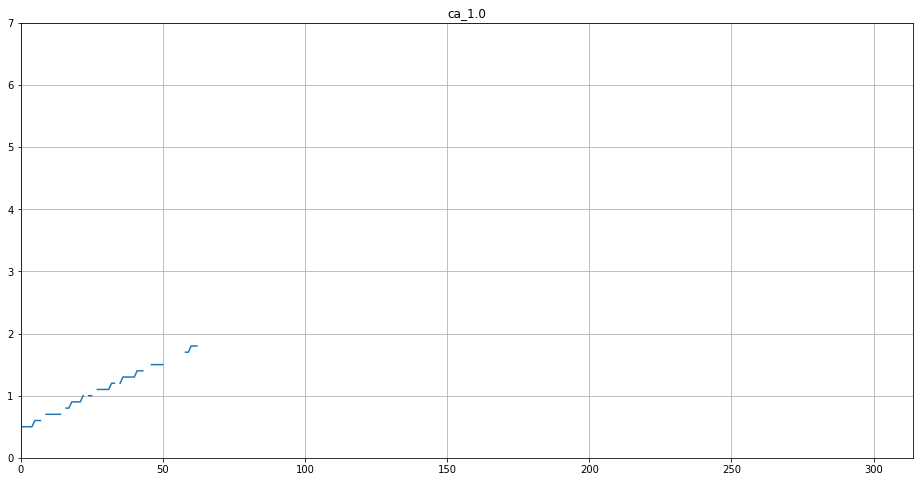

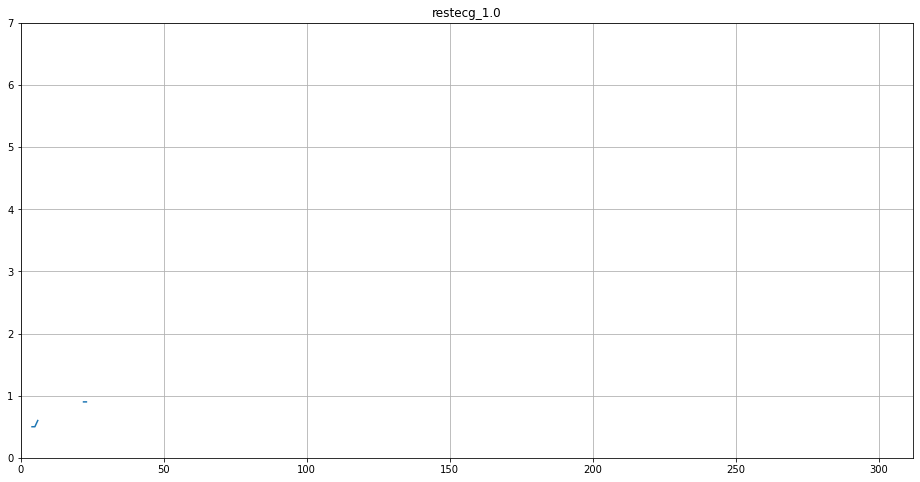

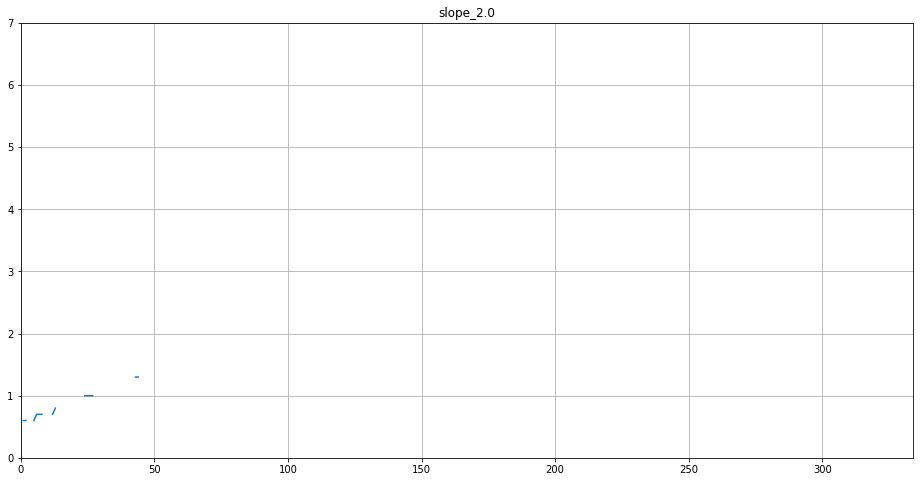

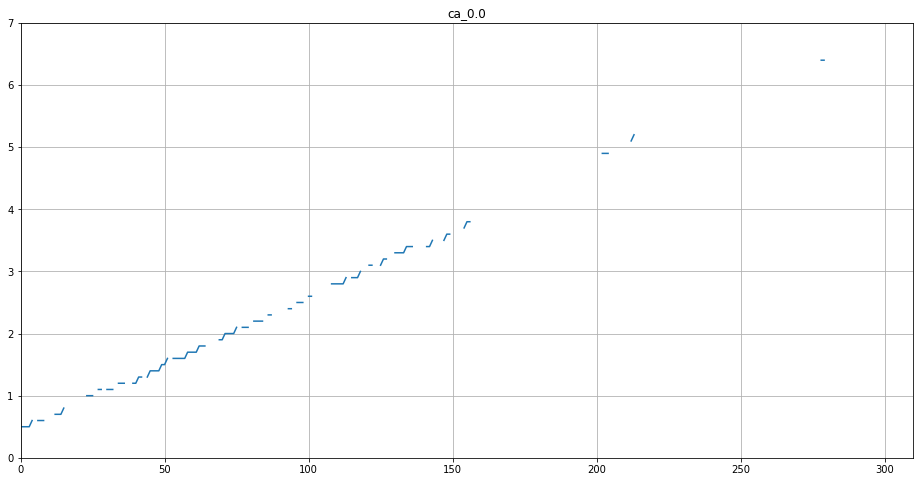

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

Let's do fbs.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang','age','thal_7.0','ca_2.0','oldpeak','fbs']
    features = [feature for feature in model2_group.columns.drop(['exang','age','thal_7.0','ca_2.0','oldpeak','fbs']) if random.random() > 0.5]
    features.extend(features_premade)
    temp = hard_function(tau = tau, X = model2_group[features], y=model2_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

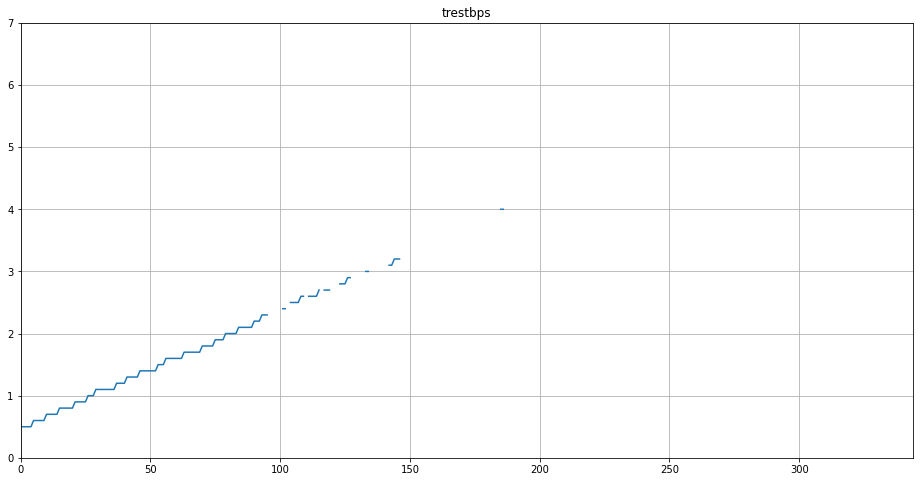

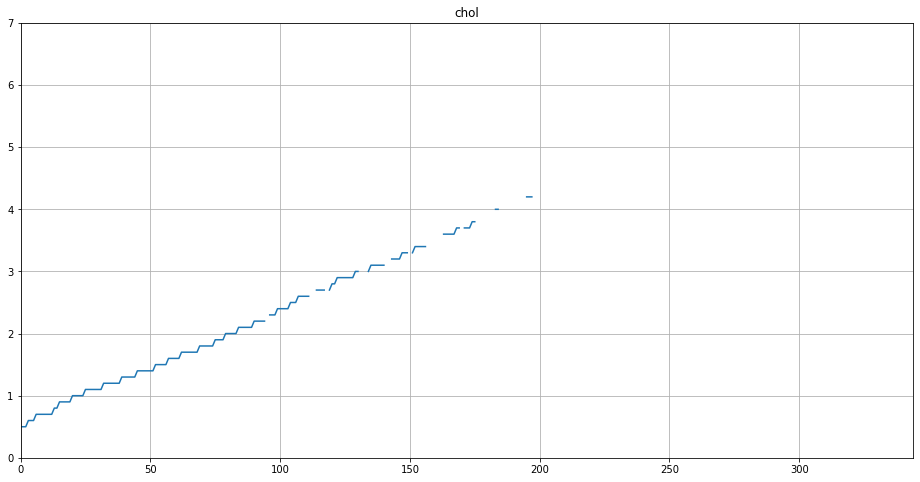

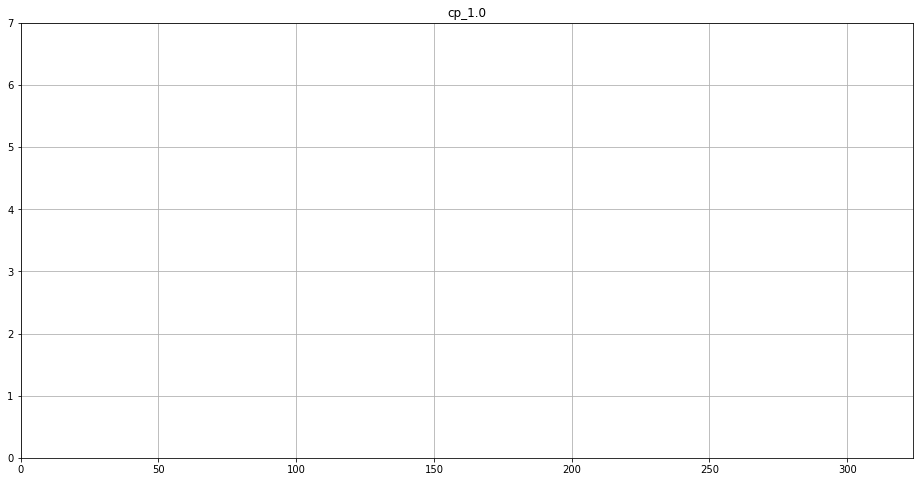

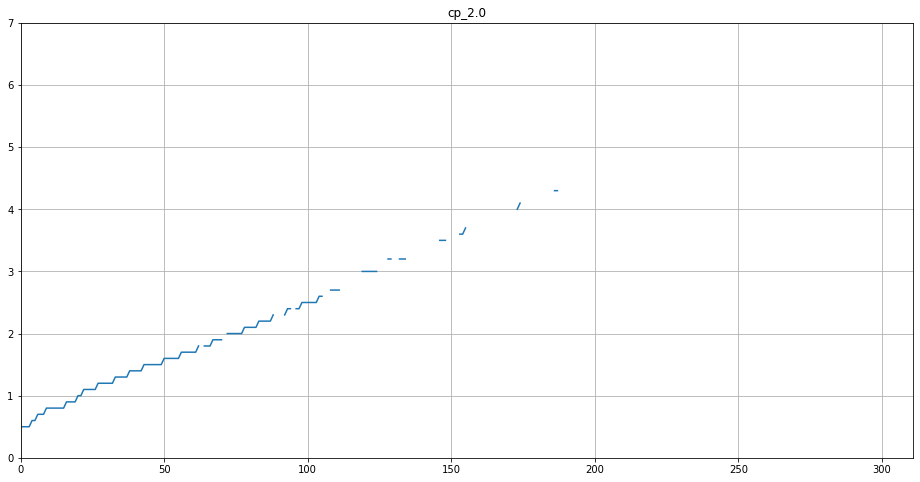

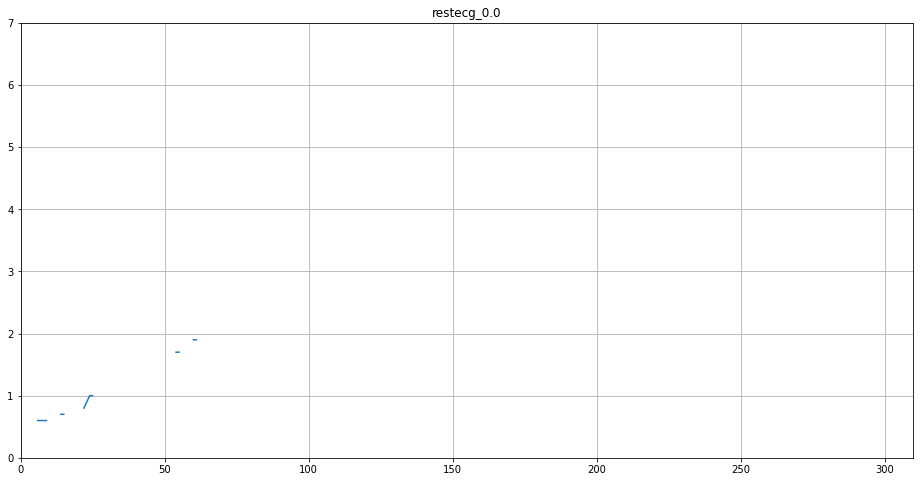

...

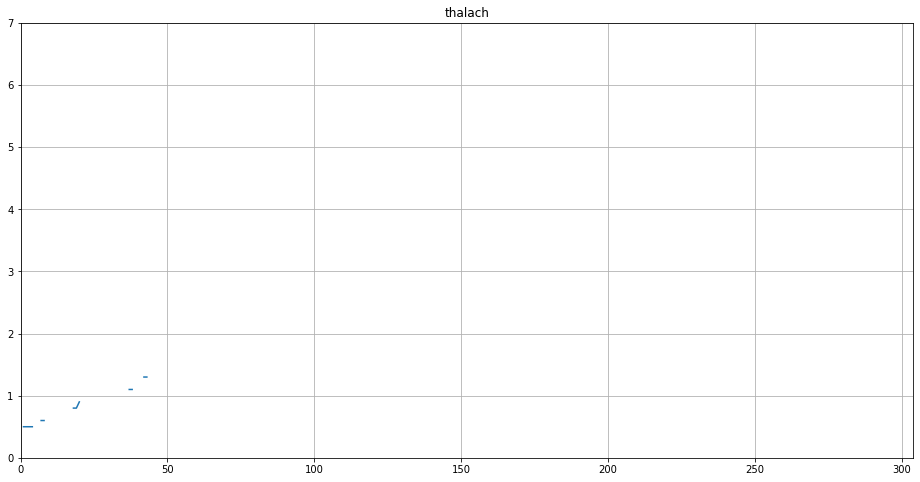

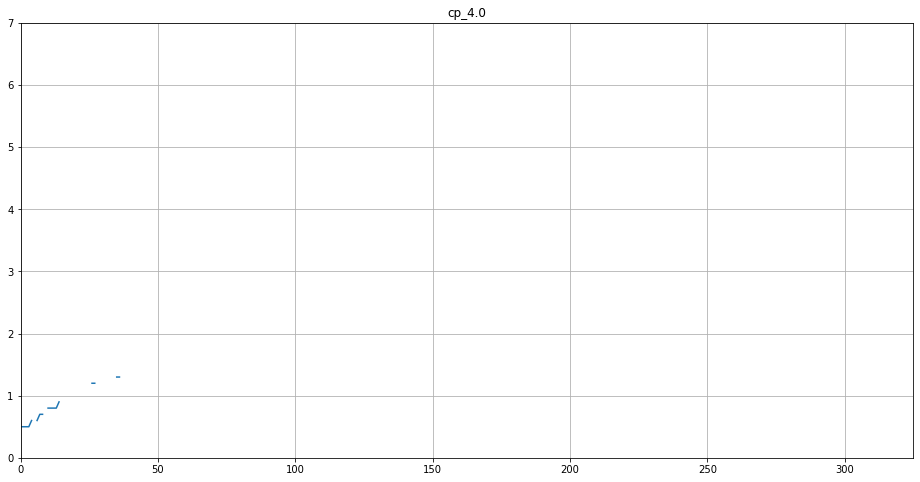

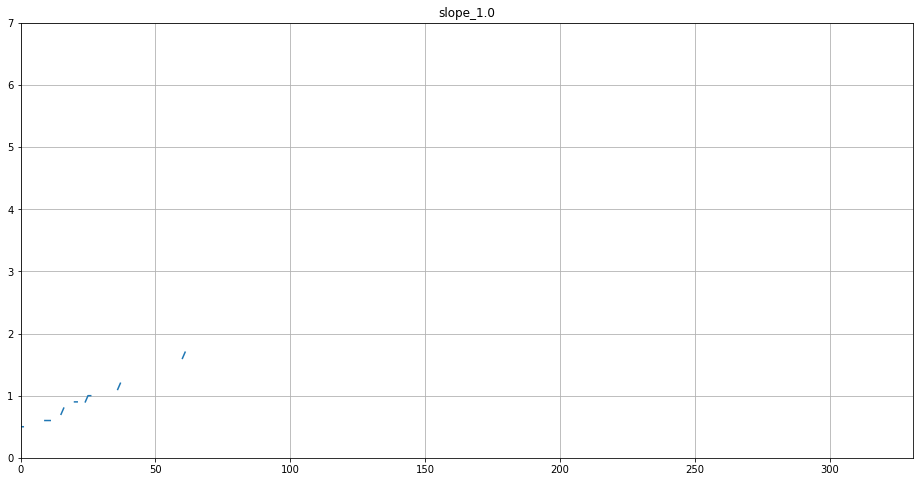

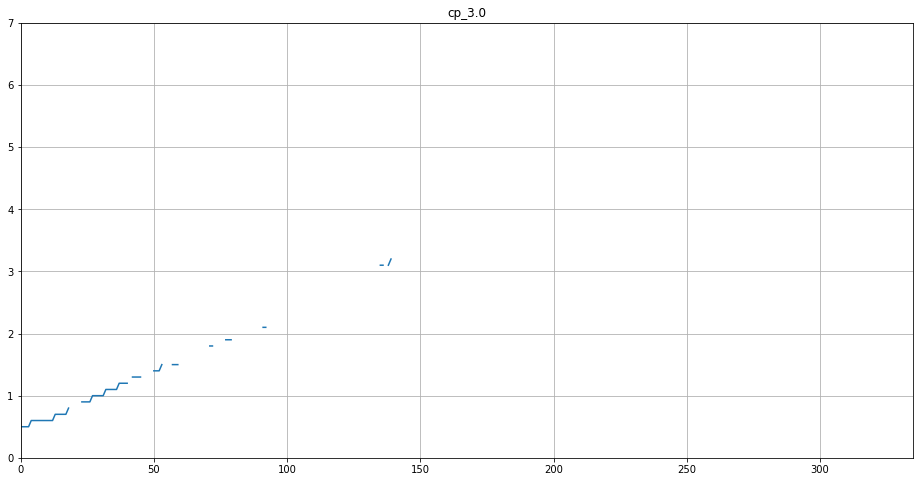

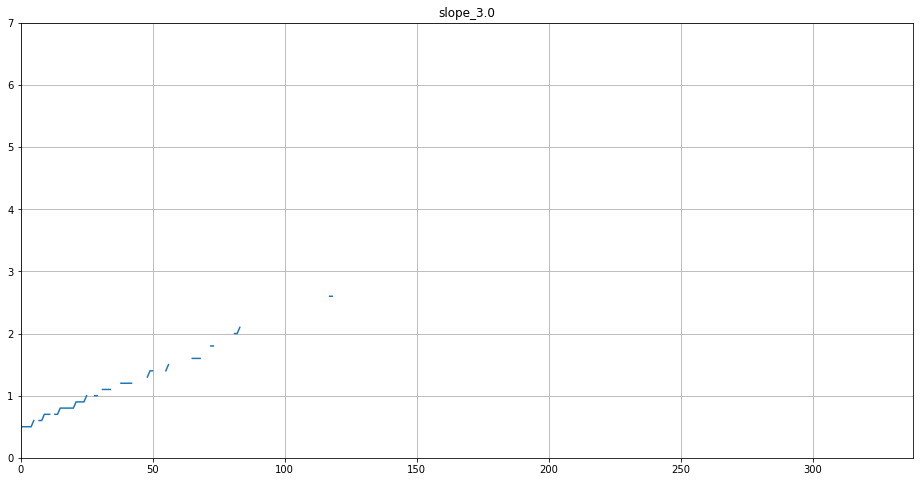

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

Now chol.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang','age','thal_7.0','ca_2.0','oldpeak','fbs','chol']
    features = [feature for feature in model2_group.columns.drop(['exang','age','thal_7.0','ca_2.0','oldpeak','fbs','chol']) if random.random() > 0.5]
    features.extend(features_premade)
    temp = hard_function(tau = tau, X = model2_group[features], y=model2_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

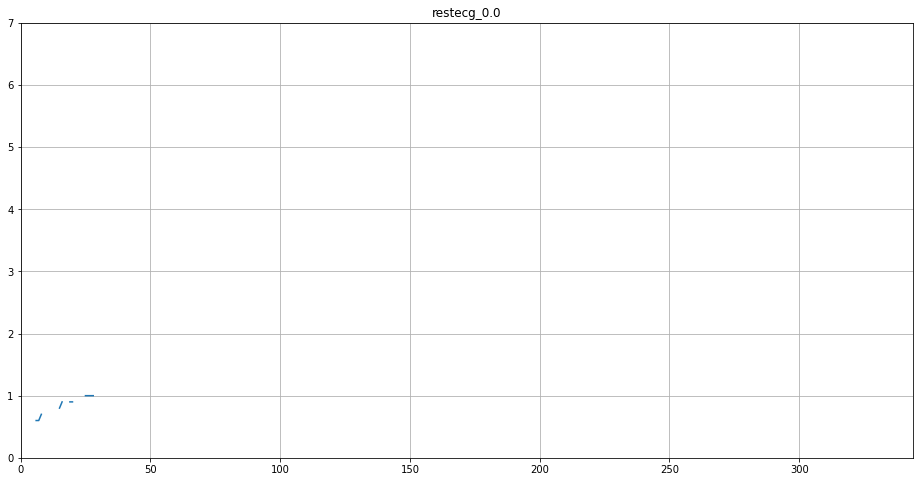

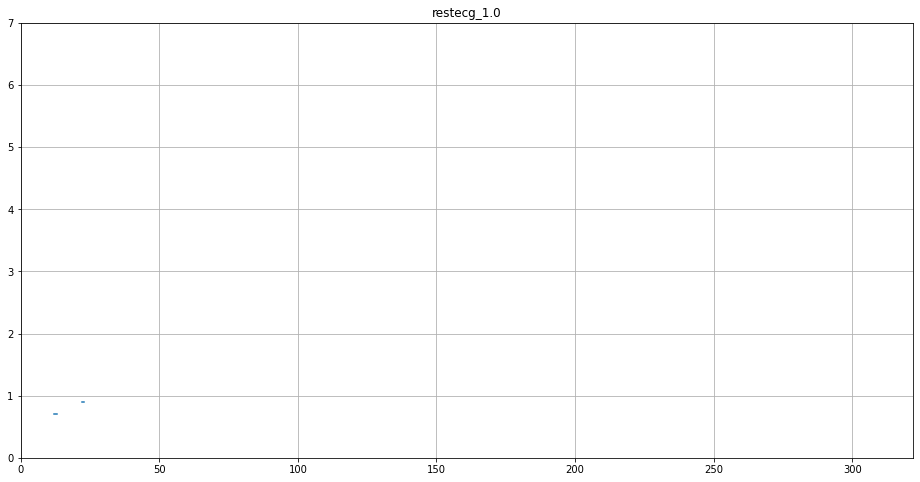

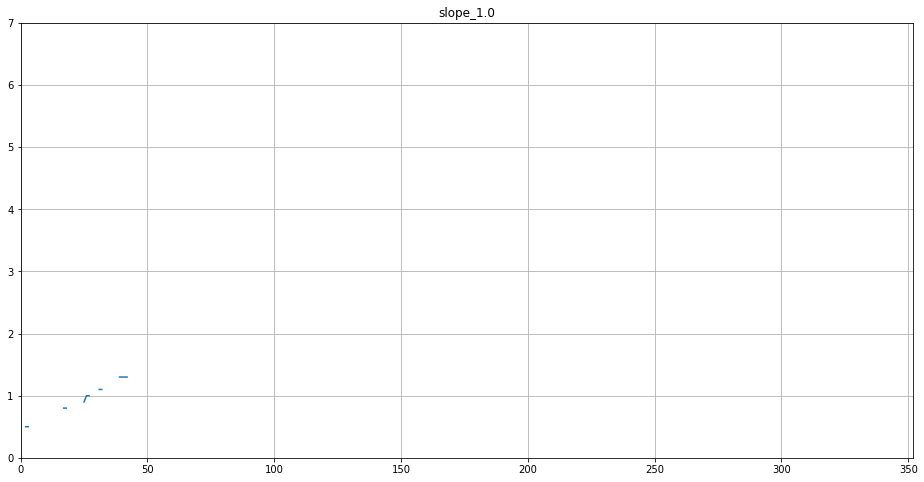

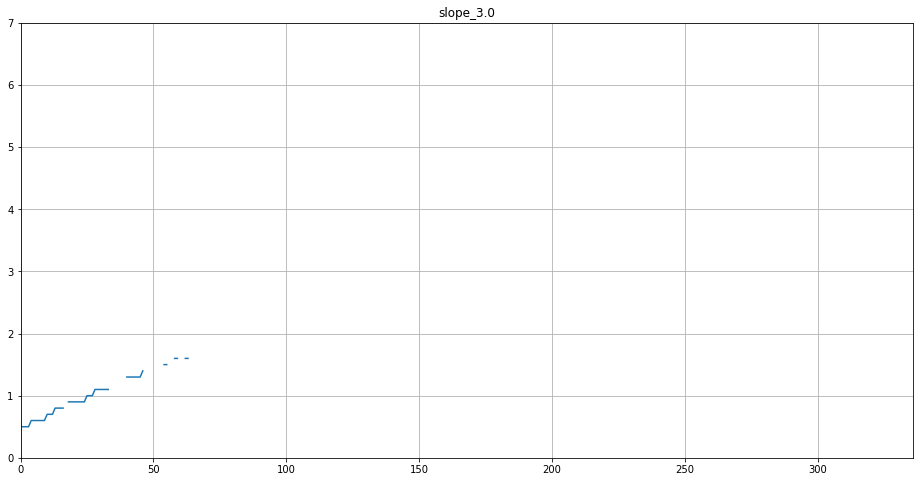

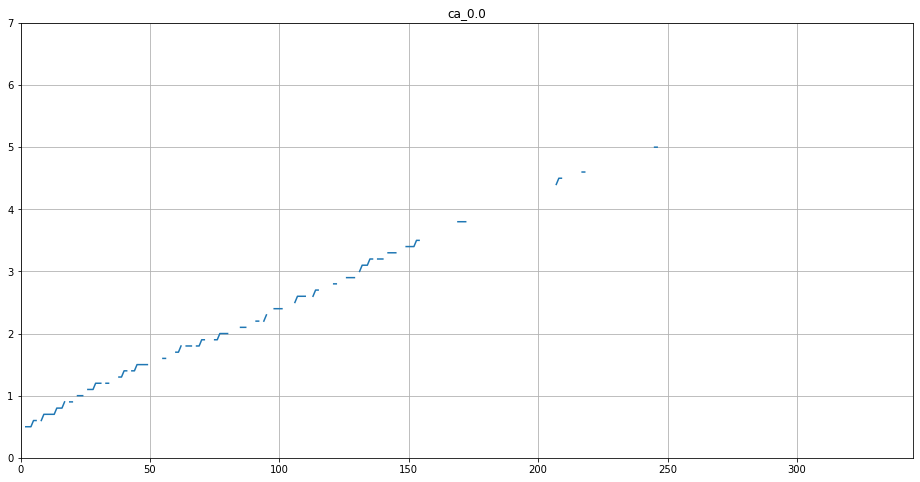

...

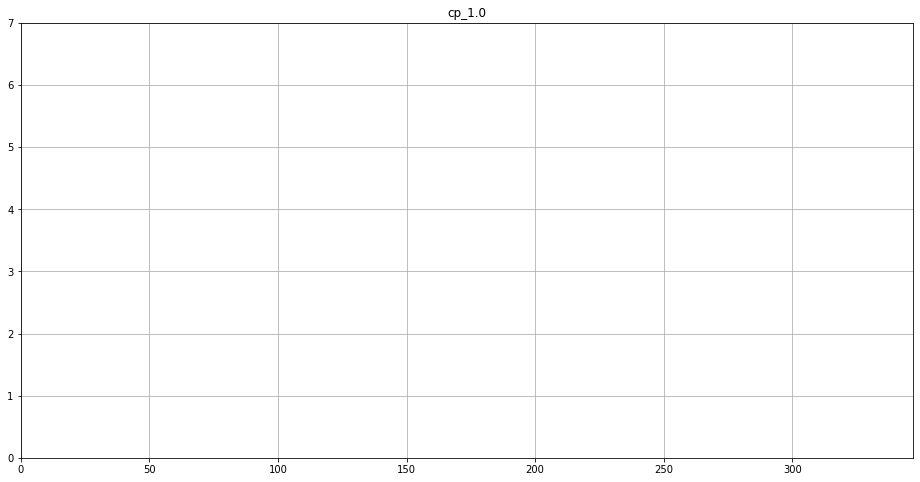

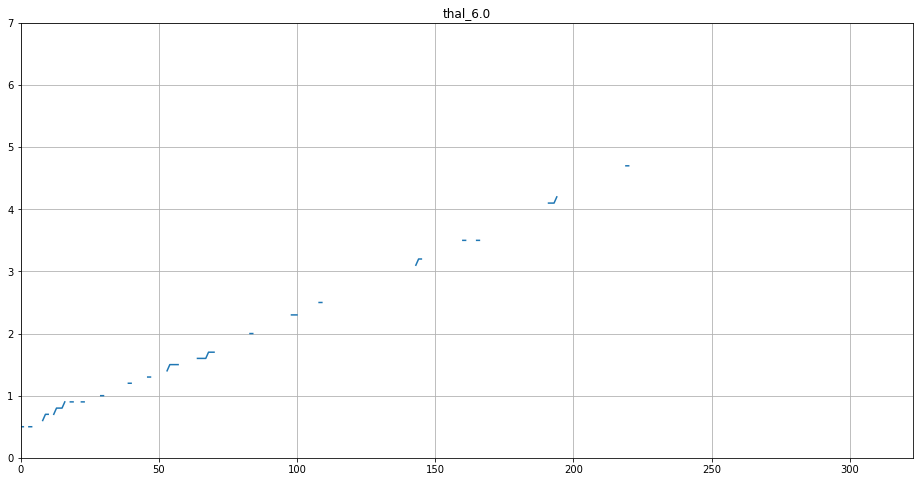

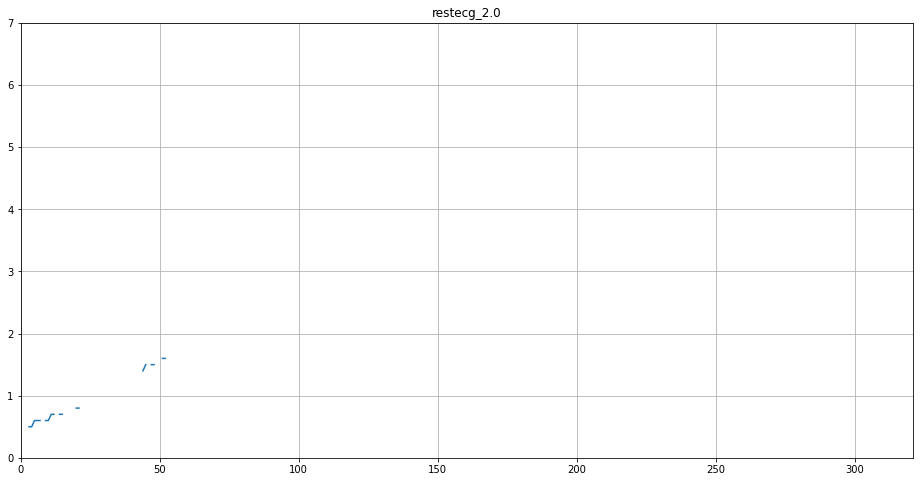

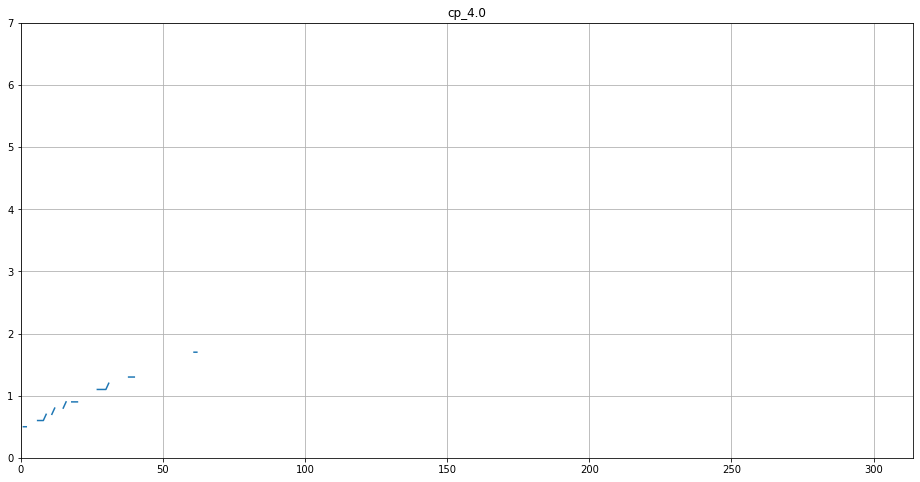

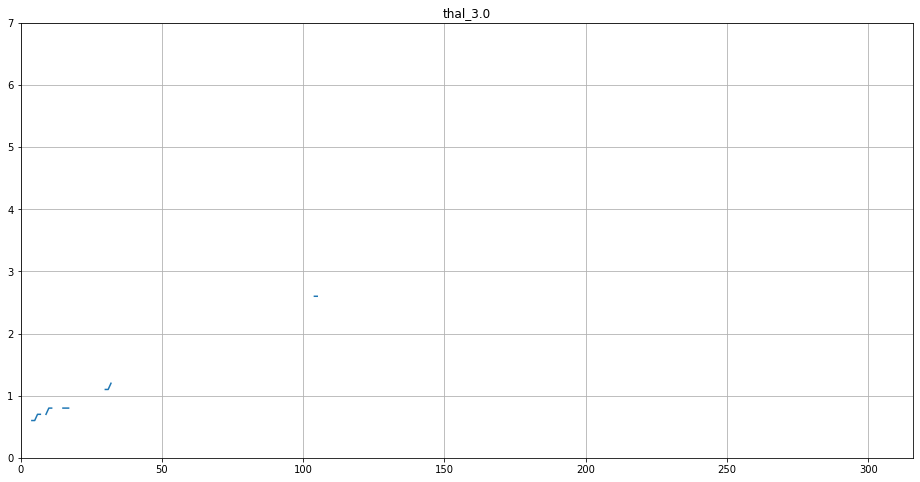

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

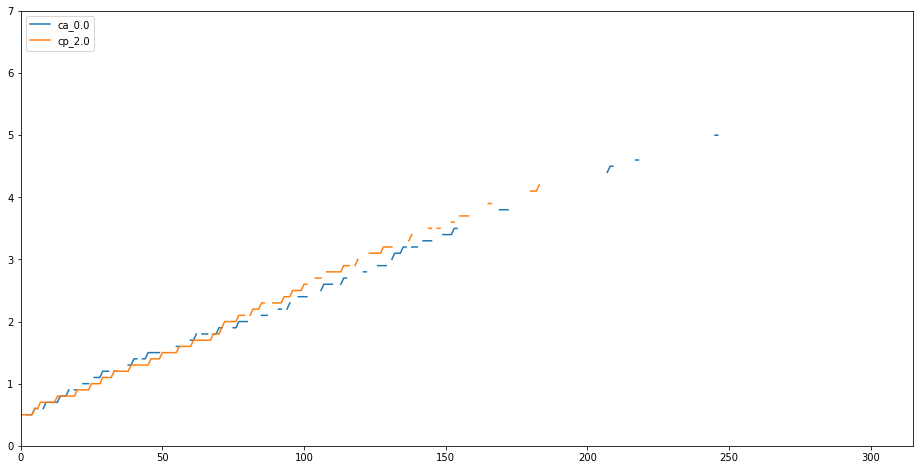

In [ ]:
fig = plt.figure(i)
for i in ['ca_0.0','cp_2.0']:
  plt.plot(np.arange(len(did_appear[i])),did_appear[i],label=i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

plt.legend()

cp_2.0 last.

Let's see again which ca is best now.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang','age','thal_7.0','oldpeak','fbs','chol','cp_2.0']
    #features = [feature for feature in model2_group.columns.drop(['exang','age','thal_7.0','ca_2.0','oldpeak','fbs','chol']) if random.random() > 0.5]
    features = copy.deepcopy(ca_list)
    features.extend(features_premade)
    temp = hard_function(tau = tau, X = model2_group[features], y=model2_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

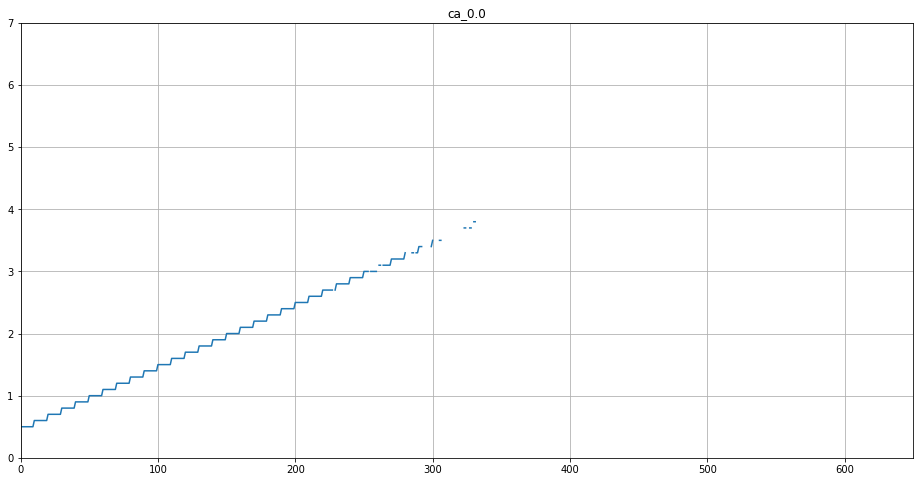

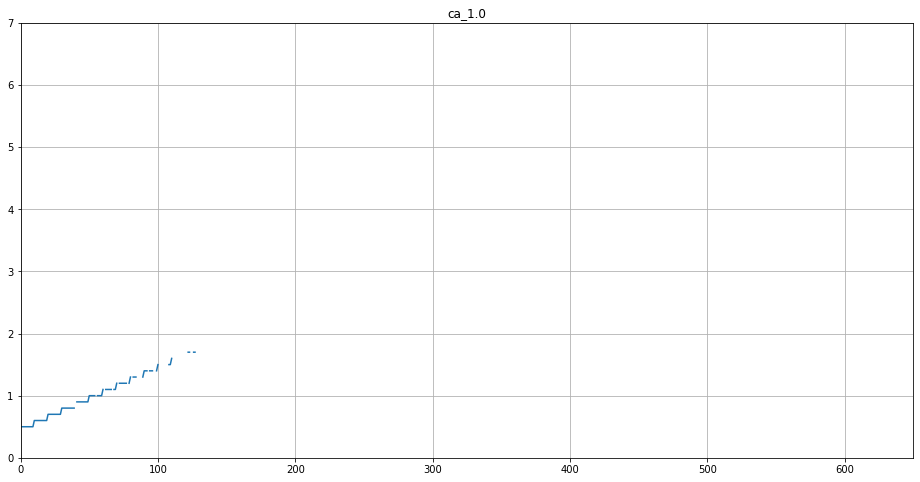

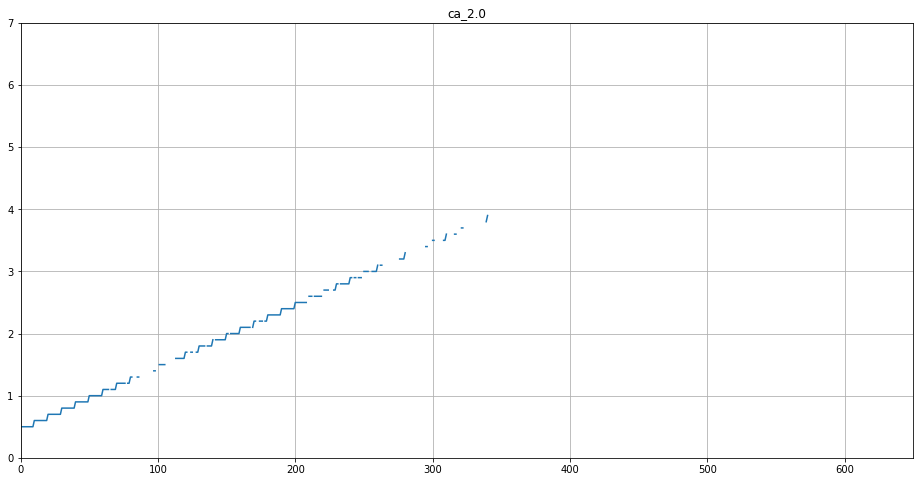

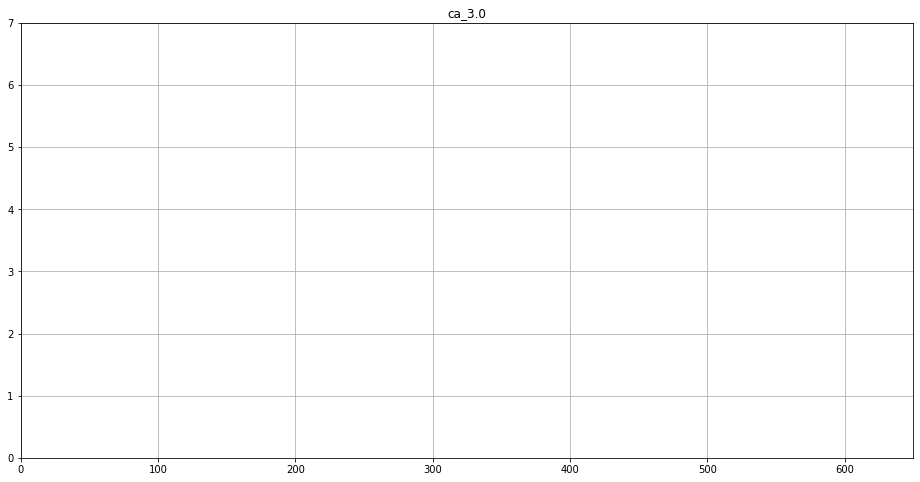

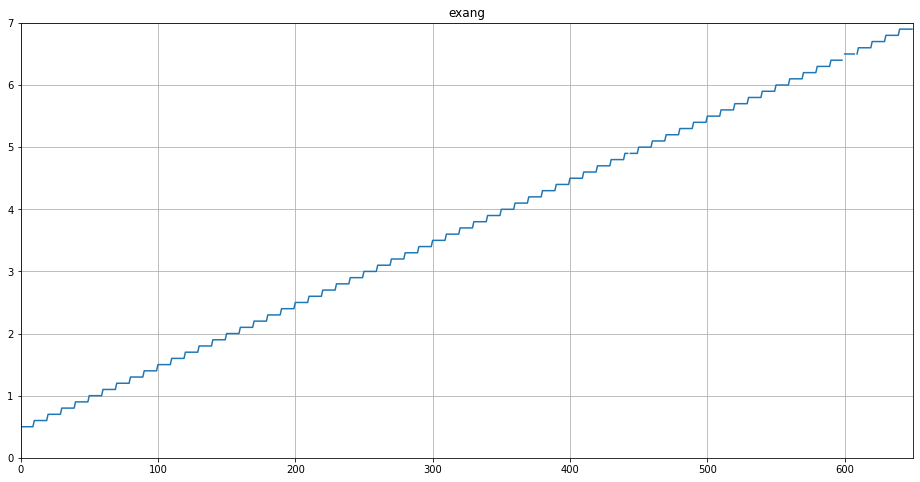

...

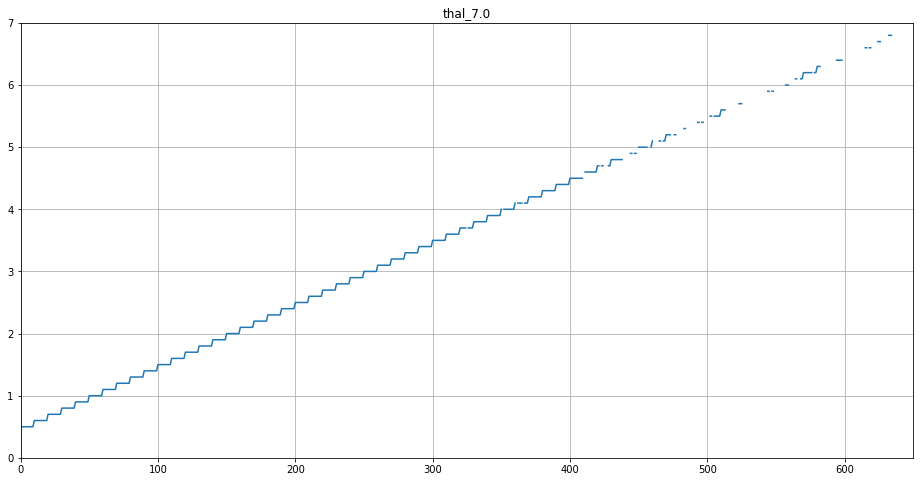

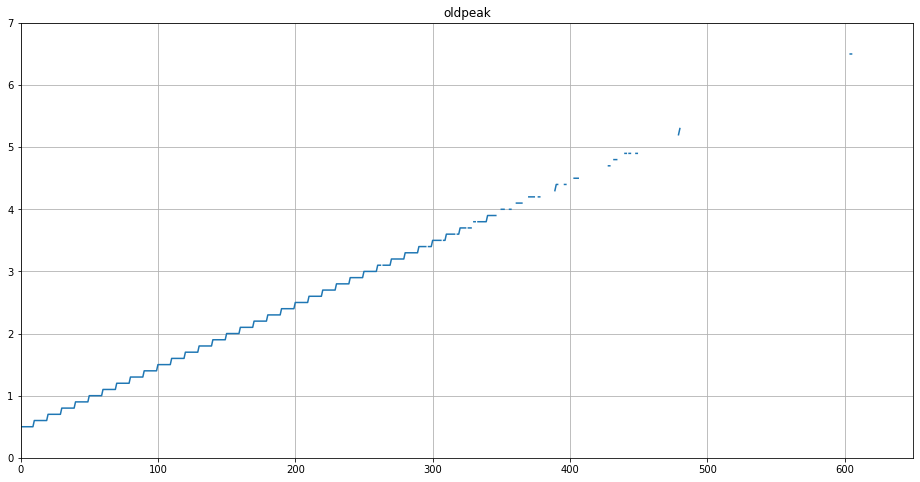

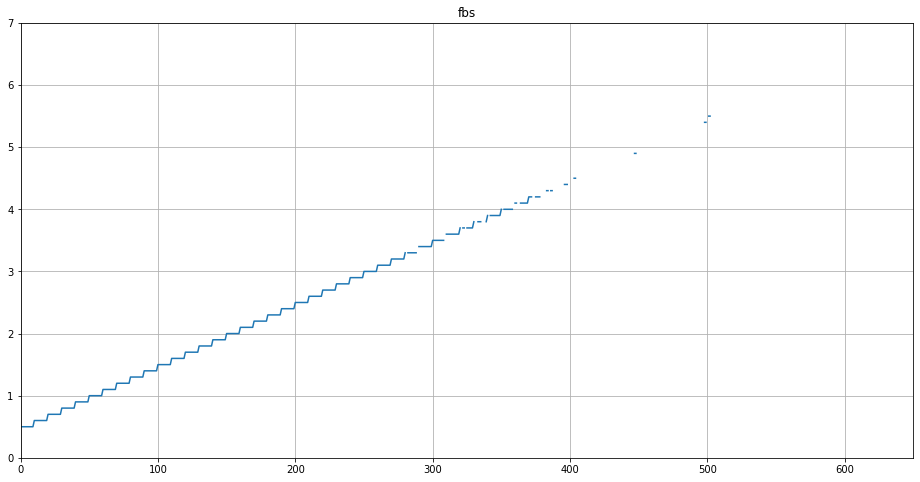

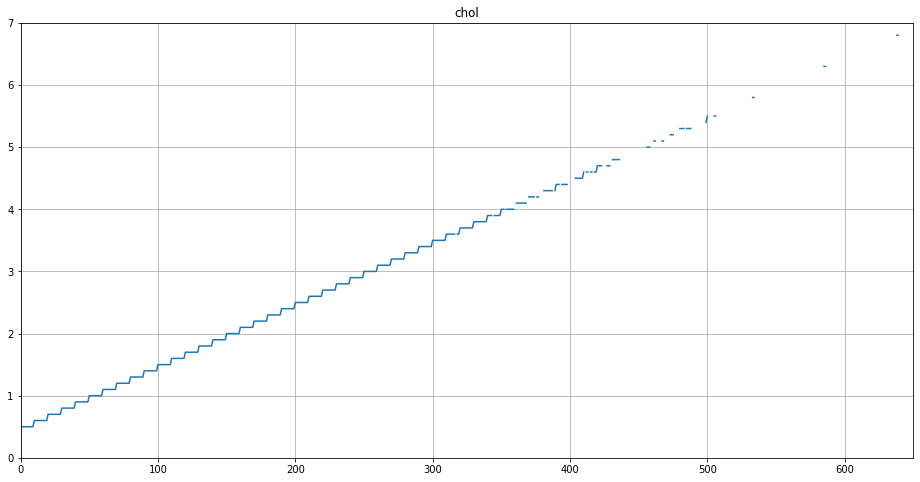

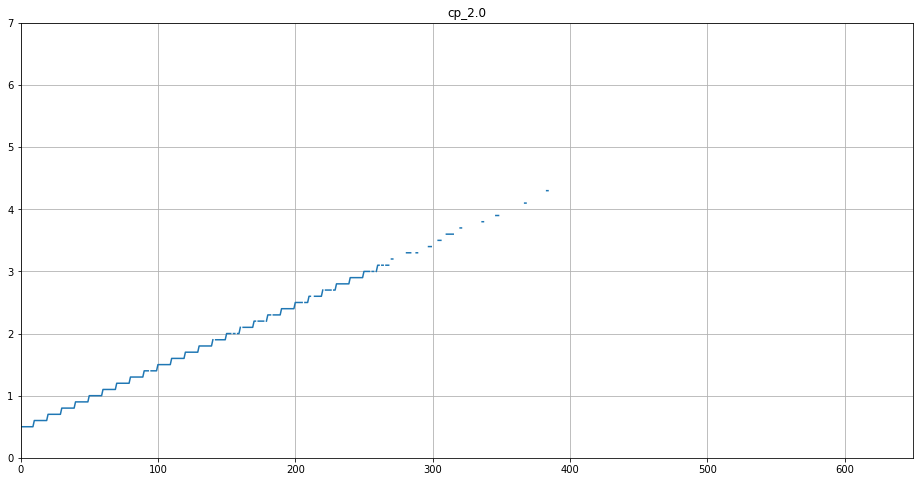

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

ca_0.0 is apparently better.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang','age','oldpeak','fbs','chol','ca_0.0','cp_2.0']
    #features = [feature for feature in model2_group.columns.drop(['exang','age','thal_7.0','ca_2.0','oldpeak','fbs','chol']) if random.random() > 0.5]
    features = copy.deepcopy(thal_list)
    features.extend(features_premade)
    temp = hard_function(tau = tau, X = model2_group[features], y=model2_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

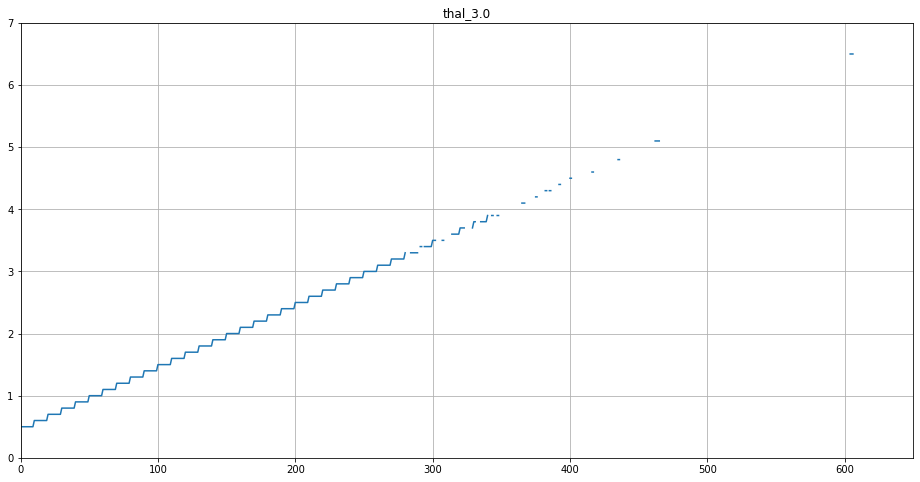

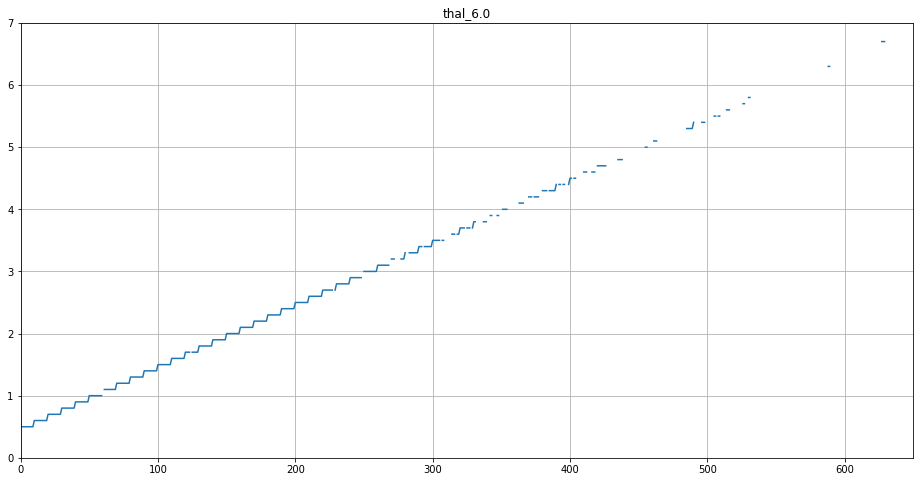

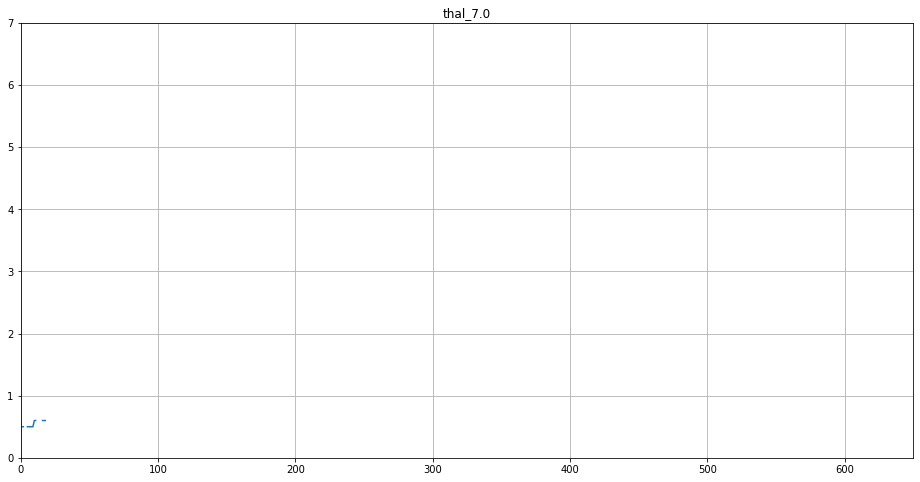

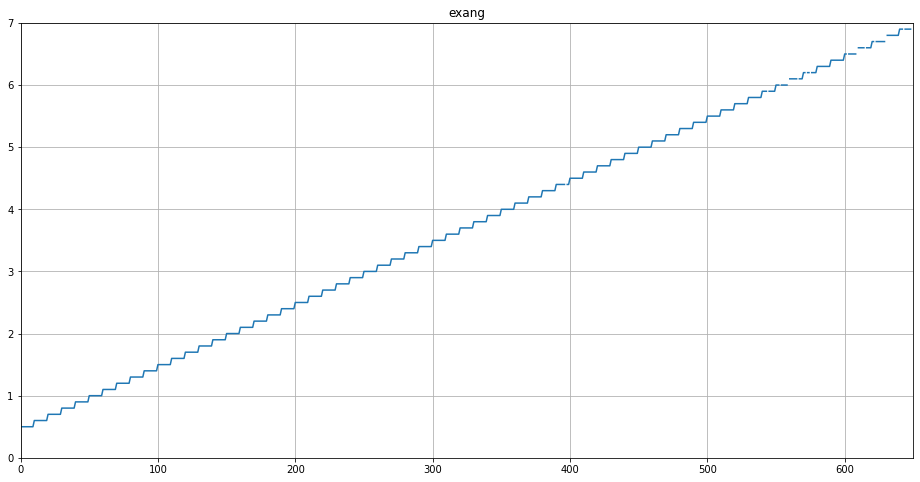

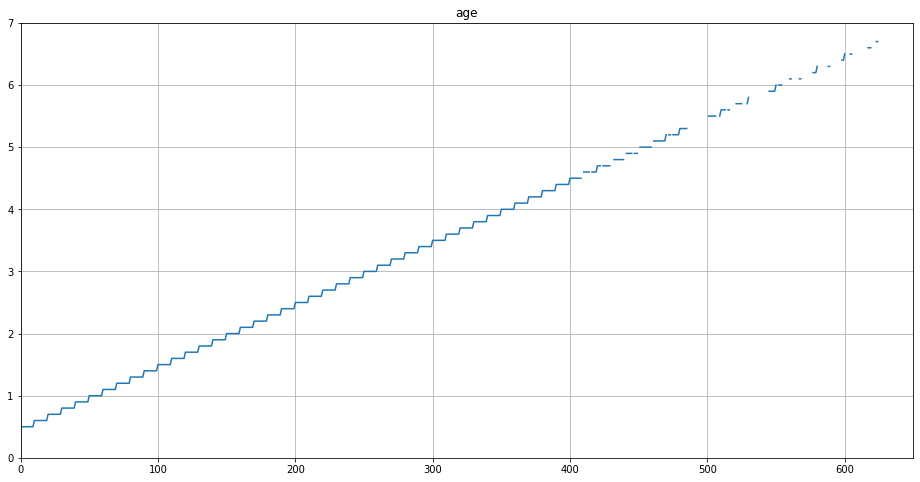

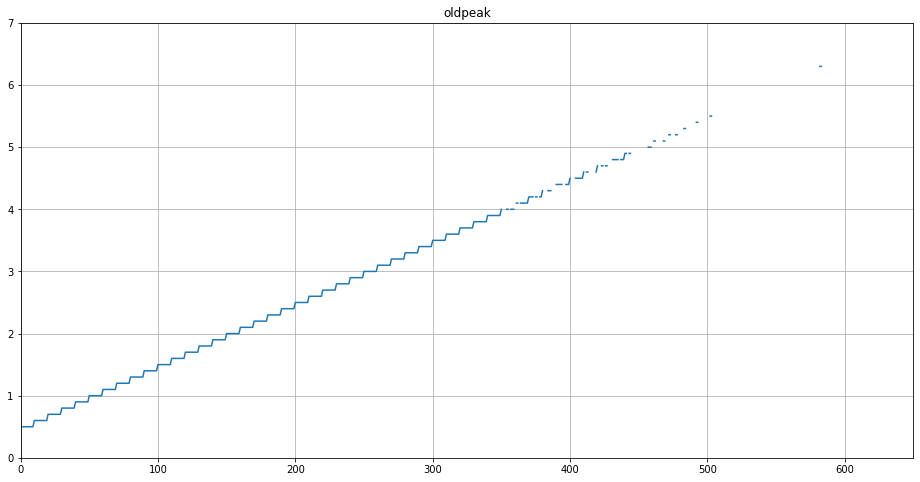

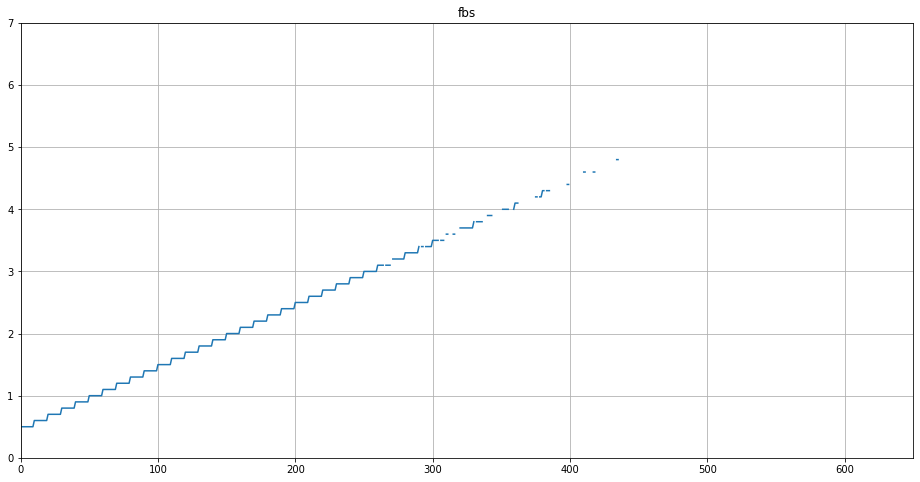

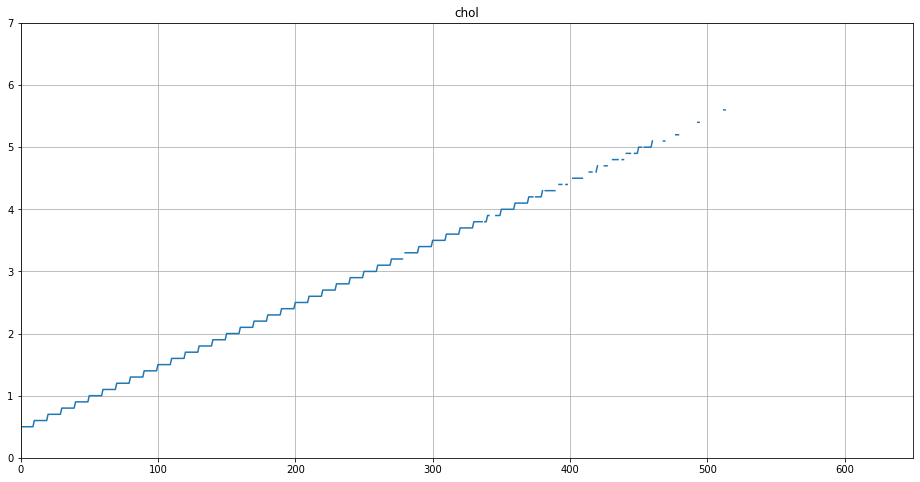

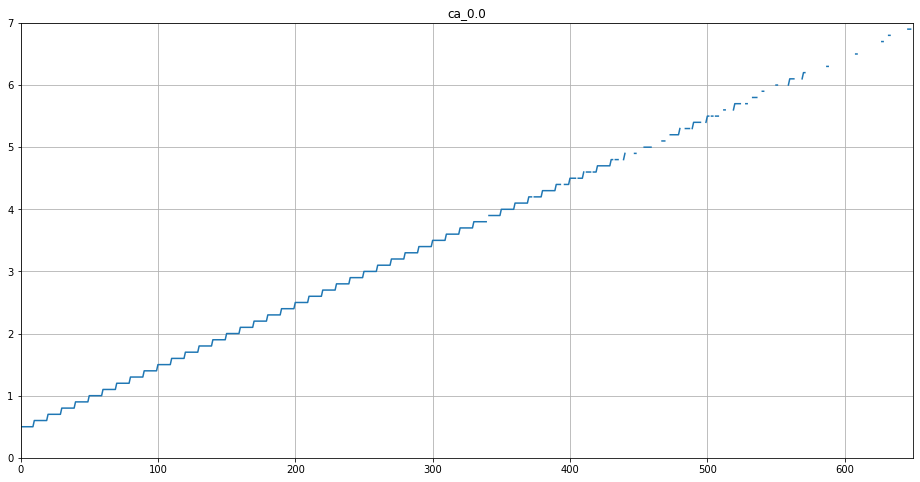

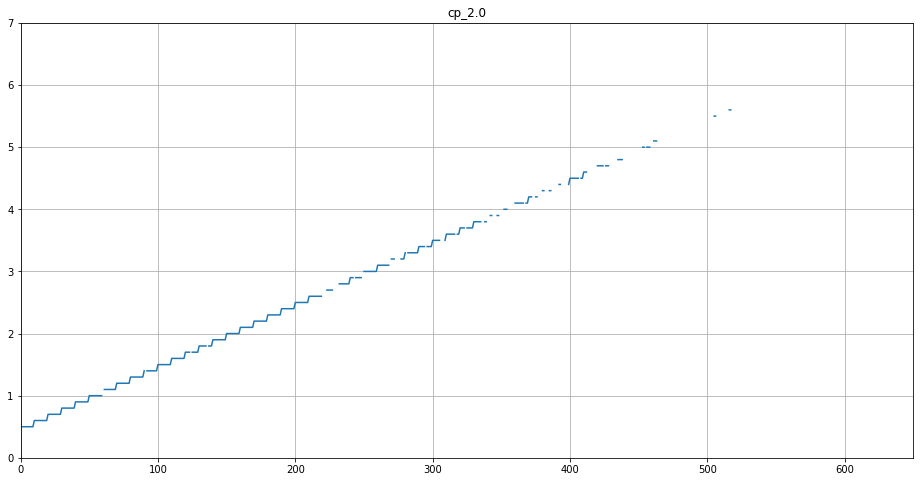

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

How interesting. 'thal_7.0' is really not the right thal, it's both thal_3.0 and thal_6.0 which is why by itself, it's (maybe) thal_7.0. There is no reason to choose thal_3 and thal_6 because it's the same as thal_7?

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang','age','oldpeak','fbs','chol','ca_0.0','cp_2.0']
    #features = [feature for feature in model2_group.columns.drop(['exang','age','thal_7.0','ca_2.0','oldpeak','fbs','chol']) if random.random() > 0.5]
    features = copy.deepcopy(thal_list)
    for feature in features:
      abc = np.append(features_premade,feature)
      assert features_premade == ['exang','age','oldpeak','fbs','chol','ca_0.0','cp_2.0']
      temp = hard_function(tau = tau, X = model2_group[abc], y=model2_y, estimator = logistic_estimator)
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

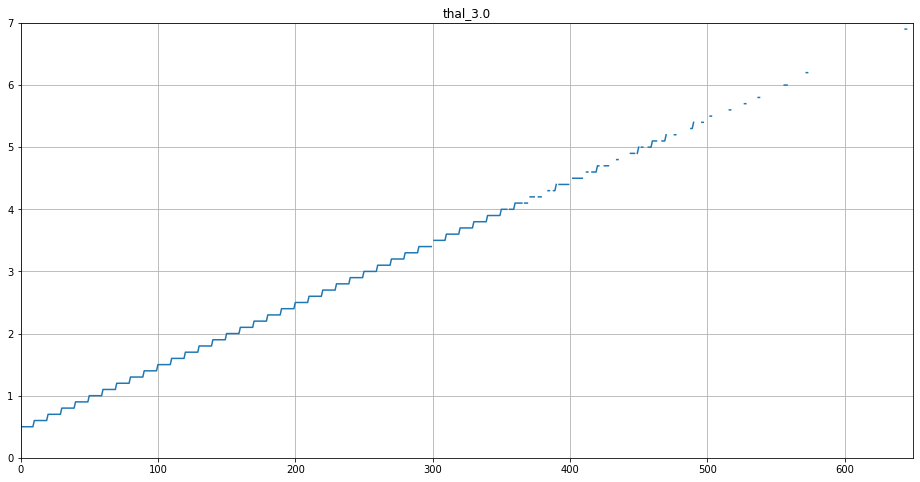

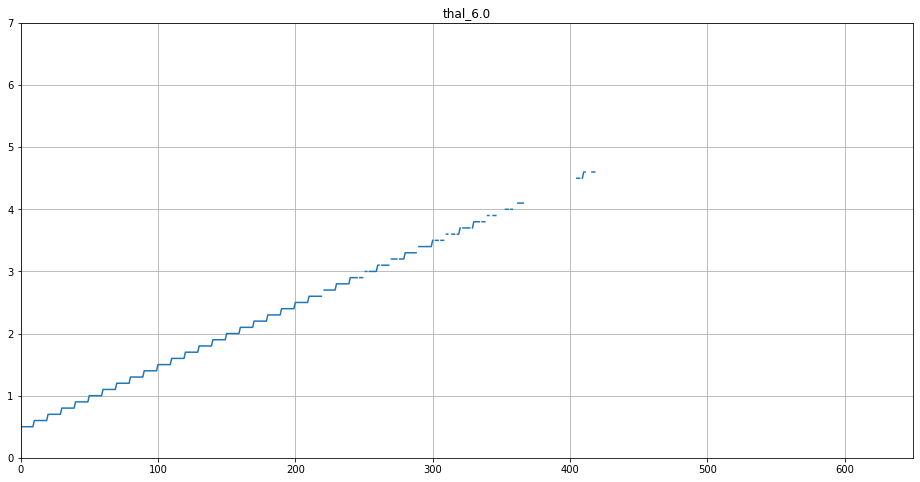

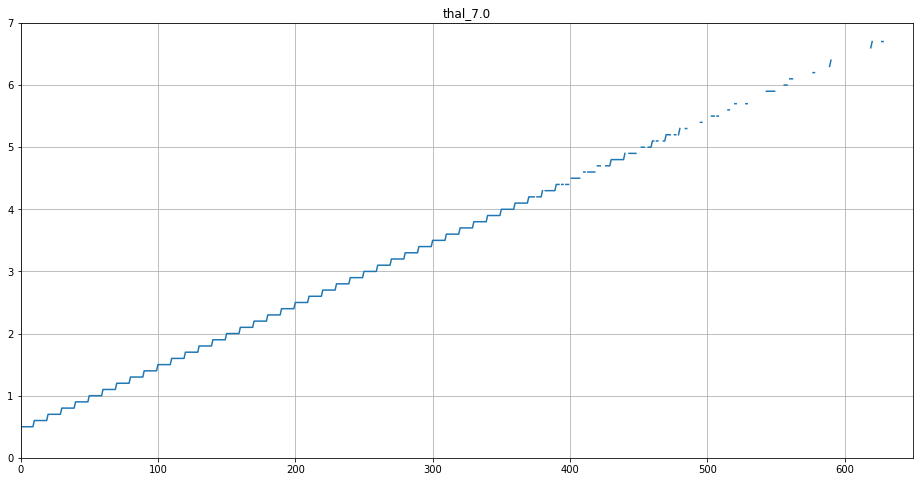

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

thal_7 is still the best even though it's apparently thal_3 and thal_4 that are important. If I wanted to take 2, I would take thal_3 and thal_4 even though I can take any two.

So even though I have all 8, I'm still thinking about ca_2.0 and thal_3.0 against cp_2.0.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang','age','oldpeak','fbs','chol','ca_0.0','thal_7.0']
    #features = [feature for feature in model2_group.columns.drop(['exang','age','thal_7.0','ca_2.0','oldpeak','fbs','chol']) if random.random() > 0.5]
    features = ['ca_2.0','thal_3.0','cp_2.0']
    for feature in features:
      abc = np.append(features_premade,feature)
      temp = hard_function(tau = tau, X = model2_group[abc], y=model2_y, estimator = logistic_estimator)
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

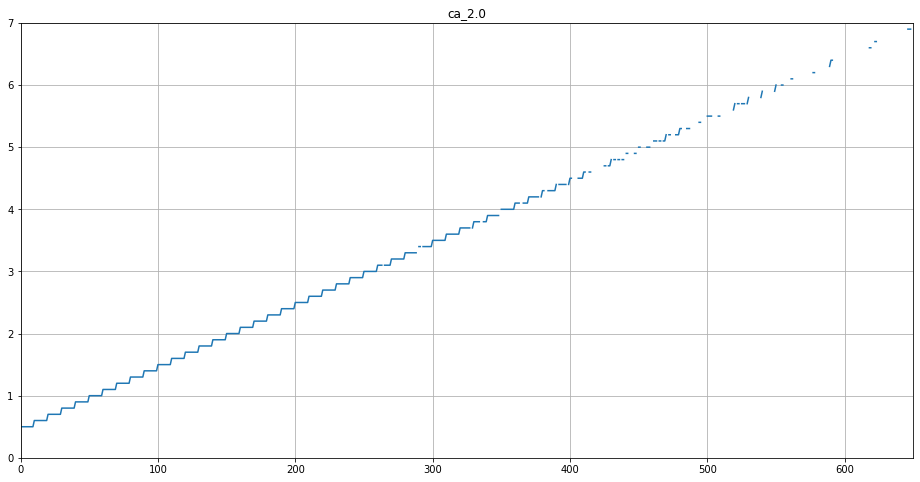

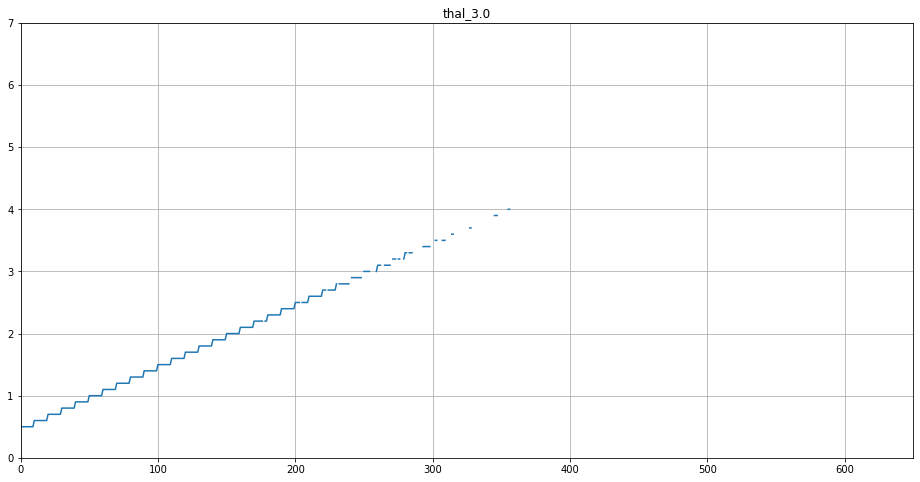

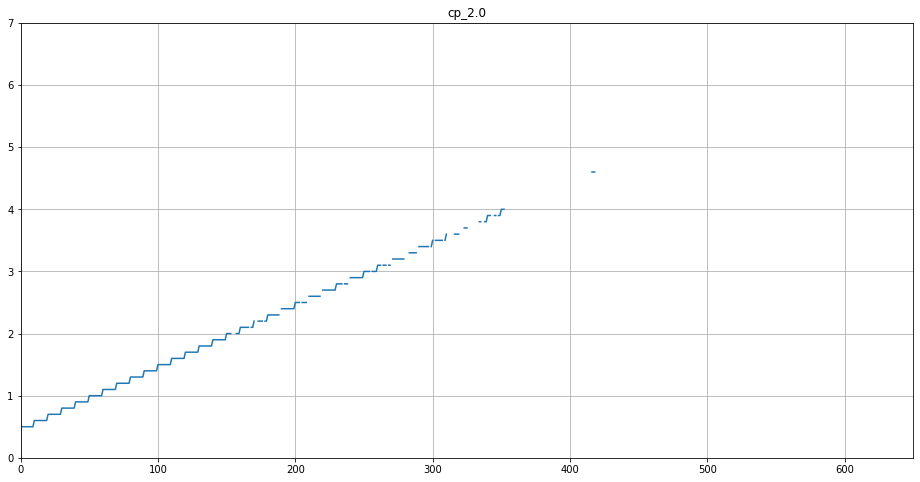

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

It's clearly ca_2.0.

Now I'm thinking cp_2.0 against the others.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang','age','oldpeak','fbs','chol','ca_0.0','thal_7.0','ca_2.0','cp_2.0']
    #features = [feature for feature in model2_group.columns.drop(['exang','age','thal_7.0','ca_2.0','oldpeak','fbs','chol']) if random.random() > 0.5]
    #features.extend(features_premade)
    features = features_premade
    temp = hard_function(tau = tau, X = model2_group[features], y=model2_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

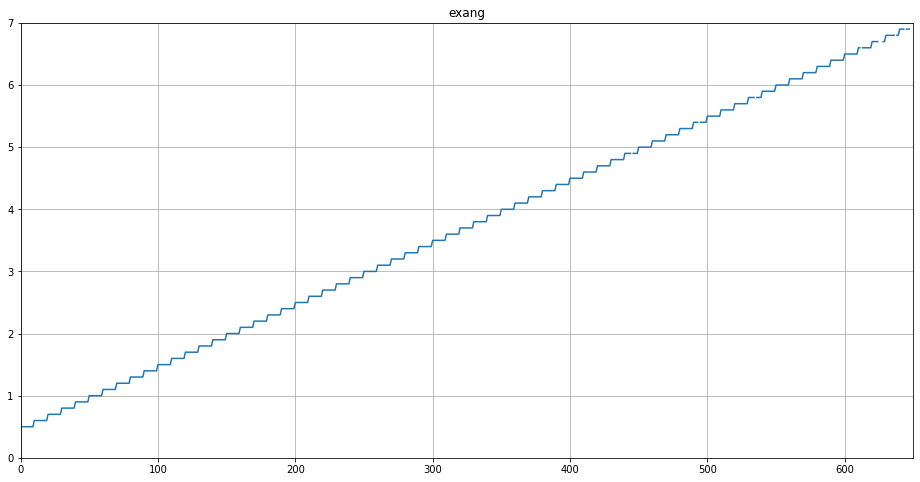

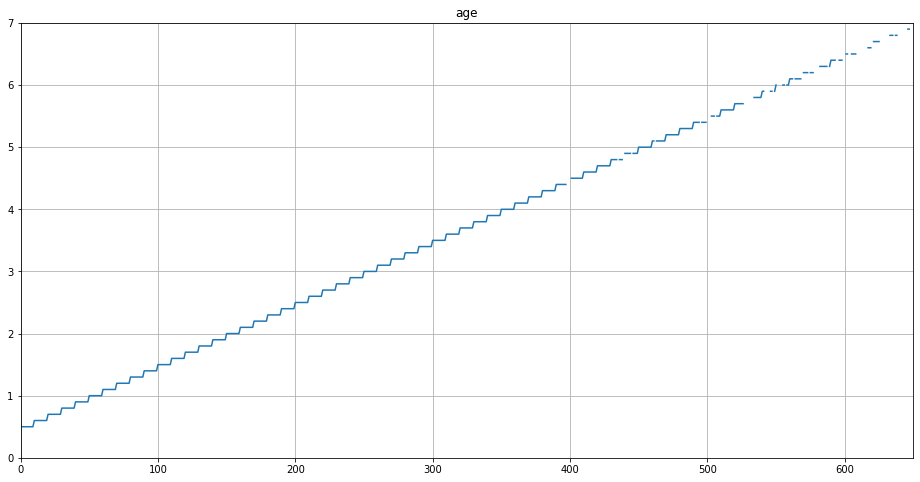

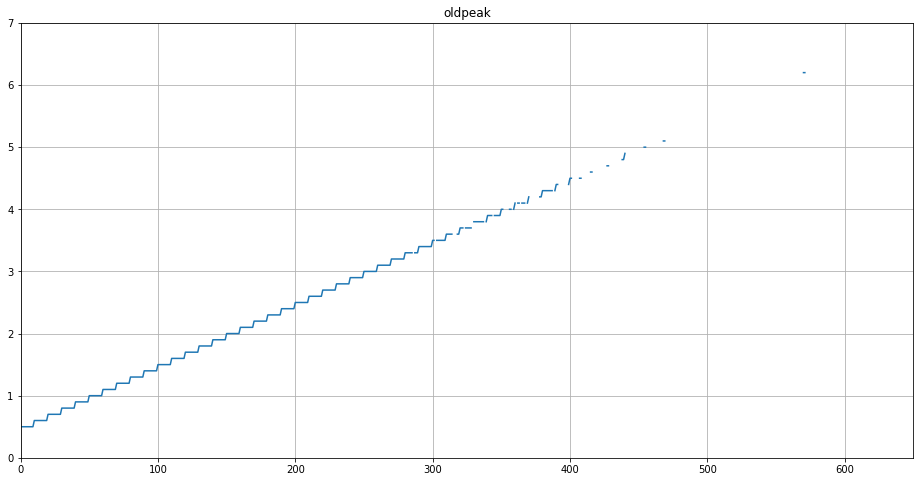

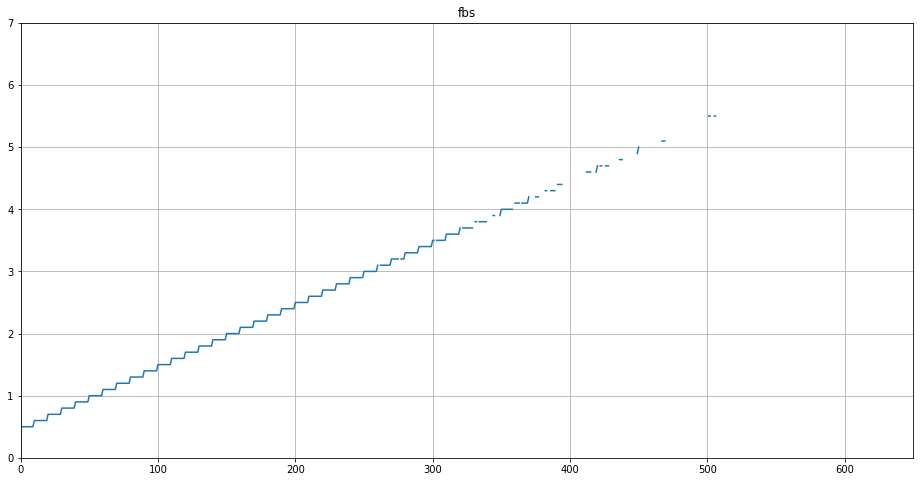

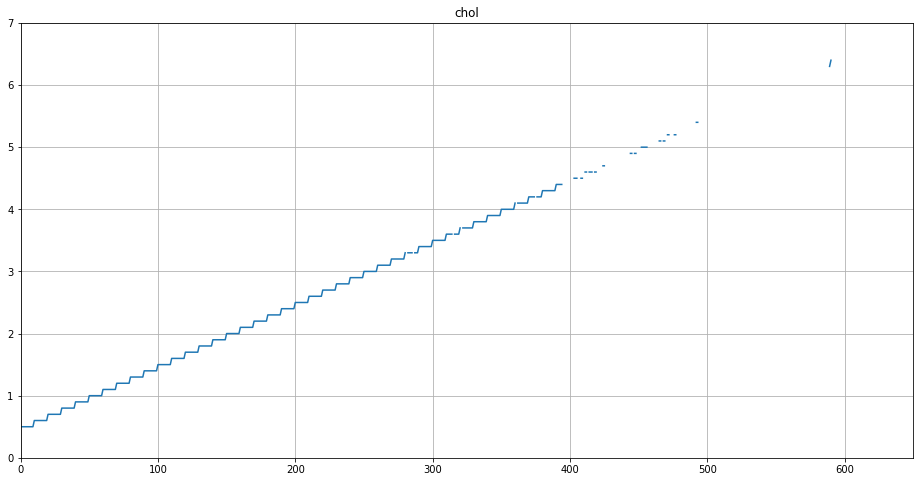

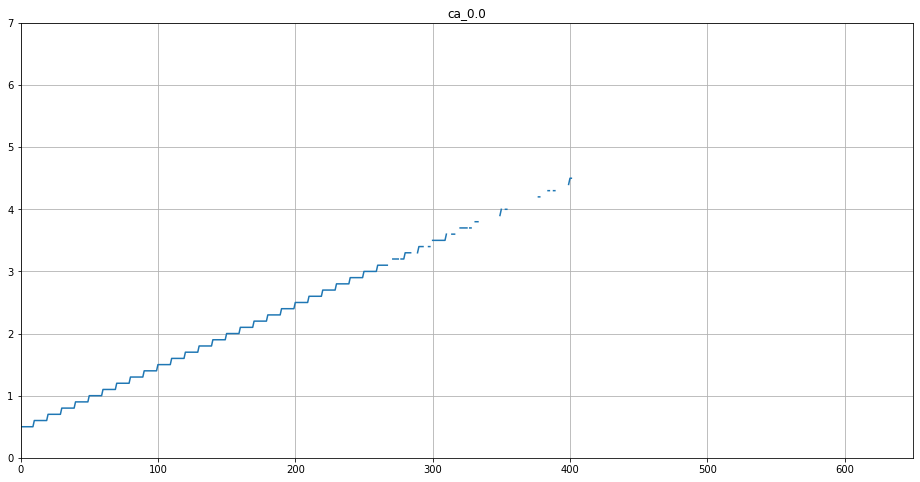

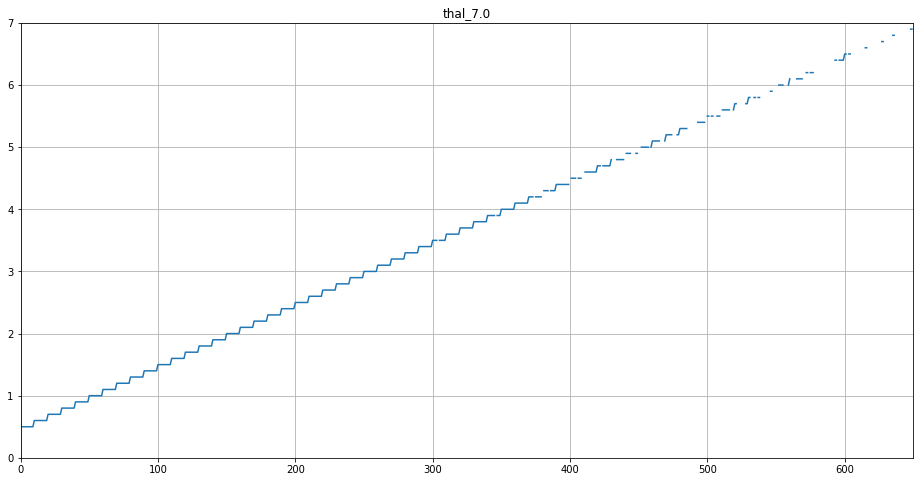

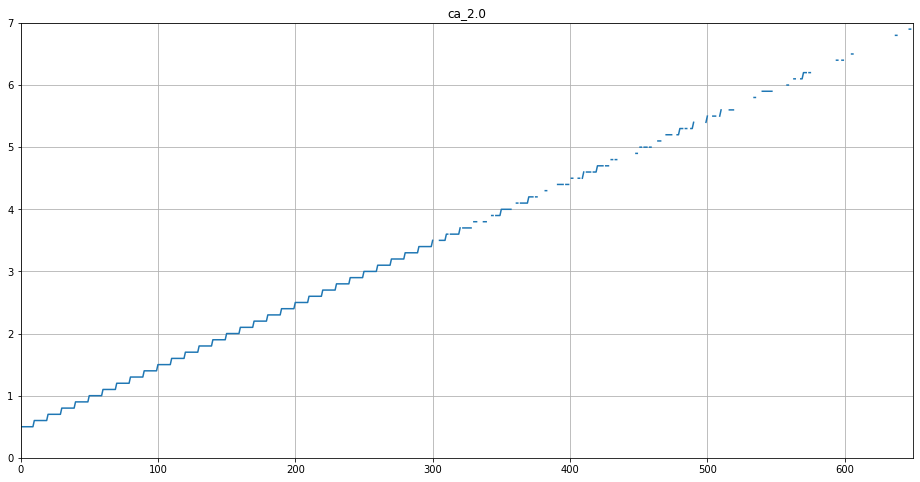

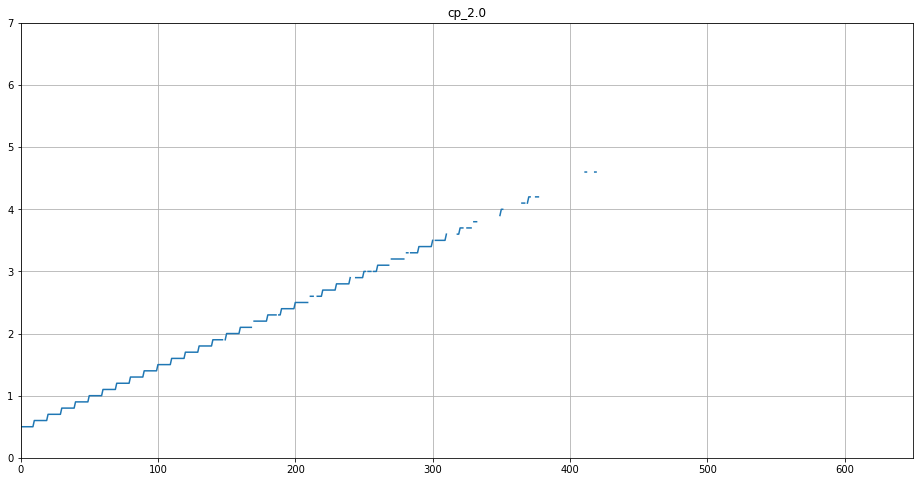

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang','age','oldpeak','fbs','chol','ca_2.0','thal_7.0']
    #features = [feature for feature in model2_group.columns.drop(['exang','age','thal_7.0','ca_2.0','oldpeak','fbs','chol']) if random.random() > 0.5]
    features = ['ca_0.0','cp_2.0']
    for feature in features:
      abc = np.append(features_premade,feature)
      temp = hard_function(tau = tau, X = model2_group[abc], y=model2_y, estimator = logistic_estimator)
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

It may be better than ca_0.0 now that we have ca_2.0.

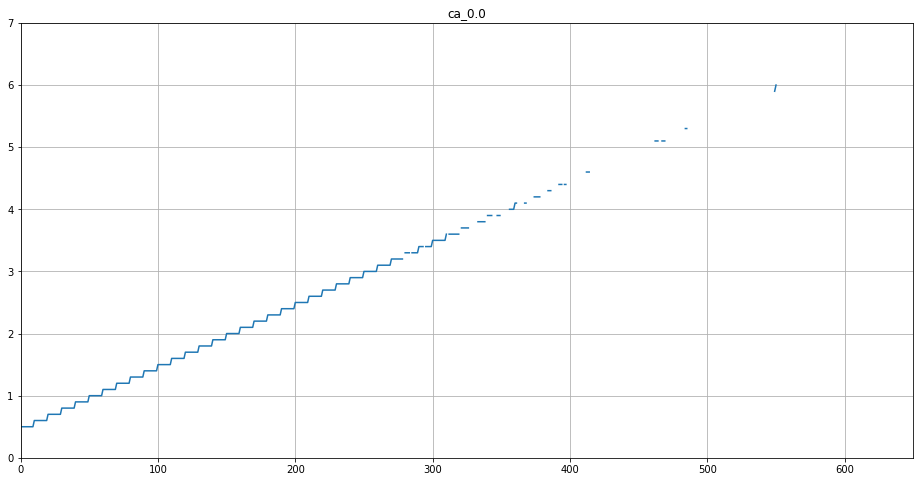

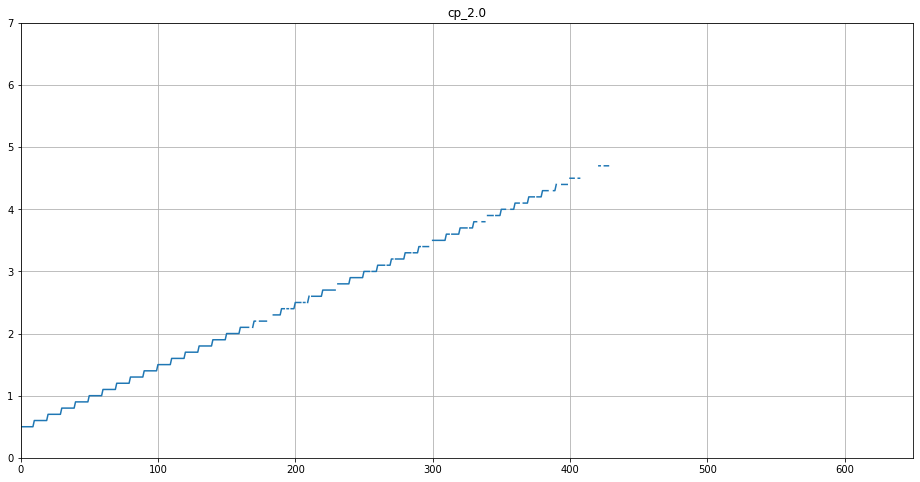

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['exang','age','oldpeak','fbs','chol','cp_2.0','thal_7.0']
    #features = [feature for feature in model2_group.columns.drop(['exang','age','thal_7.0','ca_2.0','oldpeak','fbs','chol']) if random.random() > 0.5]
    features = ['ca_0.0','ca_2.0']
    for feature in features:
      abc = np.append(features_premade,feature)
      temp = hard_function(tau = tau, X = model2_group[abc], y=model2_y, estimator = logistic_estimator)
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

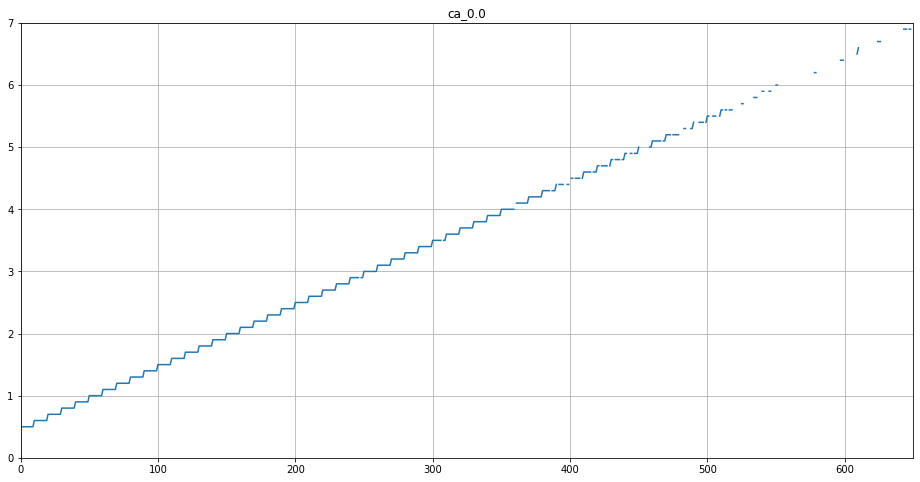

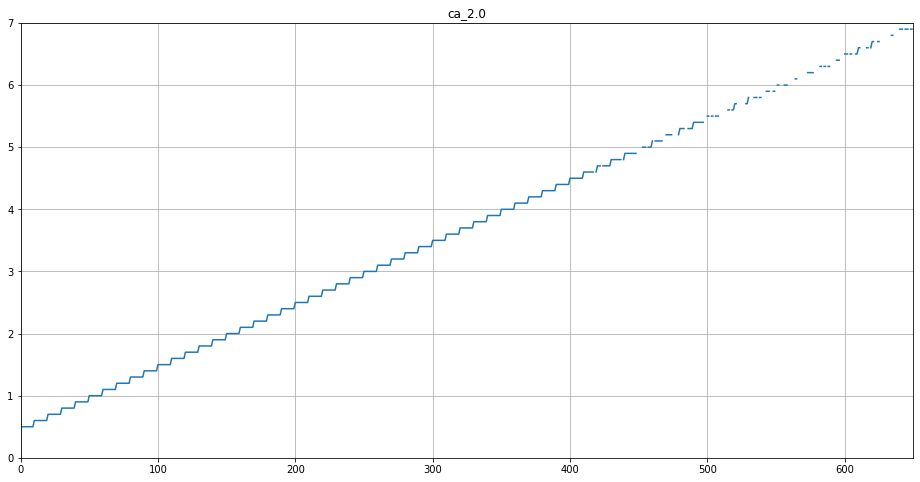

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

ca_2.0 is better and cp_2.0 is better than ca_0.0 if we also have ca_2.0.

In [ ]:
features2 = ['exang','age','thal_7.0','ca_2.0','oldpeak','fbs','chol','cp_2.0']
features2_old= ['exang','age','thal_7.0','ca_0.0','oldpeak','cp_3.0']
loading_scores(model2_group[features2],model2_y,pad=True,estimator=logistic_estimator);
loading_scores(model2_group[features2_old],model2_y,pad=True,estimator=logistic_estimator);

NameError: ignored

The old one is a bit better in accuracy but the new one is better in R^2. That's a bit sad because we can only get better R^2 using the likelihood. We don't have a way to know if the accuracy is going to be better or worse.

But just by taking out ca_3.0 and putting in age, we now have no difference in R^2 and the accuracy is still the same.

Again, Efron's R^2 cannot be trusted for test because it only has 4 points and if each are 1, then it's 1/0 = Infinity.

## still finding features

In [ ]:
features2 = ['exang','thal_7.0','cp_3.0','ca_0.0','oldpeak','age']

Let's do model1 again.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features = [feature for feature in model1_group.columns if random.random() > 0.5]
    temp = hard_function(tau = tau, X = model1_group[features], y=model1_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

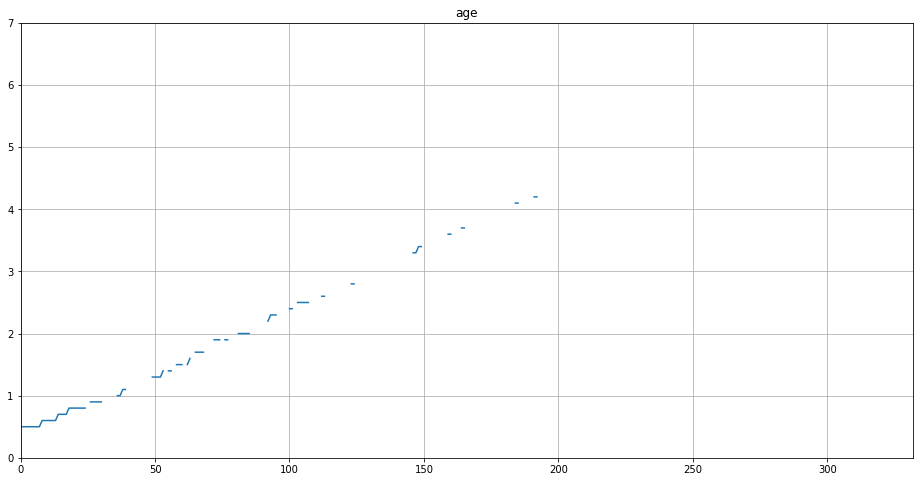

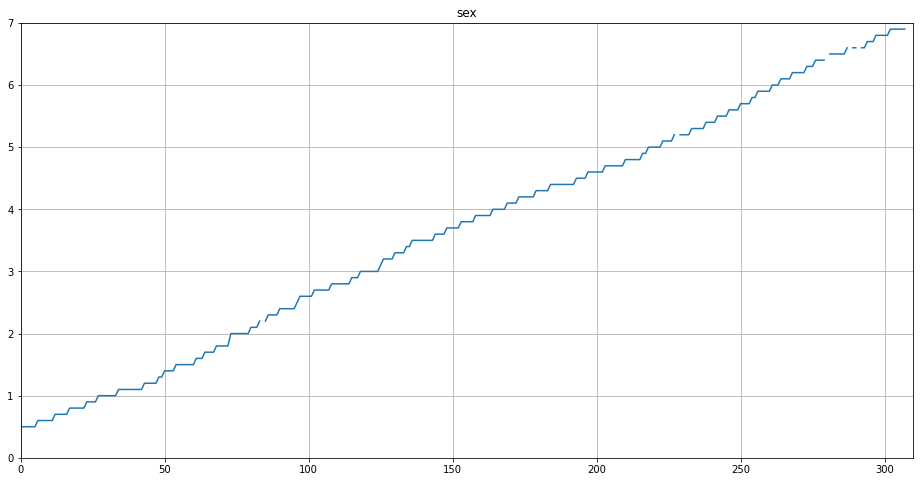

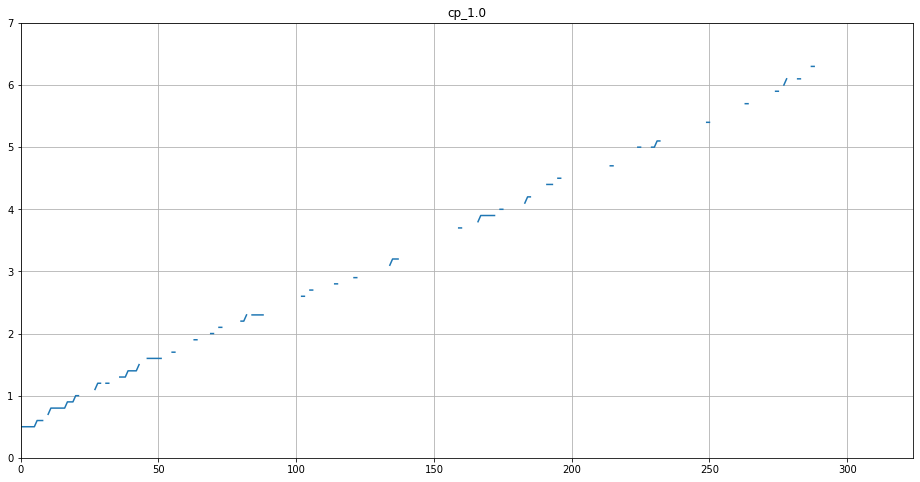

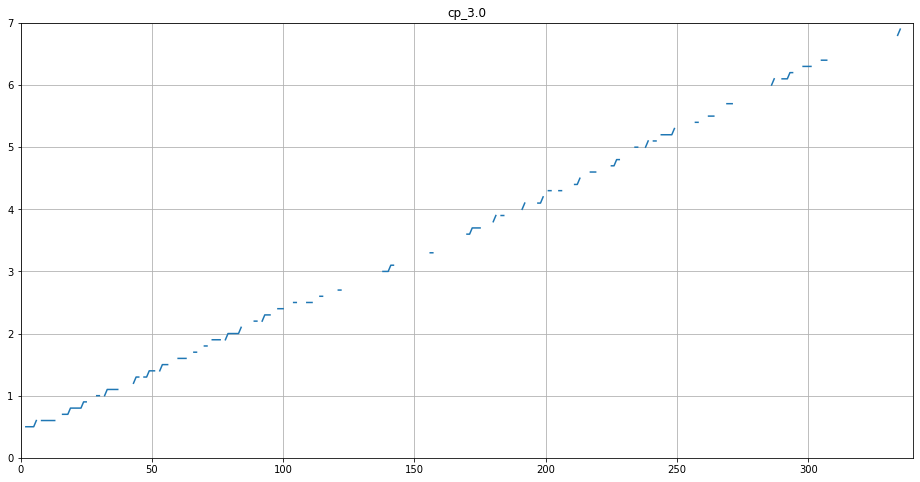

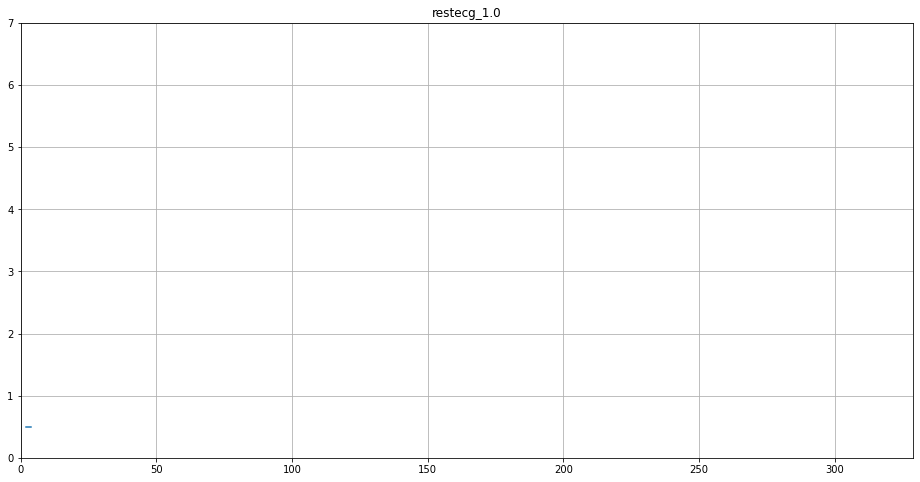

...

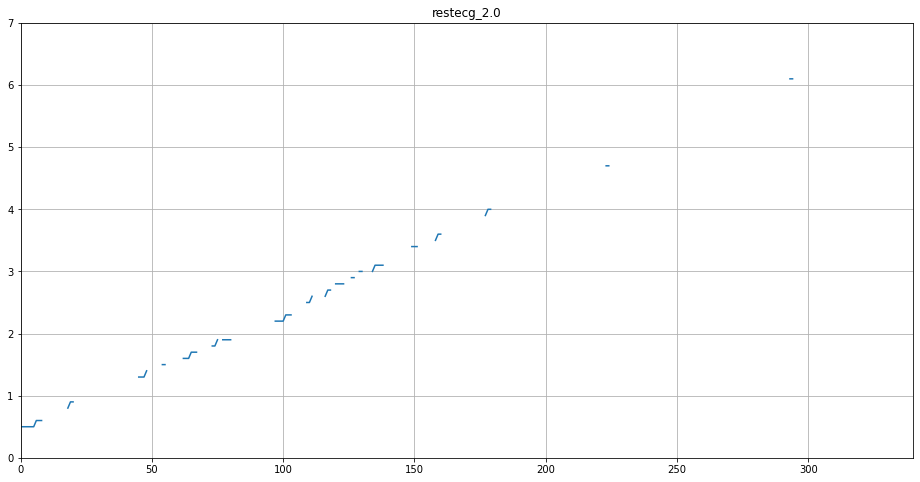

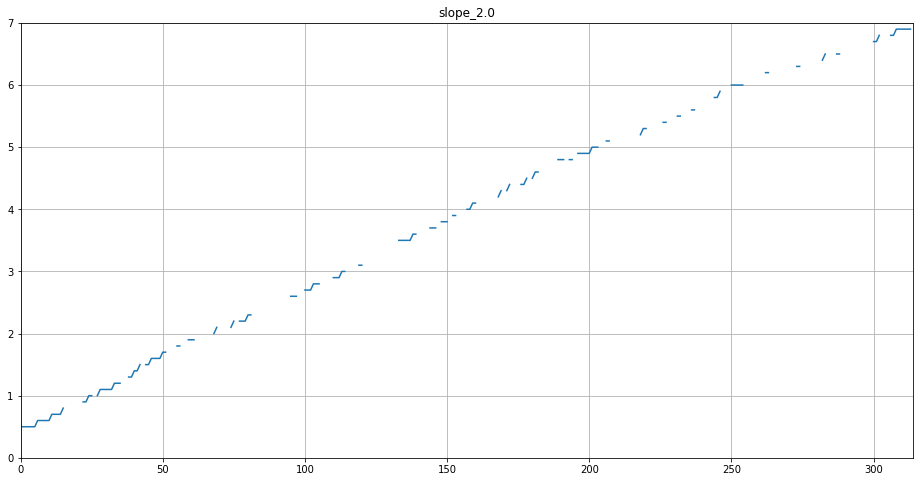

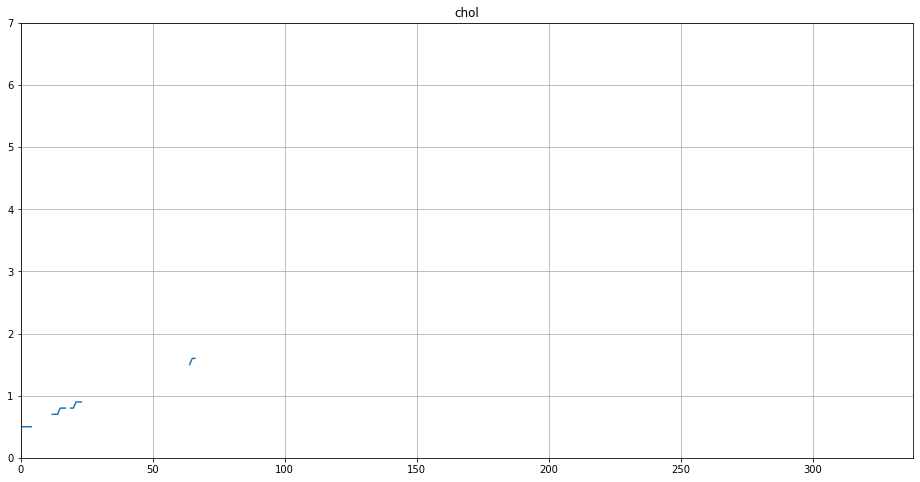

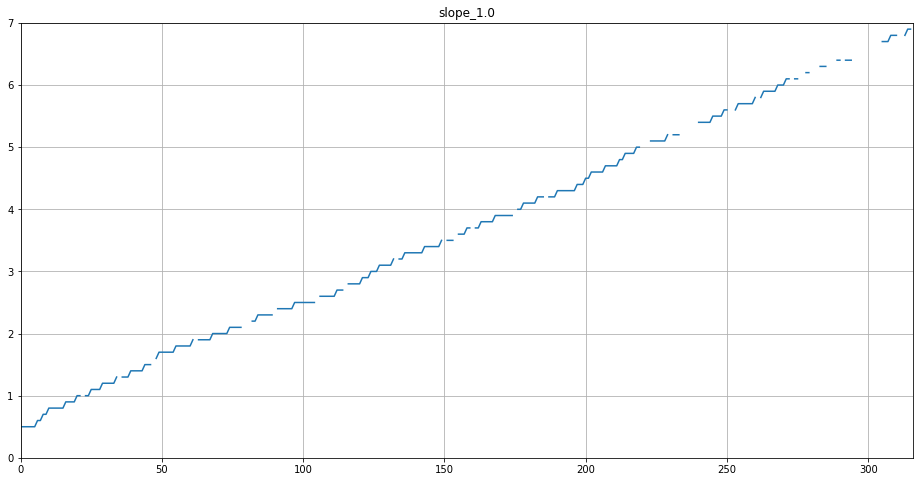

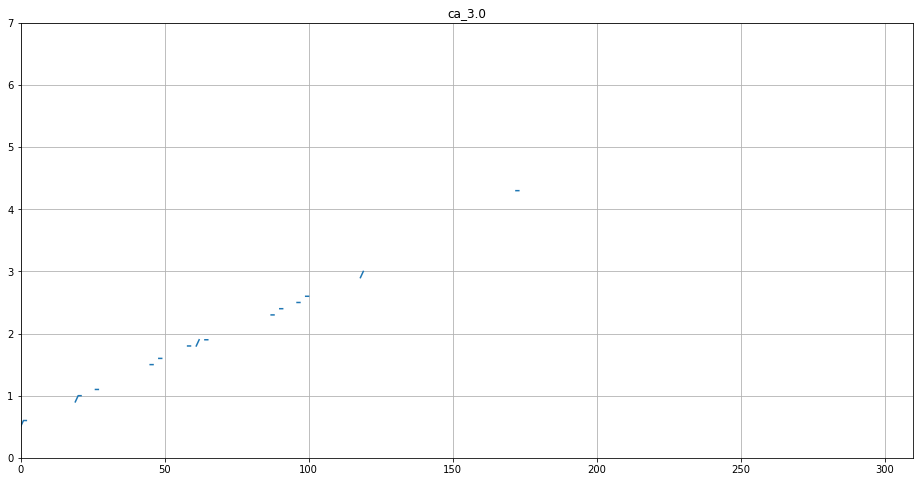

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

we'll do sex first

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['sex']
    features = [feature for feature in model1_group.columns.drop(['sex']) if random.random() > 0.5]
    abc = features + features_premade
    temp = hard_function(tau = tau, X = model1_group[abc], y=model1_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

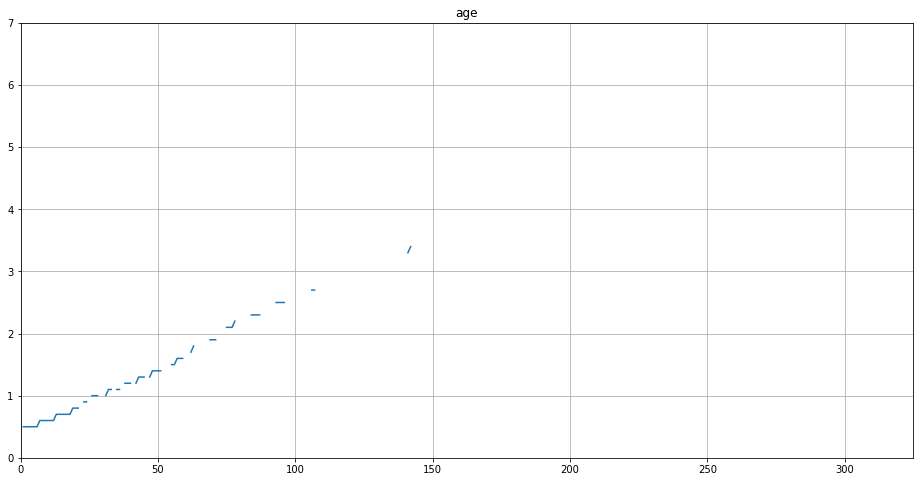

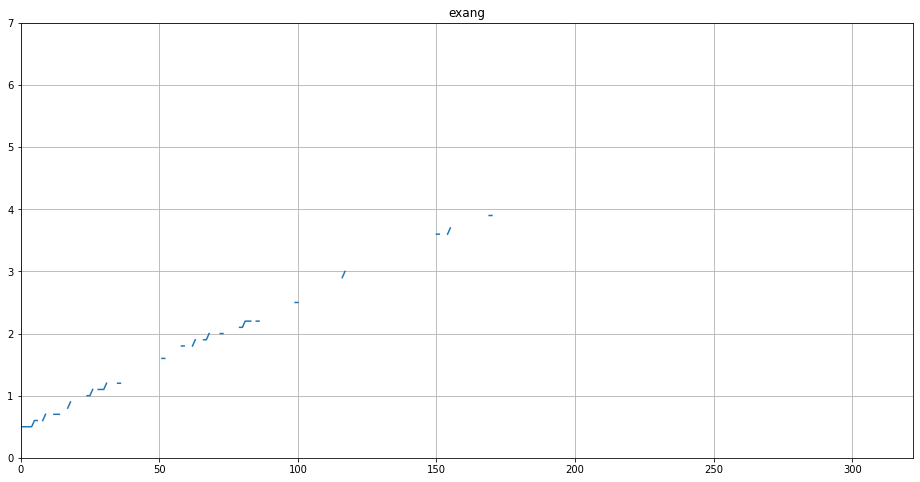

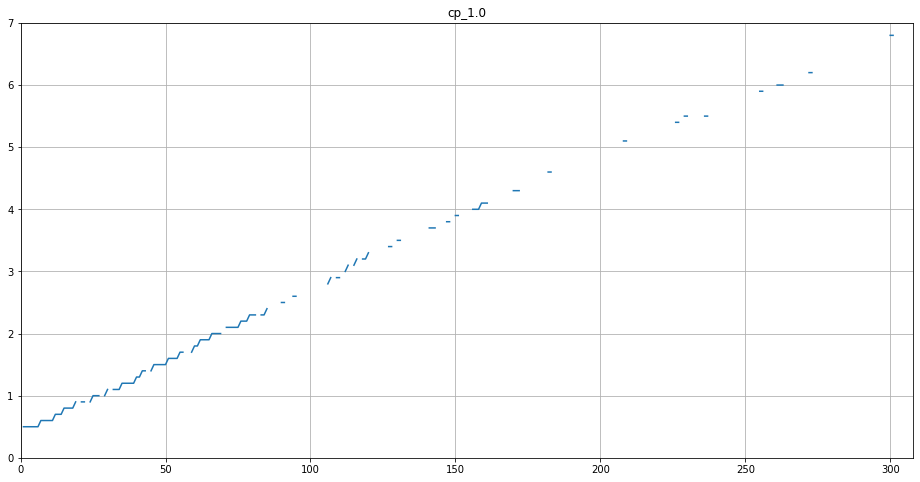

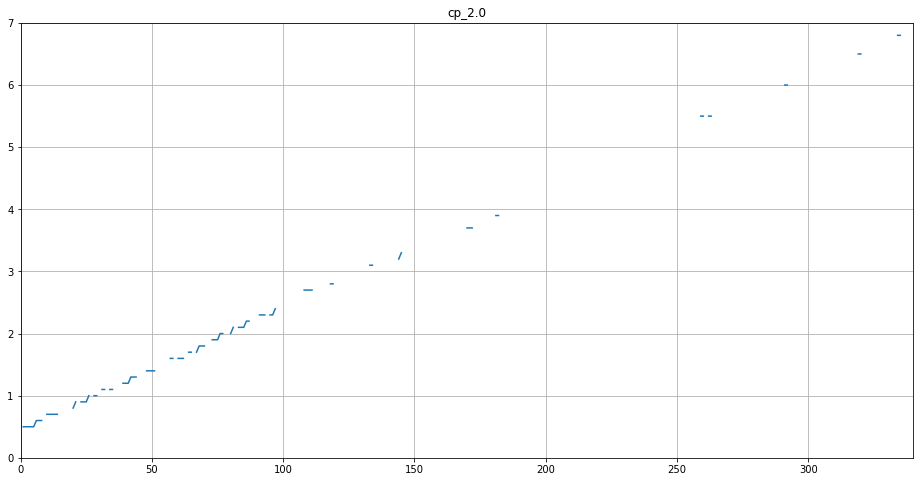

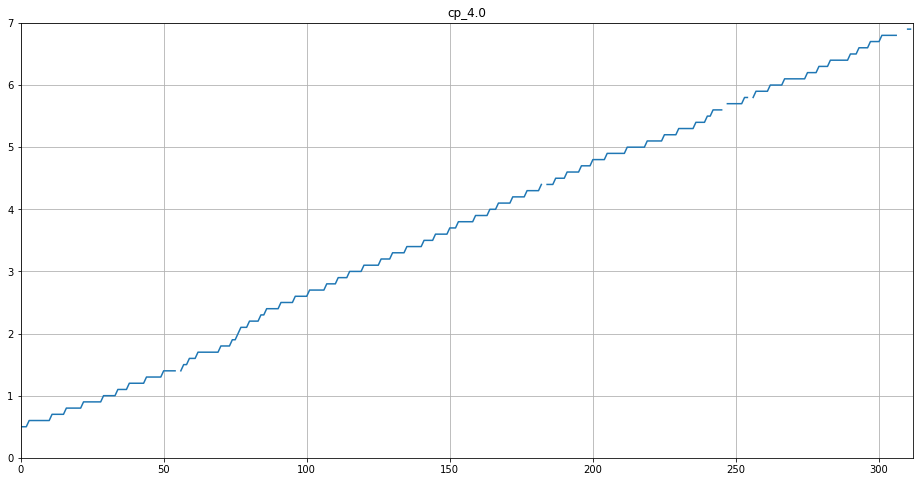

...

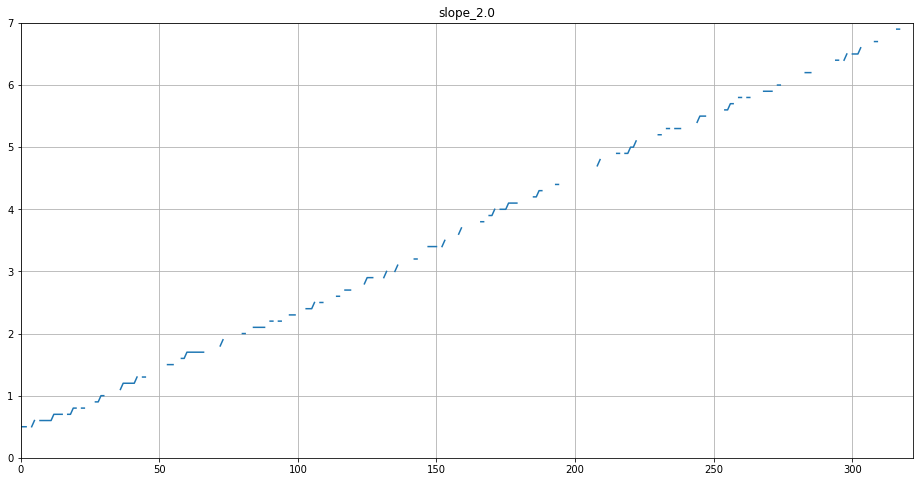

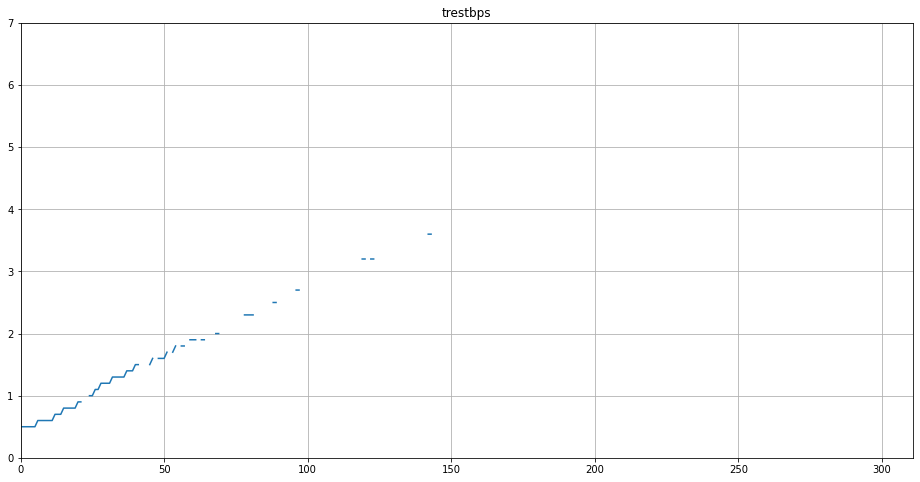

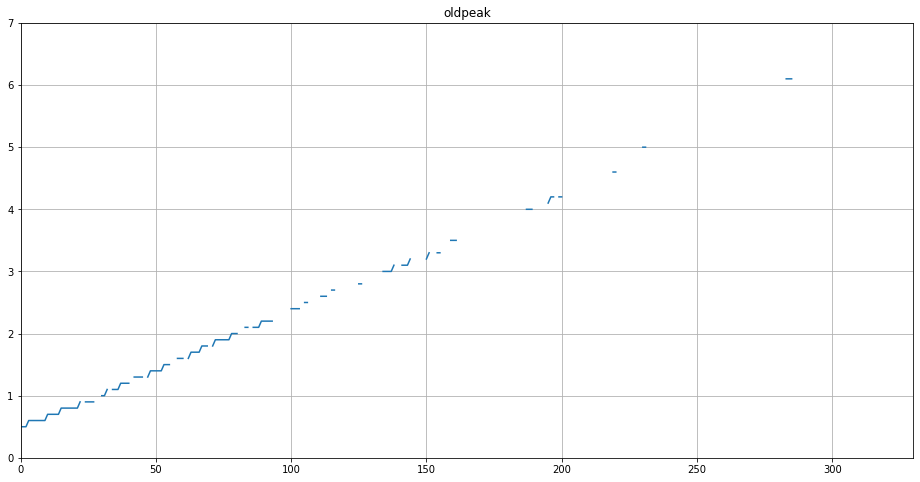

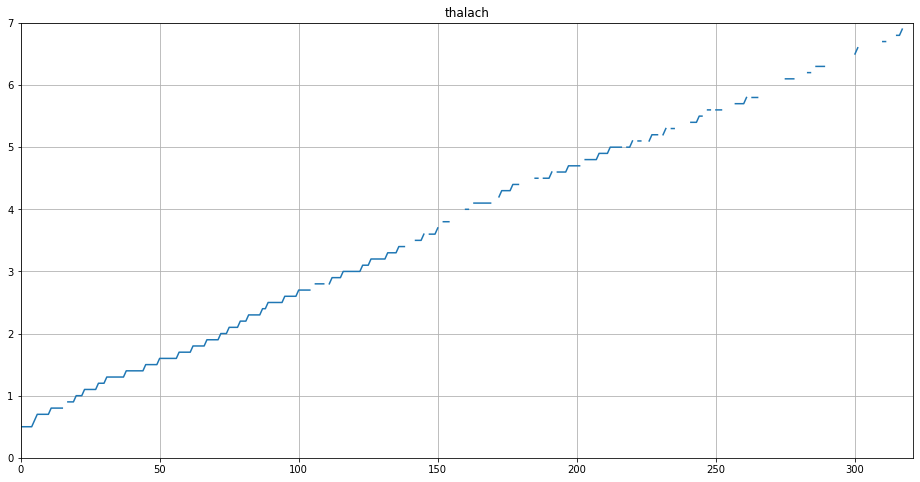

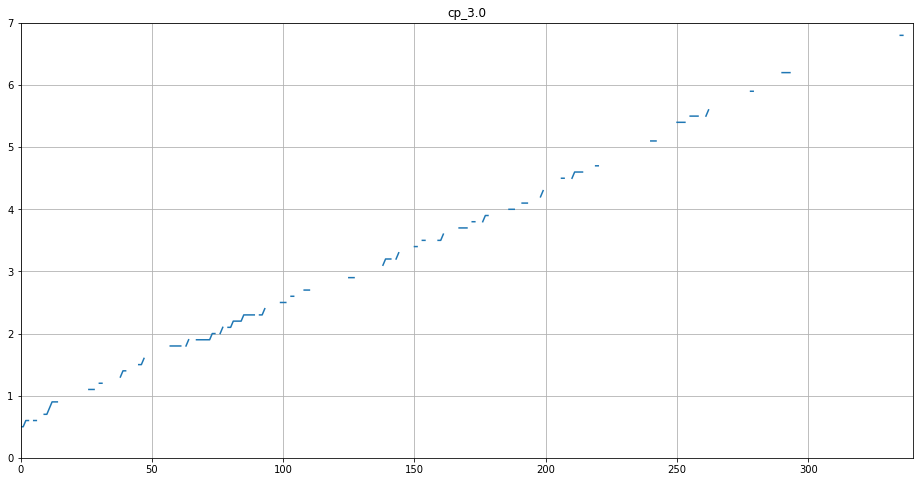

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

we'll take cp_4.0

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['sex','cp_4.0']
    features = [feature for feature in model1_group.columns.drop(['sex','cp_4.0']) if random.random() > 0.5]
    abc = features + features_premade
    temp = hard_function(tau = tau, X = model1_group[abc], y=model1_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

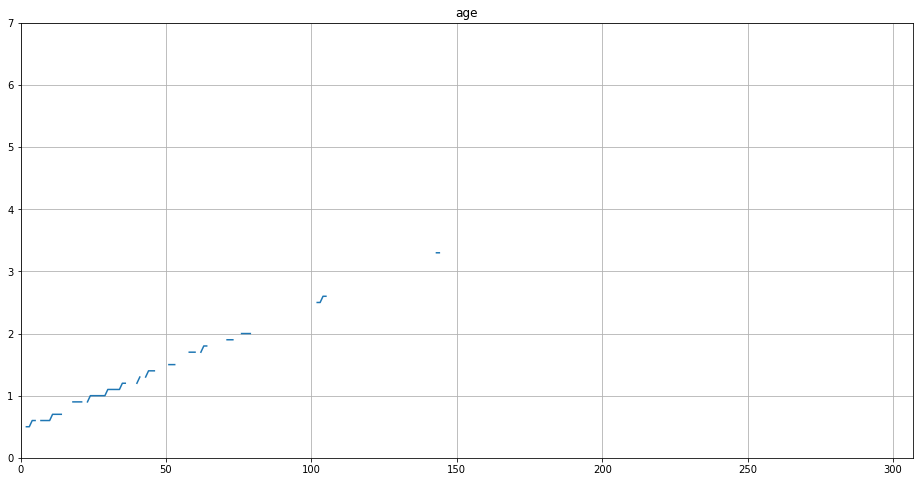

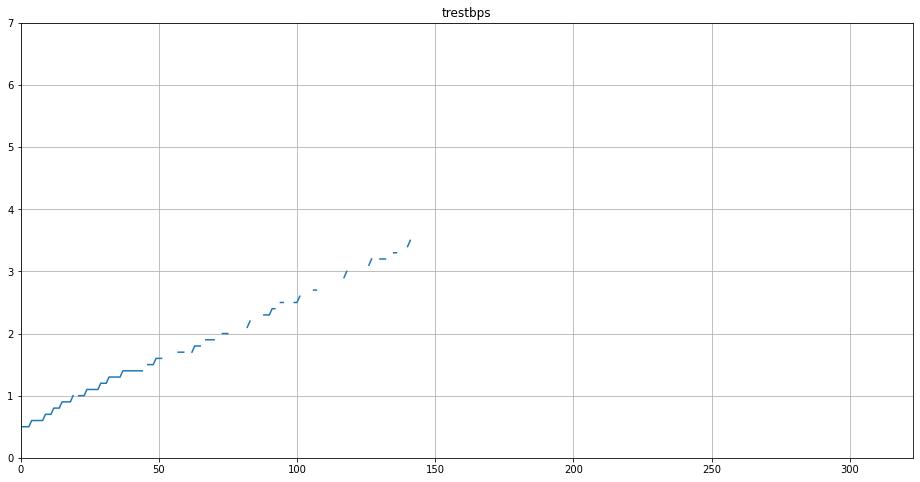

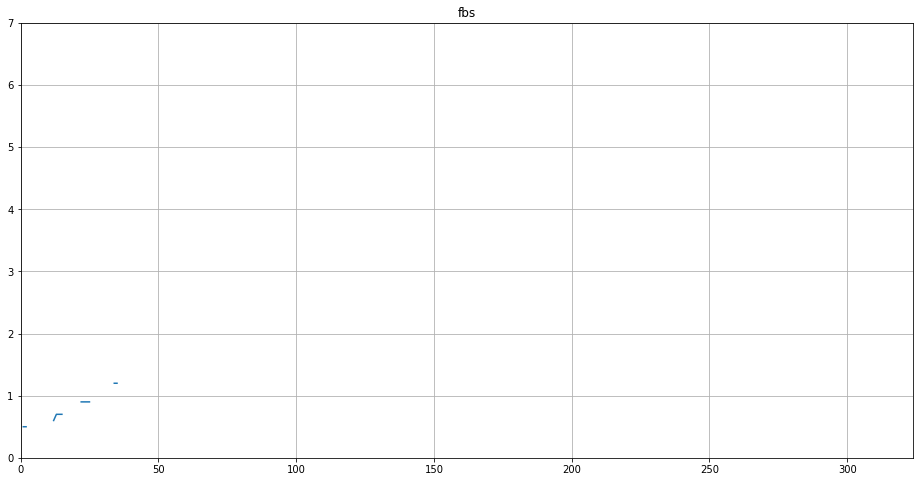

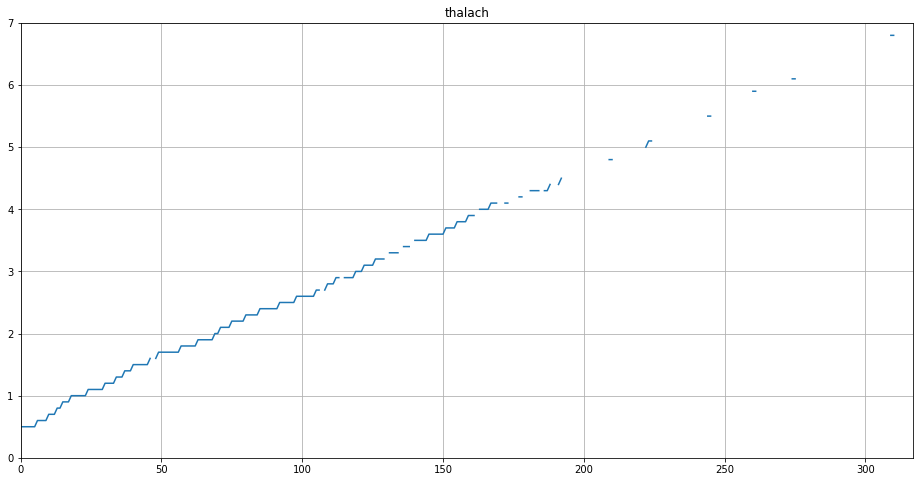

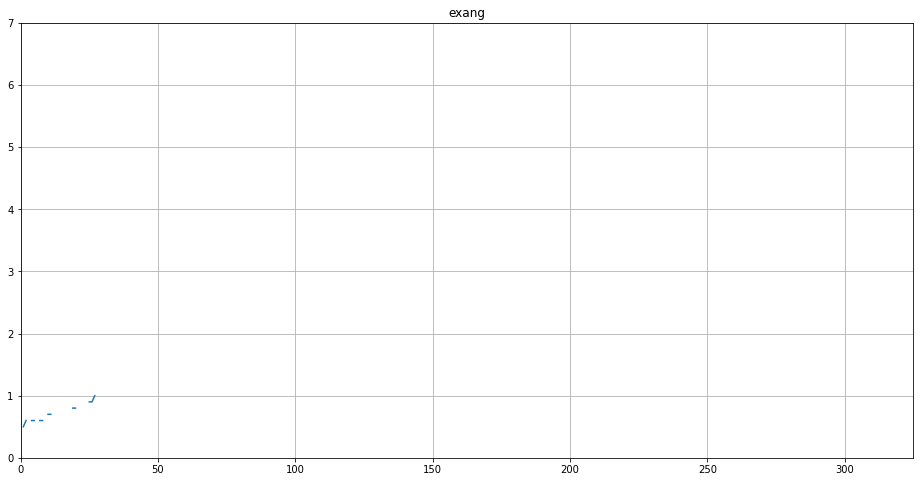

...

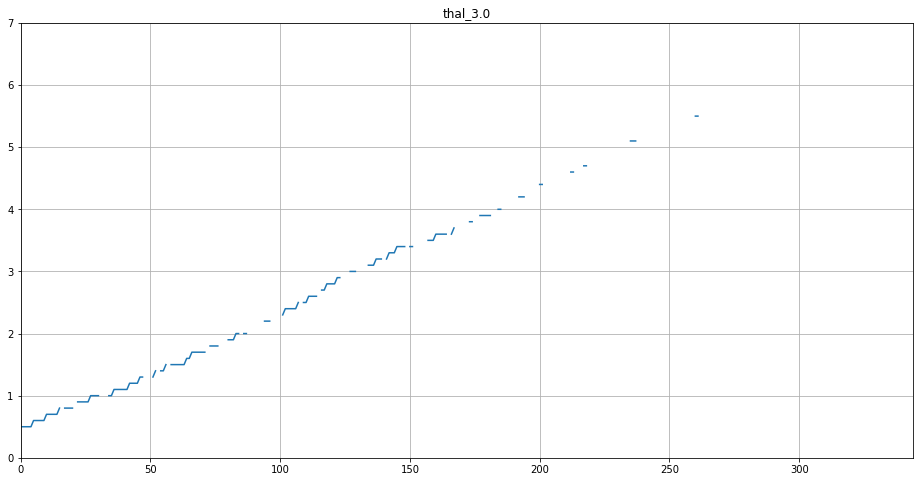

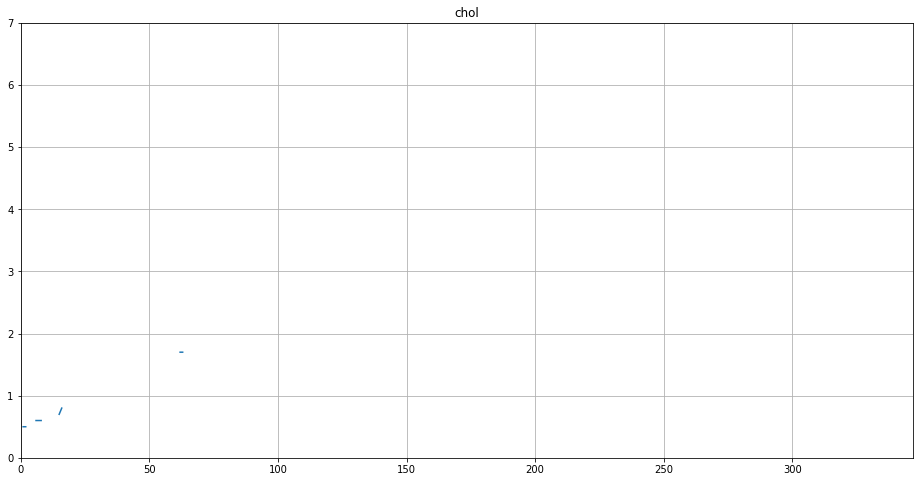

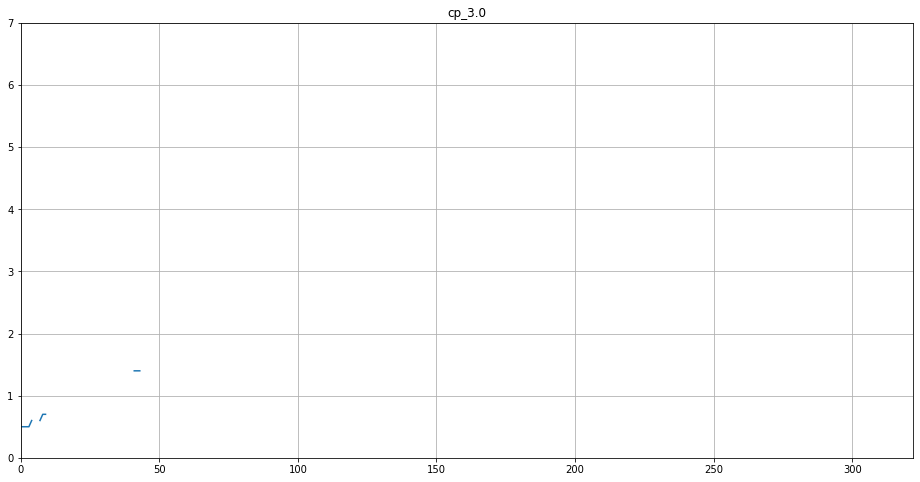

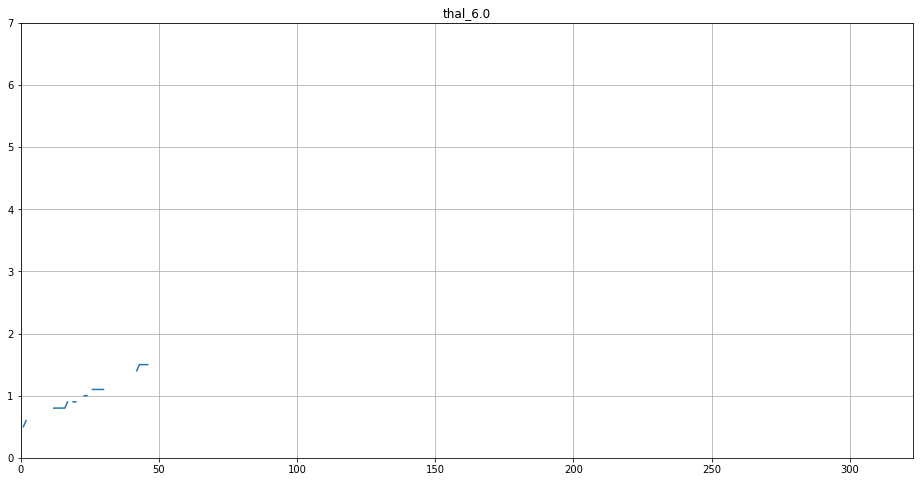

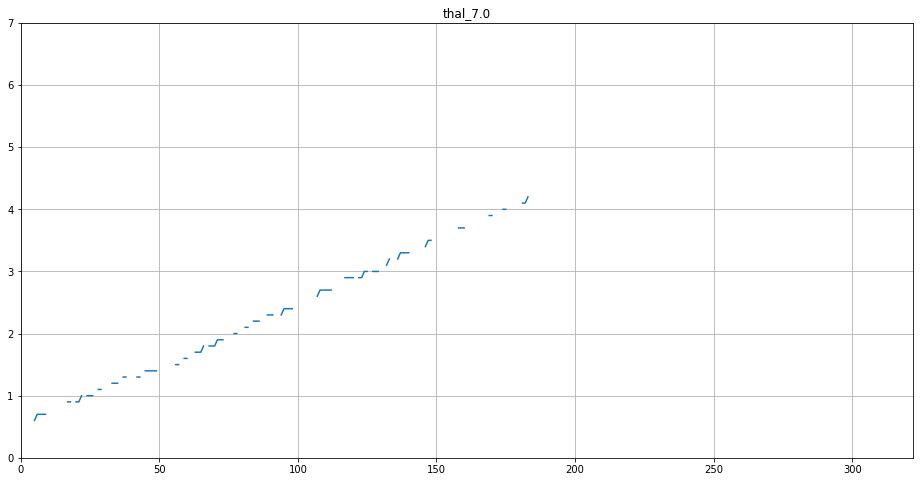

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

we'll take ca_0.0

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['sex','cp_4.0','ca_0.0']
    features = [feature for feature in model1_group.columns.drop(['sex','cp_4.0','ca_0.0']) if random.random() > 0.5]
    abc = features + features_premade
    temp = hard_function(tau = tau, X = model1_group[abc], y=model1_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

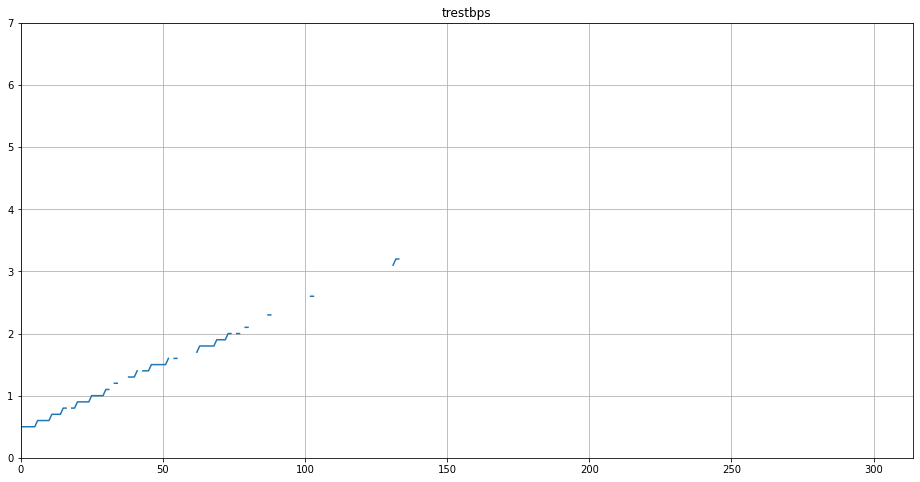

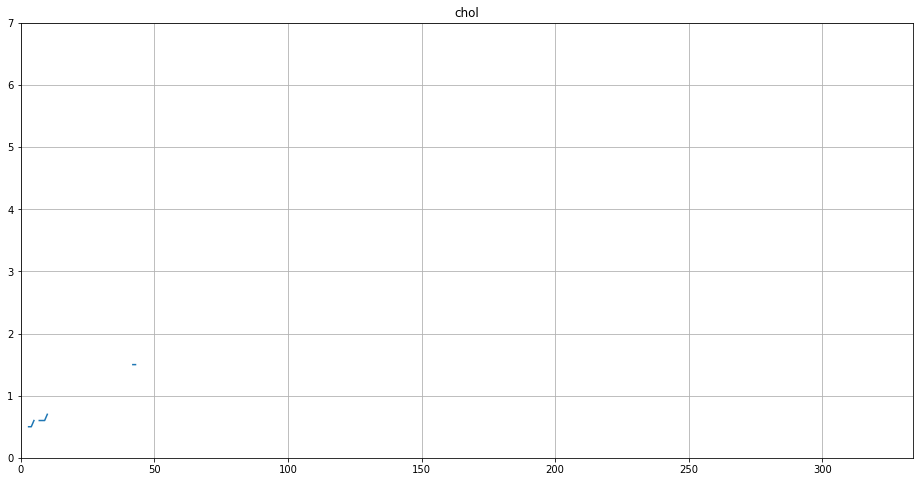

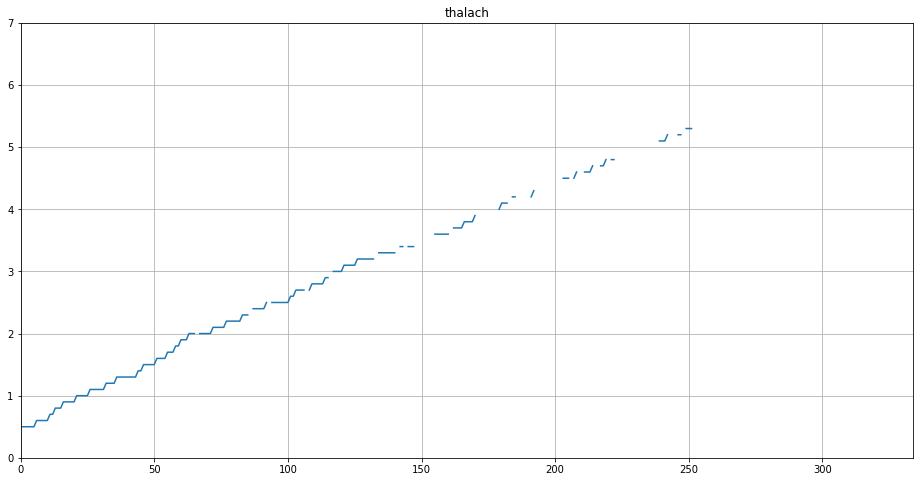

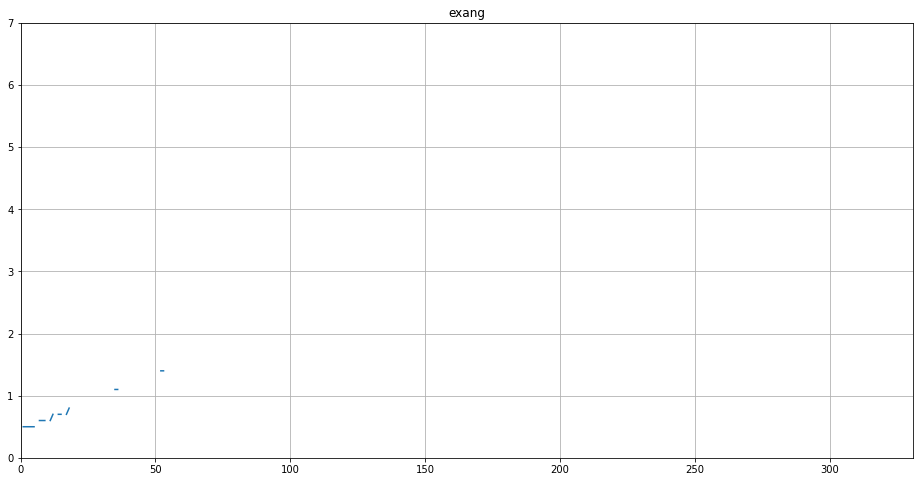

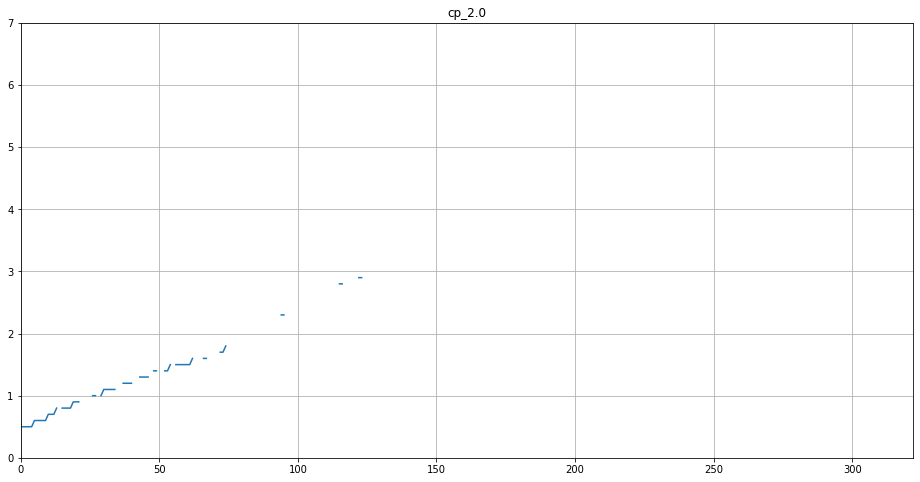

...

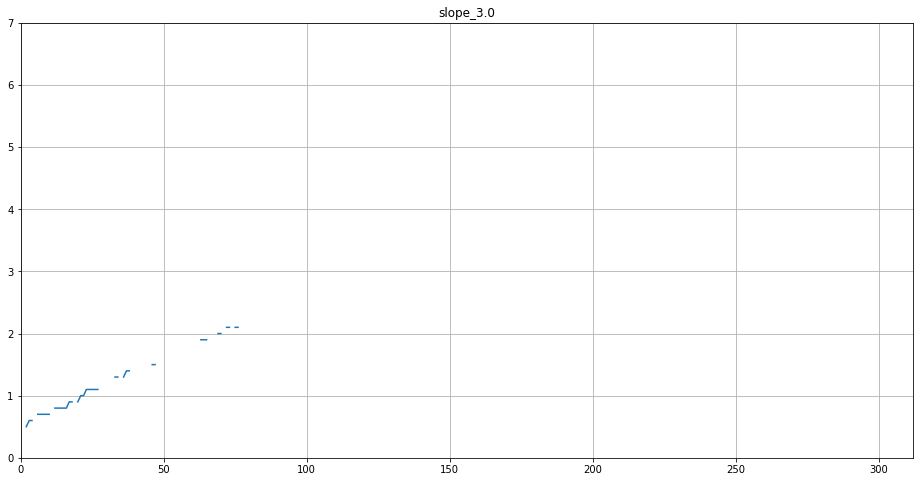

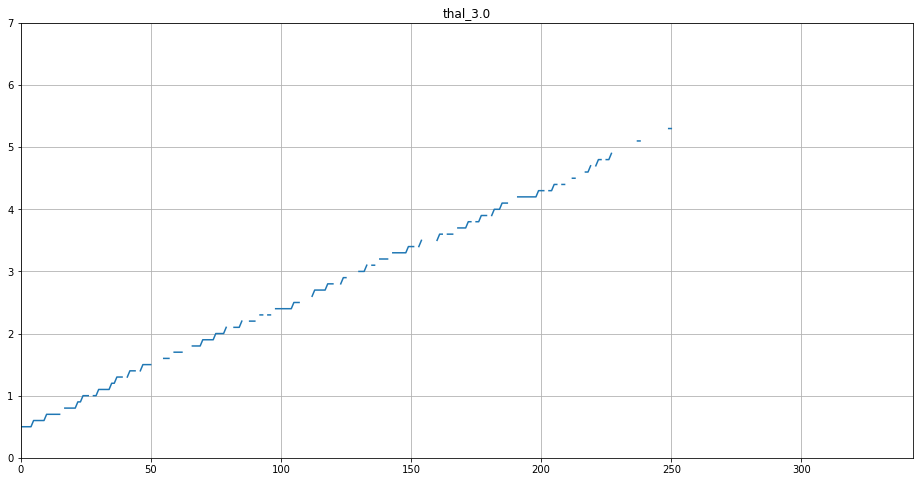

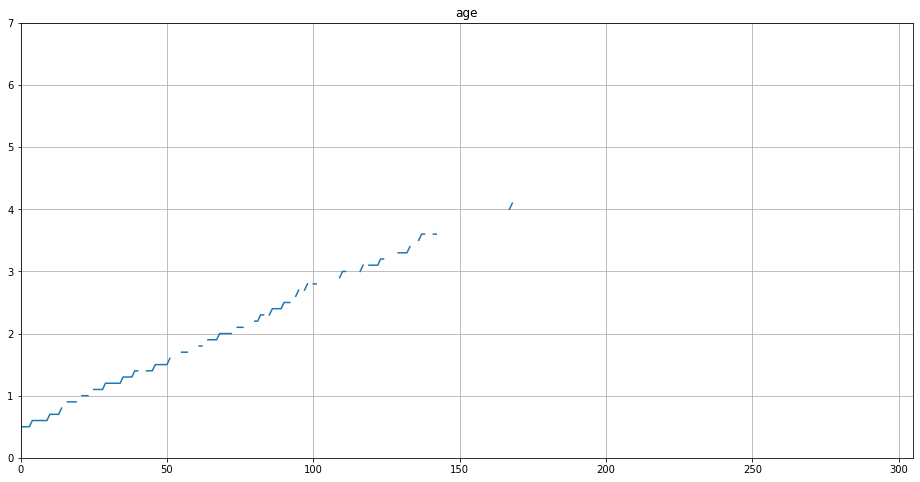

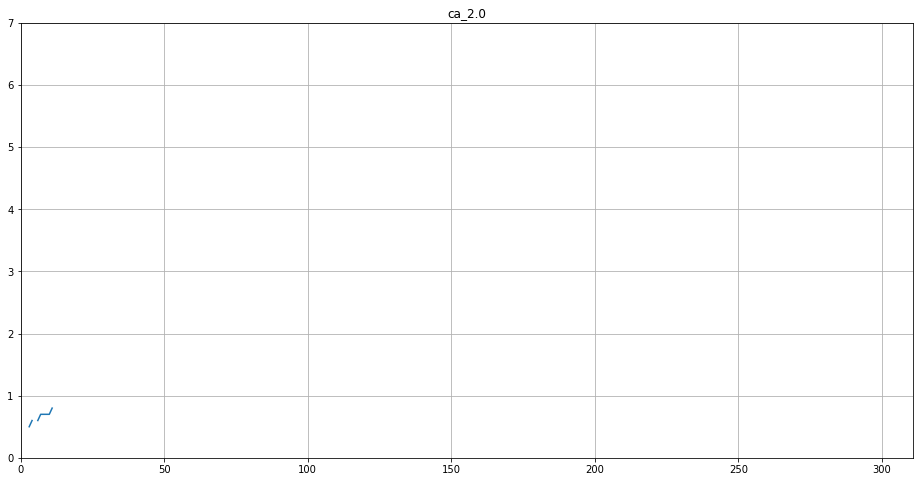

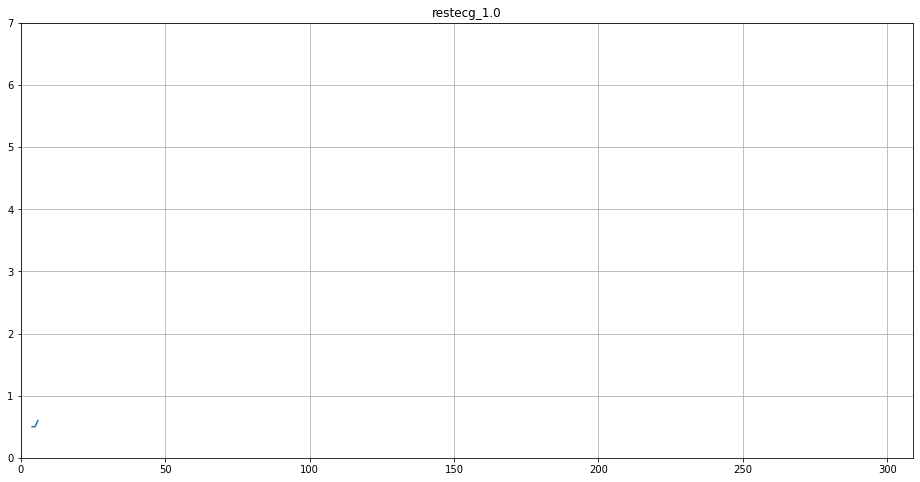

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

we'll take slope_1.0

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['sex','cp_4.0','ca_0.0','slope_1.0']
    features = [feature for feature in model1_group.columns.drop(['sex','cp_4.0','ca_0.0','slope_1.0']) if random.random() > 0.5]
    abc = features + features_premade
    temp = hard_function(tau = tau, X = model1_group[abc], y=model1_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

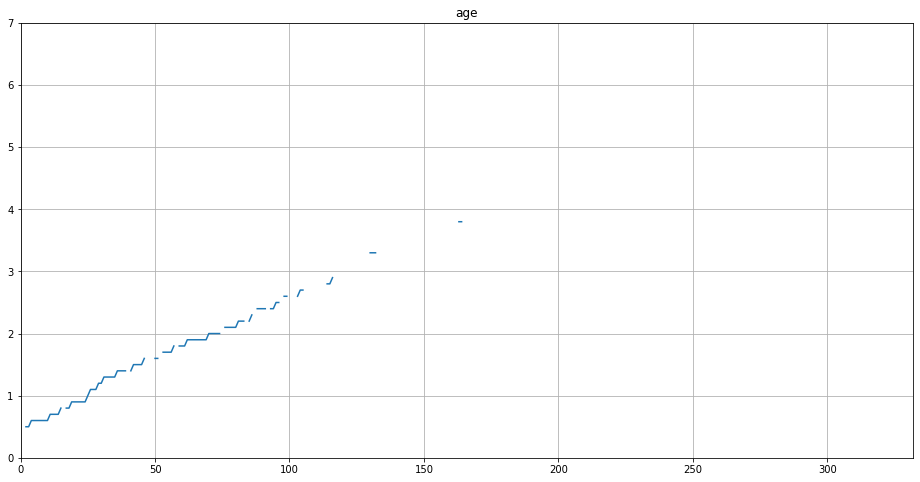

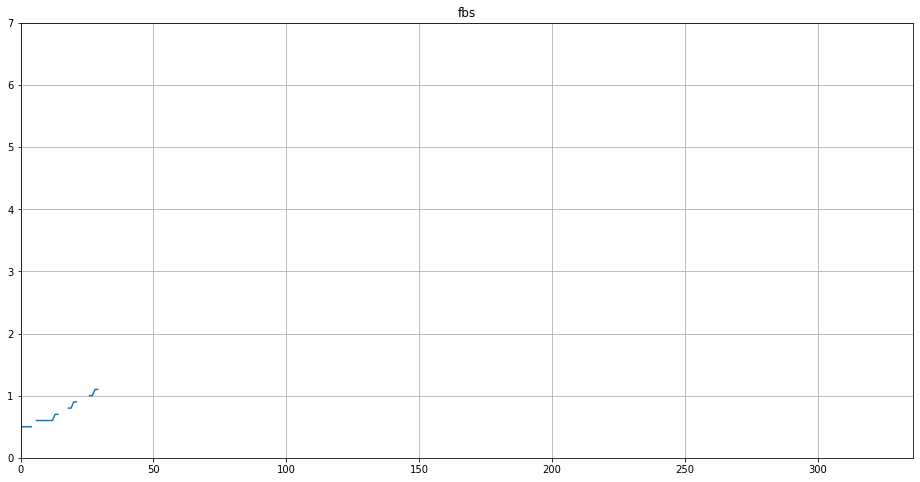

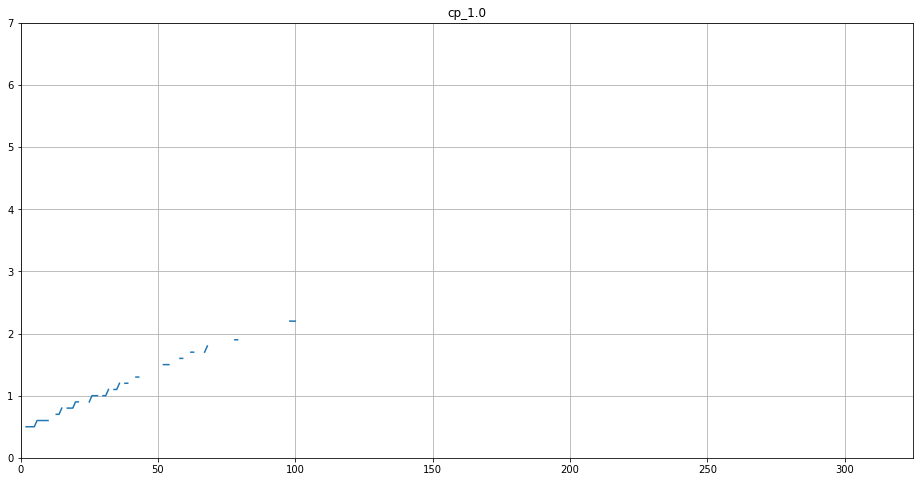

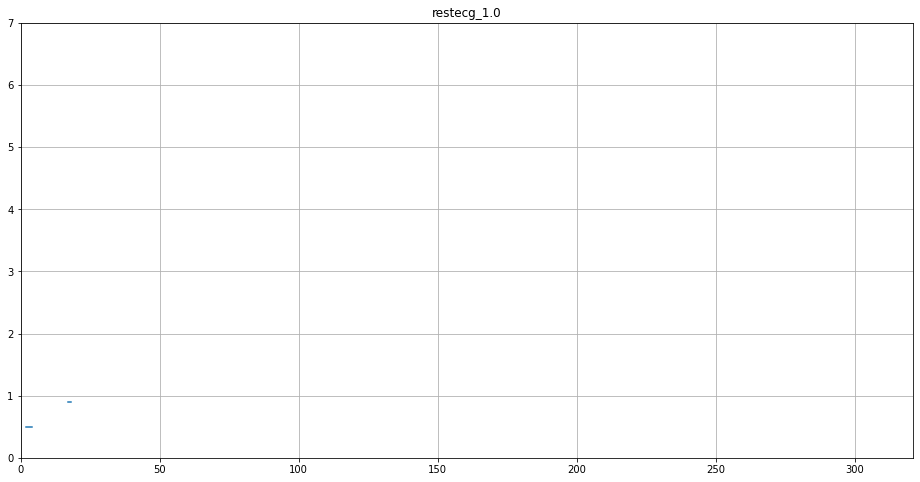

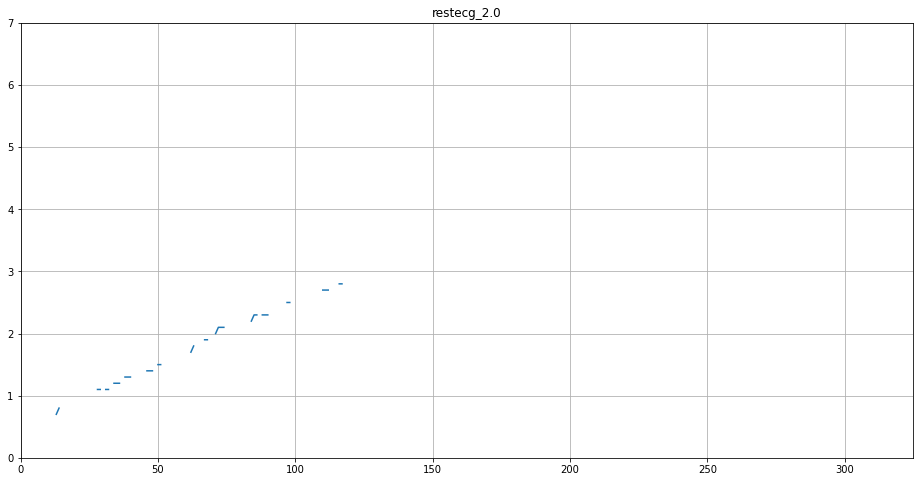

...

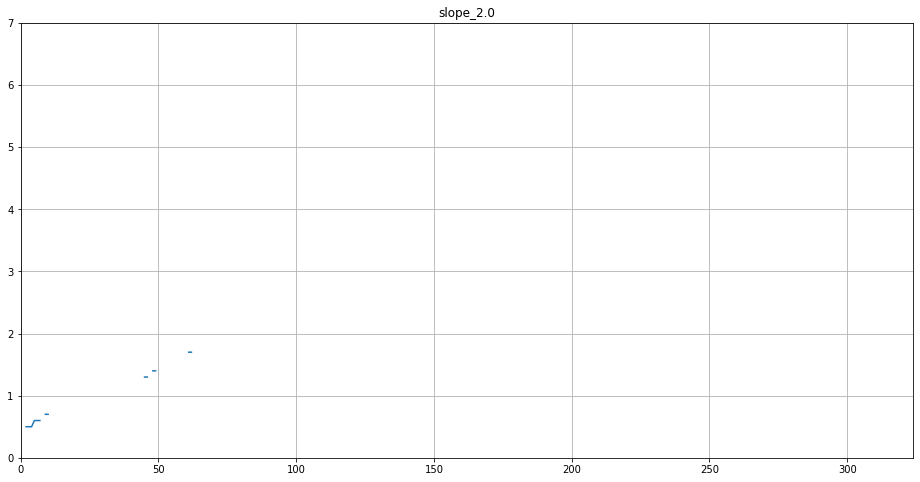

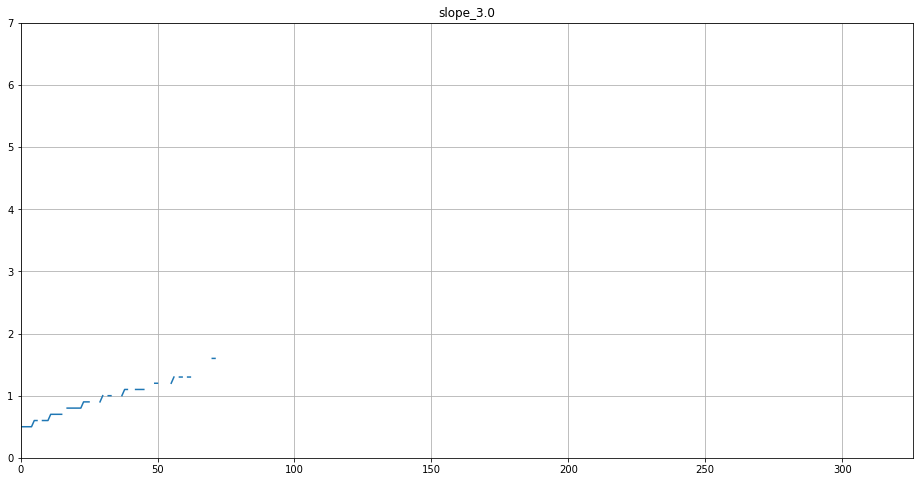

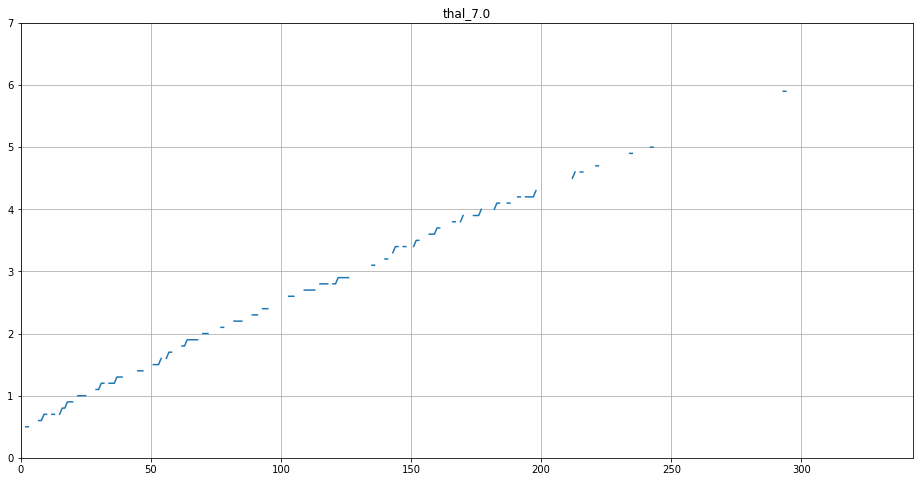

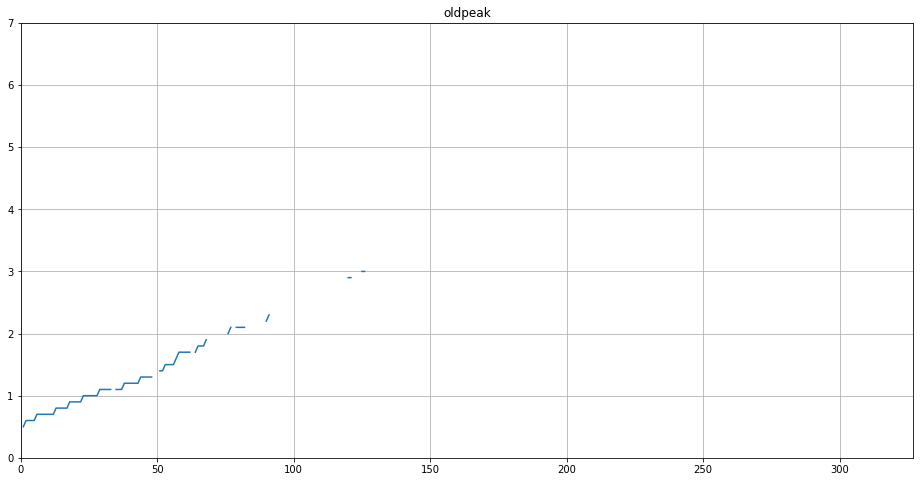

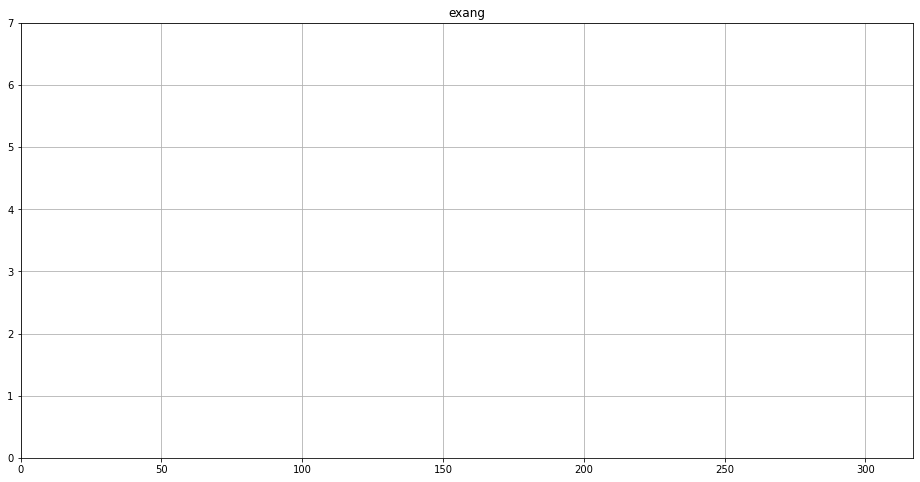

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

Everything else is not that good.

The best is thal_7.0 or thal_3.0. Let's take thal_3.0.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['sex','cp_4.0','ca_0.0','slope_1.0','thal_3.0']
    features = [feature for feature in model1_group.columns.drop(['sex','cp_4.0','ca_0.0','slope_1.0','thal_3.0']) if random.random() > 0.5]
    abc = features + features_premade
    temp = hard_function(tau = tau, X = model1_group[abc], y=model1_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

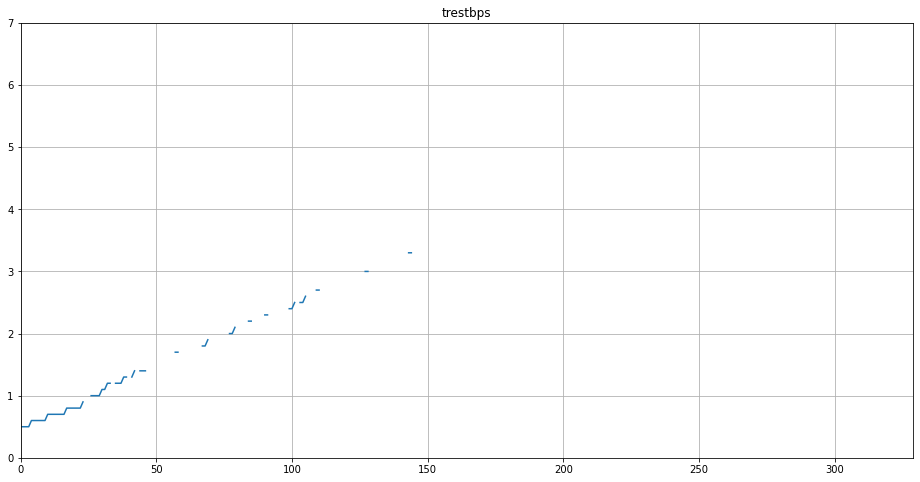

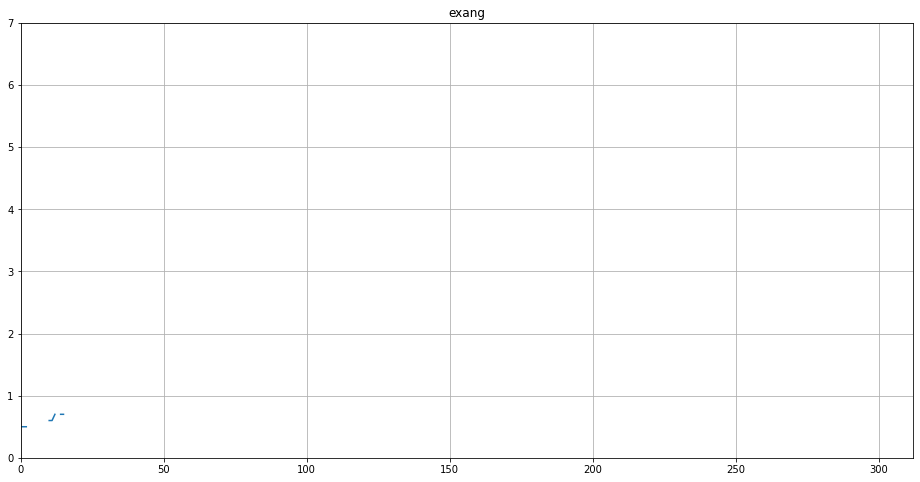

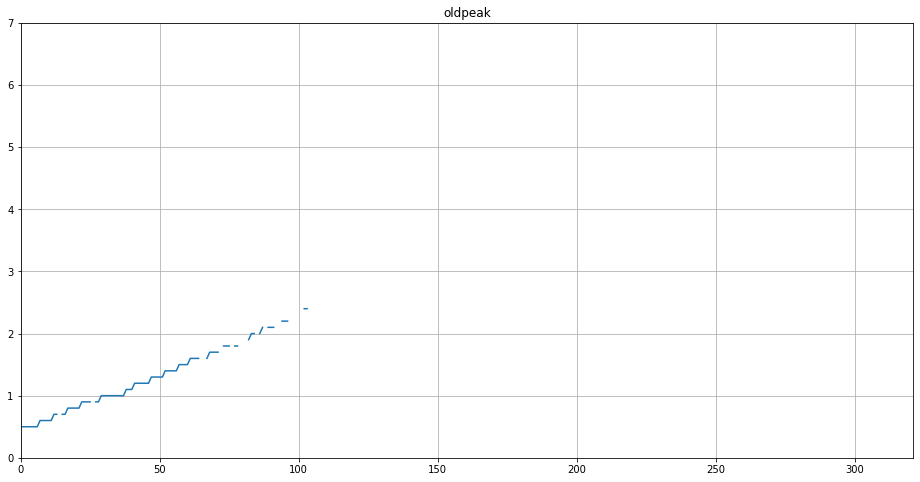

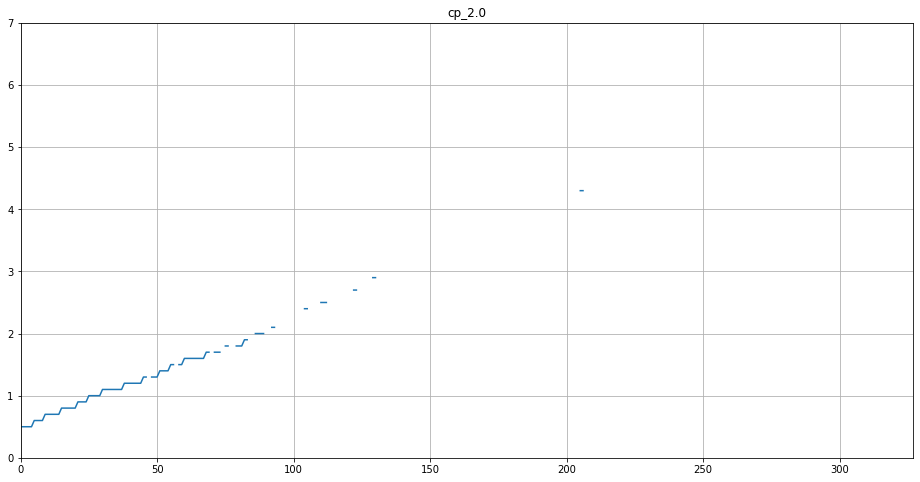

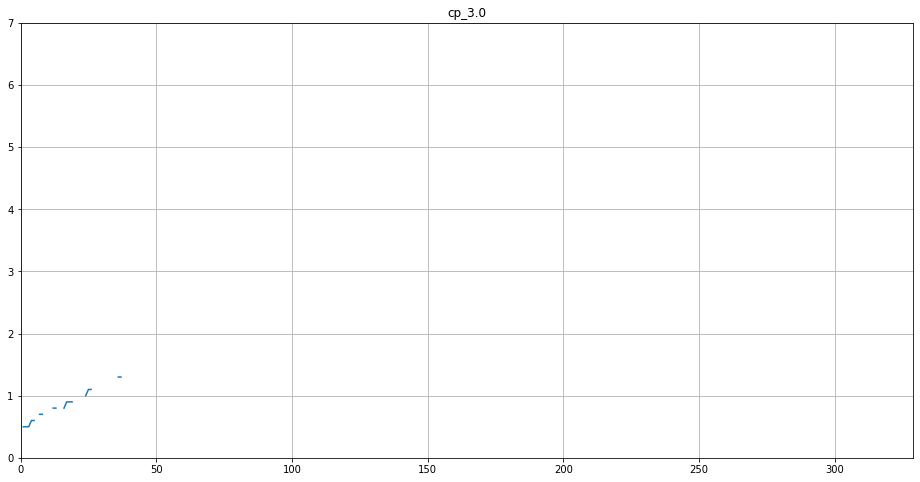

...

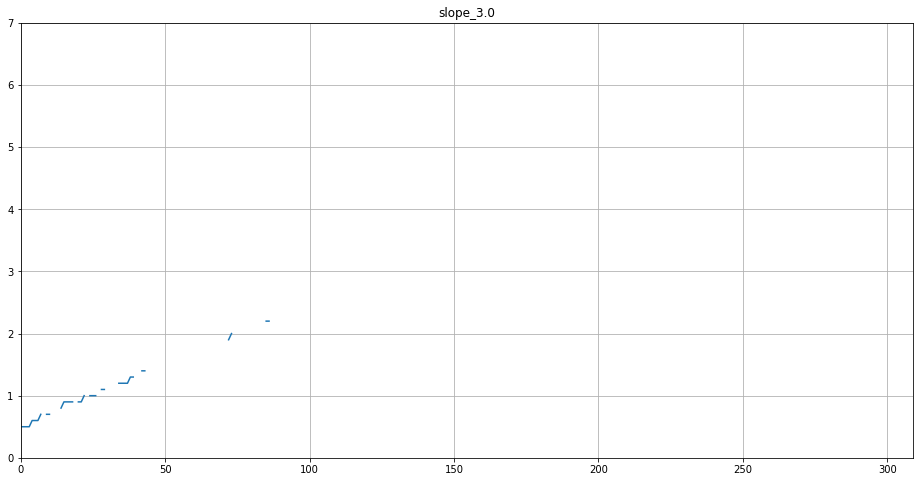

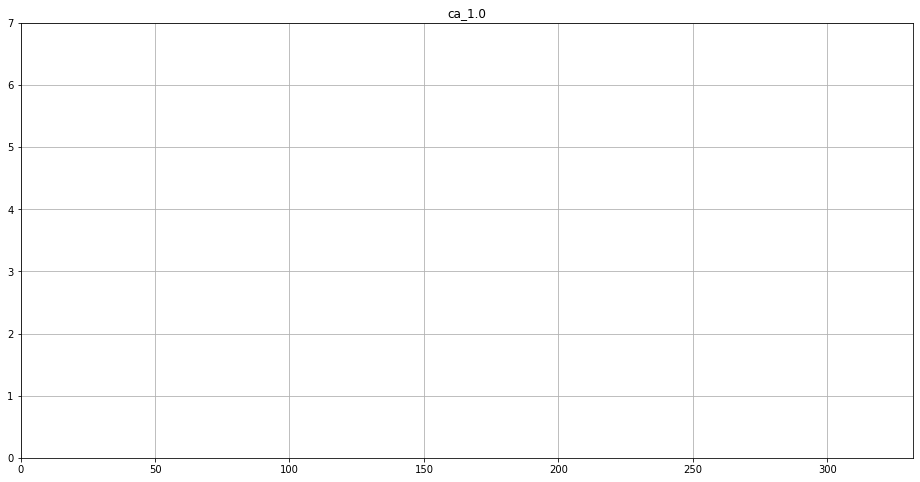

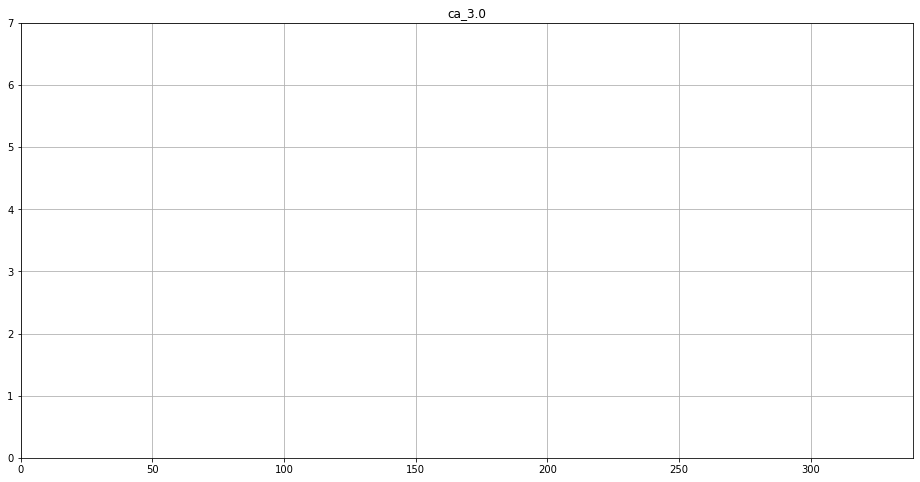

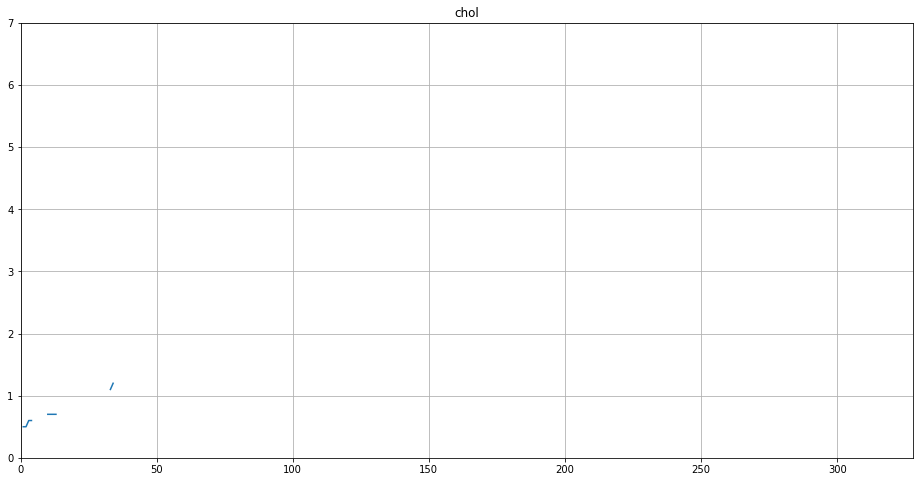

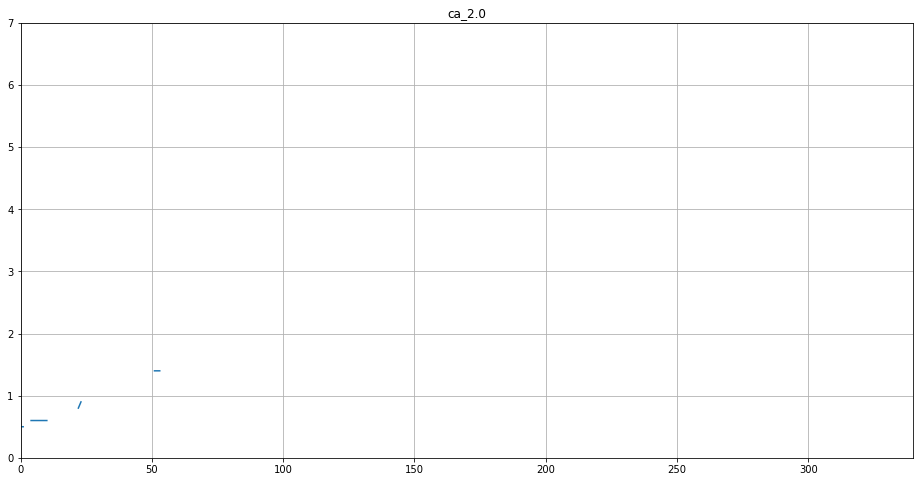

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

thalach goes to 3.5

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['sex','cp_4.0','ca_0.0','slope_1.0','thal_3.0','thalach']
    features = [feature for feature in model1_group.columns.drop(['sex','cp_4.0','ca_0.0','slope_1.0','thal_3.0','thalach']) if random.random() > 0.5]
    abc = features + features_premade
    temp = hard_function(tau = tau, X = model1_group[abc], y=model1_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

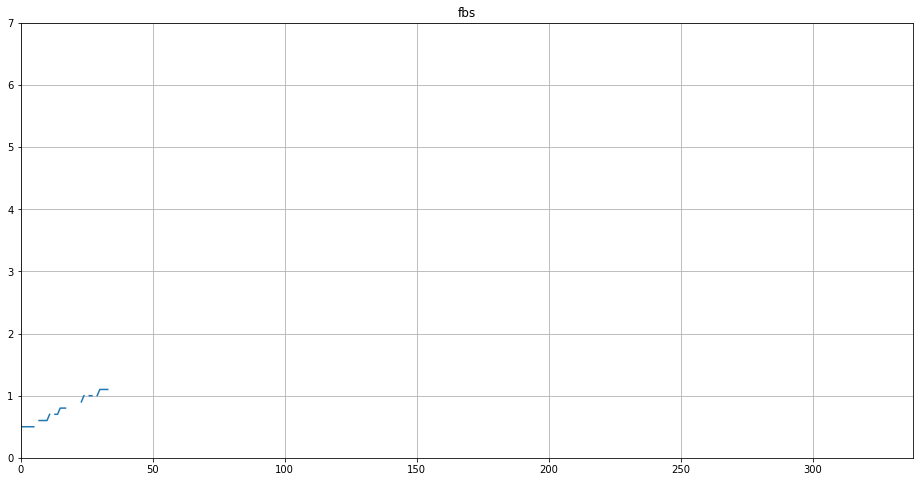

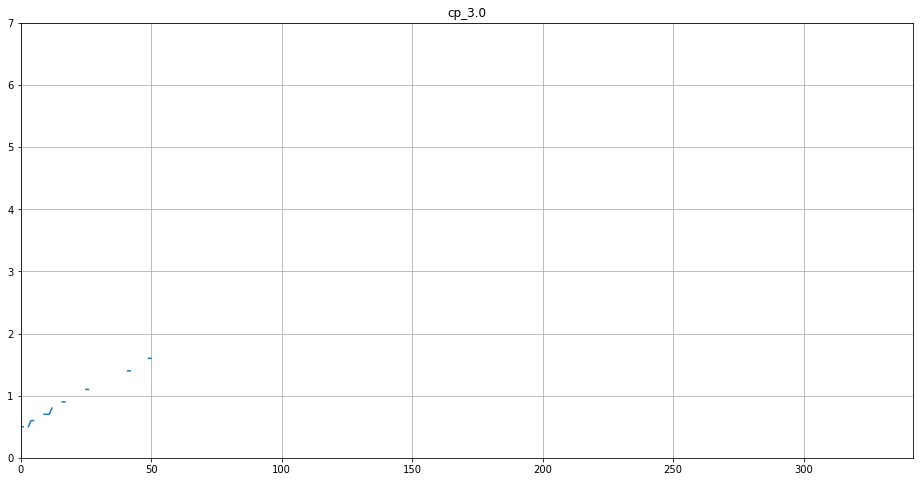

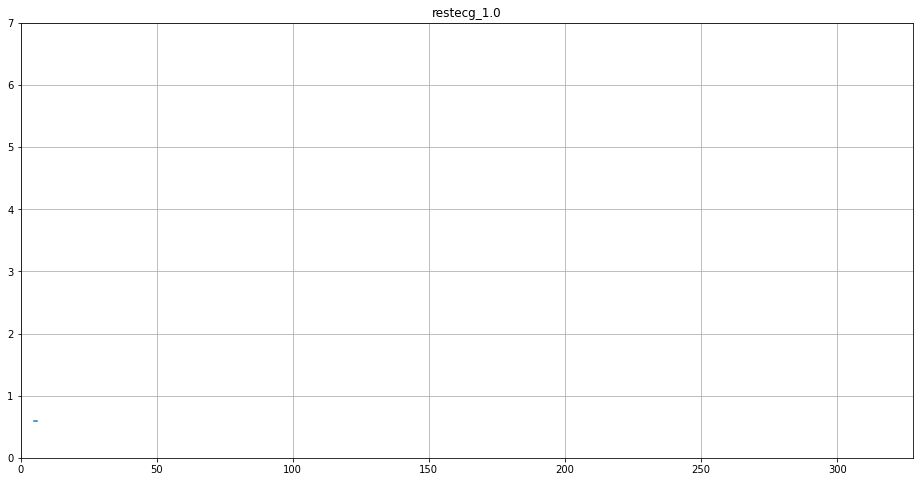

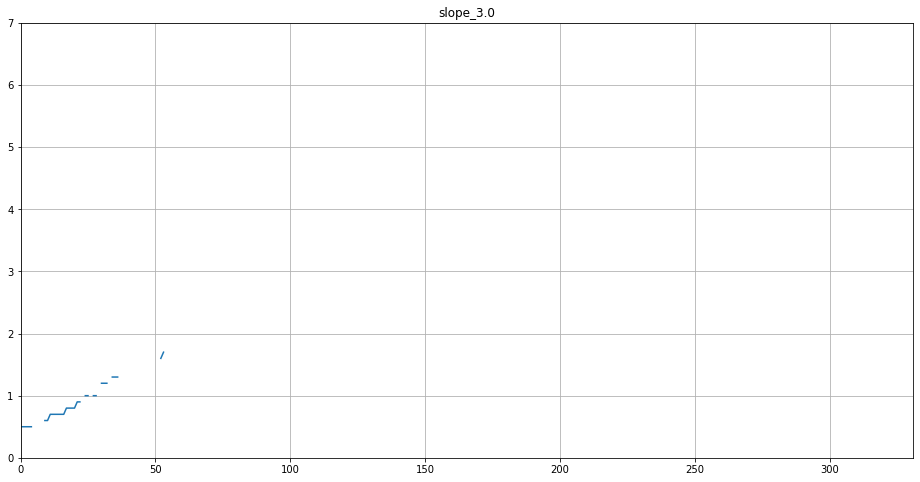

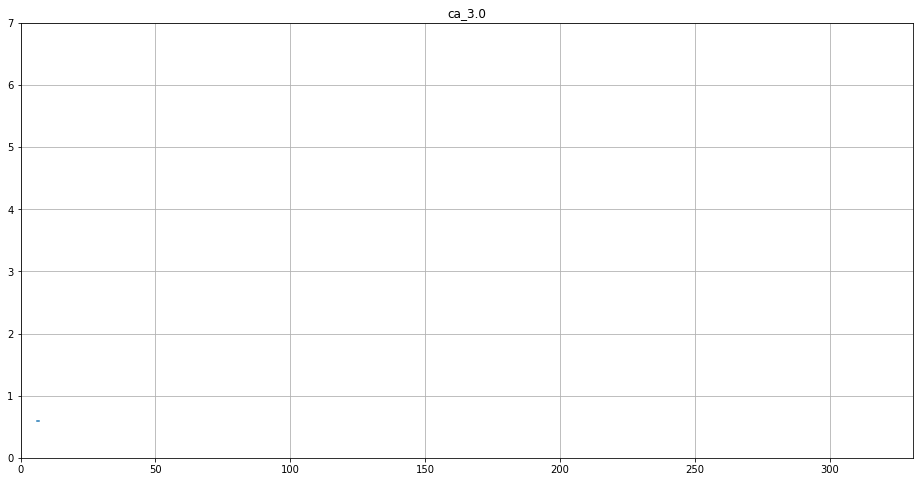

...

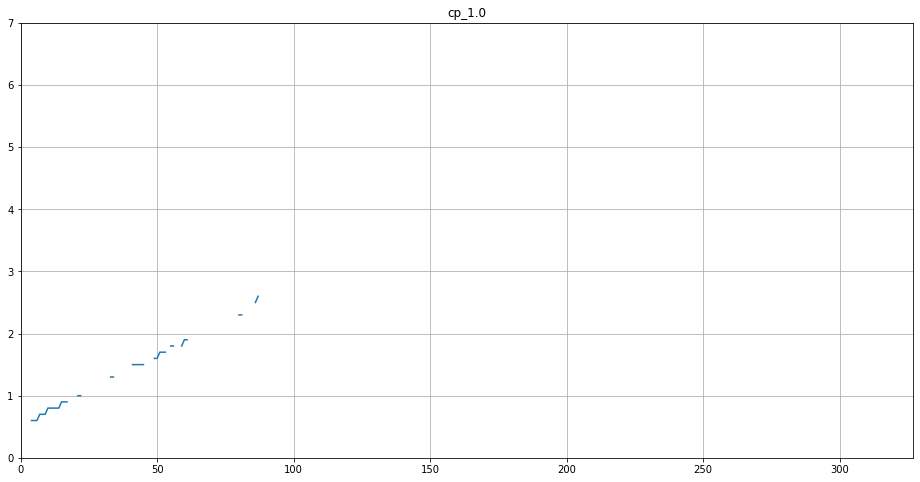

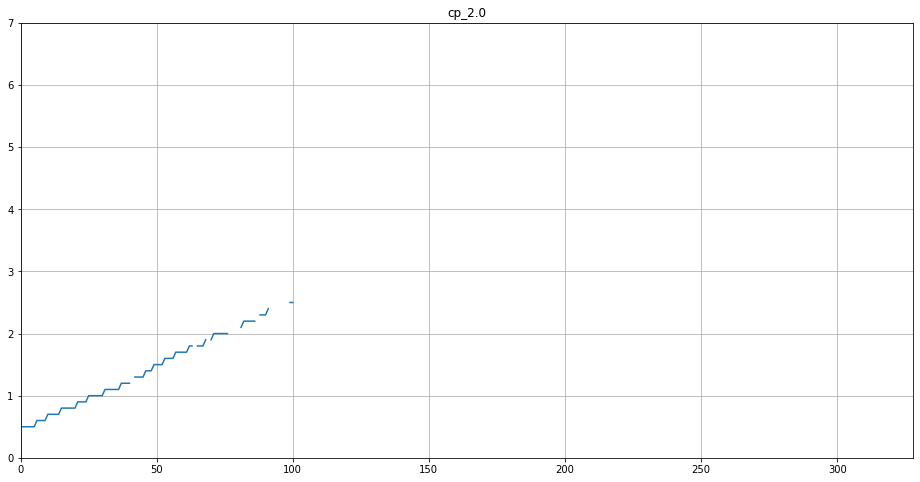

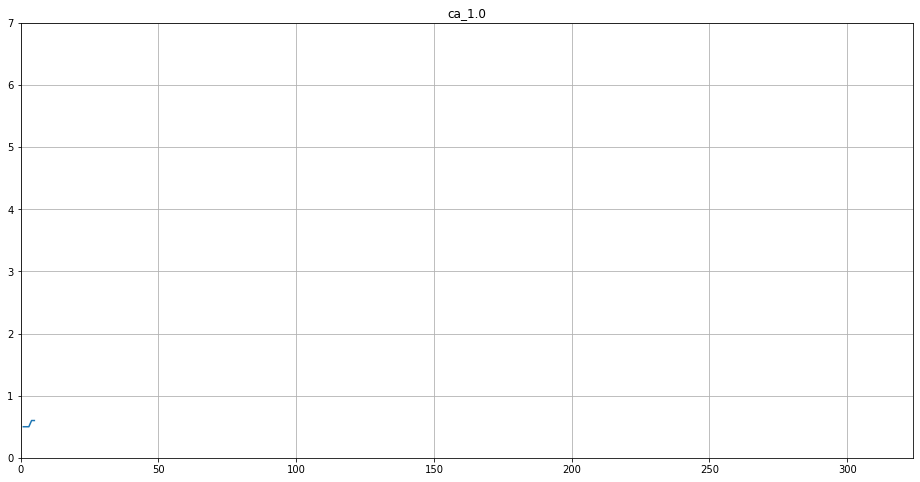

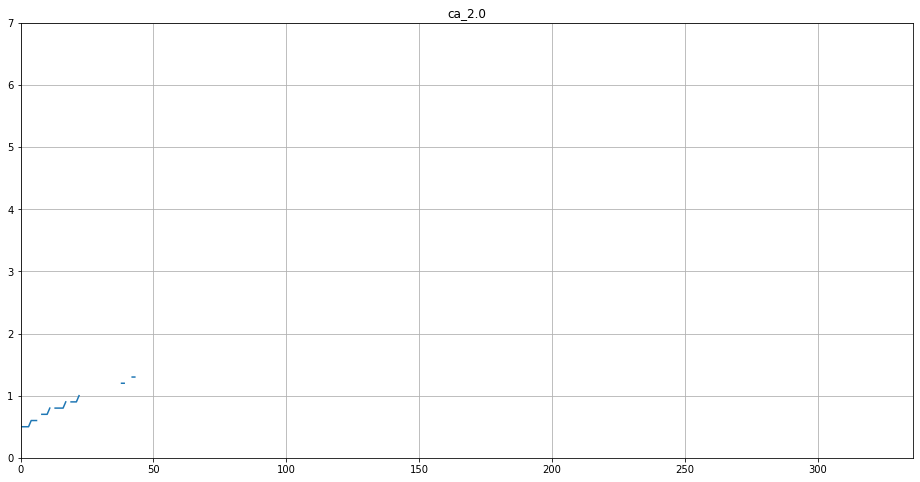

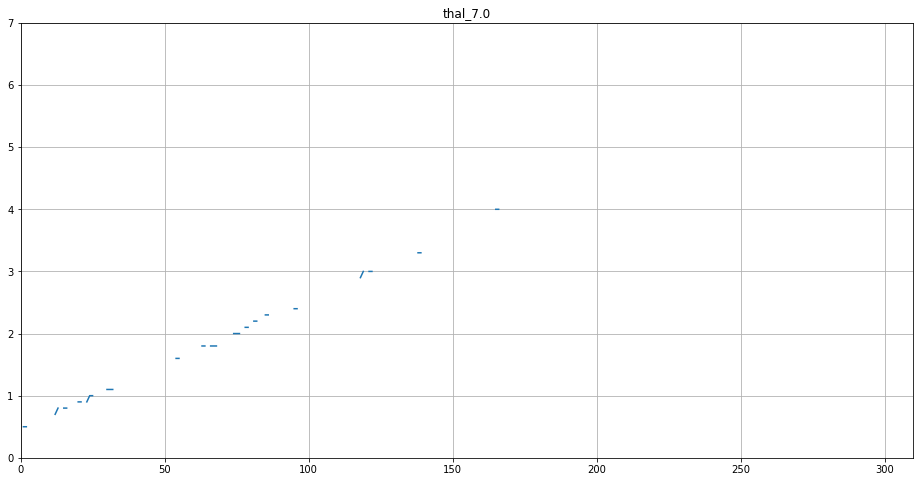

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

age goes over 3.5

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['sex','cp_4.0','ca_0.0','slope_1.0','thal_3.0','thalach','age']
    features = [feature for feature in model1_group.columns.drop(['sex','cp_4.0','ca_0.0','slope_1.0','thal_3.0','thalach','age']) if random.random() > 0.5]
    abc = features + features_premade
    temp = hard_function(tau = tau, X = model1_group[abc], y=model1_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

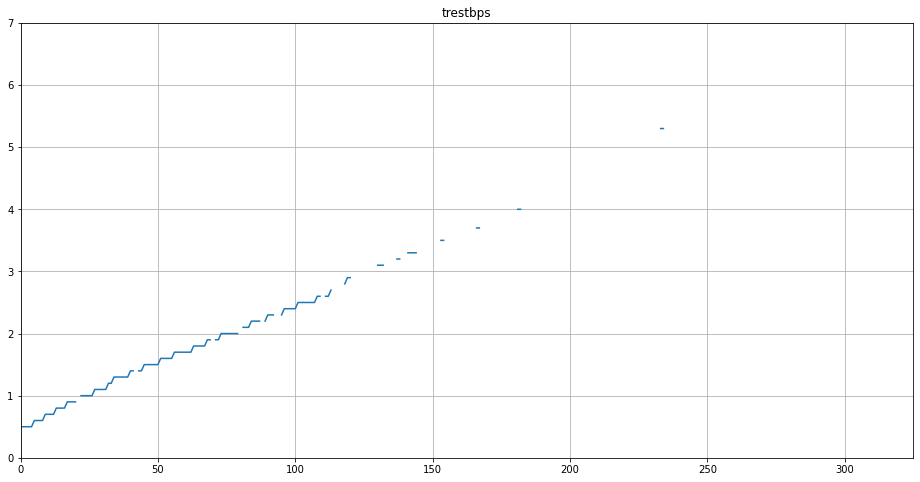

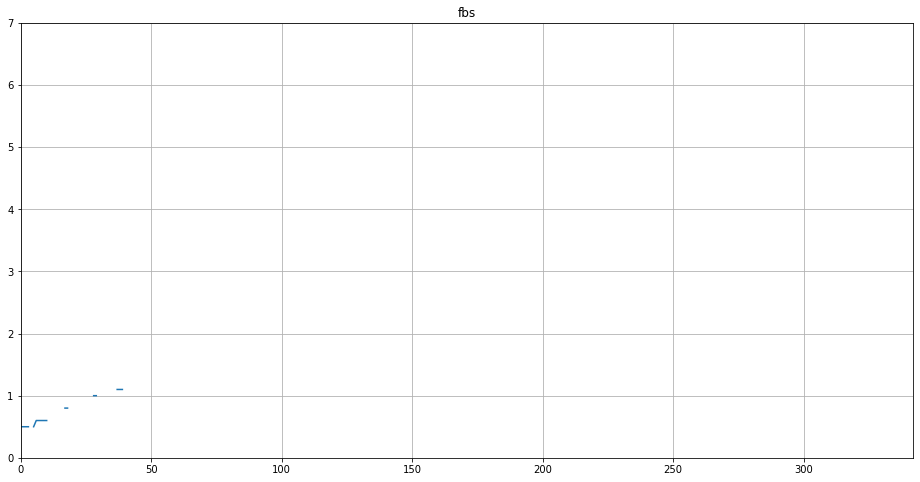

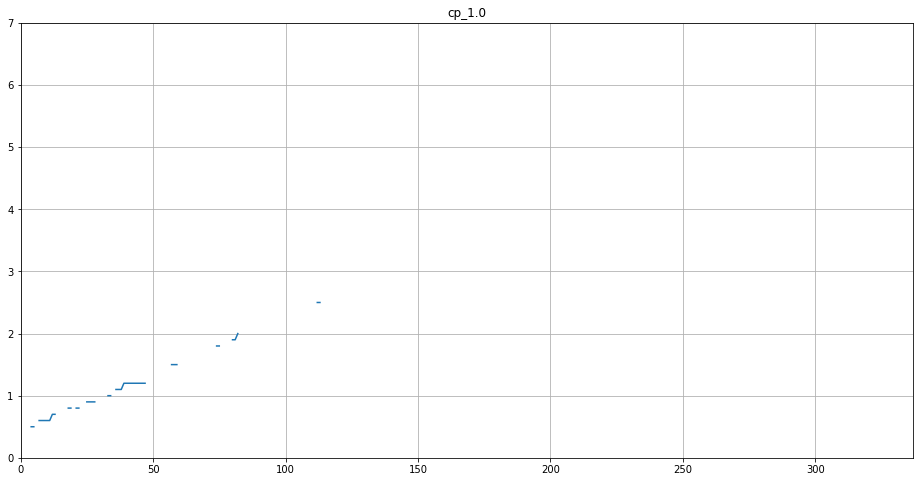

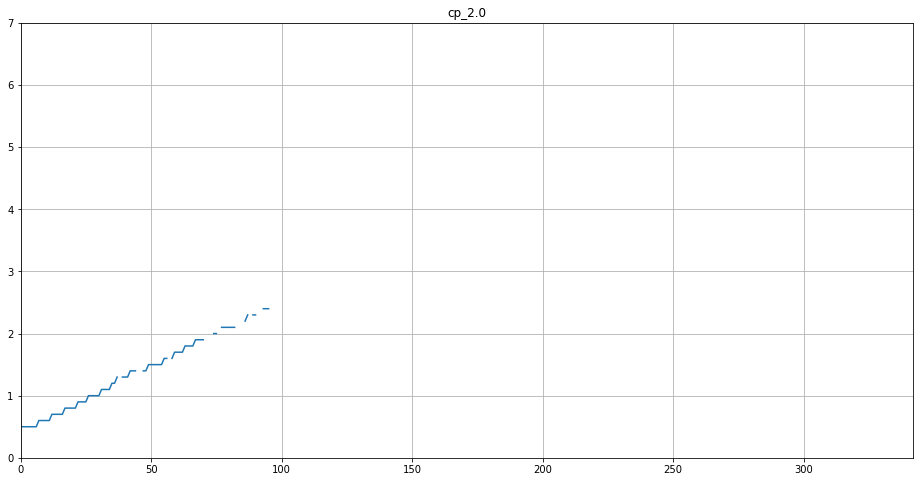

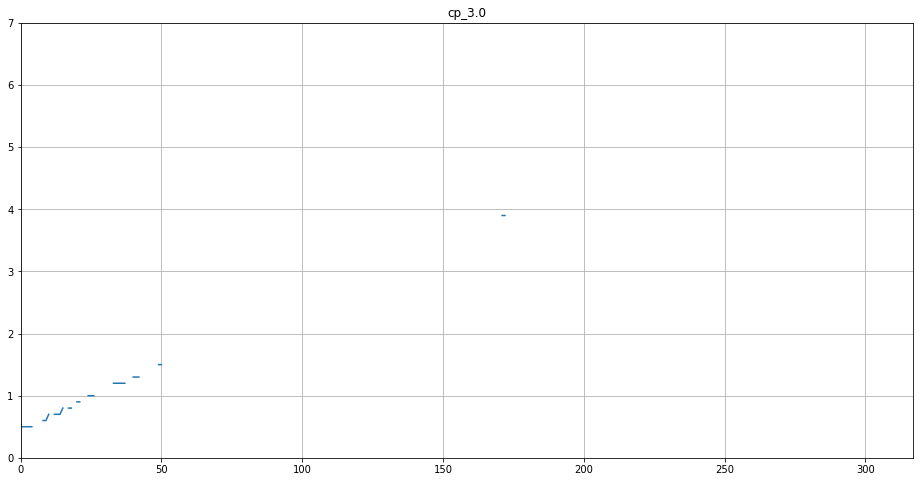

...

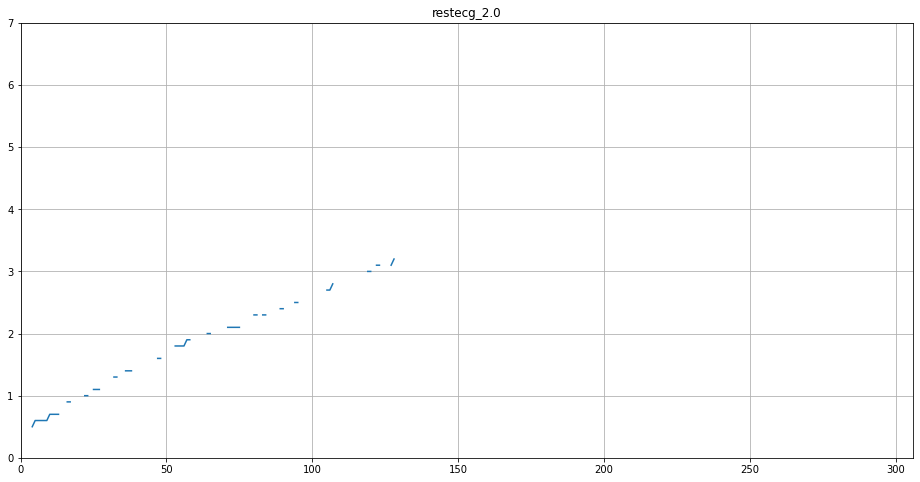

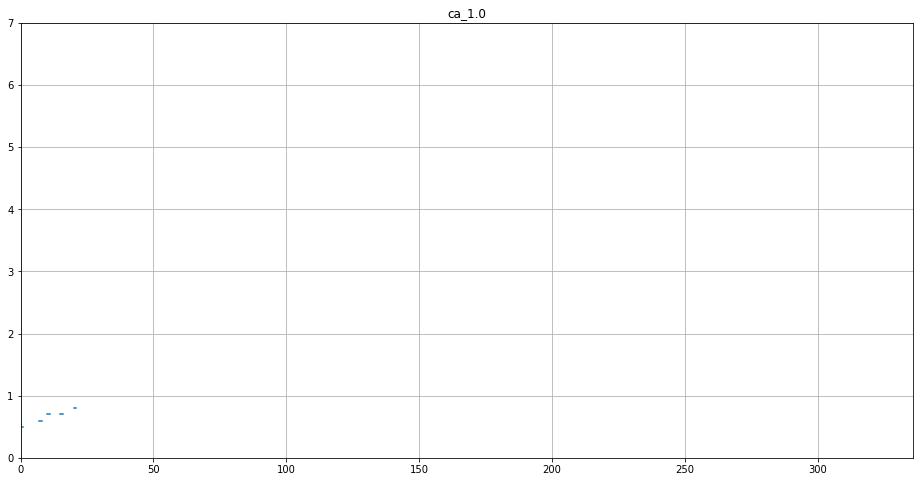

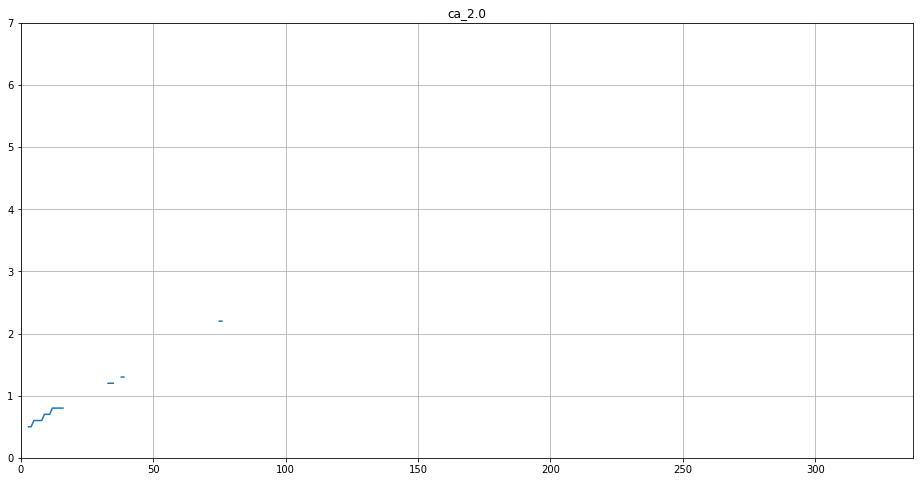

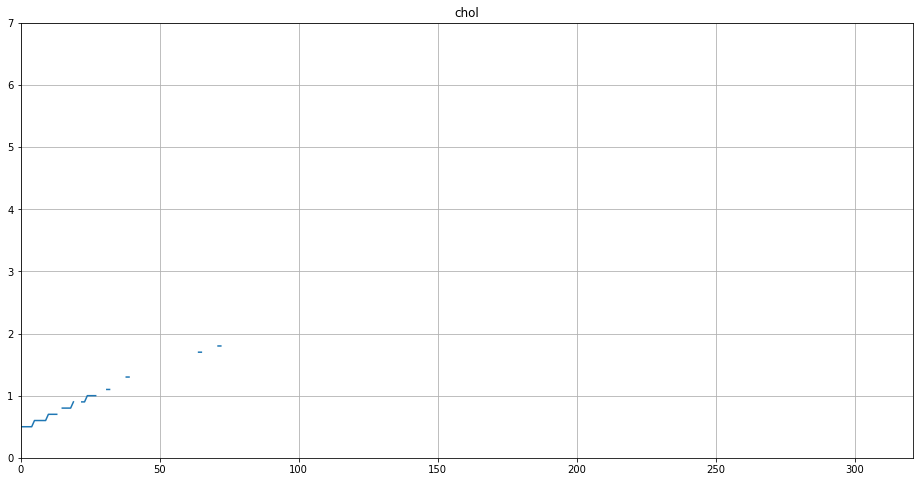

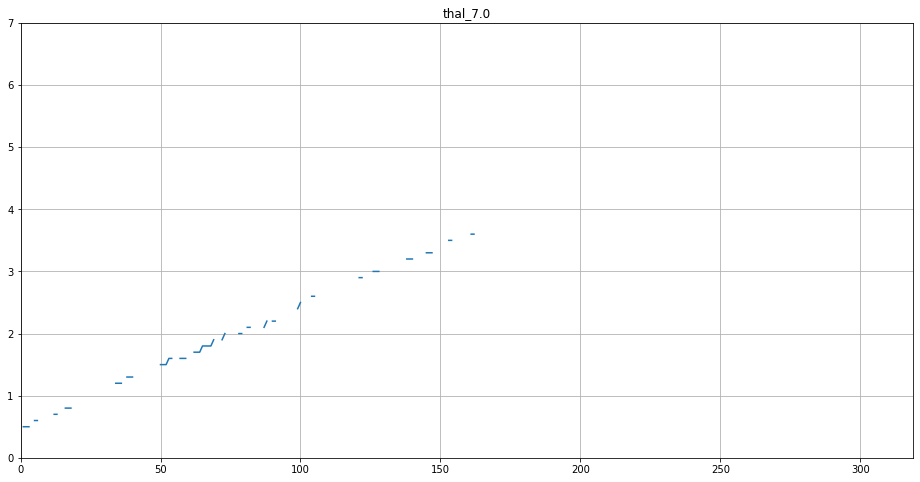

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

this may be enough or maybe one more. restecg_0.0 and trestbps both go to 3 but neither are great.

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features = ['sex','cp_4.0','ca_0.0','slope_1.0','thal_3.0','thalach','age']
    temp = hard_function(tau = tau, X = model1_group[features], y=model1_y, estimator = logistic_estimator)
    for feature in features:
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

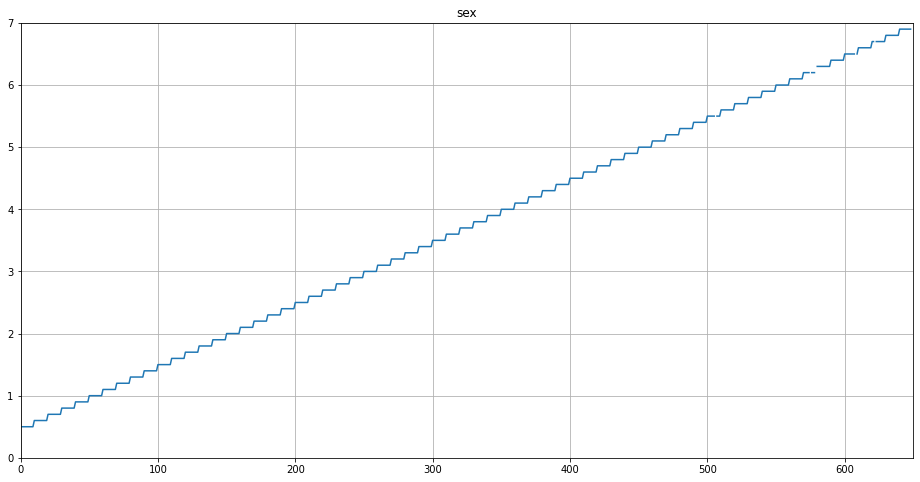

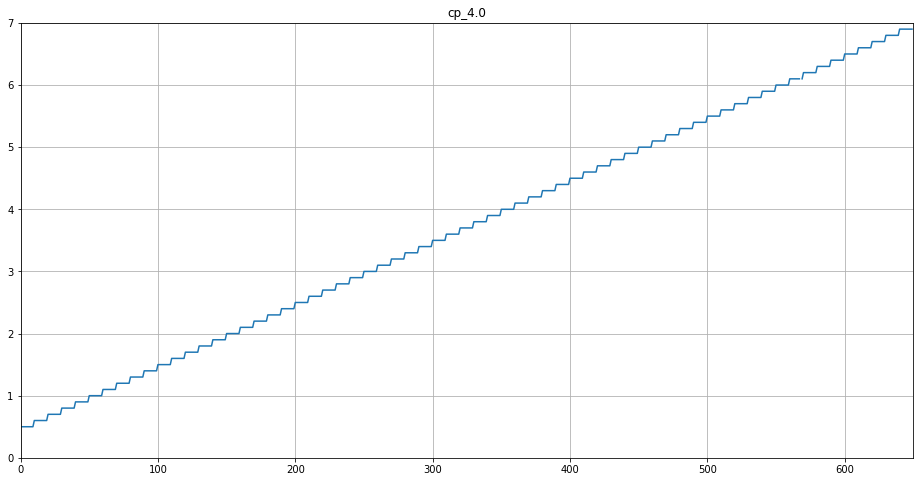

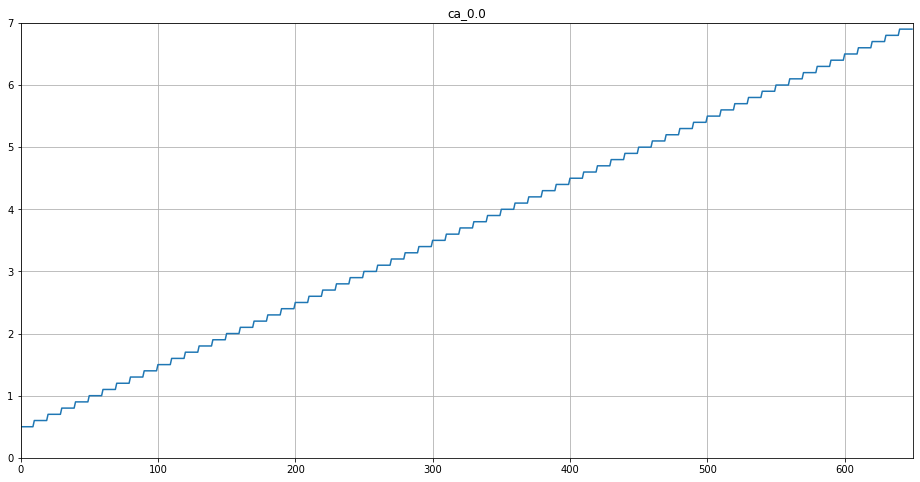

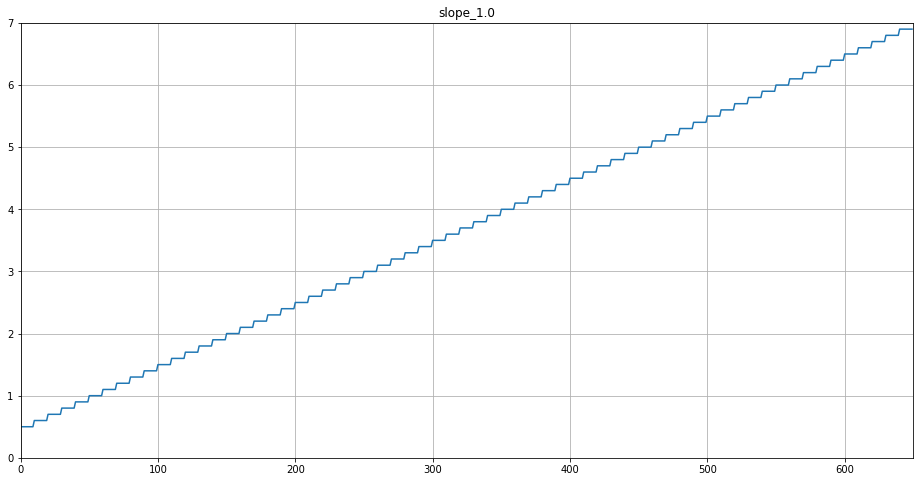

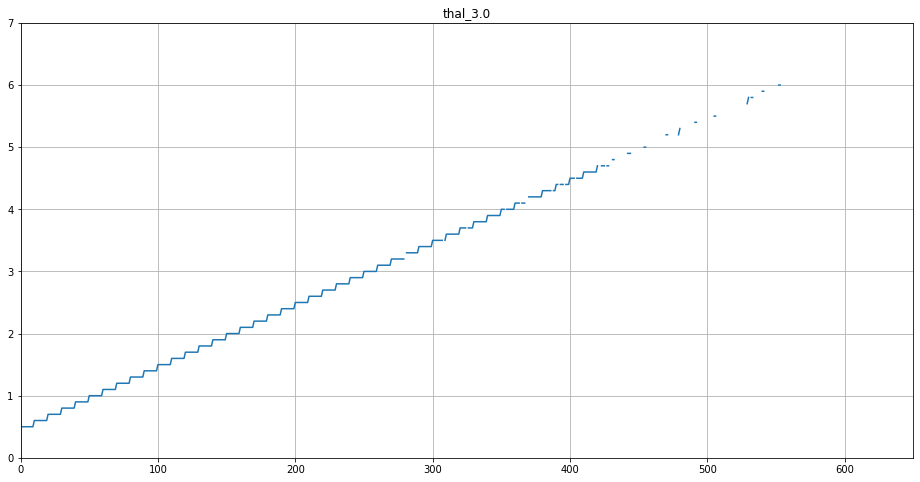

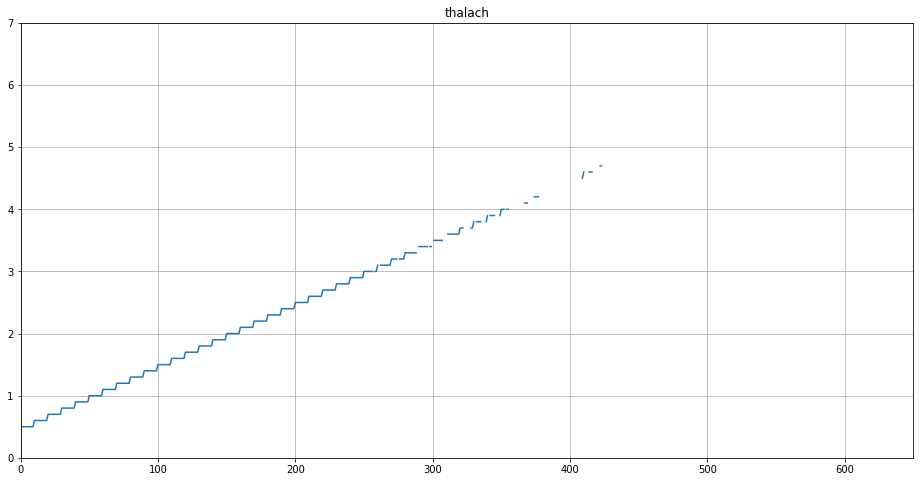

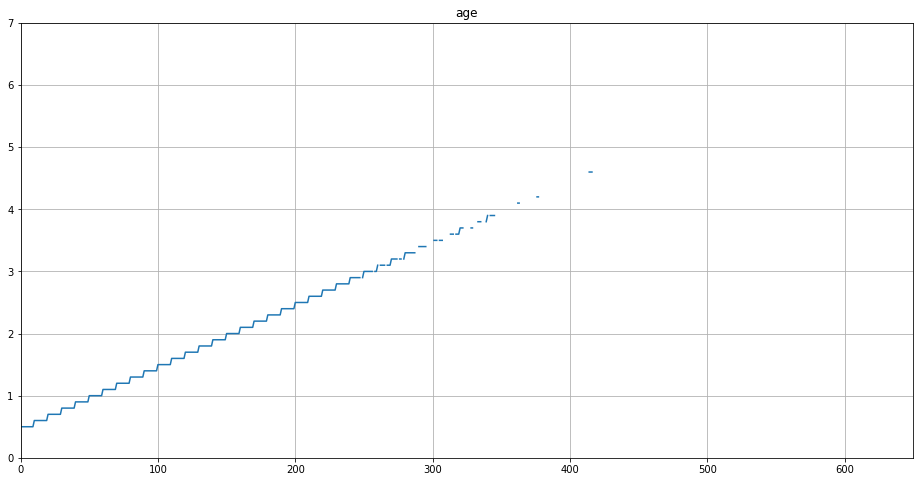

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

Let's look at thal_3.0 and thal_7.0

In [ ]:
import random
did_appear = {}
for tau in np.arange(0.5,7.0,0.1):
  for i in range(10):
    features_premade = ['sex','cp_4.0','ca_0.0','slope_1.0','thalach','age']
    #features = [feature for feature in model2_group.columns.drop(['exang','age','thal_7.0','ca_2.0','oldpeak','fbs','chol']) if random.random() > 0.5]
    features = ['thal_3.0','thal_7.0','thal_6.0']
    for feature in features:
      abc = np.append(features_premade,feature)
      temp = hard_function(tau = tau, X = model1_group[abc], y=model1_y, estimator = logistic_estimator)
      if feature in temp:
        if feature not in did_appear.keys():
          did_appear[feature] = [tau]
        else:
          did_appear[feature].append(tau)
      else:
        if feature not in did_appear.keys():
          did_appear[feature] = [None]
        else:
          did_appear[feature].append(None)

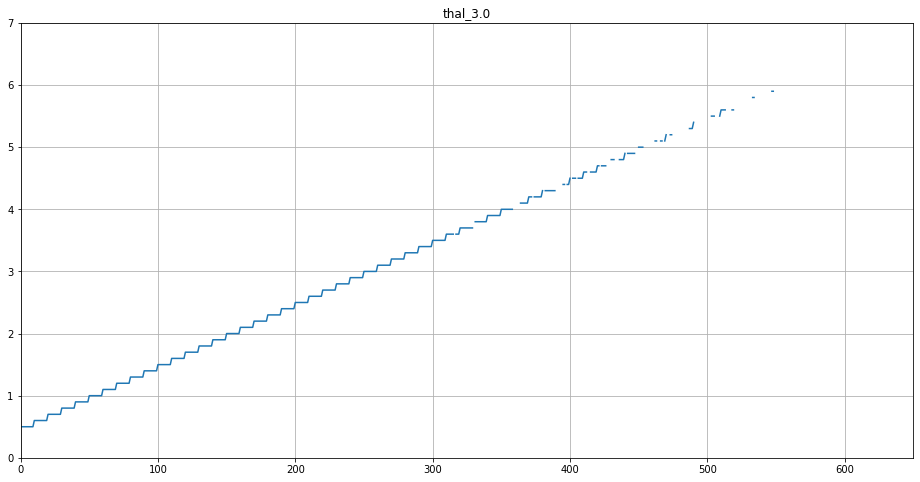

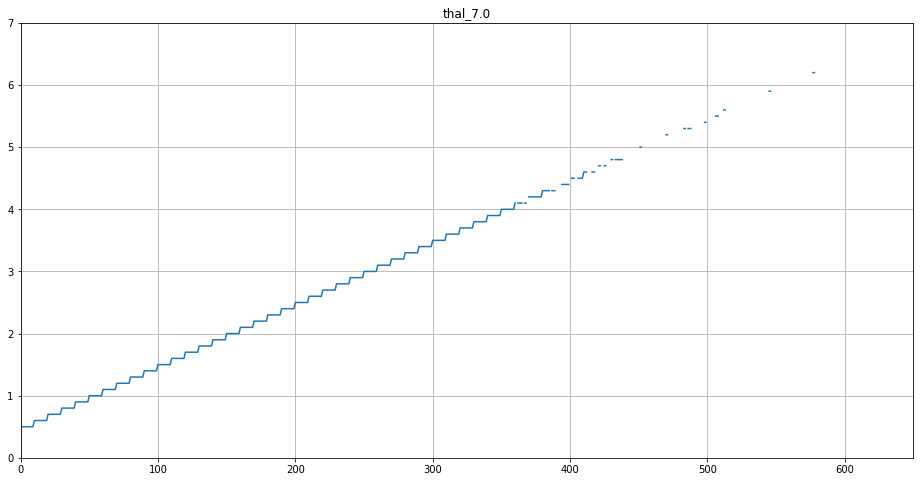

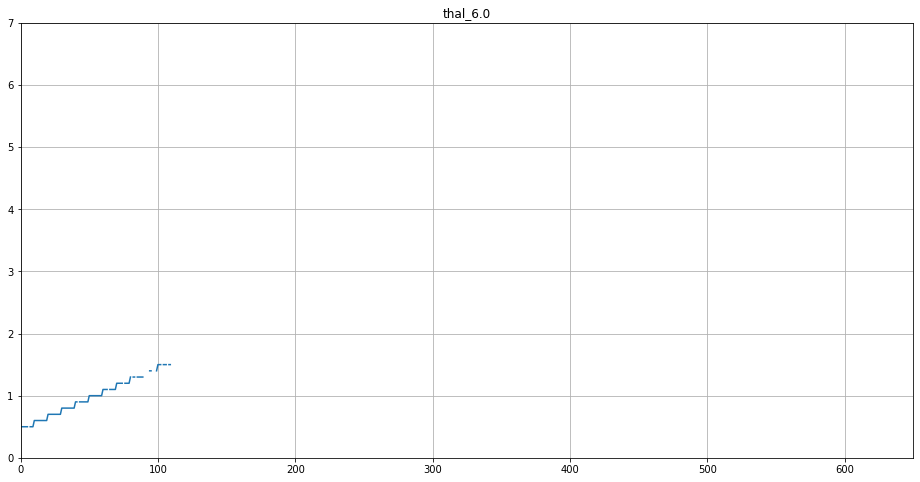

In [ ]:
for i in did_appear.keys():
  fig = plt.figure(i)
  plt.plot(np.arange(len(did_appear[i])),did_appear[i])
  plt.title(i)
  plt.xlim([0,len(did_appear[i])])
  plt.ylim([0,7])
  plt.grid()

thal_3.0 is better.

Accuracy (test)= 0.8462+-0.0263
Acuracy (train)= 0.8689+-0.001
Efron's R^2 (test)= 0.4142+-0.0742
Efron's R^2 (train)= 0.5804+-0.0019
Sensitivity (test) = 0.7667+-0.0479
Sensitivity (train) = 0.7905+-0.0461
Specificity (test) = 0.9047+-0.0284
Specificity (train) = 0.9242+-0.0256


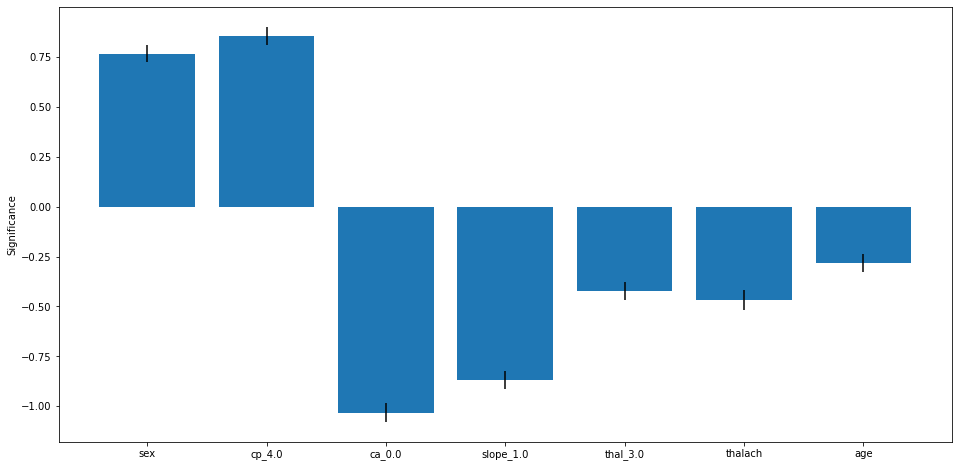

Accuracy (test)= 0.8298+-0.0275
Acuracy (train)= 0.847+-0.0013
Efron's R^2 (test)= 0.4312+-0.0711
Efron's R^2 (train)= 0.5755+-0.002
Sensitivity (test) = 0.7526+-0.0489
Sensitivity (train) = 0.7636+-0.0481
Specificity (test) = 0.886+-0.0307
Specificity (train) = 0.9056+-0.0283


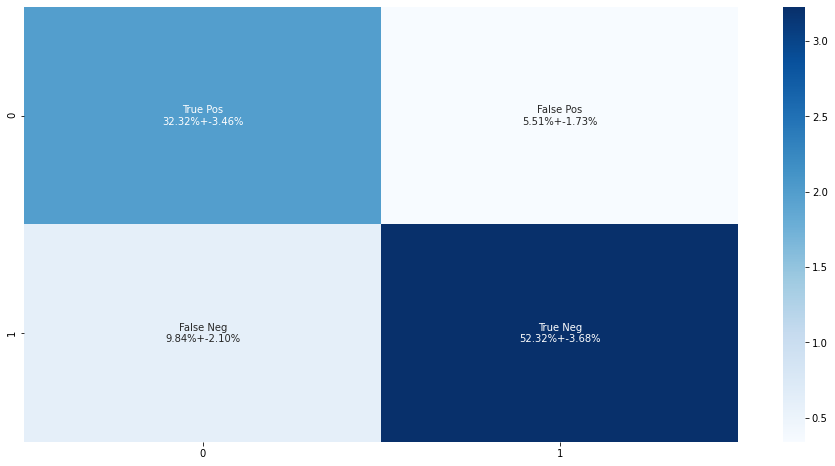

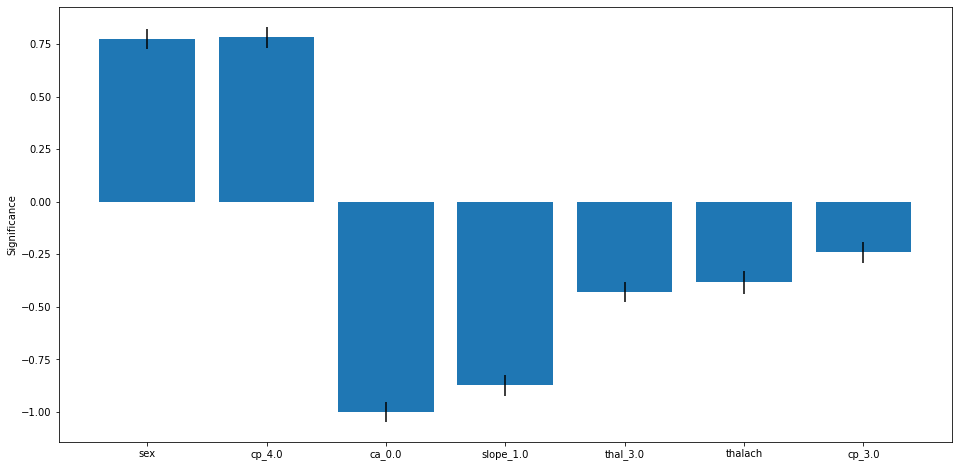

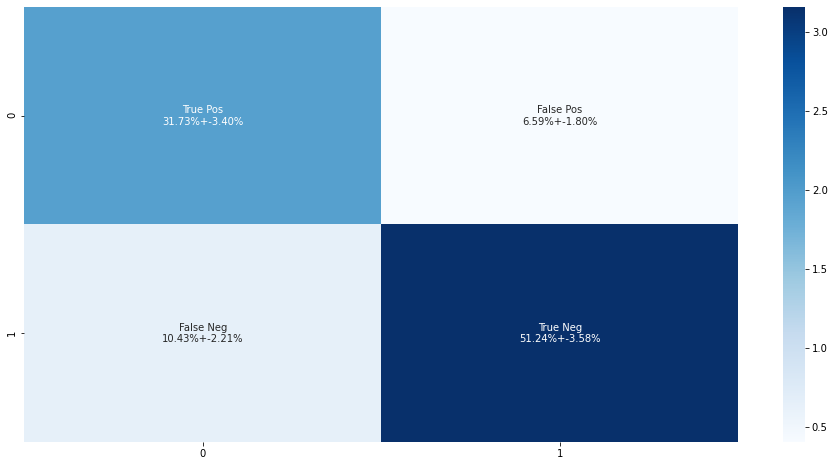

In [ ]:
features1 = ['sex','cp_4.0','ca_0.0','slope_1.0','thal_3.0','thalach','age']
features1_old = ['sex','cp_4.0','ca_0.0','slope_1.0','thal_3.0','thalach','cp_3.0']
loading_scores(model1_group[features1],model1_y,pad=True,estimator=logistic_estimator);
loading_scores(model1_group[features1_old],model1_y,pad=True,estimator=logistic_estimator);


We do a bit better using age! Let's see if trestbps or restecg_0.0 does anything.

Accuracy (test)= 0.8487+-0.0251
Acuracy (train)= 0.8791+-0.0013
Efron's R^2 (train)= 0.5934+-0.002
Sensitivity (test) = 0.7628+-0.0481
Sensitivity (train) = 0.8225+-0.0433
Specificity (test) = 0.9112+-0.0275
Specificity (train) = 0.9182+-0.0265


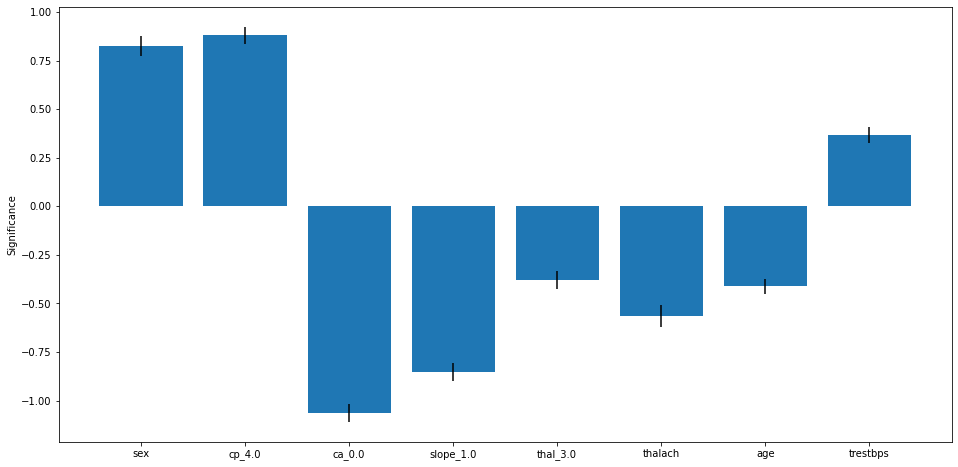

Accuracy (test)= 0.8533+-0.0249
Acuracy (train)= 0.8667+-0.0009
Efron's R^2 (train)= 0.5839+-0.002
Sensitivity (test) = 0.7808+-0.0468
Sensitivity (train) = 0.7885+-0.0462
Specificity (test) = 0.9075+-0.028
Specificity (train) = 0.9226+-0.0258


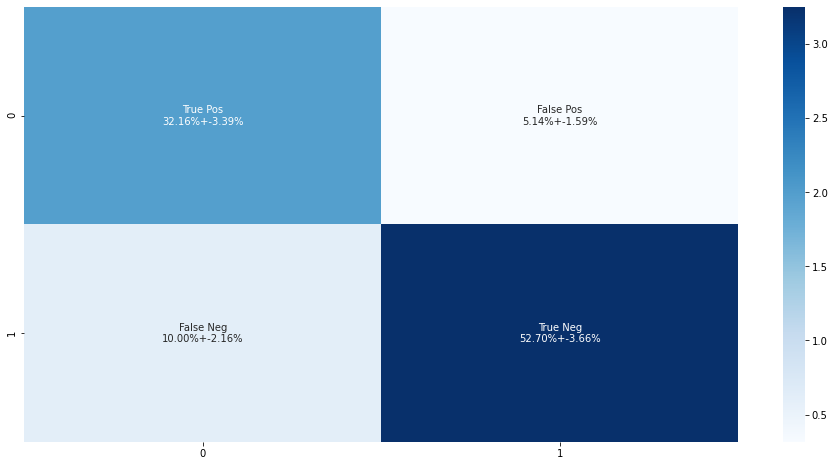

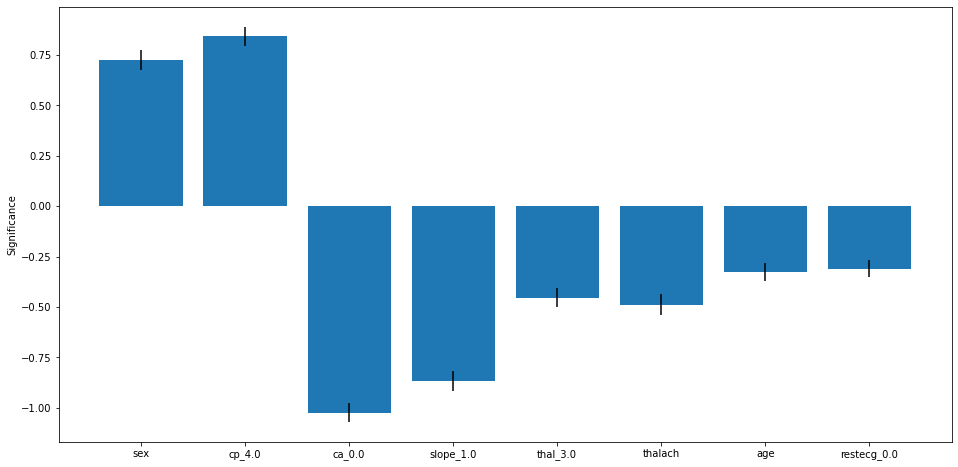

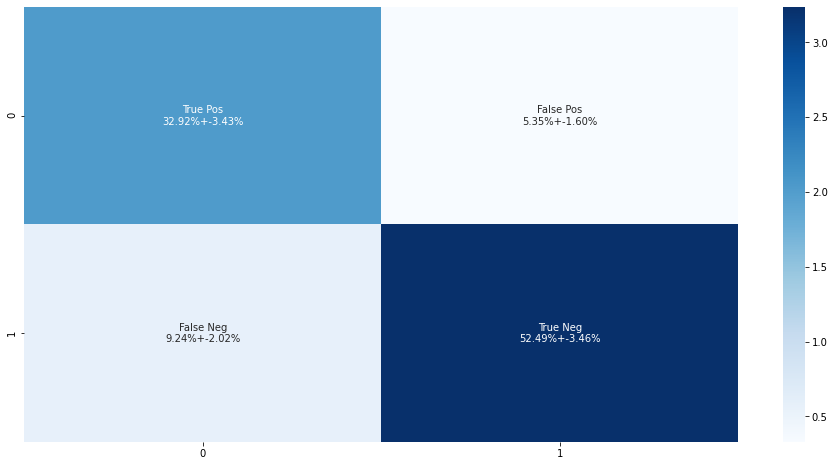

In [ ]:
features1_1 = ['sex','cp_4.0','ca_0.0','slope_1.0','thal_3.0','thalach','age','trestbps']
features1_2 = ['sex','cp_4.0','ca_0.0','slope_1.0','thal_3.0','thalach','age','restecg_0.0']
loading_scores(model1_group[features1_1],model1_y,pad=True,estimator=logistic_estimator);
loading_scores(model1_group[features1_2],model1_y,pad=True,estimator=logistic_estimator);


I want to see what the likelihood looks like.

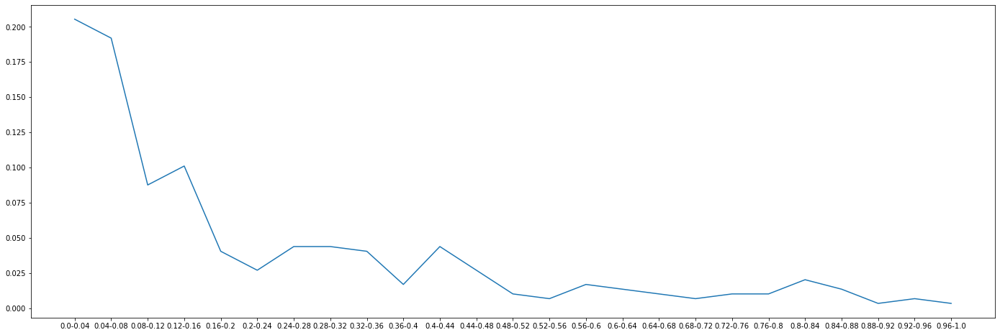

In [ ]:
def likelihood(first_model,y,y_low=0.0,y_high = 1.0, y_step = 0.04, flip = True):
  warnings.filterwarnings('ignore')
  
  delta_y = np.abs(y - first_model)

  temp = [len([delta for delta in delta_y if ((delta > i) & (delta < i + y_step))]) for i in np.arange(y_low,y_high,y_step)]

  temp = [i/len(y) for i in temp]

  fig1 = plt.figure(figsize=(24,8))

  plt.errorbar([np.str(round(i,2)) + "-" + np.str(round(i+y_step,2)) for i in np.arange(y_low,y_high,y_step)],temp)

  plt.show()
  warnings.resetwarnings()

likelihood(log_model1,y)

In [ ]:
min(log_model1)

0.006198970934418326

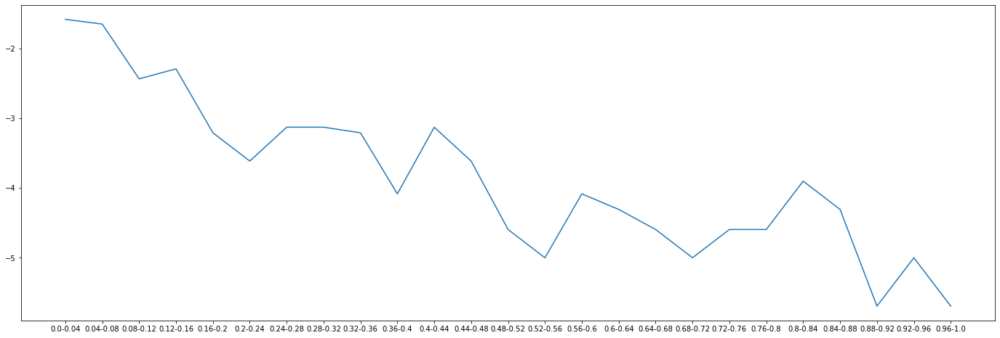

In [ ]:
def log_likelihood(first_model,y,y_low=0.0,y_high = 1.0, y_step = 0.04, flip = True):
  warnings.filterwarnings('ignore')
  
  delta_y = np.abs(y - first_model)

  temp = [len([delta for delta in delta_y if ((delta > i) & (delta < i + y_step))]) for i in np.arange(y_low,y_high,y_step)]

  temp = [i/len(y) for i in temp]

  temp = np.log(temp)

  fig1 = plt.figure(figsize=(24,8))

  plt.errorbar([np.str(round(i,2)) + "-" + np.str(round(i+y_step,2)) for i in np.arange(y_low,y_high,y_step)],temp)

  plt.show()
  warnings.resetwarnings()

log_likelihood(log_model1,y)

seems like log-likelihood = |delta_y| is good.

Apparently, -LL = C + 4*|delta_y|.

But since at every y_predicted, you can only get 2 different y's, it's really ```Likelihood = exp(|y-y_p|)/(exp(|y-y_p|)+exp(|(1-y)-y_p|))```

Laplace Function at two points.

-LL is still a ReLu function. ```L = 1/(1+exp(+-(1-2y_p)))```

Apparently, ```L = 1/(1+exp(+-4*(1-2y_p)))```

I want to know when that goes from 1/e to e.
```
4*(1-2y_p) = 1 -> (1-2y_p) = 1/4 -> 2y_p = 3/4 -> y_p = 3/8```

So between 3/8 and 5/8 it goes from 1/(1+1/e) to 1/(1+e). That's pretty sharp. And there are not a lot of people there.

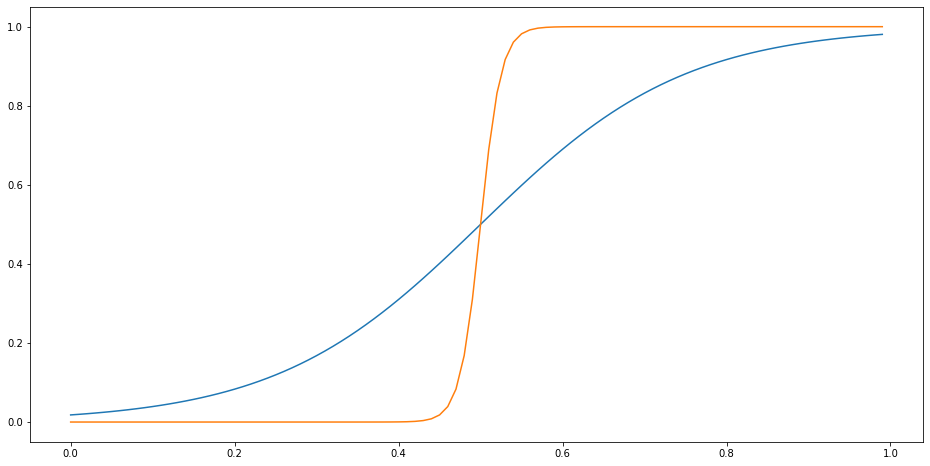

In [41]:
plt.figure()
xx = np.arange(0.0,1.0,0.01)
ff = [1/(1+np.exp(4*(1-2*x))) for x in xx]
gg = [1/(1+np.exp(40*(1-2*x))) for x in xx]
plt.plot(xx,ff)
plt.plot(xx,gg)


In [ ]:
weights = np.zeros(X.shape[1])
eps = 1e-15

def wTx(w, x):
   return np.dot(x, w)

def sigmoid(z):
   return 1./(1+np.exp(-z))

def logistic_predictions(w, x):
   predictions = sigmoid(wTx(w, x))
   return predictions.clip(eps, 1-eps)

def custom_loss(y, y_predicted):
    return (np.abs(y-y_predicted)).mean()

def custom_loss_given_weights(w):
    y_predicted = logistic_predictions(w, X)
    return custom_loss(y, y_predicted)

gradient = grad(custom_loss_given_weights)

for i in range(10000):
    weights -= gradient(weights) * .01

[109.1615117085956, 37.422158122733244, 5.9848429995236705, 3.5134996018185607, 14.080301480274239, 4.818841679306418, 1.7937446542303992, 0.3119867826180481, 0.29624833937874767, 0.13864688385321386, 0.05360536964281388, 0.2346537226633237, 0.03724768711747582, 0.005036496820043036]
[244.25088618758647, 20.982210269675555, 8.883620829043458, 4.854175452310452, 2.9517790955473173, 1.8953163177487216, 1.250704204251671, 0.8330206472590744, 0.5514352499459119, 0.3567526768565912, 0.22038576207088134, 0.124880753493326, 0.05933951198479718, 0.017597647743211275]


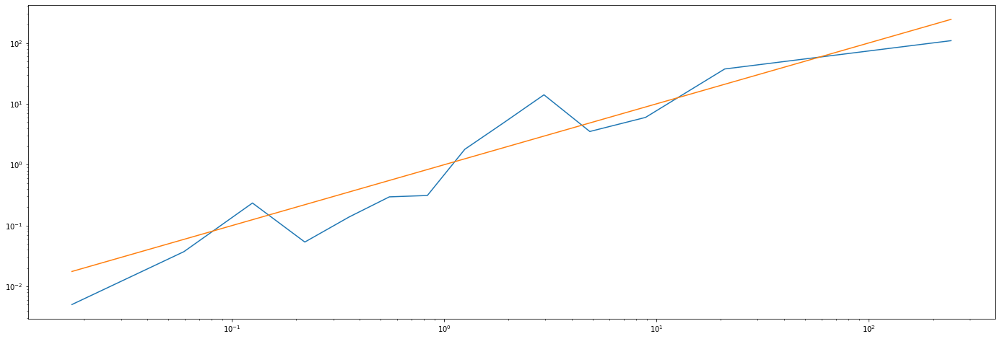

In [ ]:
def log_odds_ratio_plot(first_model,y,y_low=0.01,y_high = 0.99, y_step = 0.07):
  warnings.filterwarnings('ignore')
  y_high = min(y_high,1-(1-y_low)%y_step-0.001)

  temp = [np.average(y[(first_model > i) & (first_model < i + y_step)]) for i in np.arange(y_low,y_high,y_step)]

  abc = [np.log(yy)/np.log(1-yy) for yy in temp]

  xx = [(np.log(i)/np.log(1-i) + np.log(i+y_step)/np.log(1-i-y_step))/2 for i in np.arange(y_low,y_high,y_step)]

  fig1 = plt.figure(figsize=(24,8))

  plt.loglog(xx,abc)
  plt.loglog(xx,xx)

  plt.show()

log_odds_ratio_plot(log_model1,y)


It's not too bad. I thought that it would be different from a straight line.

In [ ]:
sorted(log_model1)

[0.006198970934418326,
 0.008256728595869853,
 0.009117741174995279,
 0.010674924296350353,
 0.010759246055432993,
 0.012778534193607836,
 0.01328760734306374,
 0.015531628212125172,
 0.015990663956566845,
 0.01711947074538551,
 0.01742081220761023,
 0.017882617591838443,
 0.018591198761618046,
 0.018791353867067054,
 0.02497834764162953,
 0.025460290302330765,
 0.02672451892643388,
 0.027602733529422538,
 0.02793884064834571,
 0.03027379289667652,
 0.030279235737922038,
 0.031469098654798314,
 0.03397343040468552,
 0.03495815740244618,
 0.03509570033453299,
 0.03611174056259967,
 0.037353056722092964,
 0.038093632737752105,
 0.03831109868092165,
 0.039570788592294785,
 0.03992867814452421,
 0.040329814467235305,
 0.041490869427065966,
 0.041490869427065966,
 0.04285805737124172,
 0.04392515616103209,
 0.04411167512469944,
 0.04472974681440713,
 0.04541435903583429,
 0.04604639281029975,
 0.04646223270996253,
 0.04709756394617873,
 0.04826489700925574,
 0.04871717906710662,
 0.04962247

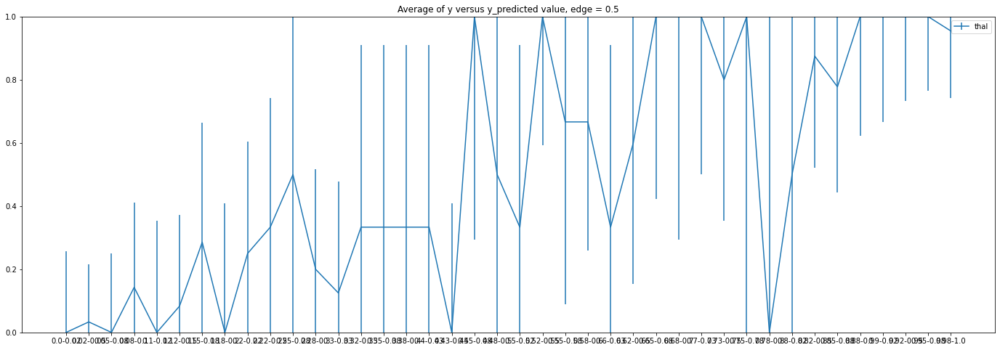

In [ ]:
confidence_plot(y,log_model1 = log_model1,y_low = 0.0, y_high = 1.0, y_step = 0.025,flip=False)

log_model1


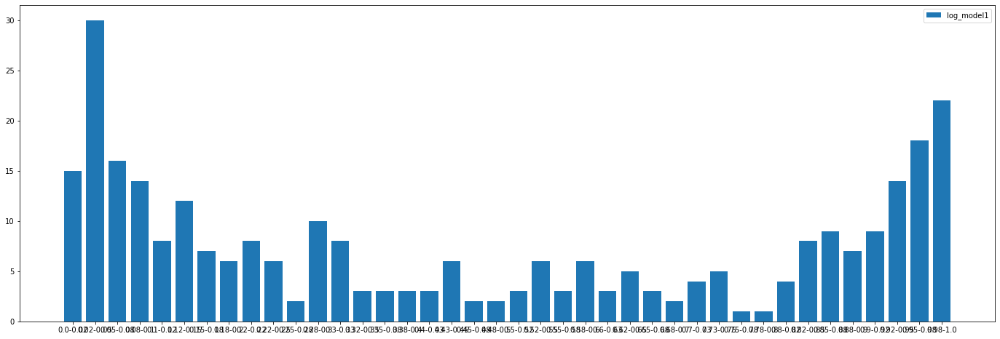

In [ ]:
population_y_predicted(y_low=0.0,y_high=1.0,y_step=0.025,log_model1=log_model1)